In [300]:
import sys
import os
from typing import Any, Dict, Optional, Tuple


import pickle
import pandas as pd
import numpy as np

In [301]:
def compute_self_consumption_and_autarky(df: pd.DataFrame) -> tuple:
    # Direct PV usage (excluding curtailment and grid export)
    pv_direct_cols = ['E_PV_bu', 'E_PV_budhw', 'E_PV_hp', 'E_PV_hpdhw', 'E_PV_load']
    ev_pv_cols = [col for col in df.columns if col.startswith('E_PV_batt_EV_')]
    pv_batt_col = 'E_PV_batt'  # PV to battery (base)
    
    # PV used locally includes direct use + PV to batteries (including EVs)
    pv_used_locally_cols = pv_direct_cols + [pv_batt_col] + ev_pv_cols
    
    # Battery discharges to local uses (assumed to be supplied to final consumption)
    batt_discharge_cols = ['E_batt_bu', 'E_batt_budhw', 'E_batt_hp', 'E_batt_hpdhw', 'E_batt_load']
    ev_batt_discharge_cols = [col for col in df.columns if col.startswith('E_batt_EV_load_EV_')]

    # Autarky counts direct PV use + energy discharged from battery to loads
    local_supply_cols = pv_direct_cols + batt_discharge_cols + ev_batt_discharge_cols

    # Aggregate totals
    pv_used_locally = df[pv_used_locally_cols].sum().sum()
    pv_total = df['E_PV'].sum()
    local_supply = df[local_supply_cols].sum().sum()
    
    ev_grid_cols = [col for col in df.columns if col.startswith('E_grid_batt_EV')]
    total_consumption = df['E_demand'].sum()+  df['E_hp'].sum()+ df['E_hpdhw'].sum()+df['E_bu'].sum()+df['E_budhw'].sum()+df['E_grid_batt'].sum()+df[ev_grid_cols].sum().sum()

    # Final metrics
    self_consumption = (pv_used_locally / pv_total) * 100 if pv_total > 0 else 0
    autarky = (local_supply / total_consumption) * 100 if total_consumption > 0 else 0

    return self_consumption, autarky


In [373]:
import math
def print_energy_summary(df):
    """
    Computes and prints key energy metrics with 2 significant digits.
    """
     # 1) Self-consumption & autarky
    self_consumption, autarky = compute_self_consumption_and_autarky(df)

    # 2) Gather metrics in a dict
    metrics = {
        "Self-consumption":              self_consumption,
        "Autarky":                       autarky,
        "Total PV generation":           df.E_PV.sum(),

        "Total E_cons (grid import)":    df.E_cons.sum(),
        "Total household demand":        df.E_demand.sum(),

        "Peak E_cons (max hour)":        df.E_cons.max(),
        "99th-percentile E_cons":        df.E_cons.quantile(0.99),
        "Peak E_demand (max hour)":        df.E_demand.max(),
        "99th-percentile E_demand":        df.E_demand.quantile(0.99),

        "Change Peak (max hour) [%]":        df.E_cons.max()/df.E_demand.max()*100,
        "Change 99th-percentile Peak [%]":        df.E_cons.quantile(0.99)/df.E_demand.quantile(0.99)*100,
        "Peak PV injection (max hour)":           df.E_PV_grid.max(),
        "99th-percentile PV injection":           df.E_PV_grid.quantile(0.99),
        "Total HP load (space heat)":    df.E_hp.sum(),
        "Total HP load (DHW)":           df.E_hpdhw.sum(),
        "Req_kWh (space heat)":          df.Req_kWh.sum(),
        "Req_kWh_DHW (DHW)":             df.Req_kWh_DHW.sum(),
    }

    # 3) DHW share of total thermal requirement
    req_space = metrics["Req_kWh (space heat)"]
    req_dhw   = metrics["Req_kWh_DHW (DHW)"]
    total_thermal = req_space + req_dhw
    dhw_share = req_dhw / total_thermal if total_thermal > 0 else 0
    metrics["DHW share of thermal demand"] = dhw_share

    # 4) Print each with two decimal places
    for name, val in metrics.items():
        print(f"{name}: {val:.2f}")
    
    # 5) Detect any per-EV grid battery consumption columns
    ev_grid_cols = [col for col in df.columns if col.startswith('E_grid_batt_EV')]
    if ev_grid_cols:
        print("\nPer-EV grid-to-battery consumption totals:")
        for col in ev_grid_cols:
            total = df[col].sum()
            print(f"{col}: {total:.2f}")


In [378]:
import matplotlib.pyplot as plt

def plot_energy_and_temp(df):
    """
    Creates a 2x2 figure with:
    - top-left: E_cons and E_demand
    - top-right: E_hp and E_hpdhw
    - bottom-left: E_bu and E_budhw
    - bottom-right: T_dhwst-273.15 and T_ts-273.15
    """
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    # Top-left: consumption vs demand
    axes[0, 0].plot(df.index, df['E_cons'], label='E_cons')
    axes[0, 0].plot(df.index, df['E_demand'], label='E_demand')
    axes[0, 0].plot(df.index, -df['E_PV_grid'], label='Injection')
    axes[0, 0].set_title('Grid Consumption vs Demand')
    axes[0, 0].legend()
    
    # Top-right: heat pump loads
    axes[0, 1].plot(df.index, df['E_hp'], label='E_hp',alpha=0.5)
    axes[0, 1].plot(df.index, df['E_hpdhw'], label='E_hpdhw',alpha=0.5)
    axes[0, 1].set_title('Heat Pump Loads')
    axes[0, 1].legend()
    
    # Bottom-left: building loads
    axes[1, 0].plot(df.index, df['E_bu'], label='E_bu')
    axes[1, 0].plot(df.index, df['E_budhw'], label='E_budhw')
    axes[1, 0].set_title('Building Loads')
    axes[1, 0].legend()
    
    # Bottom-right: temperatures
    axes[1, 1].plot(df.index, df['T_dhwst'] - 273.15, label='T_dhwst (°C)')
    axes[1, 1].plot(df.index, df['T_ts'] - 273.15, label='T_ts (°C)')
    axes[1, 1].set_title('Temperatures (°C)')
    axes[1, 1].legend()
    
    fig.tight_layout()
    plt.show()

# Usage:
# plot_energy_and_temp(df)


In [417]:
df=pd.read_csv(r'C:\Users\alejandr.penabell\OneDrive - HESSO\OpenBEERS\Paper1_last\outputs_basopra\\sierre_saint_georges_climate_contemporary_pv_roof_2025\df_65_192083767_HP+SH+DHW.csv')

In [418]:
print_energy_summary(df)

Self-consumption: 0.00
Autarky: 0.00
Total PV generation: 0.00
Total E_cons (grid import): 235465.32
Total household demand: 136907.48
Peak E_cons (max hour): 79.57
99th-percentile E_cons: 63.12
Peak E_demand (max hour): 38.38
99th-percentile E_demand: 38.38
Change Peak (max hour) [%]: 207.32
Change 99th-percentile Peak [%]: 164.45
Peak PV injection (max hour): 0.00
99th-percentile PV injection: 0.00
Total HP load (space heat): 23196.76
Total HP load (DHW): 64275.34
Req_kWh (space heat): 129480.86
Req_kWh_DHW (DHW): 142080.81
DHW share of thermal demand: 0.52

Per-EV grid-to-battery consumption totals:
E_grid_batt_EV_EV1: 3678.39
E_grid_batt_EV_EV2: 3678.39
E_grid_batt_EV_EV3: 3678.39


In [424]:
df.Q_ts_sh.sum()

np.float64(62617.12049078925)

<Axes: >

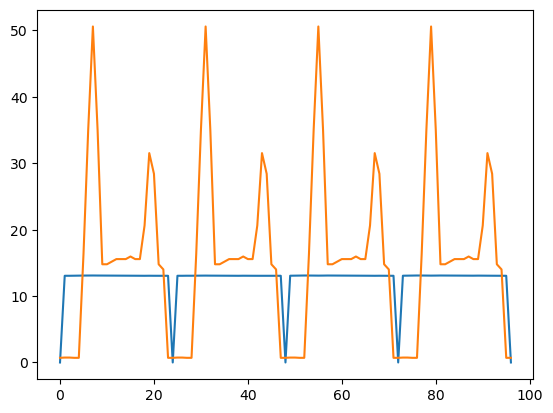

In [ ]:
df.loc[:96,'Q_loss_dhwst'].plot()
df.loc[:96,'Q_dhwst_hd'].plot()



<Axes: >

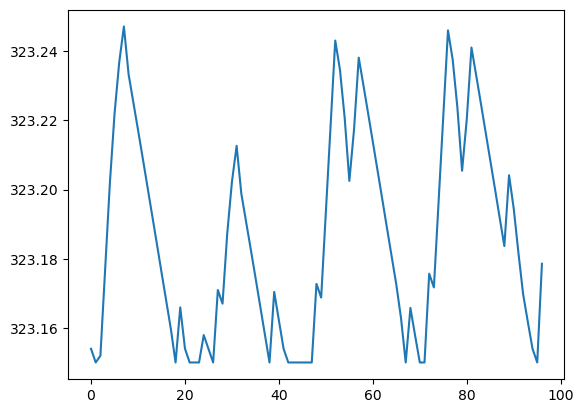

In [428]:
df.loc[:96,'T_dhwst'].plot()

In [420]:
df.Q_dhwst_hd.sum()

np.float64(142080.81250000003)

In [422]:
df.Req_kWh_DHW.sum()

np.float64(142080.81250000003)

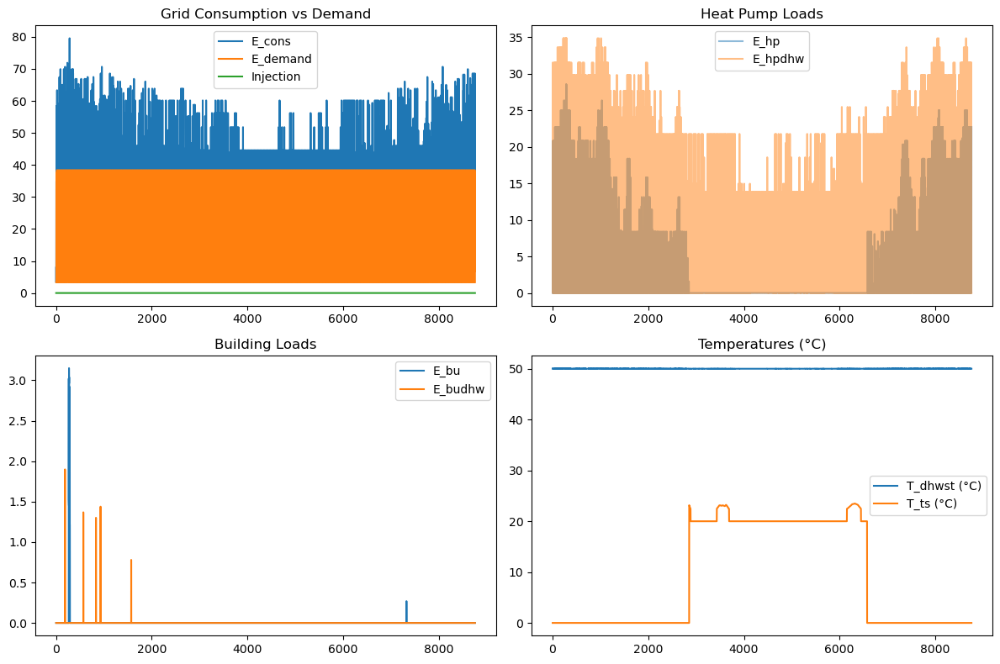

In [416]:
plot_energy_and_temp(df)

In [392]:
df=pd.read_csv('../monthlykpi.csv')
df2=pd.read_csv('../yearlykpi.csv')

In [394]:
df2.head()

,Unnamed: 0,autoconsumption,autarky,peak_consumption,peak_injection,peak_thermal_consumption,quantile99_consumption,quantile99_injection,quantile99_thermal_consumption,simulation,building,configuration
0,0,0.000000,8.120602e-14,54.849600,0.000000,58.231500,24.958000,0.000000,45.666756,sierre_saint_georges_climate_contemporary_pv_r...,1,191361250
1,1,0.000000,0.000000e+00,23.993222,0.000000,21.056750,23.993222,0.000000,21.056750,sierre_saint_georges_climate_contemporary_pv_r...,10,948432
2,2,0.000000,0.000000e+00,11.592000,0.000000,15.283125,11.592000,0.000000,15.283125,sierre_saint_georges_climate_contemporary_pv_r...,100,947844
3,3,37.892045,6.526423e+01,7.966000,10.134657,1.698125,5.518374,8.295965,1.698125,sierre_saint_georges_climate_contemporary_pv_r...,101,947826
4,4,0.000000,0.000000e+00,8.066000,0.000000,2.037750,8.066000,0.000000,2.037750,sierre_saint_georges_climate_contemporary_pv_r...,102,191503194


In [395]:
df2.max()

Unnamed: 0                                                                      152
autoconsumption                                                           93.134626
autarky                                                                   82.055702
peak_consumption                                                        3758.157314
peak_injection                                                           130.140618
peak_thermal_consumption                                                 239.435625
quantile99_consumption                                                  1366.497063
quantile99_injection                                                      93.408998
quantile99_thermal_consumption                                           239.435625
simulation                        val_de_bagnes_41_climate_contemporary_pv_roof_...
building                                                                  190183183
configuration                                                               

In [396]:
df.max()

Unnamed: 0                                                                     1835
autoconsumption                                                           95.386214
autarky                                                                   95.122208
peak_consumption                                                        3758.157314
peak_injection                                                           130.140618
peak_thermal_consumption                                                 239.435625
quantile99_consumption                                                  2732.636644
quantile99_injection                                                     102.193778
quantile99_thermal_consumption                                           239.435625
month                                                                            12
simulation                        val_de_bagnes_41_climate_contemporary_pv_roof_...
building                                                                  19

<Axes: >

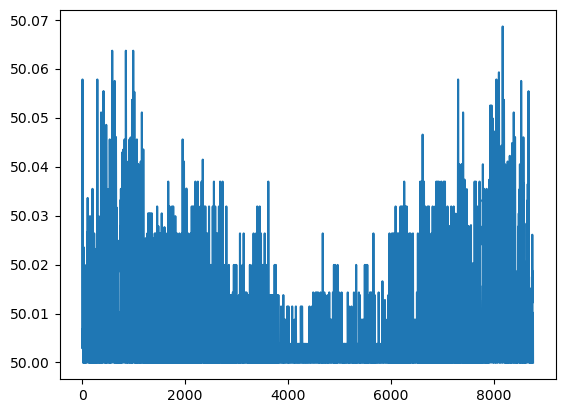

In [268]:
(df.T_dhwst-273.15).plot()

<Axes: >

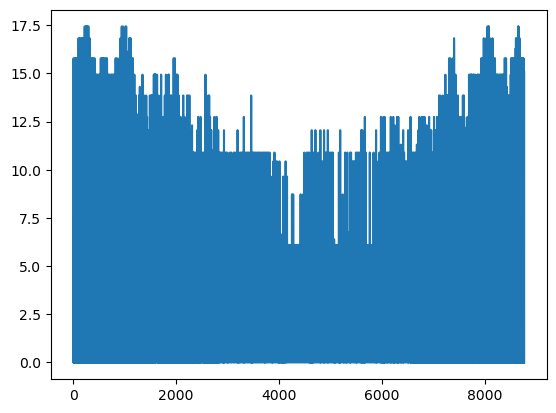

In [269]:
df.E_hpdhw.plot()


<Axes: >

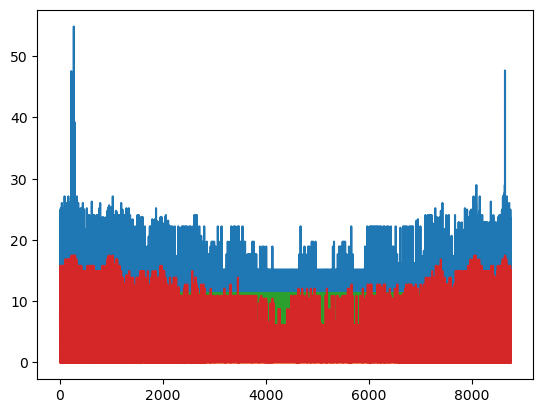

In [270]:
df.E_cons.plot()
df.E_hp.plot()
df.E_demand.plot()

df.E_hpdhw.plot()


<Axes: >

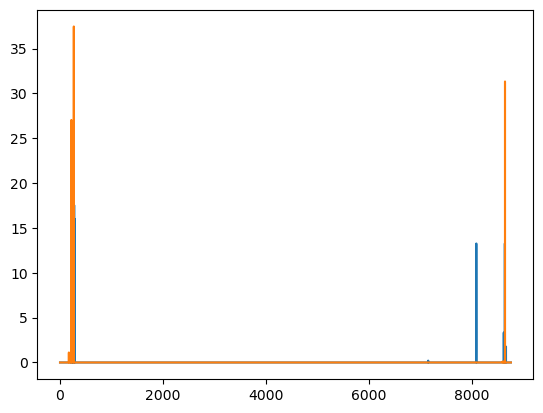

In [271]:

df.E_budhw.plot()
df.E_bu.plot()

In [87]:
b

np.float64(0.956700096436767)

In [13]:
df.columns

Index(['index', 'Bool_char', 'Bool_cons', 'Bool_dis', 'Bool_hp', 'Bool_hpdhw',
       'Bool_inj', 'E_PV_batt', 'E_PV_bu', 'E_PV_budhw',
       ...
       'COP_DHW', 'EV1_EV_home', 'EV1_EV_away', 'EV1_E_EV_trip', 'EV2_EV_home',
       'EV2_EV_away', 'EV2_E_EV_trip', 'EV3_EV_home', 'EV3_EV_away',
       'EV3_E_EV_trip'],
      dtype='object', length=108)

In [53]:
df.E_hp.sum()

np.float64(4383.52739283181)

In [200]:
df.E_PV_curt.sum()

np.float64(0.0)

In [55]:
df.columns

Index(['index', 'Bool_char', 'Bool_cons', 'Bool_dis', 'Bool_hp', 'Bool_hpdhw',
       'Bool_inj', 'E_PV_batt', 'E_PV_bu', 'E_PV_budhw', 'E_PV_curt',
       'E_PV_grid', 'E_PV_hp', 'E_PV_hpdhw', 'E_PV_load', 'E_batt_bu',
       'E_batt_budhw', 'E_batt_hp', 'E_batt_hpdhw', 'E_batt_load', 'E_bu',
       'E_budhw', 'E_char', 'E_cons', 'E_dis', 'E_grid_batt', 'E_grid_bu',
       'E_grid_budhw', 'E_grid_hp', 'E_grid_hpdhw', 'E_grid_load', 'E_hp',
       'E_hpdhw', 'E_loss_Batt', 'E_loss_conv', 'E_loss_inv', 'E_loss_inv_PV',
       'E_loss_inv_batt', 'E_loss_inv_grid', 'Q_dhwst_hd', 'Q_hp_sh',
       'Q_hp_ts', 'Q_loss_dhwst', 'Q_loss_ts', 'Q_ts', 'Q_ts_delta', 'Q_ts_sh',
       'SOC', 'T_dhwst', 'T_ts', 'Bool_char_EV_EV1', 'Bool_dis_EV_EV1',
       'E_PV_batt_EV_EV1', 'E_batt_EV_grid_EV1', 'E_batt_EV_load_EV1',
       'E_char_EV_EV1', 'E_char_away_EV1', 'E_dis_EV_EV1',
       'E_grid_batt_EV_EV1', 'E_loss_Batt_EV_EV1', 'SOC_EV_EV1', 'E_demand',
       'E_PV', 'Export_price', 'price', 'Inv_P'

In [56]:
df.E_batt_EV_grid_EV1.sum()

np.float64(0.0)

In [57]:
df.E_PV.sum()-(df.E_PV_load+df.E_PV_batt+df.E_PV_hp+df.E_PV_grid+df.E_loss_conv+df.E_loss_inv_PV+df.E_PV_curt).sum()

np.float64(3754.328519589797)

In [58]:
df.E_PV_curt.sum()

np.float64(0.0)

In [59]:
df.E_PV_grid.sum()

np.float64(4691.217064896899)

In [60]:
df.E_PV.sum()-(df.E_PV_hp+df.E_PV_budhw+df.E_PV_bu+df.E_PV_load+df.E_PV_batt+df.E_PV_grid+df.E_loss_conv+df.E_loss_inv_PV+df.E_PV_curt).sum()

np.float64(3754.328519589797)

In [61]:
df.E_hp.sum()

np.float64(4383.52739283181)

In [165]:
df.E_hpdhw.sum()

np.float64(21095.79798032807)

In [63]:
from types import SimpleNamespace

# Create dummy model with required attributes
m = SimpleNamespace()
m.Time = [0, 1, 2]
m.EVs = ['EV1', 'EV2']
m.retail_price = {0: 10, 1: 12, 2: 11}
m.E_cons = {0: 5, 1: 3, 2: 4}
m.public_charging_price = 7
m.E_char_away = {(ev, i): 2 for ev in m.EVs for i in m.Time}
m.export_price = {0: 100, 1: 100, 2: 100}
m.E_PV_grid = {0: 1, 1: 2, 2: 3}

# Compute cost_rev
cost_rev = sum(
    (m.retail_price[i] * m.E_cons[i])
    + sum(m.E_char_away[(ev, i)] * m.public_charging_price for ev in m.EVs)
    - (m.export_price[i] * m.E_PV_grid[i])
    for i in m.Time
)

print("Computed cost_rev:", cost_rev)


Computed cost_rev: -386


In [64]:
df.columns

Index(['index', 'Bool_char', 'Bool_cons', 'Bool_dis', 'Bool_hp', 'Bool_hpdhw',
       'Bool_inj', 'E_PV_batt', 'E_PV_bu', 'E_PV_budhw', 'E_PV_curt',
       'E_PV_grid', 'E_PV_hp', 'E_PV_hpdhw', 'E_PV_load', 'E_batt_bu',
       'E_batt_budhw', 'E_batt_hp', 'E_batt_hpdhw', 'E_batt_load', 'E_bu',
       'E_budhw', 'E_char', 'E_cons', 'E_dis', 'E_grid_batt', 'E_grid_bu',
       'E_grid_budhw', 'E_grid_hp', 'E_grid_hpdhw', 'E_grid_load', 'E_hp',
       'E_hpdhw', 'E_loss_Batt', 'E_loss_conv', 'E_loss_inv', 'E_loss_inv_PV',
       'E_loss_inv_batt', 'E_loss_inv_grid', 'Q_dhwst_hd', 'Q_hp_sh',
       'Q_hp_ts', 'Q_loss_dhwst', 'Q_loss_ts', 'Q_ts', 'Q_ts_delta', 'Q_ts_sh',
       'SOC', 'T_dhwst', 'T_ts', 'Bool_char_EV_EV1', 'Bool_dis_EV_EV1',
       'E_PV_batt_EV_EV1', 'E_batt_EV_grid_EV1', 'E_batt_EV_load_EV1',
       'E_char_EV_EV1', 'E_char_away_EV1', 'E_dis_EV_EV1',
       'E_grid_batt_EV_EV1', 'E_loss_Batt_EV_EV1', 'SOC_EV_EV1', 'E_demand',
       'E_PV', 'Export_price', 'price', 'Inv_P'

<Axes: >

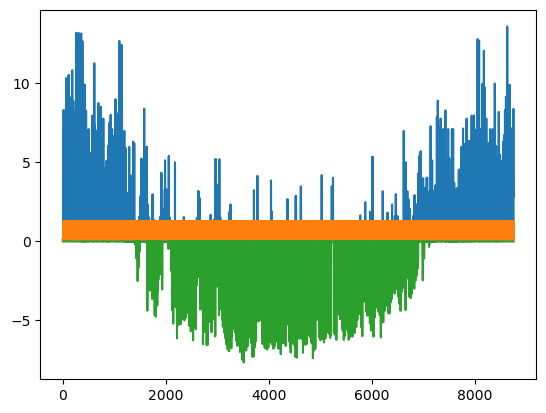

In [65]:

df.E_cons.plot()

df.E_demand.plot()

#(-df.E_PV_curt).plot()
(-df.E_PV_grid).plot()

<Axes: >

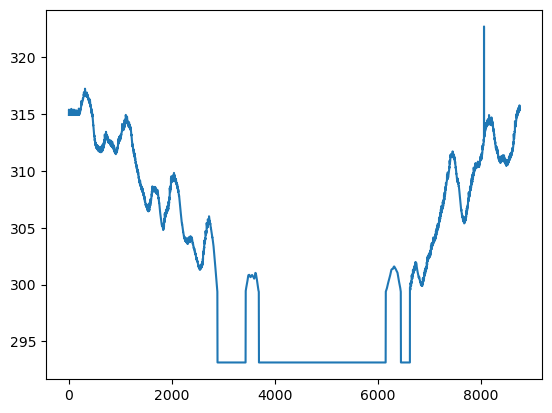

In [66]:
df.T_ts.plot()

In [67]:
df.head()

,index,Bool_char,Bool_cons,Bool_dis,Bool_hp,Bool_hpdhw,Bool_inj,E_PV_batt,E_PV_bu,E_PV_budhw,...,Temp,Temp_supply,Temp_supply_tank,T_aux_supply,COP_tank,COP_SH,COP_DHW,EV1_EV_home,EV1_EV_away,EV1_E_EV_trip
0,2025-01-01 00:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,270.45,314.917787,318.599581,324.917787,1.95,2.17,1.7,1.0,0.0,0.0
1,2025-01-01 01:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,270.55,314.917787,318.599581,324.917787,1.95,2.17,1.7,1.0,0.0,0.0
2,2025-01-01 02:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,270.25,314.917787,318.599581,324.917787,1.95,2.17,1.7,1.0,0.0,0.0
3,2025-01-01 03:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,270.35,314.917787,318.599581,324.917787,1.95,2.17,1.7,1.0,0.0,0.0
4,2025-01-01 04:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,270.15,314.917787,318.599581,324.917787,1.95,2.17,1.7,1.0,0.0,0.0


In [68]:
df.columns

Index(['index', 'Bool_char', 'Bool_cons', 'Bool_dis', 'Bool_hp', 'Bool_hpdhw',
       'Bool_inj', 'E_PV_batt', 'E_PV_bu', 'E_PV_budhw', 'E_PV_curt',
       'E_PV_grid', 'E_PV_hp', 'E_PV_hpdhw', 'E_PV_load', 'E_batt_bu',
       'E_batt_budhw', 'E_batt_hp', 'E_batt_hpdhw', 'E_batt_load', 'E_bu',
       'E_budhw', 'E_char', 'E_cons', 'E_dis', 'E_grid_batt', 'E_grid_bu',
       'E_grid_budhw', 'E_grid_hp', 'E_grid_hpdhw', 'E_grid_load', 'E_hp',
       'E_hpdhw', 'E_loss_Batt', 'E_loss_conv', 'E_loss_inv', 'E_loss_inv_PV',
       'E_loss_inv_batt', 'E_loss_inv_grid', 'Q_dhwst_hd', 'Q_hp_sh',
       'Q_hp_ts', 'Q_loss_dhwst', 'Q_loss_ts', 'Q_ts', 'Q_ts_delta', 'Q_ts_sh',
       'SOC', 'T_dhwst', 'T_ts', 'Bool_char_EV_EV1', 'Bool_dis_EV_EV1',
       'E_PV_batt_EV_EV1', 'E_batt_EV_grid_EV1', 'E_batt_EV_load_EV1',
       'E_char_EV_EV1', 'E_char_away_EV1', 'E_dis_EV_EV1',
       'E_grid_batt_EV_EV1', 'E_loss_Batt_EV_EV1', 'SOC_EV_EV1', 'E_demand',
       'E_PV', 'Export_price', 'price', 'Inv_P'

In [69]:
print(df.Req_kWh.sum())

12834.597000000002


In [70]:
df.Q_ts_sh.sum()+df.Q_hp_sh.sum()

np.float64(12834.59699959863)

In [71]:
df.Q_ts_sh.sum()

np.float64(12834.59699959863)

In [72]:
df.columns

Index(['index', 'Bool_char', 'Bool_cons', 'Bool_dis', 'Bool_hp', 'Bool_hpdhw',
       'Bool_inj', 'E_PV_batt', 'E_PV_bu', 'E_PV_budhw', 'E_PV_curt',
       'E_PV_grid', 'E_PV_hp', 'E_PV_hpdhw', 'E_PV_load', 'E_batt_bu',
       'E_batt_budhw', 'E_batt_hp', 'E_batt_hpdhw', 'E_batt_load', 'E_bu',
       'E_budhw', 'E_char', 'E_cons', 'E_dis', 'E_grid_batt', 'E_grid_bu',
       'E_grid_budhw', 'E_grid_hp', 'E_grid_hpdhw', 'E_grid_load', 'E_hp',
       'E_hpdhw', 'E_loss_Batt', 'E_loss_conv', 'E_loss_inv', 'E_loss_inv_PV',
       'E_loss_inv_batt', 'E_loss_inv_grid', 'Q_dhwst_hd', 'Q_hp_sh',
       'Q_hp_ts', 'Q_loss_dhwst', 'Q_loss_ts', 'Q_ts', 'Q_ts_delta', 'Q_ts_sh',
       'SOC', 'T_dhwst', 'T_ts', 'Bool_char_EV_EV1', 'Bool_dis_EV_EV1',
       'E_PV_batt_EV_EV1', 'E_batt_EV_grid_EV1', 'E_batt_EV_load_EV1',
       'E_char_EV_EV1', 'E_char_away_EV1', 'E_dis_EV_EV1',
       'E_grid_batt_EV_EV1', 'E_loss_Batt_EV_EV1', 'SOC_EV_EV1', 'E_demand',
       'E_PV', 'Export_price', 'price', 'Inv_P'

In [73]:
df.E_hpdhw.sum()

np.float64(2160.2818850562608)

In [74]:
df.Q_hp_sh.sum()

np.float64(0.0)

In [75]:
df.Q_hp_ts.sum()

np.float64(12795.616862283017)

In [77]:
df.Q_dhwst_hd.sum()

np.float64(5297.569444444444)

In [78]:
df.Req_kWh_DHW.sum()

np.float64(5297.569444444444)

<Axes: >

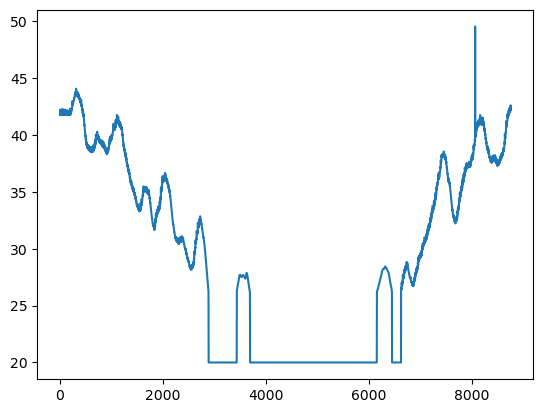

In [79]:
(df.T_ts-273.15).plot()

<Axes: >

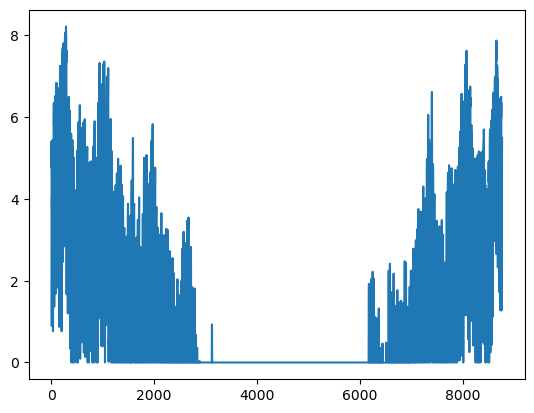

In [80]:
df.Req_kWh.plot()

<Axes: >

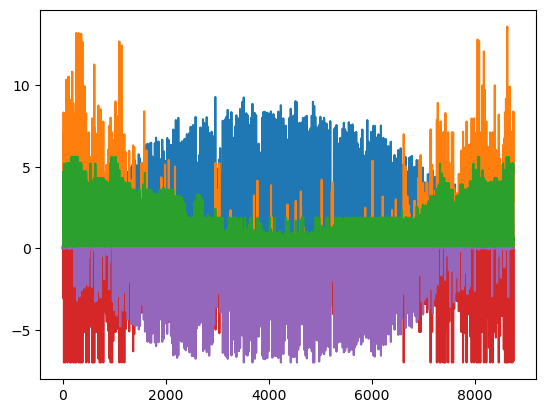

In [87]:
df.E_PV.plot()
df.E_cons.plot()
(df.E_hp+df.E_hpdhw).plot()
(-1*df.E_grid_batt_EV_EV1).plot()

(-1*df.E_PV_batt_EV_EV1).plot()


<Axes: >

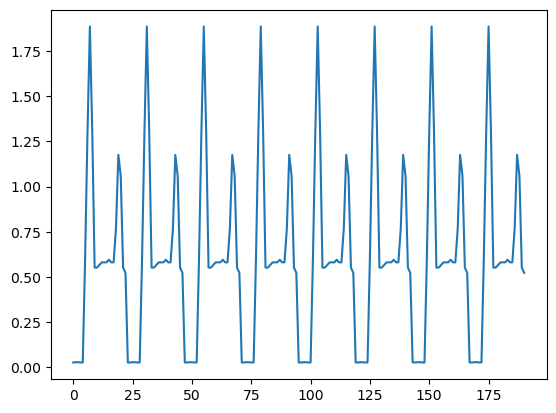

In [88]:
(df.loc[:190,'Req_kWh_DHW']).plot()


<Axes: >

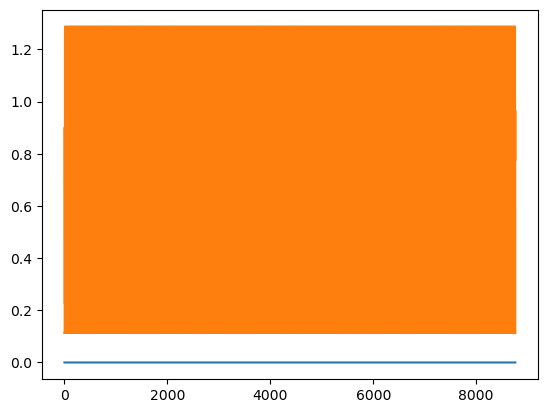

In [148]:

(df.E_char_EV_EV0).plot()
(df.E_demand).plot()

In [122]:
df=pd.read_csv('../test_dhw_full.csv')

In [123]:
df.head()

,index,Bool_char,Bool_cons,Bool_dis,Bool_hp,Bool_hpdhw,Bool_inj,E_PV_batt,E_PV_bu,E_PV_budhw,...,Temp,Temp_supply,Temp_supply_tank,T_aux_supply,COP_tank,COP_SH,COP_DHW,EV1_EV_home,EV1_EV_away,EV1_E_EV_trip
0,2017-01-01 00:00:00,-0.0,1.0,1.0,0.0,1.0,0.0,-0.0,0.0,0.0,...,269.95,315.072449,318.77924,325.072449,1.81,2.06,1.62,1.0,0.0,0.0
1,2017-01-01 01:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,-0.0,0.0,0.0,...,270.45,315.072449,318.77924,325.072449,1.81,2.06,1.62,1.0,0.0,0.0
2,2017-01-01 02:00:00,-0.0,1.0,1.0,-0.0,1.0,0.0,-0.0,0.0,0.0,...,270.15,315.072449,318.77924,325.072449,1.81,2.06,1.62,1.0,0.0,0.0
3,2017-01-01 03:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,-0.0,0.0,0.0,...,270.35,315.072449,318.77924,325.072449,1.81,2.06,1.62,1.0,0.0,0.0
4,2017-01-01 04:00:00,-0.0,1.0,1.0,-0.0,1.0,0.0,-0.0,0.0,0.0,...,270.15,315.072449,318.77924,325.072449,1.81,2.06,1.62,1.0,0.0,0.0


In [124]:
df.tail()

,index,Bool_char,Bool_cons,Bool_dis,Bool_hp,Bool_hpdhw,Bool_inj,E_PV_batt,E_PV_bu,E_PV_budhw,...,Temp,Temp_supply,Temp_supply_tank,T_aux_supply,COP_tank,COP_SH,COP_DHW,EV1_EV_home,EV1_EV_away,EV1_E_EV_trip
8755,2017-12-31 19:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,-0.0,0.0,0.0,...,269.85,315.595728,319.387023,325.595728,1.81,2.06,1.62,1.0,0.0,0.0
8756,2017-12-31 20:00:00,-0.0,1.0,1.0,0.0,1.0,0.0,-0.0,0.0,0.0,...,269.35,315.604996,319.397786,325.604996,1.81,2.06,1.62,1.0,0.0,0.0
8757,2017-12-31 21:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,-0.0,0.0,0.0,...,270.45,315.614262,319.408548,325.614262,1.81,2.06,1.62,1.0,0.0,0.0
8758,2017-12-31 22:00:00,-0.0,1.0,1.0,0.0,1.0,0.0,-0.0,0.0,0.0,...,270.25,315.623528,319.419309,325.623528,1.81,2.06,1.62,1.0,0.0,0.0
8759,2017-12-31 23:00:00,-0.0,1.0,1.0,1.0,0.0,0.0,-0.0,0.0,0.0,...,268.45,315.632793,319.430069,325.632793,1.81,2.06,1.62,1.0,0.0,0.0


In [135]:
df.columns

Index(['index', 'Bool_char', 'Bool_cons', 'Bool_dis', 'Bool_hp', 'Bool_hpdhw',
       'Bool_inj', 'E_PV_batt', 'E_PV_bu', 'E_PV_budhw', 'E_PV_curt',
       'E_PV_grid', 'E_PV_hp', 'E_PV_hpdhw', 'E_PV_load', 'E_batt_bu',
       'E_batt_budhw', 'E_batt_hp', 'E_batt_hpdhw', 'E_batt_load', 'E_bu',
       'E_budhw', 'E_char', 'E_cons', 'E_dis', 'E_grid_batt', 'E_grid_bu',
       'E_grid_budhw', 'E_grid_hp', 'E_grid_hpdhw', 'E_grid_load', 'E_hp',
       'E_hpdhw', 'E_loss_Batt', 'E_loss_conv', 'E_loss_inv', 'E_loss_inv_PV',
       'E_loss_inv_batt', 'E_loss_inv_grid', 'Q_dhwst_hd', 'Q_hp_sh',
       'Q_hp_ts', 'Q_loss_dhwst', 'Q_loss_ts', 'Q_ts', 'Q_ts_delta', 'Q_ts_sh',
       'SOC', 'T_dhwst', 'T_ts', 'Bool_char_EV_EV1', 'Bool_dis_EV_EV1',
       'E_PV_batt_EV_EV1', 'E_batt_EV_grid_EV1', 'E_batt_EV_load_EV1',
       'E_char_EV_EV1', 'E_char_away_EV1', 'E_dis_EV_EV1',
       'E_grid_batt_EV_EV1', 'E_loss_Batt_EV_EV1', 'SOC_EV_EV1', 'E_demand',
       'E_PV', 'Export_price', 'price', 'Inv_P'

In [125]:
dhw_cols = [c for c in df.columns if 'dhw' in c.lower()]

In [126]:
dhw_cols

['Bool_hpdhw',
 'E_PV_budhw',
 'E_PV_hpdhw',
 'E_batt_budhw',
 'E_batt_hpdhw',
 'E_budhw',
 'E_grid_budhw',
 'E_grid_hpdhw',
 'E_hpdhw',
 'Q_dhwst_hd',
 'Q_loss_dhwst',
 'T_dhwst',
 'Req_kWh_DHW',
 'COP_DHW']

<Axes: >

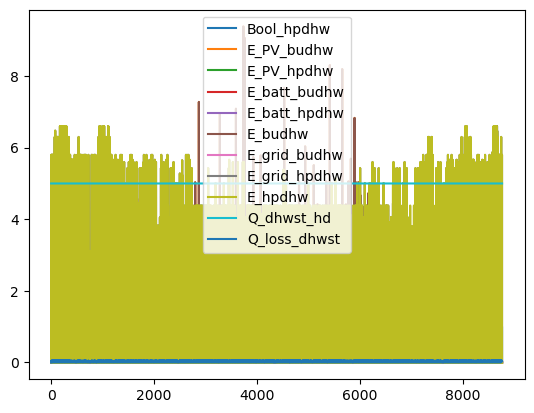

In [127]:
df[['Bool_hpdhw',
 'E_PV_budhw',
 'E_PV_hpdhw',
 'E_batt_budhw',
 'E_batt_hpdhw',
 'E_budhw',
 'E_grid_budhw',
 'E_grid_hpdhw',
 'E_hpdhw',
 'Q_dhwst_hd',
 'Q_loss_dhwst']].plot()

<Axes: >

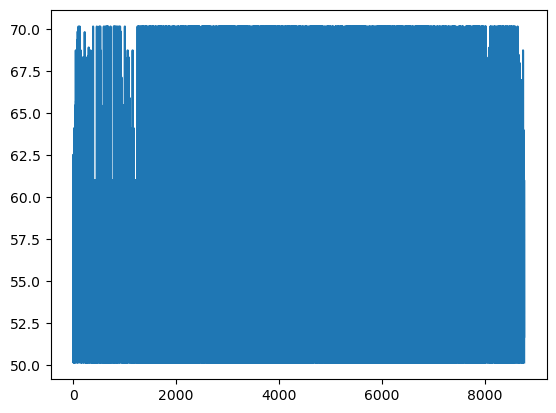

In [128]:
(df.T_dhwst-273).plot()

<Axes: >

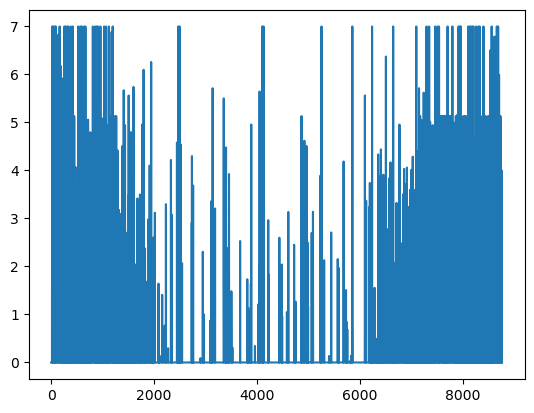

In [137]:
df.E_grid_batt_EV_EV1.plot()

<Axes: >

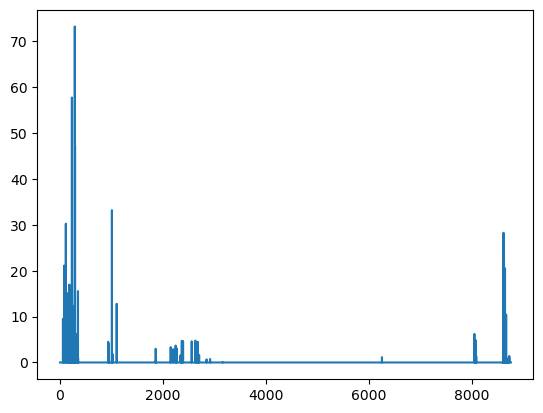

In [138]:
df.E_bu.plot()

<Axes: >

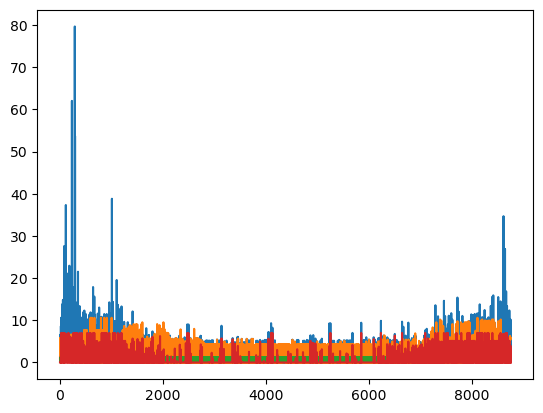

In [ ]:
df.E_cons.plot()
(df.E_hpdhw+df.E_hp).plot()
df.E_demand.plot()




<Axes: >

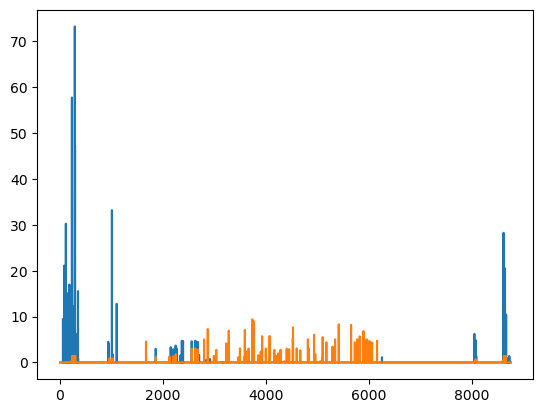

In [142]:

(df.E_bu).plot()
(df.E_budhw).plot()

<Axes: >

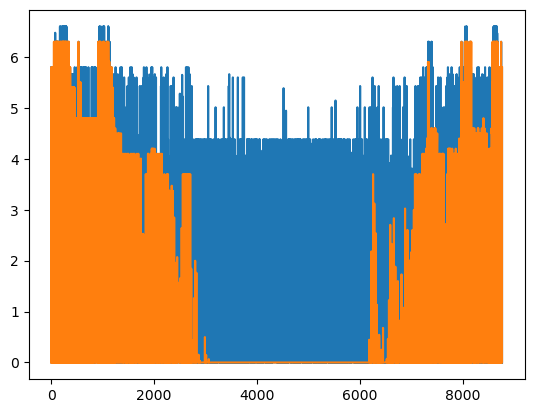

In [ ]:
(df.E_hpdhw).plot()
(df.E_hp).plot()


<Axes: >

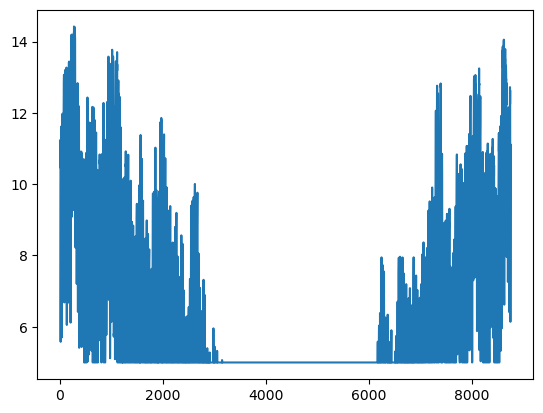

In [140]:

(df.Req_kWh+df.Req_kWh_DHW).plot()



In [16]:
df.T_dhwst[0]-273

np.float64(59.5190353351141)

In [9]:
315-273

42

In [ ]:

import sys
    
import os
import pandas as pd
import argparse
import itertools
import numpy as np
from dateutil import parser
import glob
import multiprocessing as mp
import time
import paper_classes as pc
from functools import wraps
from pathlib import Path
import traceback
import pickle
import csv
from Core import single_opt2
import post_proc as pp
import logging
import main_beers as mb


ModuleNotFoundError: No module named 'utils'

In [ ]:

def convert_citysim_dict(input_dict):
    """
    Convert a dictionary with single-element lists to a dictionary with scalars of the desired types.
    
    For example, "PV_nom" is converted from [1] to np.float64(1*4.8) i.e. np.float64(4.8), while numeric fields are cast to np.int64.
    The key "hh" is assumed to be already in the desired format (e.g. a pd.Series) and is left untouched.
    
    Parameters:
        input_dict (dict): Dictionary with keys and values (typically single-element lists) from CitySim output.
        
    Returns:
        dict: A new dictionary with converted values.
    """
    # Define conversion functions for keys where conversion is needed.
    conversion_map = {
        'Capacity': lambda x: np.int64(x),
        'App_comb': lambda x: np.int64(x),
        'Tech': lambda x: x,  # string, no conversion
        'PV_nom': lambda x: np.float64(x),
        'country': lambda x: x,
        'cases': lambda x: x,
        'conf': lambda x: np.int64(x),
        'house_type': lambda x: x,
        'HP': lambda x: x,
        'EV_V2G': lambda x: np.int64(x),
        'electricity_profile': lambda x: x,
        'EV_batt_cap': lambda x: np.int64(x),
        'EV_P_max_home': lambda x: x,  # remain as string
        'EV_use': lambda x: x,
        'profile_row_number': lambda x: np.int64(x),
        # 'hh' is treated separately.
    }
    
    output_dict = {}
    for key, value in input_dict.items():
        if key == 'hh':
            output_dict[key] = value
        else:
            # Assume numeric/string values are stored in a list; extract the first element.
            elem = value[0] if isinstance(value, list) and len(value) > 0 else value
            if key in conversion_map:
                output_dict[key] = conversion_map[key](elem)
            else:
                output_dict[key] = elem
    return output_dict


In [ ]:
# Setup logging
logging.basicConfig(filename='main.log',
                    level=logging.DEBUG,
                    filemode='w',
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

In [35]:
import re

def process_citysim_output(df):
    """
    Process a citysim output DataFrame to extract building outputs and create summary dictionaries and a summary DataFrame.
    
    Parameters:
        df (pd.DataFrame): Citysim output DataFrame with columns like 
            '24280(Building-925174-CH913053520904):0:Ta(celsius)'.
    
    Returns:
        building_names (set): Unique building identifiers.
        building_outputs (dict): Keys are building names; values are dicts with outputs of interest (as pd.Series).
        annual_summary (dict): Keys are building names; values are dicts with annual summed outputs.
        summary_df (pd.DataFrame): DataFrame summarizing the annual outputs per building.
    """
    # Extract unique building names.
    building_names = set()
    pattern_name = re.compile(r'^(\d+\([^)]*\))')
    for col in df.columns:
        if col.startswith('#') or col.startswith('Unnamed'):
            continue
        match = pattern_name.match(col)
        if match:
            building_names.add(match.group(1))
    
    # Helper to extract building, output, and unit from a column name.
    def extract_building_output(col):
        pattern = r'^(?P<building>\d+\([^)]*\))(?::\d+)?\:(?P<output>\w+)\((?P<unit>[^)]+)\)$'
        match = re.match(pattern, col)
        if match:
            return match.group('building'), match.group('output'), match.group('unit')
        return None, None, None

    outputs_of_interest = ['SolarPVProduction', 'ElectricConsumption', 'Qs']
    building_outputs = {}
    for col in df.columns:
        if col.startswith('#timeStep') or col.startswith('Unnamed'):
            continue
        building, output, unit = extract_building_output(col)
        if building and output in outputs_of_interest:
            if building not in building_outputs:
                building_outputs[building] = {}
            # Convert from Wh to kWh for SolarPVProduction and Qs.
            if output in ['SolarPVProduction', 'Qs'] and unit == 'Wh':
                building_outputs[building][output] = df[col] / 1000.0
            else:
                building_outputs[building][output] = df[col]
    
    # Create annual summary (summing each output).
    annual_summary = {}
    for building in building_names:
        annual_summary[building] = {}
        for output in outputs_of_interest:
            if building in building_outputs and output in building_outputs[building]:
                annual_summary[building][output] = building_outputs[building][output].sum()
            else:
                annual_summary[building][output] = None
                
    summary_df = pd.DataFrame.from_dict(annual_summary, orient='index')
    
    return building_names, building_outputs, annual_summary, summary_df

In [ ]:
def initialize_simulation(df, combinations):
    """
    Initializes simulation parameters and loads data for the simulation.

    This function takes an input DataFrame (df) containing raw CSV data and a combinations 
    dictionary with configuration settings. It then configures logging, loads prices, EV, and 
    heat demand data via module functions from 'mb', and resamples these datasets to 1-hour 
    resolution. Temperature values are converted from Celsius to Kelvin, and testing filters are 
    applied if enabled. Finally, the function configures system parameters based on the provided 
    combinations, combines the processed datasets into a single DataFrame (data_input), and finalizes 
    simulation parameters.

    Returns:
        param (dict): Dictionary with finalized simulation parameters.
        data_input (pd.DataFrame): Combined DataFrame with processed input data, including resampled 
                                   prices, EV, and heat demand data.
        df_prices (pd.DataFrame): Resampled prices DataFrame (1-hour mean values).
        resampled_df (pd.DataFrame): Resampled EV data DataFrame (aggregated energy flows and home/away status).
        resampled_df_heat (pd.DataFrame): Resampled heat demand DataFrame with aggregated values.
        df (pd.DataFrame): Original CSV data with its index aligned to the resampled EV data index.
        df_EV (pd.DataFrame): EV data loaded via mb.load_EV_data.
        df_heat (pd.DataFrame): Heat demand data loaded via mb.load_heat_demand.
        EV_ID (str): EV identifier loaded via mb.load_EV_data.
        logger (logging.Logger): Configured logger instance for logging simulation progress.
    """
    
    # Initialize parameter dictionary with basic entries
    param = {
        'id_dwell': 'citySimtest',
        'App_comb': combinations['App_comb'],
        'aging': True,
        'Curtailment': 0,
        'Inverter_efficiency': 0.95,
        'Converter_efficiency_HP': 0.98,
        'delta_t': 1,
        'Capacity_tariff': 0,
        'nyears': 1,
        'days': 365,
        'testing': False
    }
    week = 10  # For testing purposes
        
    # Load data using module functions
    df_prices = mb.load_prices()
    param, df_EV, EV_ID = mb.load_EV_data(combinations, param)
    df_heat = mb.load_heat_demand(combinations)
    
    # Resample prices to 1-hour mean values
    df_prices = df_prices.resample('1h').mean()
    
    # Resample EV data: sum energy flows, flag home/away status
    resampled_df = df_EV.resample('1h').agg({
        'E_EV_req': 'sum',
        'EV_home': 'max',
        'E_EV_trip': 'sum',
        'EV_away': 'max'
    })
    resampled_df['EV_away'] = abs(resampled_df.EV_home - 1)
    
    # Resample heat demand data with appropriate aggregations
    resampled_df_heat = df_heat.resample('1h').agg({
        'Set_T': 'mean',
        'Temp': 'mean',
        'Req_kWh': 'sum',
        'Req_kWh_DHW': 'sum',
        'Temp_supply': 'mean',
        'Temp_supply_tank': 'mean',
        'COP_SH': 'mean',
        'COP_tank': 'mean',
        'COP_DHW': 'mean',
        'hp_sh_cons': 'mean',
        'hp_tank_cons': 'mean',
        'hp_dhw_cons': 'mean'
    })
    resampled_df_heat = resampled_df_heat.drop('Req_kWh', axis=1)
    
    # Align df index with the EV data index and combine datasets
    df.index = resampled_df.index
    data_input = pd.concat([df, resampled_df_heat, df_prices, resampled_df],
                           axis=1, copy=True, sort=False)
    
    # Update PV_nom and Inverter_power based on E_PV (temporary values if no better info is available)
    param['PV_nom'] = data_input.E_PV.max() * 4
    param['Inverter_power'] = np.round(data_input.E_PV.max() * 4, 1)
    
    # Multiply heat consumption columns for testing purposes (preprocessing step for heat data)
    data_input.loc[:, ['hp_sh_cons', 'hp_tank_cons', 'hp_dhw_cons']] *= 3
    
    # Convert temperature columns from Celsius to Kelvin
    data_input['Temp'] = data_input['Temp'].apply(mb.celsius_to_kelvin)
    data_input['Set_T'] = data_input['Set_T'].apply(mb.celsius_to_kelvin)
    data_input['Temp_supply'] = data_input['Temp_supply'].apply(mb.celsius_to_kelvin)
    data_input['Temp_supply_tank'] = data_input['Temp_supply_tank'].apply(mb.celsius_to_kelvin)
    
    # Apply testing filter if enabled
    if param['testing']:
        data_input = data_input[data_input.index.isocalendar().week <= week]
        nyears = 1
        days = 7
    else:
        nyears = 1
        days = 365
    param['ndays'] = days * nyears
    
    # Configure system parameters and retrieve configuration auxiliary list
    param, conf_aux = mb.configure_system_parameters(combinations, param, data_input)
    logger.debug("Initialized EV battery with capacity %s", param['EV_batt_cap'])
    
    # Final update of parameters with additional information
    param.update({
        'Capacity': combinations['Capacity'],
        'Tech': combinations['Tech'],
        'conf': conf_aux,
        'ht': combinations['house_type'],
        'EV_ID': EV_ID,
        'electricity_profile': combinations['electricity_profile'],
        'EV_V2G': combinations['EV_V2G'],
        'name':  combinations['hh']+ EV_ID,
        'PV_nom': combinations['Capacity'],
        'App_comb': mb.create_app_combinations(combinations['App_comb'])
    })
    
    return param, data_input


In [40]:

# Example of usage:
#if __name__ == "__main__":
# Define initial combinations dictionary
df_citysim = pd.read_csv('C:/Users/alejandr.penabell/Downloads/CitySimSimulations/citysim_monthey_3/citysim_monthey_3/simulation_TH.out',sep='\t')
[building_names, building_outputs, annual_summary, summary_df] = process_citysim_output(df_citysim)

combinations = {
    'Capacity': [10],
    'App_comb': [0],
    'Tech': ['NMC'],
    'PV_nom': [1],
    'country': ['CH'],
    'cases': ['mean'],
    'conf': [4],
    'house_type': ['SFH100'],
    'HP': ['AS'],
    'EV_V2G': [0],
    'electricity_profile': ['High'],
    'EV_batt_cap': [60],
    'EV_P_max_home': ['11'],
    'EV_use': ['High'],
    'profile_row_number': [99]
}





In [38]:
building_names

{'24271(Building-925145-CH729613523003)',
 '24272(Building-925177-CH729613523003)',
 '24273(Building-925175-CH887752309336)',
 '24274(Building-925102-CH269552302383)',
 '24275(Building-925101-CH273001245271)',
 '24276(Building-925103-CH300730945275)',
 '24277(Building-504217329-CH669452304945)',
 '24278(Building-925098-CH943052901142)',
 '24279(Building-504217329-CH913053520904)',
 '24280(Building-925174-CH913053520904)',
 '24281(Building-3110783-CH300730945275)',
 '24282(Building-190203980-CH473093775283)',
 '24283(Building-925146-CH109630105229)',
 '24284(Building-925176-CH160352309309)',
 '24285(Building-504217456-CH160352309309)',
 '24287(Building-925099-CH729613523003)',
 '24288(Building-9014588-CH729613523003)',
 '24289(Building-925075-CH960352309625)',
 '24290(Building-191685577-CH829611523084)',
 '24291(Building-9014589-CH509030115252)'}

In [41]:

# Load CSV and adjust columns
df = pd.DataFrame(building_outputs['24279(Building-504217329-CH913053520904)'])
df.columns = ['Req_kWh', 'E_demand', 'E_PV']

# Add additional identifier
combinations['hh'] = '24279(Building-504217329-CH913053520904)'

# Convert combinations dictionary to proper types/values
combinations = convert_citysim_dict(combinations)

results = initialize_simulation(df, combinations)
param, data_input = results
logger.info("Simulation initialization complete.")
[df,aux_dict]=single_opt2(param,data_input)
print('out of optimization')

2025-03-26 15:47:27,286 - INFO - Extract the id numbers
2025-03-26 15:47:27,295 - INFO - EV_ID: s340051_381548
2025-03-26 15:47:28,040 - INFO - separate EV files per profile
2025-03-26 15:47:29,072 - INFO - Simulation initialization complete.
2025-03-26 15:47:29,072 - INFO - Starting single_opt2 process.
2025-03-26 15:47:29,073 - INFO - Begin single_opt2: Starting optimization sequence.
2025-03-26 15:47:29,073 - INFO - App_comb stored.
2025-03-26 15:47:29,074 - INFO - Starting optimization process.
2025-03-26 15:47:29,074 - INFO - Optimizing for 1 day(s) with a window of 24 timesteps.
2025-03-26 15:47:29,075 - INFO - %%%%%%%%% Optimizing %%%%%%%%%%%%%%%
2025-03-26 15:47:29,234 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


##############
load parameters
conf
4
                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-01-01 00:00:00+01:00   19.603     1.082   0.0  293.15  271.15   
2017-01-01 01:00:00+01:00   16.982     1.082   0.0  293.15  271.05   
2017-01-01 02:00:00+01:00   17.350     1.082   0.0  293.15  270.95   
2017-01-01 03:00:00+01:00   17.364     1.082   0.0  293.15  270.85   
2017-01-01 04:00:00+01:00   17.512     1.082   0.0  293.15  270.55   
2017-01-01 05:00:00+01:00   17.661     1.082   0.0  293.15  270.45   
2017-01-01 06:00:00+01:00   11.984     8.655   0.0  293.15  270.45   
2017-01-01 07:00:00+01:00   13.785     7.419   0.0  293.15  270.35   
2017-01-01 08:00:00+01:00   17.984     2.844   0.0  293.15  270.15   
2017-01-01 09:00:00+01:00   16.076     2.164   0.0  293.15  270.25   
2017-01-01 10:00:00+01:00   13.720     2.164   0.0  293.15  270.75   
2017-01-01 11:00:00+01:00    7.731     5.842   0.0  

2025-03-26 15:47:29,354 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9qppj3wn.pyomo.lp
2025-03-26 15:47:29,355 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:29,356 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:29,356 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:29,356 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:29,357 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:29,358 - INFO - 
2025-03-26 15:47:29,362 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:29,363 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:29,366 - INFO - 
2025-03-26 15:47:29,367 - INFO - Non-default parameters:
2025-03-26 15:47:29,368 - INFO - MIPGap  0.001
2025-03-26 15:47:29,369 - INFO - Threads  1
2025-03-26 15:47:29,370 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 78.81219685436149
  Upper bound: 78.81219685436149
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:29,654 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpihmn2hh3.pyomo.lp
2025-03-26 15:47:29,658 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:29,662 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:29,665 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:29,668 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:29,670 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:29,671 - INFO - 
2025-03-26 15:47:29,675 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:29,679 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:29,680 - INFO - 
2025-03-26 15:47:29,682 - INFO - Non-default parameters:
2025-03-26 15:47:29,683 - INFO - MIPGap  0.001
2025-03-26 15:47:29,684 - INFO - Threads  1
2025-03-26 15:47:29,685 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 83.78841166526452
  Upper bound: 83.78841166526452
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:29,994 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi34d4i2h.pyomo.lp
2025-03-26 15:47:29,998 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:30,000 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:30,002 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:30,003 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:30,012 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:30,014 - INFO - 
2025-03-26 15:47:30,016 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:30,018 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:30,019 - INFO - 
2025-03-26 15:47:30,021 - INFO - Non-default parameters:
2025-03-26 15:47:30,023 - INFO - MIPGap  0.001
2025-03-26 15:47:30,026 - INFO - Threads  1
2025-03-26 15:47:30,030 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 70.55215643513823
  Upper bound: 70.55215643513823
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:30,375 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7672y_1s.pyomo.lp
2025-03-26 15:47:30,376 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:30,378 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:30,379 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:30,380 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:30,384 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:30,387 - INFO - 
2025-03-26 15:47:30,388 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:30,389 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:30,390 - INFO - 
2025-03-26 15:47:30,391 - INFO - Non-default parameters:
2025-03-26 15:47:30,391 - INFO - MIPGap  0.001
2025-03-26 15:47:30,392 - INFO - Threads  1
2025-03-26 15:47:30,395 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 84.60538656066203
  Upper bound: 84.60538656066203
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:30,670 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppj49d7n3.pyomo.lp
2025-03-26 15:47:30,671 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:30,672 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:30,673 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:30,675 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:30,676 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:30,678 - INFO - 
2025-03-26 15:47:30,682 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:30,683 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:30,685 - INFO - 
2025-03-26 15:47:30,686 - INFO - Non-default parameters:
2025-03-26 15:47:30,686 - INFO - MIPGap  0.001
2025-03-26 15:47:30,688 - INFO - Threads  1
2025-03-26 15:47:30,689 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 83.41001347279506
  Upper bound: 83.41001347279506
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:31,271 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpstspret3.pyomo.lp
2025-03-26 15:47:31,273 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:31,276 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:31,280 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:31,283 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:31,284 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:31,285 - INFO - 
2025-03-26 15:47:31,286 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:31,287 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:31,287 - INFO - 
2025-03-26 15:47:31,288 - INFO - Non-default parameters:
2025-03-26 15:47:31,289 - INFO - MIPGap  0.001
2025-03-26 15:47:31,292 - INFO - Threads  1
2025-03-26 15:47:31,296 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 107.27214990290425
  Upper bound: 107.27214990290425
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:31,621 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjxuvt2lf.pyomo.lp
2025-03-26 15:47:31,623 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:31,627 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:31,629 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:31,632 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:31,632 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:31,633 - INFO - 
2025-03-26 15:47:31,634 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:31,634 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:31,635 - INFO - 
2025-03-26 15:47:31,637 - INFO - Non-default parameters:
2025-03-26 15:47:31,638 - INFO - MIPGap  0.001
2025-03-26 15:47:31,640 - INFO - Threads  1
2025-03-26 15:47:31,644 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 100.58767743688576
  Upper bound: 100.58767743688576
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:31,999 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpopvagsq0.pyomo.lp
2025-03-26 15:47:32,001 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:32,003 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:32,005 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:32,007 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:32,008 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:32,010 - INFO - 
2025-03-26 15:47:32,012 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:32,013 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:32,016 - INFO - 
2025-03-26 15:47:32,017 - INFO - Non-default parameters:
2025-03-26 15:47:32,020 - INFO - MIPGap  0.001
2025-03-26 15:47:32,022 - INFO - Threads  1
2025-03-26 15:47:32,024 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 95.92836982426037
  Upper bound: 95.92836982426037
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:32,293 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp308wap2r.pyomo.lp
2025-03-26 15:47:32,295 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:32,296 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:32,297 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:32,298 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:32,298 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:32,300 - INFO - 
2025-03-26 15:47:32,300 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:32,301 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:32,302 - INFO - 
2025-03-26 15:47:32,302 - INFO - Non-default parameters:
2025-03-26 15:47:32,303 - INFO - MIPGap  0.001
2025-03-26 15:47:32,304 - INFO - Threads  1
2025-03-26 15:47:32,304 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 112.7137882343022
  Upper bound: 112.7137882343022
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:32,539 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqrlveg5k.pyomo.lp
2025-03-26 15:47:32,540 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:32,540 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:32,541 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:32,542 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:32,543 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:32,544 - INFO - 
2025-03-26 15:47:32,544 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:32,545 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:32,546 - INFO - 
2025-03-26 15:47:32,547 - INFO - Non-default parameters:
2025-03-26 15:47:32,548 - INFO - MIPGap  0.001
2025-03-26 15:47:32,549 - INFO - Threads  1
2025-03-26 15:47:32,549 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 112.42530850484691
  Upper bound: 112.42530850484691
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:32,788 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgiqwczl6.pyomo.lp
2025-03-26 15:47:32,789 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:32,790 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:32,791 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:32,791 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:32,792 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:32,795 - INFO - 
2025-03-26 15:47:32,797 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:32,798 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:32,799 - INFO - 
2025-03-26 15:47:32,801 - INFO - Non-default parameters:
2025-03-26 15:47:32,802 - INFO - MIPGap  0.001
2025-03-26 15:47:32,803 - INFO - Threads  1
2025-03-26 15:47:32,804 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 90.32081333890471
  Upper bound: 90.32081333890471
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:33,145 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1pnycsgo.pyomo.lp
2025-03-26 15:47:33,147 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:33,147 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:33,149 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:33,151 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:33,152 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:33,153 - INFO - 
2025-03-26 15:47:33,154 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:33,155 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:33,157 - INFO - 
2025-03-26 15:47:33,158 - INFO - Non-default parameters:
2025-03-26 15:47:33,159 - INFO - MIPGap  0.001
2025-03-26 15:47:33,161 - INFO - Threads  1
2025-03-26 15:47:33,162 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 102.58109246199827
  Upper bound: 102.58109246199827
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:33,456 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpep96_nj3.pyomo.lp
2025-03-26 15:47:33,457 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:33,458 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:33,458 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:33,459 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:33,460 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:33,461 - INFO - 
2025-03-26 15:47:33,461 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:33,462 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:33,462 - INFO - 
2025-03-26 15:47:33,463 - INFO - Non-default parameters:
2025-03-26 15:47:33,464 - INFO - MIPGap  0.001
2025-03-26 15:47:33,464 - INFO - Threads  1
2025-03-26 15:47:33,466 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 108.2812143096156
  Upper bound: 108.2812143096156
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:33,675 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppkwx6qf9.pyomo.lp
2025-03-26 15:47:33,677 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:33,678 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:33,679 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:33,680 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:33,681 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:33,682 - INFO - 
2025-03-26 15:47:33,682 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:33,684 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:33,685 - INFO - 
2025-03-26 15:47:33,686 - INFO - Non-default parameters:
2025-03-26 15:47:33,687 - INFO - MIPGap  0.001
2025-03-26 15:47:33,688 - INFO - Threads  1
2025-03-26 15:47:33,689 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 108.70381501586512
  Upper bound: 108.70381501586512
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:33,894 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7f26do6q.pyomo.lp
2025-03-26 15:47:33,895 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:33,896 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:33,897 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:33,898 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:33,899 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:33,900 - INFO - 
2025-03-26 15:47:33,901 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:33,902 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:33,904 - INFO - 
2025-03-26 15:47:33,905 - INFO - Non-default parameters:
2025-03-26 15:47:33,906 - INFO - MIPGap  0.001
2025-03-26 15:47:33,908 - INFO - Threads  1
2025-03-26 15:47:33,909 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 124.82187702201897
  Upper bound: 124.82187702201897
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:34,141 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpajru4utk.pyomo.lp
2025-03-26 15:47:34,143 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:34,144 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:34,145 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:34,146 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:34,147 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:34,147 - INFO - 
2025-03-26 15:47:34,148 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:34,149 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:34,149 - INFO - 
2025-03-26 15:47:34,150 - INFO - Non-default parameters:
2025-03-26 15:47:34,151 - INFO - MIPGap  0.001
2025-03-26 15:47:34,152 - INFO - Threads  1
2025-03-26 15:47:34,153 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 118.32906093203138
  Upper bound: 118.32906093203138
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:34,356 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp12ytx2dr.pyomo.lp
2025-03-26 15:47:34,356 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:34,357 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:34,357 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:34,358 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:34,360 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:34,360 - INFO - 
2025-03-26 15:47:34,361 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:34,362 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:34,363 - INFO - 
2025-03-26 15:47:34,363 - INFO - Non-default parameters:
2025-03-26 15:47:34,364 - INFO - MIPGap  0.001
2025-03-26 15:47:34,365 - INFO - Threads  1
2025-03-26 15:47:34,365 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 108.15921141746776
  Upper bound: 108.15921141746776
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:34,685 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi2h8p70b.pyomo.lp
2025-03-26 15:47:34,687 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:34,688 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:34,689 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:34,690 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:34,691 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:34,692 - INFO - 
2025-03-26 15:47:34,694 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:34,696 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:34,698 - INFO - 
2025-03-26 15:47:34,700 - INFO - Non-default parameters:
2025-03-26 15:47:34,701 - INFO - MIPGap  0.001
2025-03-26 15:47:34,703 - INFO - Threads  1
2025-03-26 15:47:34,705 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 104.43102209707992
  Upper bound: 104.43102209707992
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:35,028 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp14u4bfx6.pyomo.lp
2025-03-26 15:47:35,032 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:35,033 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:35,034 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:35,035 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:35,036 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:35,037 - INFO - 
2025-03-26 15:47:35,037 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:35,037 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:35,039 - INFO - 
2025-03-26 15:47:35,040 - INFO - Non-default parameters:
2025-03-26 15:47:35,040 - INFO - MIPGap  0.001
2025-03-26 15:47:35,041 - INFO - Threads  1
2025-03-26 15:47:35,044 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 96.42037805824458
  Upper bound: 96.42037805824458
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:35,551 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzlhqs0tr.pyomo.lp
2025-03-26 15:47:35,552 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:35,553 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:35,554 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:35,556 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:35,557 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:35,558 - INFO - 
2025-03-26 15:47:35,559 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:35,559 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:35,560 - INFO - 
2025-03-26 15:47:35,561 - INFO - Non-default parameters:
2025-03-26 15:47:35,561 - INFO - MIPGap  0.001
2025-03-26 15:47:35,562 - INFO - Threads  1
2025-03-26 15:47:35,562 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 98.11997514562326
  Upper bound: 98.11997514562326
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:35,797 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphd7lhay8.pyomo.lp
2025-03-26 15:47:35,798 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:35,799 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:35,800 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:35,800 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:35,801 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:35,801 - INFO - 
2025-03-26 15:47:35,801 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:35,802 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:35,802 - INFO - 
2025-03-26 15:47:35,803 - INFO - Non-default parameters:
2025-03-26 15:47:35,803 - INFO - MIPGap  0.001
2025-03-26 15:47:35,804 - INFO - Threads  1
2025-03-26 15:47:35,805 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 84.53476966989481
  Upper bound: 84.53476966989481
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:36,089 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_ck2c28v.pyomo.lp
2025-03-26 15:47:36,094 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:36,098 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:36,101 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:36,103 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:36,106 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:36,107 - INFO - 
2025-03-26 15:47:36,111 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:36,114 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:36,118 - INFO - 
2025-03-26 15:47:36,121 - INFO - Non-default parameters:
2025-03-26 15:47:36,124 - INFO - MIPGap  0.001
2025-03-26 15:47:36,128 - INFO - Threads  1
2025-03-26 15:47:36,131 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 84.75452209707993
  Upper bound: 84.75452209707993
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:36,598 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpym1g6cy5.pyomo.lp
2025-03-26 15:47:36,602 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:36,603 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:36,606 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:36,609 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:36,612 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:36,617 - INFO - 
2025-03-26 15:47:36,622 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:36,626 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:36,629 - INFO - 
2025-03-26 15:47:36,632 - INFO - Non-default parameters:
2025-03-26 15:47:36,634 - INFO - MIPGap  0.001
2025-03-26 15:47:36,638 - INFO - Threads  1
2025-03-26 15:47:36,641 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 95.06022112620538
  Upper bound: 95.06022112620538
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:37,829 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpawp3xht4.pyomo.lp
2025-03-26 15:47:37,834 - INFO - Reading time = 0.02 seconds
2025-03-26 15:47:37,838 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:37,843 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:37,848 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:37,853 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:37,858 - INFO - 
2025-03-26 15:47:37,863 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:37,868 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:37,871 - INFO - 
2025-03-26 15:47:37,877 - INFO - Non-default parameters:
2025-03-26 15:47:37,881 - INFO - MIPGap  0.001
2025-03-26 15:47:37,885 - INFO - Threads  1
2025-03-26 15:47:37,892 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 115.20818229125467
  Upper bound: 115.20818229125467
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:38,819 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx26a6y8s.pyomo.lp
2025-03-26 15:47:38,824 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:38,827 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:38,830 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:38,833 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:38,836 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:38,838 - INFO - 
2025-03-26 15:47:38,839 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:38,842 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:38,845 - INFO - 
2025-03-26 15:47:38,847 - INFO - Non-default parameters:
2025-03-26 15:47:38,850 - INFO - MIPGap  0.001
2025-03-26 15:47:38,853 - INFO - Threads  1
2025-03-26 15:47:38,856 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 111.038517242711
  Upper bound: 111.038517242711
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:47:39,211 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpezq4e62h.pyomo.lp
2025-03-26 15:47:39,212 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:39,213 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:39,215 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:39,216 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:39,218 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:39,220 - INFO - 
2025-03-26 15:47:39,221 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:39,222 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:39,224 - INFO - 
2025-03-26 15:47:39,225 - INFO - Non-default parameters:
2025-03-26 15:47:39,226 - INFO - MIPGap  0.001
2025-03-26 15:47:39,227 - INFO - Threads  1
2025-03-26 15:47:39,228 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 90.94838776698245
  Upper bound: 90.94838776698245
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:39,578 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpcq78pveh.pyomo.lp
2025-03-26 15:47:39,582 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:39,585 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:39,587 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:39,589 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:39,592 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:39,595 - INFO - 
2025-03-26 15:47:39,598 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:39,601 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:39,604 - INFO - 
2025-03-26 15:47:39,606 - INFO - Non-default parameters:
2025-03-26 15:47:39,610 - INFO - MIPGap  0.001
2025-03-26 15:47:39,614 - INFO - Threads  1
2025-03-26 15:47:39,619 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 86.96497029125375
  Upper bound: 86.96497029125375
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:40,157 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0nc5bula.pyomo.lp
2025-03-26 15:47:40,159 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:40,160 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:40,161 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:40,163 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:40,164 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:40,165 - INFO - 
2025-03-26 15:47:40,167 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:40,168 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:40,169 - INFO - 
2025-03-26 15:47:40,173 - INFO - Non-default parameters:
2025-03-26 15:47:40,176 - INFO - MIPGap  0.001
2025-03-26 15:47:40,181 - INFO - Threads  1
2025-03-26 15:47:40,188 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 79.4113530878587
  Upper bound: 79.4113530878587
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:47:40,617 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpixrut8lo.pyomo.lp
2025-03-26 15:47:40,618 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:40,619 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:40,621 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:40,625 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:40,629 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:40,634 - INFO - 
2025-03-26 15:47:40,636 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:40,638 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:40,639 - INFO - 
2025-03-26 15:47:40,641 - INFO - Non-default parameters:
2025-03-26 15:47:40,643 - INFO - MIPGap  0.001
2025-03-26 15:47:40,650 - INFO - Threads  1
2025-03-26 15:47:40,652 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 73.40725734953665
  Upper bound: 73.40725734953665
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:41,436 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp08h69f0s.pyomo.lp
2025-03-26 15:47:41,439 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:41,443 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:41,445 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:41,446 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:41,448 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:41,449 - INFO - 
2025-03-26 15:47:41,450 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:41,451 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:41,452 - INFO - 
2025-03-26 15:47:41,453 - INFO - Non-default parameters:
2025-03-26 15:47:41,454 - INFO - MIPGap  0.001
2025-03-26 15:47:41,456 - INFO - Threads  1
2025-03-26 15:47:41,458 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 74.05971327658833
  Upper bound: 74.05971327658833
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:41,730 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9l9knt00.pyomo.lp
2025-03-26 15:47:41,732 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:41,732 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:41,733 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:41,734 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:41,735 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:41,736 - INFO - 
2025-03-26 15:47:41,737 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:41,737 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:41,738 - INFO - 
2025-03-26 15:47:41,739 - INFO - Non-default parameters:
2025-03-26 15:47:41,741 - INFO - MIPGap  0.001
2025-03-26 15:47:41,742 - INFO - Threads  1
2025-03-26 15:47:41,745 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.73624456063883
  Upper bound: 59.73624456063883
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:42,019 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkblcte86.pyomo.lp
2025-03-26 15:47:42,020 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:42,020 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:42,021 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:42,021 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:42,022 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:42,022 - INFO - 
2025-03-26 15:47:42,023 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:42,024 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:42,025 - INFO - 
2025-03-26 15:47:42,028 - INFO - Non-default parameters:
2025-03-26 15:47:42,029 - INFO - MIPGap  0.001
2025-03-26 15:47:42,030 - INFO - Threads  1
2025-03-26 15:47:42,031 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 61.84634439293967
  Upper bound: 61.84634439293967
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:42,285 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3c_2wgd7.pyomo.lp
2025-03-26 15:47:42,286 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:42,287 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:42,287 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:42,288 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:42,289 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:42,289 - INFO - 
2025-03-26 15:47:42,290 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:42,290 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:42,291 - INFO - 
2025-03-26 15:47:42,293 - INFO - Non-default parameters:
2025-03-26 15:47:42,294 - INFO - MIPGap  0.001
2025-03-26 15:47:42,295 - INFO - Threads  1
2025-03-26 15:47:42,296 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.44950830187841
  Upper bound: 63.44950830187841
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:42,538 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1zk6oman.pyomo.lp
2025-03-26 15:47:42,538 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:42,539 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:42,539 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:42,540 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:42,540 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:42,541 - INFO - 
2025-03-26 15:47:42,542 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:42,544 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:42,544 - INFO - 
2025-03-26 15:47:42,546 - INFO - Non-default parameters:
2025-03-26 15:47:42,547 - INFO - MIPGap  0.001
2025-03-26 15:47:42,548 - INFO - Threads  1
2025-03-26 15:47:42,549 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 65.38961611858991
  Upper bound: 65.38961611858991
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:42,796 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvt7l_1k4.pyomo.lp
2025-03-26 15:47:42,797 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:42,798 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:42,798 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:42,799 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:42,800 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:42,801 - INFO - 
2025-03-26 15:47:42,801 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:42,802 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:42,803 - INFO - 
2025-03-26 15:47:42,804 - INFO - Non-default parameters:
2025-03-26 15:47:42,804 - INFO - MIPGap  0.001
2025-03-26 15:47:42,805 - INFO - Threads  1
2025-03-26 15:47:42,806 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 77.26045210780927
  Upper bound: 77.26045210780927
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:43,143 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7r9_162_.pyomo.lp
2025-03-26 15:47:43,146 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:43,148 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:43,150 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:43,151 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:43,152 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:43,152 - INFO - 
2025-03-26 15:47:43,153 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:43,153 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:43,154 - INFO - 
2025-03-26 15:47:43,154 - INFO - Non-default parameters:
2025-03-26 15:47:43,155 - INFO - MIPGap  0.001
2025-03-26 15:47:43,155 - INFO - Threads  1
2025-03-26 15:47:43,156 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 92.73586263491316
  Upper bound: 92.73586263491316
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:43,362 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpcrppqvaa.pyomo.lp
2025-03-26 15:47:43,364 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:43,365 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:43,366 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:43,366 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:43,367 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:43,367 - INFO - 
2025-03-26 15:47:43,368 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:43,369 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:43,369 - INFO - 
2025-03-26 15:47:43,370 - INFO - Non-default parameters:
2025-03-26 15:47:43,371 - INFO - MIPGap  0.001
2025-03-26 15:47:43,372 - INFO - Threads  1
2025-03-26 15:47:43,372 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 76.18143323988475
  Upper bound: 76.18143323988475
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:43,623 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbfd9lbnk.pyomo.lp
2025-03-26 15:47:43,623 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:43,624 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:43,624 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:43,625 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:43,626 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:43,629 - INFO - 
2025-03-26 15:47:43,630 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:43,631 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:43,632 - INFO - 
2025-03-26 15:47:43,633 - INFO - Non-default parameters:
2025-03-26 15:47:43,634 - INFO - MIPGap  0.001
2025-03-26 15:47:43,634 - INFO - Threads  1
2025-03-26 15:47:43,635 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 74.07264078705455
  Upper bound: 74.07264078705455
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:43,922 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpm7wj4348.pyomo.lp
2025-03-26 15:47:43,924 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:43,924 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:43,925 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:43,927 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:43,930 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:43,931 - INFO - 
2025-03-26 15:47:43,932 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:43,932 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:43,933 - INFO - 
2025-03-26 15:47:43,934 - INFO - Non-default parameters:
2025-03-26 15:47:43,934 - INFO - MIPGap  0.001
2025-03-26 15:47:43,935 - INFO - Threads  1
2025-03-26 15:47:43,936 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 77.78675129918395
  Upper bound: 77.78675129918395
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:44,199 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz5qfs6om.pyomo.lp
2025-03-26 15:47:44,200 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:44,201 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:44,201 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:44,202 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:44,202 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:44,203 - INFO - 
2025-03-26 15:47:44,203 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:44,204 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:44,204 - INFO - 
2025-03-26 15:47:44,205 - INFO - Non-default parameters:
2025-03-26 15:47:44,206 - INFO - MIPGap  0.001
2025-03-26 15:47:44,207 - INFO - Threads  1
2025-03-26 15:47:44,208 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 81.29693687330757
  Upper bound: 81.29693687330757
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:44,449 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy8ixn4kf.pyomo.lp
2025-03-26 15:47:44,452 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:44,453 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:44,454 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:44,455 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:44,456 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:44,457 - INFO - 
2025-03-26 15:47:44,457 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:44,458 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:44,460 - INFO - 
2025-03-26 15:47:44,462 - INFO - Non-default parameters:
2025-03-26 15:47:44,462 - INFO - MIPGap  0.001
2025-03-26 15:47:44,463 - INFO - Threads  1
2025-03-26 15:47:44,464 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 76.06833849055822
  Upper bound: 76.06833849055822
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:44,883 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_4lmzqbg.pyomo.lp
2025-03-26 15:47:44,886 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:44,888 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:44,888 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:44,889 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:44,890 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:44,890 - INFO - 
2025-03-26 15:47:44,891 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:44,892 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:44,893 - INFO - 
2025-03-26 15:47:44,894 - INFO - Non-default parameters:
2025-03-26 15:47:44,894 - INFO - MIPGap  0.001
2025-03-26 15:47:44,895 - INFO - Threads  1
2025-03-26 15:47:44,896 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 72.79843863072033
  Upper bound: 72.79843863072033
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:45,176 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1eyk0jvv.pyomo.lp
2025-03-26 15:47:45,178 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:45,178 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:45,179 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:45,179 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:45,180 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:45,180 - INFO - 
2025-03-26 15:47:45,181 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:45,182 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:45,182 - INFO - 
2025-03-26 15:47:45,183 - INFO - Non-default parameters:
2025-03-26 15:47:45,183 - INFO - MIPGap  0.001
2025-03-26 15:47:45,184 - INFO - Threads  1
2025-03-26 15:47:45,184 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 72.67423108355
  Upper bound: 72.67423108355
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

2025-03-26 15:47:45,406 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprti9wial.pyomo.lp
2025-03-26 15:47:45,407 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:45,407 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:45,408 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:45,410 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:45,412 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:45,412 - INFO - 
2025-03-26 15:47:45,413 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:45,414 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:45,415 - INFO - 
2025-03-26 15:47:45,416 - INFO - Non-default parameters:
2025-03-26 15:47:45,417 - INFO - MIPGap  0.001
2025-03-26 15:47:45,417 - INFO - Threads  1
2025-03-26 15:47:45,418 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.93526342856399
  Upper bound: 68.93526342856399
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:45,635 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzl26xs3g.pyomo.lp
2025-03-26 15:47:45,636 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:45,636 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:45,637 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:45,637 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:45,638 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:45,638 - INFO - 
2025-03-26 15:47:45,639 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:45,639 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:45,640 - INFO - 
2025-03-26 15:47:45,640 - INFO - Non-default parameters:
2025-03-26 15:47:45,641 - INFO - MIPGap  0.001
2025-03-26 15:47:45,641 - INFO - Threads  1
2025-03-26 15:47:45,642 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 88.27849358729415
  Upper bound: 88.27849358729415
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:45,865 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6_4qcfcf.pyomo.lp
2025-03-26 15:47:45,865 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:45,866 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:45,867 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:45,867 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:45,868 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:45,868 - INFO - 
2025-03-26 15:47:45,869 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:45,869 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:45,870 - INFO - 
2025-03-26 15:47:45,870 - INFO - Non-default parameters:
2025-03-26 15:47:45,871 - INFO - MIPGap  0.001
2025-03-26 15:47:45,871 - INFO - Threads  1
2025-03-26 15:47:45,872 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 81.62506935848312
  Upper bound: 81.62506935848312
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:46,083 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp61x5mtro.pyomo.lp
2025-03-26 15:47:46,084 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:46,085 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:46,085 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:46,086 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:46,087 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:46,087 - INFO - 
2025-03-26 15:47:46,087 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:46,088 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:46,088 - INFO - 
2025-03-26 15:47:46,089 - INFO - Non-default parameters:
2025-03-26 15:47:46,089 - INFO - MIPGap  0.001
2025-03-26 15:47:46,090 - INFO - Threads  1
2025-03-26 15:47:46,090 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 67.24886664986624
  Upper bound: 67.24886664986624
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:46,359 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzyp90akr.pyomo.lp
2025-03-26 15:47:46,361 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:46,362 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:46,362 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:46,362 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:46,364 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:46,364 - INFO - 
2025-03-26 15:47:46,364 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:46,364 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:46,365 - INFO - 
2025-03-26 15:47:46,366 - INFO - Non-default parameters:
2025-03-26 15:47:46,366 - INFO - MIPGap  0.001
2025-03-26 15:47:46,367 - INFO - Threads  1
2025-03-26 15:47:46,368 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.99590452829407
  Upper bound: 62.99590452829407
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:46,565 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0rpelxk8.pyomo.lp
2025-03-26 15:47:46,565 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:46,566 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:46,567 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:46,567 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:46,568 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:46,568 - INFO - 
2025-03-26 15:47:46,569 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:46,570 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:46,570 - INFO - 
2025-03-26 15:47:46,570 - INFO - Non-default parameters:
2025-03-26 15:47:46,571 - INFO - MIPGap  0.001
2025-03-26 15:47:46,571 - INFO - Threads  1
2025-03-26 15:47:46,572 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.21518795686589
  Upper bound: 68.21518795686589
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:46,770 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprk1lvnt5.pyomo.lp
2025-03-26 15:47:46,772 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:46,773 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:46,773 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:46,774 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:46,774 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:46,775 - INFO - 
2025-03-26 15:47:46,776 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:46,777 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:46,778 - INFO - 
2025-03-26 15:47:46,779 - INFO - Non-default parameters:
2025-03-26 15:47:46,780 - INFO - MIPGap  0.001
2025-03-26 15:47:46,781 - INFO - Threads  1
2025-03-26 15:47:46,782 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.66579527455177
  Upper bound: 62.66579527455177
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:46,988 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvrahzkof.pyomo.lp
2025-03-26 15:47:46,989 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:46,989 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:46,990 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:46,991 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:46,991 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:46,992 - INFO - 
2025-03-26 15:47:46,992 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:46,993 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:46,995 - INFO - 
2025-03-26 15:47:46,995 - INFO - Non-default parameters:
2025-03-26 15:47:46,996 - INFO - MIPGap  0.001
2025-03-26 15:47:46,996 - INFO - Threads  1
2025-03-26 15:47:46,997 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.25769955666763
  Upper bound: 60.25769955666763
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:47,301 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmph41pbgtk.pyomo.lp
2025-03-26 15:47:47,302 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:47,302 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:47,303 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:47,303 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:47,304 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:47,304 - INFO - 
2025-03-26 15:47:47,305 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:47,305 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:47,306 - INFO - 
2025-03-26 15:47:47,306 - INFO - Non-default parameters:
2025-03-26 15:47:47,307 - INFO - MIPGap  0.001
2025-03-26 15:47:47,307 - INFO - Threads  1
2025-03-26 15:47:47,308 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.037115173796096
  Upper bound: 55.037115173796096
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:47,536 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsvcoc2_h.pyomo.lp
2025-03-26 15:47:47,537 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:47,537 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:47,538 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:47,538 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:47,539 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:47,540 - INFO - 
2025-03-26 15:47:47,540 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:47,541 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:47,541 - INFO - 
2025-03-26 15:47:47,542 - INFO - Non-default parameters:
2025-03-26 15:47:47,544 - INFO - MIPGap  0.001
2025-03-26 15:47:47,545 - INFO - Threads  1
2025-03-26 15:47:47,546 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 51.14998734882978
  Upper bound: 51.14998734882978
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:47,834 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbxswitpf.pyomo.lp
2025-03-26 15:47:47,835 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:47,836 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:47,836 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:47,837 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:47,838 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:47,838 - INFO - 
2025-03-26 15:47:47,839 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:47,839 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:47,840 - INFO - 
2025-03-26 15:47:47,840 - INFO - Non-default parameters:
2025-03-26 15:47:47,841 - INFO - MIPGap  0.001
2025-03-26 15:47:47,842 - INFO - Threads  1
2025-03-26 15:47:47,842 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.109192765949636
  Upper bound: 52.109192765949636
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:48,068 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkt4a5hkd.pyomo.lp
2025-03-26 15:47:48,068 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:48,069 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:48,070 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:48,070 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:48,070 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:48,071 - INFO - 
2025-03-26 15:47:48,071 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:48,072 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:48,072 - INFO - 
2025-03-26 15:47:48,073 - INFO - Non-default parameters:
2025-03-26 15:47:48,073 - INFO - MIPGap  0.001
2025-03-26 15:47:48,074 - INFO - Threads  1
2025-03-26 15:47:48,074 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.70022669602742
  Upper bound: 55.70022669602742
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:48,290 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp21f4opnd.pyomo.lp
2025-03-26 15:47:48,291 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:48,291 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:48,292 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:48,293 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:48,294 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:48,295 - INFO - 
2025-03-26 15:47:48,295 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:48,296 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:48,297 - INFO - 
2025-03-26 15:47:48,299 - INFO - Non-default parameters:
2025-03-26 15:47:48,301 - INFO - MIPGap  0.001
2025-03-26 15:47:48,302 - INFO - Threads  1
2025-03-26 15:47:48,303 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.79045944185303
  Upper bound: 55.79045944185303
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:48,519 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8bzlu272.pyomo.lp
2025-03-26 15:47:48,519 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:48,520 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:48,520 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:48,521 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:48,522 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:48,522 - INFO - 
2025-03-26 15:47:48,523 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:48,523 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:48,524 - INFO - 
2025-03-26 15:47:48,524 - INFO - Non-default parameters:
2025-03-26 15:47:48,525 - INFO - MIPGap  0.001
2025-03-26 15:47:48,526 - INFO - Threads  1
2025-03-26 15:47:48,527 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.79210389426569
  Upper bound: 55.79210389426569
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:48,814 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6cv39el9.pyomo.lp
2025-03-26 15:47:48,818 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:48,820 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:48,822 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:48,823 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:48,826 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:48,830 - INFO - 
2025-03-26 15:47:48,832 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:48,834 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:48,835 - INFO - 
2025-03-26 15:47:48,837 - INFO - Non-default parameters:
2025-03-26 15:47:48,838 - INFO - MIPGap  0.001
2025-03-26 15:47:48,839 - INFO - Threads  1
2025-03-26 15:47:48,841 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.683440837201346
  Upper bound: 53.683440837201346
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:49,165 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbrxxyqga.pyomo.lp
2025-03-26 15:47:49,171 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:49,173 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:49,174 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:49,175 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:49,178 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:49,182 - INFO - 
2025-03-26 15:47:49,188 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:49,191 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:49,192 - INFO - 
2025-03-26 15:47:49,193 - INFO - Non-default parameters:
2025-03-26 15:47:49,195 - INFO - MIPGap  0.001
2025-03-26 15:47:49,196 - INFO - Threads  1
2025-03-26 15:47:49,197 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.457343290924555
  Upper bound: 52.457343290924555
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:49,707 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprm0ibeqx.pyomo.lp
2025-03-26 15:47:49,709 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:49,711 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:49,713 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:49,714 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:49,715 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:49,716 - INFO - 
2025-03-26 15:47:49,717 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:49,718 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:49,718 - INFO - 
2025-03-26 15:47:49,719 - INFO - Non-default parameters:
2025-03-26 15:47:49,719 - INFO - MIPGap  0.001
2025-03-26 15:47:49,720 - INFO - Threads  1
2025-03-26 15:47:49,720 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.61071060464323
  Upper bound: 52.61071060464323
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:50,075 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1y514300.pyomo.lp
2025-03-26 15:47:50,076 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:50,077 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:50,077 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:50,078 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:50,079 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:50,079 - INFO - 
2025-03-26 15:47:50,080 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:50,080 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:50,081 - INFO - 
2025-03-26 15:47:50,082 - INFO - Non-default parameters:
2025-03-26 15:47:50,082 - INFO - MIPGap  0.001
2025-03-26 15:47:50,083 - INFO - Threads  1
2025-03-26 15:47:50,084 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 54.058852246688225
  Upper bound: 54.058852246688225
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:50,394 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzwq27ssg.pyomo.lp
2025-03-26 15:47:50,396 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:50,397 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:50,398 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:50,398 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:50,399 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:50,399 - INFO - 
2025-03-26 15:47:50,400 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:50,400 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:50,400 - INFO - 
2025-03-26 15:47:50,401 - INFO - Non-default parameters:
2025-03-26 15:47:50,402 - INFO - MIPGap  0.001
2025-03-26 15:47:50,403 - INFO - Threads  1
2025-03-26 15:47:50,404 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.72138302266222
  Upper bound: 60.72138302266222
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:50,750 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpihhbcdko.pyomo.lp
2025-03-26 15:47:50,752 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:50,753 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:50,753 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:50,754 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:50,755 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:50,756 - INFO - 
2025-03-26 15:47:50,756 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:50,757 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:50,758 - INFO - 
2025-03-26 15:47:50,759 - INFO - Non-default parameters:
2025-03-26 15:47:50,761 - INFO - MIPGap  0.001
2025-03-26 15:47:50,762 - INFO - Threads  1
2025-03-26 15:47:50,763 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 64.22806983374572
  Upper bound: 64.22806983374572
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:51,105 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp818uiqws.pyomo.lp
2025-03-26 15:47:51,106 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:51,106 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:51,107 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:51,108 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:51,109 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:51,110 - INFO - 
2025-03-26 15:47:51,111 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:51,112 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:51,113 - INFO - 
2025-03-26 15:47:51,117 - INFO - Non-default parameters:
2025-03-26 15:47:51,120 - INFO - MIPGap  0.001
2025-03-26 15:47:51,121 - INFO - Threads  1
2025-03-26 15:47:51,124 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.666980409695256
  Upper bound: 60.666980409695256
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:51,477 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp30ob7fk8.pyomo.lp
2025-03-26 15:47:51,481 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:51,482 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:51,483 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:51,484 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:51,485 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:51,486 - INFO - 
2025-03-26 15:47:51,487 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:51,488 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:51,489 - INFO - 
2025-03-26 15:47:51,490 - INFO - Non-default parameters:
2025-03-26 15:47:51,491 - INFO - MIPGap  0.001
2025-03-26 15:47:51,492 - INFO - Threads  1
2025-03-26 15:47:51,493 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 57.58649253907543
  Upper bound: 57.58649253907543
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:51,930 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpflmnmjot.pyomo.lp
2025-03-26 15:47:51,931 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:51,934 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:51,935 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:51,936 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:51,936 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:51,937 - INFO - 
2025-03-26 15:47:51,938 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:51,938 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:51,938 - INFO - 
2025-03-26 15:47:51,939 - INFO - Non-default parameters:
2025-03-26 15:47:51,940 - INFO - MIPGap  0.001
2025-03-26 15:47:51,940 - INFO - Threads  1
2025-03-26 15:47:51,940 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.32234968193327
  Upper bound: 59.32234968193327
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:52,196 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr7bd95wo.pyomo.lp
2025-03-26 15:47:52,198 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:52,199 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:52,200 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:52,201 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:52,201 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:52,202 - INFO - 
2025-03-26 15:47:52,203 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:52,204 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:52,204 - INFO - 
2025-03-26 15:47:52,205 - INFO - Non-default parameters:
2025-03-26 15:47:52,206 - INFO - MIPGap  0.001
2025-03-26 15:47:52,207 - INFO - Threads  1
2025-03-26 15:47:52,207 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 69.02718795686543
  Upper bound: 69.02718795686543
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:52,455 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp97yvs2w3.pyomo.lp
2025-03-26 15:47:52,456 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:52,457 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:52,457 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:52,458 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:52,460 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:52,462 - INFO - 
2025-03-26 15:47:52,464 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:52,466 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:52,467 - INFO - 
2025-03-26 15:47:52,468 - INFO - Non-default parameters:
2025-03-26 15:47:52,469 - INFO - MIPGap  0.001
2025-03-26 15:47:52,470 - INFO - Threads  1
2025-03-26 15:47:52,471 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.651186549109866
  Upper bound: 63.651186549109866
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:52,720 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprvxnqh5k.pyomo.lp
2025-03-26 15:47:52,721 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:52,722 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:52,722 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:52,723 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:52,724 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:52,724 - INFO - 
2025-03-26 15:47:52,726 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:52,727 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:52,728 - INFO - 
2025-03-26 15:47:52,729 - INFO - Non-default parameters:
2025-03-26 15:47:52,729 - INFO - MIPGap  0.001
2025-03-26 15:47:52,730 - INFO - Threads  1
2025-03-26 15:47:52,731 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 58.27079162789917
  Upper bound: 58.27079162789917
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:53,246 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbp4ws0yb.pyomo.lp
2025-03-26 15:47:53,248 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:53,249 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:53,251 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:53,252 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:53,254 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:53,254 - INFO - 
2025-03-26 15:47:53,255 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:53,255 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:53,256 - INFO - 
2025-03-26 15:47:53,256 - INFO - Non-default parameters:
2025-03-26 15:47:53,257 - INFO - MIPGap  0.001
2025-03-26 15:47:53,257 - INFO - Threads  1
2025-03-26 15:47:53,258 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.43384240649664
  Upper bound: 52.43384240649664
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:53,539 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp58hb01vk.pyomo.lp
2025-03-26 15:47:53,540 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:53,540 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:53,541 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:53,542 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:53,543 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:53,544 - INFO - 
2025-03-26 15:47:53,545 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:53,546 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:53,547 - INFO - 
2025-03-26 15:47:53,549 - INFO - Non-default parameters:
2025-03-26 15:47:53,550 - INFO - MIPGap  0.001
2025-03-26 15:47:53,551 - INFO - Threads  1
2025-03-26 15:47:53,552 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.082009180608964
  Upper bound: 53.082009180608964
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:53,982 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp65njyt83.pyomo.lp
2025-03-26 15:47:53,983 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:53,984 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:53,985 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:53,986 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:53,987 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:53,987 - INFO - 
2025-03-26 15:47:53,987 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:53,988 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:53,989 - INFO - 
2025-03-26 15:47:53,989 - INFO - Non-default parameters:
2025-03-26 15:47:53,990 - INFO - MIPGap  0.001
2025-03-26 15:47:53,991 - INFO - Threads  1
2025-03-26 15:47:53,992 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.488332070914566
  Upper bound: 49.488332070914566
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:54,242 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2fr6xyi9.pyomo.lp
2025-03-26 15:47:54,245 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:54,247 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:54,248 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:54,249 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:54,249 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:54,250 - INFO - 
2025-03-26 15:47:54,250 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:54,251 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:54,251 - INFO - 
2025-03-26 15:47:54,252 - INFO - Non-default parameters:
2025-03-26 15:47:54,253 - INFO - MIPGap  0.001
2025-03-26 15:47:54,254 - INFO - Threads  1
2025-03-26 15:47:54,255 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.99003597162378
  Upper bound: 48.99003597162378
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:54,556 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpe67roc0e.pyomo.lp
2025-03-26 15:47:54,557 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:54,558 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:54,559 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:54,561 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:54,562 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:54,563 - INFO - 
2025-03-26 15:47:54,564 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:54,565 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:54,565 - INFO - 
2025-03-26 15:47:54,566 - INFO - Non-default parameters:
2025-03-26 15:47:54,566 - INFO - MIPGap  0.001
2025-03-26 15:47:54,567 - INFO - Threads  1
2025-03-26 15:47:54,568 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.43991008509896
  Upper bound: 48.43991008509896
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:54,828 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa1n8zank.pyomo.lp
2025-03-26 15:47:54,831 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:54,832 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:54,832 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:54,833 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:54,833 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:54,833 - INFO - 
2025-03-26 15:47:54,834 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:54,835 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:54,836 - INFO - 
2025-03-26 15:47:54,836 - INFO - Non-default parameters:
2025-03-26 15:47:54,837 - INFO - MIPGap  0.001
2025-03-26 15:47:54,838 - INFO - Threads  1
2025-03-26 15:47:54,838 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.12398354609147
  Upper bound: 46.12398354609147
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:55,091 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnduc3lmo.pyomo.lp
2025-03-26 15:47:55,091 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:55,092 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:55,094 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:55,095 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:55,096 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:55,097 - INFO - 
2025-03-26 15:47:55,098 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:55,099 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:55,100 - INFO - 
2025-03-26 15:47:55,101 - INFO - Non-default parameters:
2025-03-26 15:47:55,102 - INFO - MIPGap  0.001
2025-03-26 15:47:55,102 - INFO - Threads  1
2025-03-26 15:47:55,103 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.61092148935389
  Upper bound: 42.61092148935389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:55,345 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprlrfdlxs.pyomo.lp
2025-03-26 15:47:55,347 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:55,348 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:55,349 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:55,350 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:55,351 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:55,352 - INFO - 
2025-03-26 15:47:55,352 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:55,353 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:55,354 - INFO - 
2025-03-26 15:47:55,355 - INFO - Non-default parameters:
2025-03-26 15:47:55,355 - INFO - MIPGap  0.001
2025-03-26 15:47:55,356 - INFO - Threads  1
2025-03-26 15:47:55,357 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 45.991244845521024
  Upper bound: 45.991244845521024
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:55,703 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8v616kp6.pyomo.lp
2025-03-26 15:47:55,704 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:55,704 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:55,705 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:55,705 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:55,706 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:55,706 - INFO - 
2025-03-26 15:47:55,707 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:55,708 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:55,709 - INFO - 
2025-03-26 15:47:55,710 - INFO - Non-default parameters:
2025-03-26 15:47:55,711 - INFO - MIPGap  0.001
2025-03-26 15:47:55,712 - INFO - Threads  1
2025-03-26 15:47:55,713 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.974895900701796
  Upper bound: 46.974895900701796
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:55,957 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpakgmh_xo.pyomo.lp
2025-03-26 15:47:55,959 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:55,959 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:55,961 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:55,963 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:55,965 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:55,966 - INFO - 
2025-03-26 15:47:55,967 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:55,968 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:55,968 - INFO - 
2025-03-26 15:47:55,969 - INFO - Non-default parameters:
2025-03-26 15:47:55,969 - INFO - MIPGap  0.001
2025-03-26 15:47:55,970 - INFO - Threads  1
2025-03-26 15:47:55,971 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.25048455318406
  Upper bound: 48.25048455318406
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:56,219 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1w18fq7q.pyomo.lp
2025-03-26 15:47:56,220 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:56,220 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:56,221 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:56,222 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:56,222 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:56,223 - INFO - 
2025-03-26 15:47:56,223 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:56,224 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:56,224 - INFO - 
2025-03-26 15:47:56,225 - INFO - Non-default parameters:
2025-03-26 15:47:56,226 - INFO - MIPGap  0.001
2025-03-26 15:47:56,228 - INFO - Threads  1
2025-03-26 15:47:56,229 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.937860439708885
  Upper bound: 47.937860439708885
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:56,475 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpv4m3fp_h.pyomo.lp
2025-03-26 15:47:56,476 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:56,478 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:56,479 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:56,480 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:56,481 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:56,482 - INFO - 
2025-03-26 15:47:56,482 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:56,483 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:56,484 - INFO - 
2025-03-26 15:47:56,484 - INFO - Non-default parameters:
2025-03-26 15:47:56,485 - INFO - MIPGap  0.001
2025-03-26 15:47:56,485 - INFO - Threads  1
2025-03-26 15:47:56,486 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.74471435771615
  Upper bound: 46.74471435771615
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:56,740 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0ugv4j2d.pyomo.lp
2025-03-26 15:47:56,741 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:56,742 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:56,744 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:56,746 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:56,746 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:56,746 - INFO - 
2025-03-26 15:47:56,747 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:56,747 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:56,748 - INFO - 
2025-03-26 15:47:56,748 - INFO - Non-default parameters:
2025-03-26 15:47:56,749 - INFO - MIPGap  0.001
2025-03-26 15:47:56,750 - INFO - Threads  1
2025-03-26 15:47:56,750 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.82403894308161
  Upper bound: 47.82403894308161
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:57,013 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpj2o3t5aj.pyomo.lp
2025-03-26 15:47:57,014 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:57,015 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:57,016 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:57,017 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:57,018 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:57,019 - INFO - 
2025-03-26 15:47:57,020 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:57,021 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:57,022 - INFO - 
2025-03-26 15:47:57,023 - INFO - Non-default parameters:
2025-03-26 15:47:57,023 - INFO - MIPGap  0.001
2025-03-26 15:47:57,024 - INFO - Threads  1
2025-03-26 15:47:57,025 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.940693656379764
  Upper bound: 46.940693656379764
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:57,503 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy9gn877y.pyomo.lp
2025-03-26 15:47:57,504 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:57,505 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:57,506 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:57,508 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:57,510 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:57,514 - INFO - 
2025-03-26 15:47:57,517 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:57,519 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:57,521 - INFO - 
2025-03-26 15:47:57,527 - INFO - Non-default parameters:
2025-03-26 15:47:57,531 - INFO - MIPGap  0.001
2025-03-26 15:47:57,534 - INFO - Threads  1
2025-03-26 15:47:57,537 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.296185902431596
  Upper bound: 47.296185902431596
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:57,901 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn8cituw_.pyomo.lp
2025-03-26 15:47:57,904 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:57,905 - INFO - x1: 1313 rows, 1084 columns, 7339 nonzeros
2025-03-26 15:47:57,905 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:57,906 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:57,907 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:57,907 - INFO - 
2025-03-26 15:47:57,908 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:57,909 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:57,910 - INFO - 
2025-03-26 15:47:57,912 - INFO - Non-default parameters:
2025-03-26 15:47:57,913 - INFO - MIPGap  0.001
2025-03-26 15:47:57,917 - INFO - Threads  1
2025-03-26 15:47:57,919 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.89234086178242
  Upper bound: 46.89234086178242
  Number of objectives: 1
  Number of constraints: 1313
  Number of variables: 1084
  Number of binary variables: 184
  Number of integer variables: 184
  Number of continuous variables: 900
  Number of nonzeros: 7339
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:58,223 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzbwlirtu.pyomo.lp
2025-03-26 15:47:58,223 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:58,224 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:58,226 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:58,227 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:58,231 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:58,233 - INFO - 
2025-03-26 15:47:58,233 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:58,235 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:58,235 - INFO - 
2025-03-26 15:47:58,236 - INFO - Non-default parameters:
2025-03-26 15:47:58,237 - INFO - MIPGap  0.001
2025-03-26 15:47:58,238 - INFO - Threads  1
2025-03-26 15:47:58,239 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.220218595726294
  Upper bound: 43.220218595726294
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:58,547 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppfp08fic.pyomo.lp
2025-03-26 15:47:58,548 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:58,549 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:58,549 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:58,550 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:58,551 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:58,551 - INFO - 
2025-03-26 15:47:58,552 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:58,553 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:58,553 - INFO - 
2025-03-26 15:47:58,554 - INFO - Non-default parameters:
2025-03-26 15:47:58,555 - INFO - MIPGap  0.001
2025-03-26 15:47:58,555 - INFO - Threads  1
2025-03-26 15:47:58,556 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.775257602818485
  Upper bound: 41.775257602818485
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:47:58,823 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3dp5c9lr.pyomo.lp
2025-03-26 15:47:58,823 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:58,824 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:58,825 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:58,826 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:58,828 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:58,829 - INFO - 
2025-03-26 15:47:58,830 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:58,831 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:58,831 - INFO - 
2025-03-26 15:47:58,833 - INFO - Non-default parameters:
2025-03-26 15:47:58,834 - INFO - MIPGap  0.001
2025-03-26 15:47:58,834 - INFO - Threads  1
2025-03-26 15:47:58,835 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.50651646806672
  Upper bound: 43.50651646806672
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:59,108 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpipx9grgz.pyomo.lp
2025-03-26 15:47:59,111 - INFO - Reading time = 0.01 seconds
2025-03-26 15:47:59,112 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:59,113 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:59,115 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:59,117 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:59,118 - INFO - 
2025-03-26 15:47:59,119 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:59,120 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:59,121 - INFO - 
2025-03-26 15:47:59,122 - INFO - Non-default parameters:
2025-03-26 15:47:59,123 - INFO - MIPGap  0.001
2025-03-26 15:47:59,123 - INFO - Threads  1
2025-03-26 15:47:59,124 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.75539312054957
  Upper bound: 43.75539312054957
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:47:59,401 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpd8lgxuzv.pyomo.lp
2025-03-26 15:47:59,401 - INFO - Reading time = 0.00 seconds
2025-03-26 15:47:59,402 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:47:59,402 - INFO - Set parameter Threads to value 1
2025-03-26 15:47:59,403 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:47:59,403 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:47:59,404 - INFO - 
2025-03-26 15:47:59,405 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:47:59,405 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:47:59,406 - INFO - 
2025-03-26 15:47:59,406 - INFO - Non-default parameters:
2025-03-26 15:47:59,407 - INFO - MIPGap  0.001
2025-03-26 15:47:59,407 - INFO - Threads  1
2025-03-26 15:47:59,409 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.11750099531656
  Upper bound: 43.11750099531656
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:00,088 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpc223yk2f.pyomo.lp
2025-03-26 15:48:00,089 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:00,090 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:00,090 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:00,091 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:00,092 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:00,093 - INFO - 
2025-03-26 15:48:00,094 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:00,095 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:00,096 - INFO - 
2025-03-26 15:48:00,097 - INFO - Non-default parameters:
2025-03-26 15:48:00,099 - INFO - MIPGap  0.001
2025-03-26 15:48:00,101 - INFO - Threads  1
2025-03-26 15:48:00,102 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 45.146511642838746
  Upper bound: 45.146511642838746
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:00,426 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpok1hrymt.pyomo.lp
2025-03-26 15:48:00,430 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:00,432 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:00,433 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:00,434 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:00,436 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:00,437 - INFO - 
2025-03-26 15:48:00,437 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:00,438 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:00,438 - INFO - 
2025-03-26 15:48:00,439 - INFO - Non-default parameters:
2025-03-26 15:48:00,440 - INFO - MIPGap  0.001
2025-03-26 15:48:00,440 - INFO - Threads  1
2025-03-26 15:48:00,441 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.5419812856959
  Upper bound: 46.5419812856959
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:00,722 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4pxyntvu.pyomo.lp
2025-03-26 15:48:00,722 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:00,724 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:00,725 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:00,726 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:00,728 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:00,729 - INFO - 
2025-03-26 15:48:00,730 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:00,732 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:00,733 - INFO - 
2025-03-26 15:48:00,734 - INFO - Non-default parameters:
2025-03-26 15:48:00,734 - INFO - MIPGap  0.001
2025-03-26 15:48:00,735 - INFO - Threads  1
2025-03-26 15:48:00,736 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.54665476593905
  Upper bound: 48.54665476593905
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:01,142 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp592jbcwj.pyomo.lp
2025-03-26 15:48:01,146 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:01,149 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:01,151 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:01,153 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:01,153 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:01,154 - INFO - 
2025-03-26 15:48:01,154 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:01,155 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:01,156 - INFO - 
2025-03-26 15:48:01,157 - INFO - Non-default parameters:
2025-03-26 15:48:01,158 - INFO - MIPGap  0.001
2025-03-26 15:48:01,159 - INFO - Threads  1
2025-03-26 15:48:01,160 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.00178774466245
  Upper bound: 47.00178774466245
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:01,441 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxrq2qget.pyomo.lp
2025-03-26 15:48:01,442 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:01,444 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:01,444 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:01,445 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:01,446 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:01,447 - INFO - 
2025-03-26 15:48:01,447 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:01,449 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:01,450 - INFO - 
2025-03-26 15:48:01,451 - INFO - Non-default parameters:
2025-03-26 15:48:01,451 - INFO - MIPGap  0.001
2025-03-26 15:48:01,452 - INFO - Threads  1
2025-03-26 15:48:01,453 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.143465049627
  Upper bound: 42.143465049627
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

2025-03-26 15:48:01,977 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl5cwo9yc.pyomo.lp
2025-03-26 15:48:01,982 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:01,984 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:01,988 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:01,989 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:01,990 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:01,990 - INFO - 
2025-03-26 15:48:01,991 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:01,992 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:01,993 - INFO - 
2025-03-26 15:48:01,995 - INFO - Non-default parameters:
2025-03-26 15:48:01,995 - INFO - MIPGap  0.001
2025-03-26 15:48:01,997 - INFO - Threads  1
2025-03-26 15:48:01,998 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.32302878047001
  Upper bound: 41.32302878047001
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:02,442 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0ri9x6ga.pyomo.lp
2025-03-26 15:48:02,445 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:02,446 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:02,447 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:02,448 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:02,449 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:02,449 - INFO - 
2025-03-26 15:48:02,450 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:02,451 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:02,452 - INFO - 
2025-03-26 15:48:02,453 - INFO - Non-default parameters:
2025-03-26 15:48:02,454 - INFO - MIPGap  0.001
2025-03-26 15:48:02,454 - INFO - Threads  1
2025-03-26 15:48:02,456 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:02,862 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpb50_h99p.pyomo.lp
2025-03-26 15:48:02,867 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:02,868 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:02,869 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:02,870 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:02,871 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:02,871 - INFO - 
2025-03-26 15:48:02,872 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:02,872 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:02,873 - INFO - 
2025-03-26 15:48:02,874 - INFO - Non-default parameters:
2025-03-26 15:48:02,878 - INFO - MIPGap  0.001
2025-03-26 15:48:02,880 - INFO - Threads  1
2025-03-26 15:48:02,881 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.591310794307844
  Upper bound: 39.591310794307844
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:03,152 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpibcur6pi.pyomo.lp
2025-03-26 15:48:03,154 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:03,155 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:03,155 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:03,156 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:03,157 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:03,158 - INFO - 
2025-03-26 15:48:03,159 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:03,162 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:03,164 - INFO - 
2025-03-26 15:48:03,165 - INFO - Non-default parameters:
2025-03-26 15:48:03,166 - INFO - MIPGap  0.001
2025-03-26 15:48:03,167 - INFO - Threads  1
2025-03-26 15:48:03,168 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.136177815584446
  Upper bound: 41.136177815584446
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:03,457 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxahxa3bp.pyomo.lp
2025-03-26 15:48:03,458 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:03,461 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:03,466 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:03,467 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:03,468 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:03,469 - INFO - 
2025-03-26 15:48:03,470 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:03,471 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:03,472 - INFO - 
2025-03-26 15:48:03,473 - INFO - Non-default parameters:
2025-03-26 15:48:03,475 - INFO - MIPGap  0.001
2025-03-26 15:48:03,479 - INFO - Threads  1
2025-03-26 15:48:03,480 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.57064689889296
  Upper bound: 39.57064689889296
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:03,757 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqbvdy90e.pyomo.lp
2025-03-26 15:48:03,758 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:03,759 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:03,762 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:03,763 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:03,765 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:03,766 - INFO - 
2025-03-26 15:48:03,767 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:03,768 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:03,769 - INFO - 
2025-03-26 15:48:03,769 - INFO - Non-default parameters:
2025-03-26 15:48:03,771 - INFO - MIPGap  0.001
2025-03-26 15:48:03,772 - INFO - Threads  1
2025-03-26 15:48:03,773 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.56049915394739
  Upper bound: 39.56049915394739
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:04,258 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7s0_pkgl.pyomo.lp
2025-03-26 15:48:04,263 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:04,265 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:04,268 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:04,269 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:04,270 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:04,271 - INFO - 
2025-03-26 15:48:04,271 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:04,272 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:04,273 - INFO - 
2025-03-26 15:48:04,273 - INFO - Non-default parameters:
2025-03-26 15:48:04,274 - INFO - MIPGap  0.001
2025-03-26 15:48:04,274 - INFO - Threads  1
2025-03-26 15:48:04,275 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.11673088023045
  Upper bound: 40.11673088023045
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:04,541 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn7bpmbew.pyomo.lp
2025-03-26 15:48:04,545 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:04,548 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:04,551 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:04,552 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:04,553 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:04,553 - INFO - 
2025-03-26 15:48:04,554 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:04,555 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:04,555 - INFO - 
2025-03-26 15:48:04,556 - INFO - Non-default parameters:
2025-03-26 15:48:04,556 - INFO - MIPGap  0.001
2025-03-26 15:48:04,557 - INFO - Threads  1
2025-03-26 15:48:04,558 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.61443567649853
  Upper bound: 40.61443567649853
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:04,825 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_svaugxr.pyomo.lp
2025-03-26 15:48:04,826 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:04,827 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:04,828 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:04,829 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:04,829 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:04,831 - INFO - 
2025-03-26 15:48:04,831 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:04,832 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:04,832 - INFO - 
2025-03-26 15:48:04,833 - INFO - Non-default parameters:
2025-03-26 15:48:04,834 - INFO - MIPGap  0.001
2025-03-26 15:48:04,834 - INFO - Threads  1
2025-03-26 15:48:04,835 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.77887424570537
  Upper bound: 40.77887424570537
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:05,089 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxfvc_95b.pyomo.lp
2025-03-26 15:48:05,090 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:05,091 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:05,092 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:05,094 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:05,095 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:05,097 - INFO - 
2025-03-26 15:48:05,099 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:05,100 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:05,101 - INFO - 
2025-03-26 15:48:05,103 - INFO - Non-default parameters:
2025-03-26 15:48:05,104 - INFO - MIPGap  0.001
2025-03-26 15:48:05,105 - INFO - Threads  1
2025-03-26 15:48:05,106 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.24139806530043
  Upper bound: 42.24139806530043
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:05,367 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6ocbnkoc.pyomo.lp
2025-03-26 15:48:05,368 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:05,369 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:05,370 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:05,370 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:05,371 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:05,371 - INFO - 
2025-03-26 15:48:05,372 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:05,372 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:05,373 - INFO - 
2025-03-26 15:48:05,374 - INFO - Non-default parameters:
2025-03-26 15:48:05,374 - INFO - MIPGap  0.001
2025-03-26 15:48:05,376 - INFO - Threads  1
2025-03-26 15:48:05,378 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.87042592855303
  Upper bound: 42.87042592855303
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:05,632 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3n3yzkab.pyomo.lp
2025-03-26 15:48:05,632 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:05,633 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:05,634 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:05,634 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:05,634 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:05,635 - INFO - 
2025-03-26 15:48:05,635 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:05,636 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:05,636 - INFO - 
2025-03-26 15:48:05,637 - INFO - Non-default parameters:
2025-03-26 15:48:05,637 - INFO - MIPGap  0.001
2025-03-26 15:48:05,638 - INFO - Threads  1
2025-03-26 15:48:05,638 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.540707552081145
  Upper bound: 41.540707552081145
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:05,883 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy98pjr_o.pyomo.lp
2025-03-26 15:48:05,884 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:05,884 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:05,885 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:05,885 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:05,886 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:05,886 - INFO - 
2025-03-26 15:48:05,887 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:05,887 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:05,888 - INFO - 
2025-03-26 15:48:05,888 - INFO - Non-default parameters:
2025-03-26 15:48:05,889 - INFO - MIPGap  0.001
2025-03-26 15:48:05,890 - INFO - Threads  1
2025-03-26 15:48:05,890 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 45.796749268704076
  Upper bound: 45.796749268704076
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:06,427 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx2bu429s.pyomo.lp
2025-03-26 15:48:06,428 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:06,429 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:06,430 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:06,430 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:06,431 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:06,431 - INFO - 
2025-03-26 15:48:06,432 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:06,433 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:06,433 - INFO - 
2025-03-26 15:48:06,434 - INFO - Non-default parameters:
2025-03-26 15:48:06,434 - INFO - MIPGap  0.001
2025-03-26 15:48:06,435 - INFO - Threads  1
2025-03-26 15:48:06,435 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.12415896033403
  Upper bound: 48.12415896033403
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:06,673 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnez0j4xb.pyomo.lp
2025-03-26 15:48:06,674 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:06,674 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:06,676 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:06,677 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:06,678 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:06,679 - INFO - 
2025-03-26 15:48:06,679 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:06,680 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:06,682 - INFO - 
2025-03-26 15:48:06,682 - INFO - Non-default parameters:
2025-03-26 15:48:06,683 - INFO - MIPGap  0.001
2025-03-26 15:48:06,684 - INFO - Threads  1
2025-03-26 15:48:06,684 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.384391894255316
  Upper bound: 46.384391894255316
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:06,948 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3k49foyi.pyomo.lp
2025-03-26 15:48:06,951 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:06,952 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:06,953 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:06,954 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:06,955 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:06,956 - INFO - 
2025-03-26 15:48:06,956 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:06,957 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:06,958 - INFO - 
2025-03-26 15:48:06,959 - INFO - Non-default parameters:
2025-03-26 15:48:06,961 - INFO - MIPGap  0.001
2025-03-26 15:48:06,964 - INFO - Threads  1
2025-03-26 15:48:06,966 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 44.94974279067986
  Upper bound: 44.94974279067986
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:07,274 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2ij_kz1i.pyomo.lp
2025-03-26 15:48:07,275 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:07,278 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:07,280 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:07,281 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:07,282 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:07,283 - INFO - 
2025-03-26 15:48:07,284 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:07,285 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:07,285 - INFO - 
2025-03-26 15:48:07,286 - INFO - Non-default parameters:
2025-03-26 15:48:07,287 - INFO - MIPGap  0.001
2025-03-26 15:48:07,287 - INFO - Threads  1
2025-03-26 15:48:07,288 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 44.378213276577355
  Upper bound: 44.378213276577355
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:07,729 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyzrph8ns.pyomo.lp
2025-03-26 15:48:07,734 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:07,737 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:07,739 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:07,740 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:07,742 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:07,745 - INFO - 
2025-03-26 15:48:07,746 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:07,748 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:07,750 - INFO - 
2025-03-26 15:48:07,751 - INFO - Non-default parameters:
2025-03-26 15:48:07,751 - INFO - MIPGap  0.001
2025-03-26 15:48:07,752 - INFO - Threads  1
2025-03-26 15:48:07,753 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.584415404236935
  Upper bound: 43.584415404236935
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:08,172 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:48:08,307 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnd9vdb59.pyomo.lp
2025-03-26 15:48:08,309 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:08,311 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:08,313 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:08,316 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:08,318 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:08,320 - INFO - 
2025-03-26 15:48:08,321 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:08,323 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:08,323 - INFO - 
2025-03-26 15:48:08,326 - INFO - Non-default parameters:
2025-03-26 15:48:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.7441724964355
  Upper bound: 43.7441724964355
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:08,956 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzt4aaj66.pyomo.lp
2025-03-26 15:48:08,957 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:08,959 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:08,963 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:08,966 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:08,970 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:08,974 - INFO - 
2025-03-26 15:48:08,981 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:08,984 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:08,986 - INFO - 
2025-03-26 15:48:08,988 - INFO - Non-default parameters:
2025-03-26 15:48:08,989 - INFO - MIPGap  0.001
2025-03-26 15:48:08,991 - INFO - Threads  1
2025-03-26 15:48:08,994 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 44.7223769593312
  Upper bound: 44.7223769593312
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:09,370 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_1xcm2a3.pyomo.lp
2025-03-26 15:48:09,371 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:09,372 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:09,373 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:09,373 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:09,374 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:09,376 - INFO - 
2025-03-26 15:48:09,379 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:09,379 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:09,380 - INFO - 
2025-03-26 15:48:09,381 - INFO - Non-default parameters:
2025-03-26 15:48:09,382 - INFO - MIPGap  0.001
2025-03-26 15:48:09,383 - INFO - Threads  1
2025-03-26 15:48:09,384 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.68824820153199
  Upper bound: 42.68824820153199
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:09,716 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpin7k4fnx.pyomo.lp
2025-03-26 15:48:09,718 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:09,718 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:09,719 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:09,720 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:09,721 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:09,722 - INFO - 
2025-03-26 15:48:09,723 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:09,724 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:09,725 - INFO - 
2025-03-26 15:48:09,728 - INFO - Non-default parameters:
2025-03-26 15:48:09,730 - INFO - MIPGap  0.001
2025-03-26 15:48:09,731 - INFO - Threads  1
2025-03-26 15:48:09,734 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.13097069765662
  Upper bound: 43.13097069765662
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:10,066 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpulf4k2f2.pyomo.lp
2025-03-26 15:48:10,067 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:10,068 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:10,068 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:10,069 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:10,070 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:10,070 - INFO - 
2025-03-26 15:48:10,071 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:10,072 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:10,073 - INFO - 
2025-03-26 15:48:10,073 - INFO - Non-default parameters:
2025-03-26 15:48:10,074 - INFO - MIPGap  0.001
2025-03-26 15:48:10,076 - INFO - Threads  1
2025-03-26 15:48:10,077 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.55709453742713
  Upper bound: 42.55709453742713
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:10,387 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwsw_nacs.pyomo.lp
2025-03-26 15:48:10,388 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:10,389 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:10,390 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:10,391 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:10,394 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:10,395 - INFO - 
2025-03-26 15:48:10,396 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:10,396 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:10,397 - INFO - 
2025-03-26 15:48:10,397 - INFO - Non-default parameters:
2025-03-26 15:48:10,398 - INFO - MIPGap  0.001
2025-03-26 15:48:10,399 - INFO - Threads  1
2025-03-26 15:48:10,400 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.40518269765602
  Upper bound: 46.40518269765602
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:11,274 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpaidckvzl.pyomo.lp
2025-03-26 15:48:11,279 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:11,286 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:11,288 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:11,295 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:11,301 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:11,307 - INFO - 
2025-03-26 15:48:11,312 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:11,319 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:11,324 - INFO - 
2025-03-26 15:48:11,332 - INFO - Non-default parameters:
2025-03-26 15:48:11,337 - INFO - MIPGap  0.001
2025-03-26 15:48:11,340 - INFO - Threads  1
2025-03-26 15:48:11,343 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.360479449374324
  Upper bound: 47.360479449374324
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:12,040 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp79gt6ft1.pyomo.lp
2025-03-26 15:48:12,042 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:12,047 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:12,048 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:12,050 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:12,052 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:12,055 - INFO - 
2025-03-26 15:48:12,060 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:12,065 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:12,068 - INFO - 
2025-03-26 15:48:12,070 - INFO - Non-default parameters:
2025-03-26 15:48:12,075 - INFO - MIPGap  0.001
2025-03-26 15:48:12,079 - INFO - Threads  1
2025-03-26 15:48:12,082 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.08084177971729
  Upper bound: 43.08084177971729
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:12,756 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-05-02 00:00:00+02:00    0.000     1.082   0.0  293.15  277.55   
2017-05-02 01:00:00+02:00    0.000     1.082   0.0  293.15  277.75   
2017-05-02 02:00:00+02:00    0.000     1.082   0.0  293.15  277.15   
2017-05-02 03:00:00+02:00    0.000     1.082   0.0  293.15  277.75   
2017-05-02 04:00:00+02:00    0.463     1.082   0.0  293.15  277.55   
2017-05-02 05:00:00+02:00    2.109     1.082   0.0  293.15  277.65   
2017-05-02 06:00:00+02:00    1.081     1.082   0.0  293.15  278.15   
2017-05-02 07:00:00+02:00    0.000     8.655   0.0  293.15  279.25   
2017-05-02 08:00:00+02:00    0.000     7.419   0.0  293.15  279.65   
2017-05-02 09:00:00+02:00    0.000     2.844   0.0  293.15  280.05   
2017-05-02 10:00:00+02:00    0.000     2.164   0.0  293.15  280.35   
2017-05-02 11:00:00+02:00    0.000     2.164   0.0  293.15  280.75   
2017-05-02 12:00:00+

2025-03-26 15:48:13,194 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpor8kuqld.pyomo.lp
2025-03-26 15:48:13,196 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:13,198 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:13,204 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:13,206 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:13,208 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:13,210 - INFO - 
2025-03-26 15:48:13,213 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:13,215 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:13,217 - INFO - 
2025-03-26 15:48:13,219 - INFO - Non-default parameters:
2025-03-26 15:48:13,220 - INFO - MIPGap  0.001
2025-03-26 15:48:13,222 - INFO - Threads  1
2025-03-26 15:48:13,224 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.717033409673235
  Upper bound: 39.717033409673235
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:13,653 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4vlsu9kh.pyomo.lp
2025-03-26 15:48:13,654 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:13,655 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:13,656 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:13,657 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:13,657 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:13,658 - INFO - 
2025-03-26 15:48:13,660 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:13,661 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:13,662 - INFO - 
2025-03-26 15:48:13,663 - INFO - Non-default parameters:
2025-03-26 15:48:13,664 - INFO - MIPGap  0.001
2025-03-26 15:48:13,665 - INFO - Threads  1
2025-03-26 15:48:13,666 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.37414525201413
  Upper bound: 40.37414525201413
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:13,958 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3nnizk9h.pyomo.lp
2025-03-26 15:48:13,959 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:13,960 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:13,962 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:13,964 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:13,965 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:13,966 - INFO - 
2025-03-26 15:48:13,968 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:13,970 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:13,973 - INFO - 
2025-03-26 15:48:13,985 - INFO - Non-default parameters:
2025-03-26 15:48:13,997 - INFO - MIPGap  0.001
2025-03-26 15:48:14,003 - INFO - Threads  1
2025-03-26 15:48:14,005 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.134528780470006
  Upper bound: 41.134528780470006
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:14,532 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7we9a972.pyomo.lp
2025-03-26 15:48:14,533 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:14,534 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:14,536 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:14,537 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:14,538 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:14,539 - INFO - 
2025-03-26 15:48:14,540 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:14,541 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:14,545 - INFO - 
2025-03-26 15:48:14,548 - INFO - Non-default parameters:
2025-03-26 15:48:14,549 - INFO - MIPGap  0.001
2025-03-26 15:48:14,549 - INFO - Threads  1
2025-03-26 15:48:14,550 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.29632042551411
  Upper bound: 40.29632042551411
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:14,888 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkiqfqq1e.pyomo.lp
2025-03-26 15:48:14,888 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:14,889 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:14,890 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:14,890 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:14,891 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:14,892 - INFO - 
2025-03-26 15:48:14,894 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:14,896 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:14,899 - INFO - 
2025-03-26 15:48:14,902 - INFO - Non-default parameters:
2025-03-26 15:48:14,903 - INFO - MIPGap  0.001
2025-03-26 15:48:14,904 - INFO - Threads  1
2025-03-26 15:48:14,905 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.05001720323364
  Upper bound: 40.05001720323364
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:15,160 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgubnitea.pyomo.lp
2025-03-26 15:48:15,164 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:15,165 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:15,166 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:15,167 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:15,168 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:15,168 - INFO - 
2025-03-26 15:48:15,170 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:15,171 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:15,172 - INFO - 
2025-03-26 15:48:15,172 - INFO - Non-default parameters:
2025-03-26 15:48:15,173 - INFO - MIPGap  0.001
2025-03-26 15:48:15,174 - INFO - Threads  1
2025-03-26 15:48:15,174 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.37438102437186
  Upper bound: 40.37438102437186
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:15,437 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkjof9121.pyomo.lp
2025-03-26 15:48:15,438 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:15,439 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:15,439 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:15,440 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:15,440 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:15,441 - INFO - 
2025-03-26 15:48:15,442 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:15,445 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:15,448 - INFO - 
2025-03-26 15:48:15,451 - INFO - Non-default parameters:
2025-03-26 15:48:15,453 - INFO - MIPGap  0.001
2025-03-26 15:48:15,454 - INFO - Threads  1
2025-03-26 15:48:15,455 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.35348632622275
  Upper bound: 40.35348632622275
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:15,691 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphzsktykh.pyomo.lp
2025-03-26 15:48:15,692 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:15,694 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:15,696 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:15,697 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:15,701 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:15,703 - INFO - 
2025-03-26 15:48:15,705 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:15,706 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:15,707 - INFO - 
2025-03-26 15:48:15,708 - INFO - Non-default parameters:
2025-03-26 15:48:15,710 - INFO - MIPGap  0.001
2025-03-26 15:48:15,711 - INFO - Threads  1
2025-03-26 15:48:15,713 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.37253419856317
  Upper bound: 42.37253419856317
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:15,977 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxry32jwr.pyomo.lp
2025-03-26 15:48:15,980 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:15,981 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:15,983 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:15,984 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:15,985 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:15,986 - INFO - 
2025-03-26 15:48:15,987 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:15,988 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:15,988 - INFO - 
2025-03-26 15:48:15,989 - INFO - Non-default parameters:
2025-03-26 15:48:15,989 - INFO - MIPGap  0.001
2025-03-26 15:48:15,990 - INFO - Threads  1
2025-03-26 15:48:15,991 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.07861221274757
  Upper bound: 43.07861221274757
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:16,240 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpiqz0_kzi.pyomo.lp
2025-03-26 15:48:16,241 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:16,241 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:16,243 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:16,245 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:16,246 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:16,247 - INFO - 
2025-03-26 15:48:16,248 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:16,249 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:16,250 - INFO - 
2025-03-26 15:48:16,251 - INFO - Non-default parameters:
2025-03-26 15:48:16,253 - INFO - MIPGap  0.001
2025-03-26 15:48:16,254 - INFO - Threads  1
2025-03-26 15:48:16,255 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.2676519857978
  Upper bound: 42.2676519857978
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:16,622 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7_4q4ew4.pyomo.lp
2025-03-26 15:48:16,623 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:16,624 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:16,625 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:16,628 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:16,629 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:16,630 - INFO - 
2025-03-26 15:48:16,630 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:16,631 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:16,631 - INFO - 
2025-03-26 15:48:16,632 - INFO - Non-default parameters:
2025-03-26 15:48:16,632 - INFO - MIPGap  0.001
2025-03-26 15:48:16,633 - INFO - Threads  1
2025-03-26 15:48:16,634 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.79859879430844
  Upper bound: 42.79859879430844
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:16,934 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgz20dq_6.pyomo.lp
2025-03-26 15:48:16,935 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:16,936 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:16,937 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:16,938 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:16,938 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:16,939 - INFO - 
2025-03-26 15:48:16,941 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:16,942 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:16,945 - INFO - 
2025-03-26 15:48:16,946 - INFO - Non-default parameters:
2025-03-26 15:48:16,948 - INFO - MIPGap  0.001
2025-03-26 15:48:16,949 - INFO - Threads  1
2025-03-26 15:48:16,950 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.8967619844295
  Upper bound: 42.8967619844295
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:17,223 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyoai0rtt.pyomo.lp
2025-03-26 15:48:17,224 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:17,225 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:17,226 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:17,228 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:17,229 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:17,230 - INFO - 
2025-03-26 15:48:17,230 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:17,231 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:17,231 - INFO - 
2025-03-26 15:48:17,232 - INFO - Non-default parameters:
2025-03-26 15:48:17,233 - INFO - MIPGap  0.001
2025-03-26 15:48:17,233 - INFO - Threads  1
2025-03-26 15:48:17,234 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.594738656280214
  Upper bound: 41.594738656280214
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:17,497 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpduqu1dij.pyomo.lp
2025-03-26 15:48:17,502 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:17,505 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:17,507 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:17,508 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:17,511 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:17,514 - INFO - 
2025-03-26 15:48:17,515 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:17,517 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:17,519 - INFO - 
2025-03-26 15:48:17,520 - INFO - Non-default parameters:
2025-03-26 15:48:17,521 - INFO - MIPGap  0.001
2025-03-26 15:48:17,522 - INFO - Threads  1
2025-03-26 15:48:17,524 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.68563601242329
  Upper bound: 40.68563601242329
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:17,854 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprt109xz8.pyomo.lp
2025-03-26 15:48:17,855 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:17,856 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:17,857 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:17,857 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:17,859 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:17,863 - INFO - 
2025-03-26 15:48:17,867 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:17,871 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:17,872 - INFO - 
2025-03-26 15:48:17,873 - INFO - Non-default parameters:
2025-03-26 15:48:17,874 - INFO - MIPGap  0.001
2025-03-26 15:48:17,876 - INFO - Threads  1
2025-03-26 15:48:17,878 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.502841300137135
  Upper bound: 40.502841300137135
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:18,133 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpugza_wld.pyomo.lp
2025-03-26 15:48:18,134 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:18,134 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:18,135 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:18,135 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:18,136 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:18,136 - INFO - 
2025-03-26 15:48:18,137 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:18,137 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:18,138 - INFO - 
2025-03-26 15:48:18,138 - INFO - Non-default parameters:
2025-03-26 15:48:18,139 - INFO - MIPGap  0.001
2025-03-26 15:48:18,140 - INFO - Threads  1
2025-03-26 15:48:18,142 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.89244316638907
  Upper bound: 39.89244316638907
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:18,598 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp08sb0034.pyomo.lp
2025-03-26 15:48:18,602 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:18,606 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:18,610 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:18,615 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:18,616 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:18,618 - INFO - 
2025-03-26 15:48:18,619 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:18,621 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:18,624 - INFO - 
2025-03-26 15:48:18,625 - INFO - Non-default parameters:
2025-03-26 15:48:18,627 - INFO - MIPGap  0.001
2025-03-26 15:48:18,632 - INFO - Threads  1
2025-03-26 15:48:18,634 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.45196289267271
  Upper bound: 41.45196289267271
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:18,974 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn1qdyyre.pyomo.lp
2025-03-26 15:48:18,976 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:18,978 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:18,978 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:18,979 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:18,980 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:18,980 - INFO - 
2025-03-26 15:48:18,981 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:18,982 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:18,983 - INFO - 
2025-03-26 15:48:18,984 - INFO - Non-default parameters:
2025-03-26 15:48:18,984 - INFO - MIPGap  0.001
2025-03-26 15:48:18,985 - INFO - Threads  1
2025-03-26 15:48:18,985 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.067927122843784
  Upper bound: 41.067927122843784
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:19,223 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsvhmucml.pyomo.lp
2025-03-26 15:48:19,224 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:19,224 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:19,224 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:19,226 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:19,229 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:19,234 - INFO - 
2025-03-26 15:48:19,236 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:19,237 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:19,239 - INFO - 
2025-03-26 15:48:19,240 - INFO - Non-default parameters:
2025-03-26 15:48:19,240 - INFO - MIPGap  0.001
2025-03-26 15:48:19,241 - INFO - Threads  1
2025-03-26 15:48:19,244 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:19,486 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwltmonn4.pyomo.lp
2025-03-26 15:48:19,487 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:19,488 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:19,488 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:19,489 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:19,489 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:19,490 - INFO - 
2025-03-26 15:48:19,490 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:19,490 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:19,490 - INFO - 
2025-03-26 15:48:19,491 - INFO - Non-default parameters:
2025-03-26 15:48:19,492 - INFO - MIPGap  0.001
2025-03-26 15:48:19,494 - INFO - Threads  1
2025-03-26 15:48:19,495 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:19,738 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpioxy2m3p.pyomo.lp
2025-03-26 15:48:19,739 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:19,740 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:19,740 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:19,740 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:19,740 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:19,743 - INFO - 
2025-03-26 15:48:19,744 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:19,744 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:19,747 - INFO - 
2025-03-26 15:48:19,748 - INFO - Non-default parameters:
2025-03-26 15:48:19,750 - INFO - MIPGap  0.001
2025-03-26 15:48:19,751 - INFO - Threads  1
2025-03-26 15:48:19,753 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:20,003 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppli41c4x.pyomo.lp
2025-03-26 15:48:20,004 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:20,005 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:20,005 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:20,006 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:20,006 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:20,007 - INFO - 
2025-03-26 15:48:20,007 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:20,008 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:20,008 - INFO - 
2025-03-26 15:48:20,010 - INFO - Non-default parameters:
2025-03-26 15:48:20,011 - INFO - MIPGap  0.001
2025-03-26 15:48:20,013 - INFO - Threads  1
2025-03-26 15:48:20,017 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:20,264 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfgwv0x0d.pyomo.lp
2025-03-26 15:48:20,269 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:20,271 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:20,273 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:20,274 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:20,276 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:20,281 - INFO - 
2025-03-26 15:48:20,283 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:20,284 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:20,286 - INFO - 
2025-03-26 15:48:20,287 - INFO - Non-default parameters:
2025-03-26 15:48:20,288 - INFO - MIPGap  0.001
2025-03-26 15:48:20,289 - INFO - Threads  1
2025-03-26 15:48:20,293 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:20,974 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprt5t73vu.pyomo.lp
2025-03-26 15:48:20,975 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:20,977 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:20,980 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:20,981 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:20,982 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:20,983 - INFO - 
2025-03-26 15:48:20,984 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:20,985 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:20,985 - INFO - 
2025-03-26 15:48:20,986 - INFO - Non-default parameters:
2025-03-26 15:48:20,988 - INFO - MIPGap  0.001
2025-03-26 15:48:20,989 - INFO - Threads  1
2025-03-26 15:48:20,990 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.48163163295264
  Upper bound: 39.48163163295264
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:21,293 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn7t7qdao.pyomo.lp
2025-03-26 15:48:21,297 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:21,299 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:21,302 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:21,303 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:21,305 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:21,306 - INFO - 
2025-03-26 15:48:21,307 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:21,308 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:21,311 - INFO - 
2025-03-26 15:48:21,313 - INFO - Non-default parameters:
2025-03-26 15:48:21,315 - INFO - MIPGap  0.001
2025-03-26 15:48:21,317 - INFO - Threads  1
2025-03-26 15:48:21,318 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.754673623621386
  Upper bound: 39.754673623621386
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:21,643 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpta_8789v.pyomo.lp
2025-03-26 15:48:21,646 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:21,650 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:21,653 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:21,654 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:21,656 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:21,657 - INFO - 
2025-03-26 15:48:21,658 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:21,659 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:21,661 - INFO - 
2025-03-26 15:48:21,664 - INFO - Non-default parameters:
2025-03-26 15:48:21,666 - INFO - MIPGap  0.001
2025-03-26 15:48:21,667 - INFO - Threads  1
2025-03-26 15:48:21,669 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:21,957 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi918qti6.pyomo.lp
2025-03-26 15:48:21,958 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:21,959 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:21,961 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:21,962 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:21,963 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:21,965 - INFO - 
2025-03-26 15:48:21,966 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:21,967 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:21,967 - INFO - 
2025-03-26 15:48:21,968 - INFO - Non-default parameters:
2025-03-26 15:48:21,968 - INFO - MIPGap  0.001
2025-03-26 15:48:21,969 - INFO - Threads  1
2025-03-26 15:48:21,970 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:22,256 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpj_zybfig.pyomo.lp
2025-03-26 15:48:22,257 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:22,258 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:22,259 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:22,260 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:22,263 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:22,266 - INFO - 
2025-03-26 15:48:22,269 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:22,270 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:22,271 - INFO - 
2025-03-26 15:48:22,272 - INFO - Non-default parameters:
2025-03-26 15:48:22,273 - INFO - MIPGap  0.001
2025-03-26 15:48:22,274 - INFO - Threads  1
2025-03-26 15:48:22,275 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:22,556 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgr2ffebu.pyomo.lp
2025-03-26 15:48:22,559 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:22,560 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:22,565 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:22,566 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:22,567 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:22,569 - INFO - 
2025-03-26 15:48:22,570 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:22,571 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:22,572 - INFO - 
2025-03-26 15:48:22,573 - INFO - Non-default parameters:
2025-03-26 15:48:22,574 - INFO - MIPGap  0.001
2025-03-26 15:48:22,575 - INFO - Threads  1
2025-03-26 15:48:22,577 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:23,076 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfxby7rn4.pyomo.lp
2025-03-26 15:48:23,078 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:23,080 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:23,081 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:23,082 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:23,083 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:23,084 - INFO - 
2025-03-26 15:48:23,085 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:23,085 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:23,086 - INFO - 
2025-03-26 15:48:23,086 - INFO - Non-default parameters:
2025-03-26 15:48:23,087 - INFO - MIPGap  0.001
2025-03-26 15:48:23,087 - INFO - Threads  1
2025-03-26 15:48:23,088 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:23,479 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphgs4dkju.pyomo.lp
2025-03-26 15:48:23,485 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:23,488 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:23,489 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:23,490 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:23,492 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:23,494 - INFO - 
2025-03-26 15:48:23,496 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:23,497 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:23,498 - INFO - 
2025-03-26 15:48:23,499 - INFO - Non-default parameters:
2025-03-26 15:48:23,499 - INFO - MIPGap  0.001
2025-03-26 15:48:23,500 - INFO - Threads  1
2025-03-26 15:48:23,502 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:24,085 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpubsf2105.pyomo.lp
2025-03-26 15:48:24,090 - INFO - Reading time = 0.02 seconds
2025-03-26 15:48:24,093 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:24,099 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:24,104 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:24,107 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:24,111 - INFO - 
2025-03-26 15:48:24,114 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:24,117 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:24,120 - INFO - 
2025-03-26 15:48:24,124 - INFO - Non-default parameters:
2025-03-26 15:48:24,130 - INFO - MIPGap  0.001
2025-03-26 15:48:24,132 - INFO - Threads  1
2025-03-26 15:48:24,134 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:24,505 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjireruqz.pyomo.lp
2025-03-26 15:48:24,506 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:24,507 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:24,508 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:24,510 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:24,514 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:24,516 - INFO - 
2025-03-26 15:48:24,517 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:24,518 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:24,519 - INFO - 
2025-03-26 15:48:24,521 - INFO - Non-default parameters:
2025-03-26 15:48:24,522 - INFO - MIPGap  0.001
2025-03-26 15:48:24,523 - INFO - Threads  1
2025-03-26 15:48:24,523 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:24,840 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpf4a1ev7n.pyomo.lp
2025-03-26 15:48:24,844 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:24,846 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:24,848 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:24,849 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:24,851 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:24,853 - INFO - 
2025-03-26 15:48:24,854 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:24,855 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:24,856 - INFO - 
2025-03-26 15:48:24,857 - INFO - Non-default parameters:
2025-03-26 15:48:24,858 - INFO - MIPGap  0.001
2025-03-26 15:48:24,861 - INFO - Threads  1
2025-03-26 15:48:24,864 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:25,366 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1dfrdbj2.pyomo.lp
2025-03-26 15:48:25,367 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:25,367 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:25,368 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:25,369 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:25,369 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:25,370 - INFO - 
2025-03-26 15:48:25,370 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:25,371 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:25,371 - INFO - 
2025-03-26 15:48:25,372 - INFO - Non-default parameters:
2025-03-26 15:48:25,372 - INFO - MIPGap  0.001
2025-03-26 15:48:25,373 - INFO - Threads  1
2025-03-26 15:48:25,374 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:25,636 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppyc0gn5n.pyomo.lp
2025-03-26 15:48:25,637 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:25,637 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:25,638 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:25,638 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:25,639 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:25,640 - INFO - 
2025-03-26 15:48:25,641 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:25,644 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:25,646 - INFO - 
2025-03-26 15:48:25,647 - INFO - Non-default parameters:
2025-03-26 15:48:25,649 - INFO - MIPGap  0.001
2025-03-26 15:48:25,650 - INFO - Threads  1
2025-03-26 15:48:25,651 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:25,943 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpntcyur4v.pyomo.lp
2025-03-26 15:48:25,945 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:25,945 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:25,946 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:25,946 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:25,947 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:25,948 - INFO - 
2025-03-26 15:48:25,948 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:25,949 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:25,950 - INFO - 
2025-03-26 15:48:25,951 - INFO - Non-default parameters:
2025-03-26 15:48:25,951 - INFO - MIPGap  0.001
2025-03-26 15:48:25,952 - INFO - Threads  1
2025-03-26 15:48:25,952 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.92870444166124
  Upper bound: 39.92870444166124
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:26,190 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpepkoxy8w.pyomo.lp
2025-03-26 15:48:26,191 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:26,192 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:26,193 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:26,194 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:26,194 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:26,195 - INFO - 
2025-03-26 15:48:26,195 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:26,196 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:26,196 - INFO - 
2025-03-26 15:48:26,197 - INFO - Non-default parameters:
2025-03-26 15:48:26,198 - INFO - MIPGap  0.001
2025-03-26 15:48:26,198 - INFO - Threads  1
2025-03-26 15:48:26,199 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.49058808707396
  Upper bound: 40.49058808707396
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:26,460 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfhm8dmja.pyomo.lp
2025-03-26 15:48:26,461 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:26,462 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:26,462 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:26,464 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:26,464 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:26,465 - INFO - 
2025-03-26 15:48:26,466 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:26,467 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:26,467 - INFO - 
2025-03-26 15:48:26,468 - INFO - Non-default parameters:
2025-03-26 15:48:26,468 - INFO - MIPGap  0.001
2025-03-26 15:48:26,469 - INFO - Threads  1
2025-03-26 15:48:26,470 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.669549206825124
  Upper bound: 40.669549206825124
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:26,711 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpj202dglm.pyomo.lp
2025-03-26 15:48:26,712 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:26,713 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:26,713 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:26,714 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:26,715 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:26,715 - INFO - 
2025-03-26 15:48:26,716 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:26,716 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:26,717 - INFO - 
2025-03-26 15:48:26,717 - INFO - Non-default parameters:
2025-03-26 15:48:26,718 - INFO - MIPGap  0.001
2025-03-26 15:48:26,718 - INFO - Threads  1
2025-03-26 15:48:26,719 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:26,958 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmps46c8x0s.pyomo.lp
2025-03-26 15:48:26,960 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:26,962 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:26,964 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:26,965 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:26,968 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:26,969 - INFO - 
2025-03-26 15:48:26,969 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:26,970 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:26,971 - INFO - 
2025-03-26 15:48:26,971 - INFO - Non-default parameters:
2025-03-26 15:48:26,971 - INFO - MIPGap  0.001
2025-03-26 15:48:26,972 - INFO - Threads  1
2025-03-26 15:48:26,973 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:27,344 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpspyd5j_c.pyomo.lp
2025-03-26 15:48:27,346 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:27,346 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:27,347 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:27,348 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:27,348 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:27,349 - INFO - 
2025-03-26 15:48:27,349 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:27,350 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:27,350 - INFO - 
2025-03-26 15:48:27,351 - INFO - Non-default parameters:
2025-03-26 15:48:27,351 - INFO - MIPGap  0.001
2025-03-26 15:48:27,352 - INFO - Threads  1
2025-03-26 15:48:27,352 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:27,630 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjezckog7.pyomo.lp
2025-03-26 15:48:27,631 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:27,631 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:27,632 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:27,632 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:27,632 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:27,633 - INFO - 
2025-03-26 15:48:27,634 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:27,634 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:27,635 - INFO - 
2025-03-26 15:48:27,635 - INFO - Non-default parameters:
2025-03-26 15:48:27,636 - INFO - MIPGap  0.001
2025-03-26 15:48:27,637 - INFO - Threads  1
2025-03-26 15:48:27,638 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:27,891 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyg2_yzk6.pyomo.lp
2025-03-26 15:48:27,896 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:27,897 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:27,899 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:27,900 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:27,901 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:27,902 - INFO - 
2025-03-26 15:48:27,902 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:27,903 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:27,903 - INFO - 
2025-03-26 15:48:27,905 - INFO - Non-default parameters:
2025-03-26 15:48:27,906 - INFO - MIPGap  0.001
2025-03-26 15:48:27,906 - INFO - Threads  1
2025-03-26 15:48:27,907 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:28,162 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5n1vnref.pyomo.lp
2025-03-26 15:48:28,166 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:28,168 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:28,170 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:28,170 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:28,172 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:28,173 - INFO - 
2025-03-26 15:48:28,174 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:28,174 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:28,175 - INFO - 
2025-03-26 15:48:28,176 - INFO - Non-default parameters:
2025-03-26 15:48:28,178 - INFO - MIPGap  0.001
2025-03-26 15:48:28,178 - INFO - Threads  1
2025-03-26 15:48:28,179 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:28,613 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa5w9g7xq.pyomo.lp
2025-03-26 15:48:28,614 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:28,616 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:28,617 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:28,618 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:28,619 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:28,619 - INFO - 
2025-03-26 15:48:28,620 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:28,621 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:28,622 - INFO - 
2025-03-26 15:48:28,624 - INFO - Non-default parameters:
2025-03-26 15:48:28,625 - INFO - MIPGap  0.001
2025-03-26 15:48:28,626 - INFO - Threads  1
2025-03-26 15:48:28,627 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:28,874 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpszqduned.pyomo.lp
2025-03-26 15:48:28,874 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:28,875 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:28,876 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:28,877 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:28,878 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:28,878 - INFO - 
2025-03-26 15:48:28,879 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:28,880 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:28,881 - INFO - 
2025-03-26 15:48:28,882 - INFO - Non-default parameters:
2025-03-26 15:48:28,882 - INFO - MIPGap  0.001
2025-03-26 15:48:28,883 - INFO - Threads  1
2025-03-26 15:48:28,884 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:29,252 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp70j8mqr5.pyomo.lp
2025-03-26 15:48:29,253 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:29,254 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:29,255 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:29,255 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:29,256 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:29,256 - INFO - 
2025-03-26 15:48:29,257 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:29,257 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:29,259 - INFO - 
2025-03-26 15:48:29,262 - INFO - Non-default parameters:
2025-03-26 15:48:29,263 - INFO - MIPGap  0.001
2025-03-26 15:48:29,264 - INFO - Threads  1
2025-03-26 15:48:29,265 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:29,508 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6pkku9bv.pyomo.lp
2025-03-26 15:48:29,512 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:29,513 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:29,514 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:29,514 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:29,515 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:29,516 - INFO - 
2025-03-26 15:48:29,516 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:29,516 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:29,517 - INFO - 
2025-03-26 15:48:29,517 - INFO - Non-default parameters:
2025-03-26 15:48:29,518 - INFO - MIPGap  0.001
2025-03-26 15:48:29,519 - INFO - Threads  1
2025-03-26 15:48:29,519 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:29,768 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsv3ltxt1.pyomo.lp
2025-03-26 15:48:29,769 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:29,769 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:29,770 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:29,771 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:29,771 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:29,772 - INFO - 
2025-03-26 15:48:29,772 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:29,773 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:29,773 - INFO - 
2025-03-26 15:48:29,774 - INFO - Non-default parameters:
2025-03-26 15:48:29,775 - INFO - MIPGap  0.001
2025-03-26 15:48:29,776 - INFO - Threads  1
2025-03-26 15:48:29,780 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:30,054 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3bz9smbt.pyomo.lp
2025-03-26 15:48:30,054 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:30,055 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:30,056 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:30,056 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:30,057 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:30,057 - INFO - 
2025-03-26 15:48:30,058 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:30,062 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:30,062 - INFO - 
2025-03-26 15:48:30,063 - INFO - Non-default parameters:
2025-03-26 15:48:30,064 - INFO - MIPGap  0.001
2025-03-26 15:48:30,064 - INFO - Threads  1
2025-03-26 15:48:30,065 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:30,313 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppqkh8ax1.pyomo.lp
2025-03-26 15:48:30,313 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:30,313 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:30,314 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:30,314 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:30,315 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:30,315 - INFO - 
2025-03-26 15:48:30,316 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:30,316 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:30,317 - INFO - 
2025-03-26 15:48:30,319 - INFO - Non-default parameters:
2025-03-26 15:48:30,319 - INFO - MIPGap  0.001
2025-03-26 15:48:30,320 - INFO - Threads  1
2025-03-26 15:48:30,321 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:30,572 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1kqj_lq9.pyomo.lp
2025-03-26 15:48:30,573 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:30,574 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:30,574 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:30,575 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:30,577 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:30,577 - INFO - 
2025-03-26 15:48:30,579 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:30,580 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:30,581 - INFO - 
2025-03-26 15:48:30,581 - INFO - Non-default parameters:
2025-03-26 15:48:30,582 - INFO - MIPGap  0.001
2025-03-26 15:48:30,582 - INFO - Threads  1
2025-03-26 15:48:30,583 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:31,039 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpd9braea2.pyomo.lp
2025-03-26 15:48:31,040 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:31,040 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:31,041 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:31,043 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:31,044 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:31,044 - INFO - 
2025-03-26 15:48:31,045 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:31,046 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:31,046 - INFO - 
2025-03-26 15:48:31,047 - INFO - Non-default parameters:
2025-03-26 15:48:31,048 - INFO - MIPGap  0.001
2025-03-26 15:48:31,049 - INFO - Threads  1
2025-03-26 15:48:31,049 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:31,288 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk94al2v3.pyomo.lp
2025-03-26 15:48:31,289 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:31,290 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:31,290 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:31,291 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:31,292 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:31,293 - INFO - 
2025-03-26 15:48:31,296 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:31,297 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:31,297 - INFO - 
2025-03-26 15:48:31,298 - INFO - Non-default parameters:
2025-03-26 15:48:31,298 - INFO - MIPGap  0.001
2025-03-26 15:48:31,298 - INFO - Threads  1
2025-03-26 15:48:31,299 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:31,559 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsly7fwy5.pyomo.lp
2025-03-26 15:48:31,560 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:31,561 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:31,561 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:31,562 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:31,562 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:31,563 - INFO - 
2025-03-26 15:48:31,563 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:31,564 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:31,564 - INFO - 
2025-03-26 15:48:31,565 - INFO - Non-default parameters:
2025-03-26 15:48:31,565 - INFO - MIPGap  0.001
2025-03-26 15:48:31,566 - INFO - Threads  1
2025-03-26 15:48:31,566 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:31,807 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpauhv7tco.pyomo.lp
2025-03-26 15:48:31,807 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:31,808 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:31,808 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:31,809 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:31,811 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:31,812 - INFO - 
2025-03-26 15:48:31,813 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:31,815 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:31,817 - INFO - 
2025-03-26 15:48:31,819 - INFO - Non-default parameters:
2025-03-26 15:48:31,820 - INFO - MIPGap  0.001
2025-03-26 15:48:31,821 - INFO - Threads  1
2025-03-26 15:48:31,821 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:32,061 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0ui0fv9t.pyomo.lp
2025-03-26 15:48:32,062 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:32,063 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:32,064 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:32,064 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:32,065 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:32,065 - INFO - 
2025-03-26 15:48:32,066 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:32,067 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:32,067 - INFO - 
2025-03-26 15:48:32,068 - INFO - Non-default parameters:
2025-03-26 15:48:32,068 - INFO - MIPGap  0.001
2025-03-26 15:48:32,069 - INFO - Threads  1
2025-03-26 15:48:32,069 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:32,336 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2k76_1fn.pyomo.lp
2025-03-26 15:48:32,337 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:32,338 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:32,338 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:32,339 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:32,339 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:32,340 - INFO - 
2025-03-26 15:48:32,341 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:32,342 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:32,343 - INFO - 
2025-03-26 15:48:32,344 - INFO - Non-default parameters:
2025-03-26 15:48:32,345 - INFO - MIPGap  0.001
2025-03-26 15:48:32,346 - INFO - Threads  1
2025-03-26 15:48:32,347 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:32,714 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2oqyf_pt.pyomo.lp
2025-03-26 15:48:32,716 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:32,716 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:32,717 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:32,717 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:32,718 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:32,719 - INFO - 
2025-03-26 15:48:32,720 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:32,720 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:32,721 - INFO - 
2025-03-26 15:48:32,722 - INFO - Non-default parameters:
2025-03-26 15:48:32,722 - INFO - MIPGap  0.001
2025-03-26 15:48:32,723 - INFO - Threads  1
2025-03-26 15:48:32,723 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:32,989 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy9mrddci.pyomo.lp
2025-03-26 15:48:32,990 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:32,990 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:32,990 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:32,992 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:32,993 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:32,993 - INFO - 
2025-03-26 15:48:32,994 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:32,995 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:32,995 - INFO - 
2025-03-26 15:48:32,996 - INFO - Non-default parameters:
2025-03-26 15:48:32,996 - INFO - MIPGap  0.001
2025-03-26 15:48:32,997 - INFO - Threads  1
2025-03-26 15:48:32,997 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:33,237 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpv4m8yt91.pyomo.lp
2025-03-26 15:48:33,238 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:33,239 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:33,239 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:33,241 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:33,242 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:33,243 - INFO - 
2025-03-26 15:48:33,244 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:33,245 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:33,246 - INFO - 
2025-03-26 15:48:33,246 - INFO - Non-default parameters:
2025-03-26 15:48:33,247 - INFO - MIPGap  0.001
2025-03-26 15:48:33,248 - INFO - Threads  1
2025-03-26 15:48:33,249 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:33,501 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5e51kqai.pyomo.lp
2025-03-26 15:48:33,502 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:33,503 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:33,504 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:33,504 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:33,505 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:33,505 - INFO - 
2025-03-26 15:48:33,506 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:33,506 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:33,507 - INFO - 
2025-03-26 15:48:33,508 - INFO - Non-default parameters:
2025-03-26 15:48:33,509 - INFO - MIPGap  0.001
2025-03-26 15:48:33,510 - INFO - Threads  1
2025-03-26 15:48:33,511 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:33,960 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp22_nklw8.pyomo.lp
2025-03-26 15:48:33,964 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:33,966 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:33,968 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:33,970 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:33,970 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:33,971 - INFO - 
2025-03-26 15:48:33,971 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:33,972 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:33,972 - INFO - 
2025-03-26 15:48:33,973 - INFO - Non-default parameters:
2025-03-26 15:48:33,973 - INFO - MIPGap  0.001
2025-03-26 15:48:33,974 - INFO - Threads  1
2025-03-26 15:48:33,974 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:34,190 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr0j5gaf0.pyomo.lp
2025-03-26 15:48:34,191 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:34,192 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:34,194 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:34,195 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:34,197 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:34,198 - INFO - 
2025-03-26 15:48:34,200 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:34,201 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:34,203 - INFO - 
2025-03-26 15:48:34,204 - INFO - Non-default parameters:
2025-03-26 15:48:34,204 - INFO - MIPGap  0.001
2025-03-26 15:48:34,205 - INFO - Threads  1
2025-03-26 15:48:34,205 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:34,593 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpq1tfqob9.pyomo.lp
2025-03-26 15:48:34,597 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:34,598 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:34,599 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:34,599 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:34,600 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:34,601 - INFO - 
2025-03-26 15:48:34,602 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:34,603 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:34,604 - INFO - 
2025-03-26 15:48:34,604 - INFO - Non-default parameters:
2025-03-26 15:48:34,605 - INFO - MIPGap  0.001
2025-03-26 15:48:34,606 - INFO - Threads  1
2025-03-26 15:48:34,607 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:34,822 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa3jcjvgi.pyomo.lp
2025-03-26 15:48:34,822 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:34,823 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:34,824 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:34,825 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:34,826 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:34,828 - INFO - 
2025-03-26 15:48:34,829 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:34,830 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:34,832 - INFO - 
2025-03-26 15:48:34,833 - INFO - Non-default parameters:
2025-03-26 15:48:34,835 - INFO - MIPGap  0.001
2025-03-26 15:48:34,835 - INFO - Threads  1
2025-03-26 15:48:34,836 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:35,091 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkatqsyb3.pyomo.lp
2025-03-26 15:48:35,093 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:35,096 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:35,098 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:35,102 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:35,103 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:35,104 - INFO - 
2025-03-26 15:48:35,104 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:35,105 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:35,105 - INFO - 
2025-03-26 15:48:35,106 - INFO - Non-default parameters:
2025-03-26 15:48:35,106 - INFO - MIPGap  0.001
2025-03-26 15:48:35,107 - INFO - Threads  1
2025-03-26 15:48:35,107 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:35,349 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpc_jvw_mo.pyomo.lp
2025-03-26 15:48:35,350 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:35,351 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:35,352 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:35,353 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:35,353 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:35,354 - INFO - 
2025-03-26 15:48:35,354 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:35,355 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:35,355 - INFO - 
2025-03-26 15:48:35,356 - INFO - Non-default parameters:
2025-03-26 15:48:35,357 - INFO - MIPGap  0.001
2025-03-26 15:48:35,357 - INFO - Threads  1
2025-03-26 15:48:35,358 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:35,603 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxlf5_pj2.pyomo.lp
2025-03-26 15:48:35,604 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:35,605 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:35,605 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:35,605 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:35,606 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:35,607 - INFO - 
2025-03-26 15:48:35,607 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:35,608 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:35,609 - INFO - 
2025-03-26 15:48:35,611 - INFO - Non-default parameters:
2025-03-26 15:48:35,613 - INFO - MIPGap  0.001
2025-03-26 15:48:35,615 - INFO - Threads  1
2025-03-26 15:48:35,617 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:35,853 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo2e6qkfz.pyomo.lp
2025-03-26 15:48:35,854 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:35,854 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:35,855 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:35,855 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:35,856 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:35,856 - INFO - 
2025-03-26 15:48:35,857 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:35,857 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:35,858 - INFO - 
2025-03-26 15:48:35,860 - INFO - Non-default parameters:
2025-03-26 15:48:35,862 - INFO - MIPGap  0.001
2025-03-26 15:48:35,863 - INFO - Threads  1
2025-03-26 15:48:35,865 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:36,252 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprjcagks9.pyomo.lp
2025-03-26 15:48:36,253 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:36,253 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:36,254 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:36,254 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:36,255 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:36,255 - INFO - 
2025-03-26 15:48:36,256 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:36,256 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:36,257 - INFO - 
2025-03-26 15:48:36,258 - INFO - Non-default parameters:
2025-03-26 15:48:36,259 - INFO - MIPGap  0.001
2025-03-26 15:48:36,260 - INFO - Threads  1
2025-03-26 15:48:36,260 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:36,507 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpaxkwpyf8.pyomo.lp
2025-03-26 15:48:36,508 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:36,509 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:36,511 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:36,513 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:36,514 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:36,515 - INFO - 
2025-03-26 15:48:36,515 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:36,516 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:36,517 - INFO - 
2025-03-26 15:48:36,517 - INFO - Non-default parameters:
2025-03-26 15:48:36,518 - INFO - MIPGap  0.001
2025-03-26 15:48:36,519 - INFO - Threads  1
2025-03-26 15:48:36,519 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:36,764 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyng79siw.pyomo.lp
2025-03-26 15:48:36,765 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:36,766 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:36,766 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:36,767 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:36,767 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:36,768 - INFO - 
2025-03-26 15:48:36,768 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:36,769 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:36,769 - INFO - 
2025-03-26 15:48:36,770 - INFO - Non-default parameters:
2025-03-26 15:48:36,771 - INFO - MIPGap  0.001
2025-03-26 15:48:36,772 - INFO - Threads  1
2025-03-26 15:48:36,773 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:37,021 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjok8v0yz.pyomo.lp
2025-03-26 15:48:37,021 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:37,022 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:37,023 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:37,023 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:37,024 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:37,024 - INFO - 
2025-03-26 15:48:37,025 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:37,026 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:37,027 - INFO - 
2025-03-26 15:48:37,028 - INFO - Non-default parameters:
2025-03-26 15:48:37,029 - INFO - MIPGap  0.001
2025-03-26 15:48:37,031 - INFO - Threads  1
2025-03-26 15:48:37,032 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.52780086467834
  Upper bound: 39.52780086467834
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:37,269 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3_uoycz0.pyomo.lp
2025-03-26 15:48:37,270 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:37,271 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:37,272 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:37,272 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:37,273 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:37,273 - INFO - 
2025-03-26 15:48:37,274 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:37,274 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:37,275 - INFO - 
2025-03-26 15:48:37,276 - INFO - Non-default parameters:
2025-03-26 15:48:37,277 - INFO - MIPGap  0.001
2025-03-26 15:48:37,280 - INFO - Threads  1
2025-03-26 15:48:37,281 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:37,528 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6lc58vk9.pyomo.lp
2025-03-26 15:48:37,532 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:37,534 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:37,535 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:37,536 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:37,537 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:37,538 - INFO - 
2025-03-26 15:48:37,539 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:37,540 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:37,540 - INFO - 
2025-03-26 15:48:37,541 - INFO - Non-default parameters:
2025-03-26 15:48:37,542 - INFO - MIPGap  0.001
2025-03-26 15:48:37,543 - INFO - Threads  1
2025-03-26 15:48:37,544 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:37,936 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo3xucd4l.pyomo.lp
2025-03-26 15:48:37,936 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:37,937 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:37,937 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:37,938 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:37,939 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:37,939 - INFO - 
2025-03-26 15:48:37,940 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:37,941 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:37,942 - INFO - 
2025-03-26 15:48:37,944 - INFO - Non-default parameters:
2025-03-26 15:48:37,946 - INFO - MIPGap  0.001
2025-03-26 15:48:37,947 - INFO - Threads  1
2025-03-26 15:48:37,947 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:38,173 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp11jnh96y.pyomo.lp
2025-03-26 15:48:38,173 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:38,174 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:38,174 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:38,175 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:38,178 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:38,179 - INFO - 
2025-03-26 15:48:38,180 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:38,181 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:38,181 - INFO - 
2025-03-26 15:48:38,182 - INFO - Non-default parameters:
2025-03-26 15:48:38,183 - INFO - MIPGap  0.001
2025-03-26 15:48:38,183 - INFO - Threads  1
2025-03-26 15:48:38,184 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:38,430 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgfbrxjeo.pyomo.lp
2025-03-26 15:48:38,434 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:38,435 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:38,436 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:38,437 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:38,437 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:38,438 - INFO - 
2025-03-26 15:48:38,438 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:38,439 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:38,440 - INFO - 
2025-03-26 15:48:38,440 - INFO - Non-default parameters:
2025-03-26 15:48:38,441 - INFO - MIPGap  0.001
2025-03-26 15:48:38,444 - INFO - Threads  1
2025-03-26 15:48:38,445 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:38,687 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi3v80if1.pyomo.lp
2025-03-26 15:48:38,688 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:38,688 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:38,689 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:38,690 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:38,690 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:38,690 - INFO - 
2025-03-26 15:48:38,691 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:38,694 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:38,696 - INFO - 
2025-03-26 15:48:38,697 - INFO - Non-default parameters:
2025-03-26 15:48:38,697 - INFO - MIPGap  0.001
2025-03-26 15:48:38,698 - INFO - Threads  1
2025-03-26 15:48:38,699 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:38,936 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpss6rc1e7.pyomo.lp
2025-03-26 15:48:38,937 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:38,937 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:38,938 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:38,939 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:38,939 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:38,940 - INFO - 
2025-03-26 15:48:38,940 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:38,941 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:38,941 - INFO - 
2025-03-26 15:48:38,943 - INFO - Non-default parameters:
2025-03-26 15:48:38,944 - INFO - MIPGap  0.001
2025-03-26 15:48:38,944 - INFO - Threads  1
2025-03-26 15:48:38,945 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:39,190 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpe24_6h73.pyomo.lp
2025-03-26 15:48:39,191 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:39,191 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:39,192 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:39,194 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:39,195 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:39,196 - INFO - 
2025-03-26 15:48:39,196 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:39,197 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:39,198 - INFO - 
2025-03-26 15:48:39,199 - INFO - Non-default parameters:
2025-03-26 15:48:39,201 - INFO - MIPGap  0.001
2025-03-26 15:48:39,202 - INFO - Threads  1
2025-03-26 15:48:39,203 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:39,780 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9x0z9ext.pyomo.lp
2025-03-26 15:48:39,782 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:39,784 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:39,786 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:39,787 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:39,788 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:39,789 - INFO - 
2025-03-26 15:48:39,790 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:39,791 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:39,791 - INFO - 
2025-03-26 15:48:39,793 - INFO - Non-default parameters:
2025-03-26 15:48:39,794 - INFO - MIPGap  0.001
2025-03-26 15:48:39,795 - INFO - Threads  1
2025-03-26 15:48:39,797 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:40,061 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl4igbjoo.pyomo.lp
2025-03-26 15:48:40,063 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:40,064 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:40,065 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:40,065 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:40,066 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:40,067 - INFO - 
2025-03-26 15:48:40,068 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:40,069 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:40,069 - INFO - 
2025-03-26 15:48:40,070 - INFO - Non-default parameters:
2025-03-26 15:48:40,071 - INFO - MIPGap  0.001
2025-03-26 15:48:40,072 - INFO - Threads  1
2025-03-26 15:48:40,073 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:40,345 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpehmq7miq.pyomo.lp
2025-03-26 15:48:40,347 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:40,347 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:40,348 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:40,349 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:40,350 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:40,351 - INFO - 
2025-03-26 15:48:40,352 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:40,354 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:40,355 - INFO - 
2025-03-26 15:48:40,356 - INFO - Non-default parameters:
2025-03-26 15:48:40,357 - INFO - MIPGap  0.001
2025-03-26 15:48:40,359 - INFO - Threads  1
2025-03-26 15:48:40,360 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:40,628 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpla66nmv1.pyomo.lp
2025-03-26 15:48:40,632 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:40,633 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:40,634 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:40,635 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:40,635 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:40,636 - INFO - 
2025-03-26 15:48:40,637 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:40,639 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:40,639 - INFO - 
2025-03-26 15:48:40,640 - INFO - Non-default parameters:
2025-03-26 15:48:40,641 - INFO - MIPGap  0.001
2025-03-26 15:48:40,642 - INFO - Threads  1
2025-03-26 15:48:40,643 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:40,913 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppaorxyf9.pyomo.lp
2025-03-26 15:48:40,915 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:40,916 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:40,917 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:40,918 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:40,918 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:40,918 - INFO - 
2025-03-26 15:48:40,920 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:40,921 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:40,921 - INFO - 
2025-03-26 15:48:40,922 - INFO - Non-default parameters:
2025-03-26 15:48:40,923 - INFO - MIPGap  0.001
2025-03-26 15:48:40,923 - INFO - Threads  1
2025-03-26 15:48:40,924 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:41,194 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk03tf_ch.pyomo.lp
2025-03-26 15:48:41,196 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:41,197 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:41,198 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:41,198 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:41,198 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:41,199 - INFO - 
2025-03-26 15:48:41,200 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:41,201 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:41,203 - INFO - 
2025-03-26 15:48:41,203 - INFO - Non-default parameters:
2025-03-26 15:48:41,204 - INFO - MIPGap  0.001
2025-03-26 15:48:41,205 - INFO - Threads  1
2025-03-26 15:48:41,206 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:41,661 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpcz7z3gwy.pyomo.lp
2025-03-26 15:48:41,663 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:41,663 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:41,664 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:41,664 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:41,665 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:41,665 - INFO - 
2025-03-26 15:48:41,666 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:41,666 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:41,667 - INFO - 
2025-03-26 15:48:41,668 - INFO - Non-default parameters:
2025-03-26 15:48:41,668 - INFO - MIPGap  0.001
2025-03-26 15:48:41,669 - INFO - Threads  1
2025-03-26 15:48:41,670 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:41,922 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpge66c4bj.pyomo.lp
2025-03-26 15:48:41,922 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:41,922 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:41,923 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:41,923 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:41,924 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:41,924 - INFO - 
2025-03-26 15:48:41,926 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:41,927 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:41,929 - INFO - 
2025-03-26 15:48:41,931 - INFO - Non-default parameters:
2025-03-26 15:48:41,933 - INFO - MIPGap  0.001
2025-03-26 15:48:41,934 - INFO - Threads  1
2025-03-26 15:48:41,935 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:42,189 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5xyi2_9j.pyomo.lp
2025-03-26 15:48:42,190 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:42,190 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:42,191 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:42,192 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:42,192 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:42,194 - INFO - 
2025-03-26 15:48:42,195 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:42,197 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:42,197 - INFO - 
2025-03-26 15:48:42,197 - INFO - Non-default parameters:
2025-03-26 15:48:42,199 - INFO - MIPGap  0.001
2025-03-26 15:48:42,200 - INFO - Threads  1
2025-03-26 15:48:42,201 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:42,428 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqzjno6w0.pyomo.lp
2025-03-26 15:48:42,430 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:42,431 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:42,432 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:42,433 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:42,434 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:42,434 - INFO - 
2025-03-26 15:48:42,435 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:42,435 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:42,436 - INFO - 
2025-03-26 15:48:42,436 - INFO - Non-default parameters:
2025-03-26 15:48:42,437 - INFO - MIPGap  0.001
2025-03-26 15:48:42,438 - INFO - Threads  1
2025-03-26 15:48:42,438 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:42,762 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmptx8amk98.pyomo.lp
2025-03-26 15:48:42,763 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:42,764 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:42,765 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:42,766 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:42,767 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:42,769 - INFO - 
2025-03-26 15:48:42,770 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:42,771 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:42,772 - INFO - 
2025-03-26 15:48:42,774 - INFO - Non-default parameters:
2025-03-26 15:48:42,775 - INFO - MIPGap  0.001
2025-03-26 15:48:42,776 - INFO - Threads  1
2025-03-26 15:48:42,777 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:43,042 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_5vlgjgv.pyomo.lp
2025-03-26 15:48:43,046 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:43,048 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:43,049 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:43,050 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:43,050 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:43,051 - INFO - 
2025-03-26 15:48:43,051 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:43,052 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:43,053 - INFO - 
2025-03-26 15:48:43,053 - INFO - Non-default parameters:
2025-03-26 15:48:43,054 - INFO - MIPGap  0.001
2025-03-26 15:48:43,054 - INFO - Threads  1
2025-03-26 15:48:43,055 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.5008897978049
  Upper bound: 39.5008897978049
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:43,408 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl0yen_rm.pyomo.lp
2025-03-26 15:48:43,409 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:43,411 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:43,413 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:43,414 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:43,415 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:43,416 - INFO - 
2025-03-26 15:48:43,417 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:43,417 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:43,418 - INFO - 
2025-03-26 15:48:43,419 - INFO - Non-default parameters:
2025-03-26 15:48:43,420 - INFO - MIPGap  0.001
2025-03-26 15:48:43,422 - INFO - Threads  1
2025-03-26 15:48:43,422 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:43,678 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqvaevfjd.pyomo.lp
2025-03-26 15:48:43,679 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:43,680 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:43,681 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:43,682 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:43,683 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:43,683 - INFO - 
2025-03-26 15:48:43,684 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:43,684 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:43,685 - INFO - 
2025-03-26 15:48:43,686 - INFO - Non-default parameters:
2025-03-26 15:48:43,687 - INFO - MIPGap  0.001
2025-03-26 15:48:43,688 - INFO - Threads  1
2025-03-26 15:48:43,689 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:44,148 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpf8xplmio.pyomo.lp
2025-03-26 15:48:44,152 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:44,154 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:44,155 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:44,157 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:44,158 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:44,161 - INFO - 
2025-03-26 15:48:44,164 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:44,167 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:44,169 - INFO - 
2025-03-26 15:48:44,170 - INFO - Non-default parameters:
2025-03-26 15:48:44,172 - INFO - MIPGap  0.001
2025-03-26 15:48:44,173 - INFO - Threads  1
2025-03-26 15:48:44,174 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:44,428 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpksp12omr.pyomo.lp
2025-03-26 15:48:44,430 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:44,431 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:44,433 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:44,434 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:44,435 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:44,436 - INFO - 
2025-03-26 15:48:44,436 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:44,437 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:44,438 - INFO - 
2025-03-26 15:48:44,439 - INFO - Non-default parameters:
2025-03-26 15:48:44,439 - INFO - MIPGap  0.001
2025-03-26 15:48:44,440 - INFO - Threads  1
2025-03-26 15:48:44,440 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:44,687 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp20y7izh0.pyomo.lp
2025-03-26 15:48:44,687 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:44,688 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:44,688 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:44,689 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:44,690 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:44,691 - INFO - 
2025-03-26 15:48:44,692 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:44,693 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:44,695 - INFO - 
2025-03-26 15:48:44,696 - INFO - Non-default parameters:
2025-03-26 15:48:44,697 - INFO - MIPGap  0.001
2025-03-26 15:48:44,698 - INFO - Threads  1
2025-03-26 15:48:44,698 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:44,945 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp78qpqmtr.pyomo.lp
2025-03-26 15:48:44,948 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:44,949 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:44,950 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:44,951 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:44,951 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:44,952 - INFO - 
2025-03-26 15:48:44,953 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:44,954 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:44,955 - INFO - 
2025-03-26 15:48:44,956 - INFO - Non-default parameters:
2025-03-26 15:48:44,956 - INFO - MIPGap  0.001
2025-03-26 15:48:44,958 - INFO - Threads  1
2025-03-26 15:48:44,959 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:45,333 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpharyp83o.pyomo.lp
2025-03-26 15:48:45,334 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:45,335 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:45,335 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:45,336 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:45,336 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:45,337 - INFO - 
2025-03-26 15:48:45,337 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:45,338 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:45,338 - INFO - 
2025-03-26 15:48:45,339 - INFO - Non-default parameters:
2025-03-26 15:48:45,339 - INFO - MIPGap  0.001
2025-03-26 15:48:45,340 - INFO - Threads  1
2025-03-26 15:48:45,340 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:45,587 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpph5npmek.pyomo.lp
2025-03-26 15:48:45,588 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:45,588 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:45,589 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:45,589 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:45,590 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:45,590 - INFO - 
2025-03-26 15:48:45,591 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:45,591 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:45,592 - INFO - 
2025-03-26 15:48:45,594 - INFO - Non-default parameters:
2025-03-26 15:48:45,596 - INFO - MIPGap  0.001
2025-03-26 15:48:45,597 - INFO - Threads  1
2025-03-26 15:48:45,600 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:45,854 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmparklzfsm.pyomo.lp
2025-03-26 15:48:45,855 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:45,855 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:45,856 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:45,856 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:45,857 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:45,858 - INFO - 
2025-03-26 15:48:45,858 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:45,861 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:45,863 - INFO - 
2025-03-26 15:48:45,865 - INFO - Non-default parameters:
2025-03-26 15:48:45,868 - INFO - MIPGap  0.001
2025-03-26 15:48:45,870 - INFO - Threads  1
2025-03-26 15:48:45,870 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:46,121 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpivgfpztq.pyomo.lp
2025-03-26 15:48:46,122 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:46,123 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:46,124 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:46,125 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:46,128 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:46,130 - INFO - 
2025-03-26 15:48:46,131 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:46,132 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:46,132 - INFO - 
2025-03-26 15:48:46,133 - INFO - Non-default parameters:
2025-03-26 15:48:46,134 - INFO - MIPGap  0.001
2025-03-26 15:48:46,135 - INFO - Threads  1
2025-03-26 15:48:46,136 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:46,377 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnhri9m3k.pyomo.lp
2025-03-26 15:48:46,378 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:46,379 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:46,380 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:46,382 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:46,383 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:46,383 - INFO - 
2025-03-26 15:48:46,384 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:46,385 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:46,386 - INFO - 
2025-03-26 15:48:46,386 - INFO - Non-default parameters:
2025-03-26 15:48:46,387 - INFO - MIPGap  0.001
2025-03-26 15:48:46,388 - INFO - Threads  1
2025-03-26 15:48:46,389 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:46,730 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1l3a6ini.pyomo.lp
2025-03-26 15:48:46,736 - INFO - Reading time = 0.02 seconds
2025-03-26 15:48:46,740 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:46,745 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:46,747 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:46,748 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:46,750 - INFO - 
2025-03-26 15:48:46,752 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:46,756 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:46,759 - INFO - 
2025-03-26 15:48:46,762 - INFO - Non-default parameters:
2025-03-26 15:48:46,765 - INFO - MIPGap  0.001
2025-03-26 15:48:46,767 - INFO - Threads  1
2025-03-26 15:48:46,770 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:47,388 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnsqdybnu.pyomo.lp
2025-03-26 15:48:47,389 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:47,391 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:47,393 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:47,396 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:47,400 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:47,404 - INFO - 
2025-03-26 15:48:47,406 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:47,407 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:47,409 - INFO - 
2025-03-26 15:48:47,413 - INFO - Non-default parameters:
2025-03-26 15:48:47,414 - INFO - MIPGap  0.001
2025-03-26 15:48:47,415 - INFO - Threads  1
2025-03-26 15:48:47,416 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:47,877 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:48:48,128 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4_mbjxqy.pyomo.lp
2025-03-26 15:48:48,133 - INFO - Reading time = 0.02 seconds
2025-03-26 15:48:48,135 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:48,137 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:48,140 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:48,146 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:48,152 - INFO - 
2025-03-26 15:48:48,156 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:48,159 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:48,165 - INFO - 
2025-03-26 15:48:48,170 - INFO - Non-default parameters:
2025-03-26 15:48:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:48,597 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl7qgv7zf.pyomo.lp
2025-03-26 15:48:48,602 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:48,604 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:48,605 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:48,607 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:48,611 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:48,614 - INFO - 
2025-03-26 15:48:48,616 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:48,617 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:48,619 - INFO - 
2025-03-26 15:48:48,620 - INFO - Non-default parameters:
2025-03-26 15:48:48,622 - INFO - MIPGap  0.001
2025-03-26 15:48:48,625 - INFO - Threads  1
2025-03-26 15:48:48,629 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:49,194 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmfhr0rrb.pyomo.lp
2025-03-26 15:48:49,201 - INFO - Reading time = 0.02 seconds
2025-03-26 15:48:49,202 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:49,203 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:49,205 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:49,207 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:49,208 - INFO - 
2025-03-26 15:48:49,211 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:49,214 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:49,215 - INFO - 
2025-03-26 15:48:49,217 - INFO - Non-default parameters:
2025-03-26 15:48:49,218 - INFO - MIPGap  0.001
2025-03-26 15:48:49,220 - INFO - Threads  1
2025-03-26 15:48:49,222 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:49,665 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9na5ywr2.pyomo.lp
2025-03-26 15:48:49,666 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:49,667 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:49,668 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:49,668 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:49,669 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:49,670 - INFO - 
2025-03-26 15:48:49,671 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:49,673 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:49,674 - INFO - 
2025-03-26 15:48:49,674 - INFO - Non-default parameters:
2025-03-26 15:48:49,676 - INFO - MIPGap  0.001
2025-03-26 15:48:49,681 - INFO - Threads  1
2025-03-26 15:48:49,684 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:50,463 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnp00wwhk.pyomo.lp
2025-03-26 15:48:50,465 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:50,467 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:50,469 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:50,471 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:50,472 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:50,473 - INFO - 
2025-03-26 15:48:50,475 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:50,476 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:50,478 - INFO - 
2025-03-26 15:48:50,479 - INFO - Non-default parameters:
2025-03-26 15:48:50,480 - INFO - MIPGap  0.001
2025-03-26 15:48:50,483 - INFO - Threads  1
2025-03-26 15:48:50,484 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:50,790 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyifuumxk.pyomo.lp
2025-03-26 15:48:50,791 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:50,793 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:50,794 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:50,795 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:50,796 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:50,797 - INFO - 
2025-03-26 15:48:50,798 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:50,800 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:50,800 - INFO - 
2025-03-26 15:48:50,801 - INFO - Non-default parameters:
2025-03-26 15:48:50,802 - INFO - MIPGap  0.001
2025-03-26 15:48:50,803 - INFO - Threads  1
2025-03-26 15:48:50,805 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:51,051 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo0lzibuk.pyomo.lp
2025-03-26 15:48:51,052 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:51,052 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:51,053 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:51,053 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:51,054 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:51,055 - INFO - 
2025-03-26 15:48:51,055 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:51,056 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:51,057 - INFO - 
2025-03-26 15:48:51,057 - INFO - Non-default parameters:
2025-03-26 15:48:51,058 - INFO - MIPGap  0.001
2025-03-26 15:48:51,058 - INFO - Threads  1
2025-03-26 15:48:51,059 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:51,286 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphp33vekn.pyomo.lp
2025-03-26 15:48:51,287 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:51,288 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:51,288 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:51,289 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:51,289 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:51,290 - INFO - 
2025-03-26 15:48:51,291 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:51,291 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:51,292 - INFO - 
2025-03-26 15:48:51,292 - INFO - Non-default parameters:
2025-03-26 15:48:51,293 - INFO - MIPGap  0.001
2025-03-26 15:48:51,293 - INFO - Threads  1
2025-03-26 15:48:51,295 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:51,544 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprzo2s4jm.pyomo.lp
2025-03-26 15:48:51,545 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:51,546 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:51,547 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:51,547 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:51,548 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:51,548 - INFO - 
2025-03-26 15:48:51,549 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:51,550 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:51,551 - INFO - 
2025-03-26 15:48:51,552 - INFO - Non-default parameters:
2025-03-26 15:48:51,553 - INFO - MIPGap  0.001
2025-03-26 15:48:51,554 - INFO - Threads  1
2025-03-26 15:48:51,555 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:51,787 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdfcruhfx.pyomo.lp
2025-03-26 15:48:51,788 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:51,788 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:51,789 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:51,789 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:51,790 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:51,791 - INFO - 
2025-03-26 15:48:51,792 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:51,793 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:51,794 - INFO - 
2025-03-26 15:48:51,795 - INFO - Non-default parameters:
2025-03-26 15:48:51,796 - INFO - MIPGap  0.001
2025-03-26 15:48:51,797 - INFO - Threads  1
2025-03-26 15:48:51,798 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:52,079 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi5fj_2w7.pyomo.lp
2025-03-26 15:48:52,083 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:52,084 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:52,084 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:52,085 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:52,086 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:52,088 - INFO - 
2025-03-26 15:48:52,089 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:52,090 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:52,090 - INFO - 
2025-03-26 15:48:52,091 - INFO - Non-default parameters:
2025-03-26 15:48:52,092 - INFO - MIPGap  0.001
2025-03-26 15:48:52,092 - INFO - Threads  1
2025-03-26 15:48:52,093 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:52,297 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdqpswa_a.pyomo.lp
2025-03-26 15:48:52,298 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:52,299 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:52,299 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:52,300 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:52,300 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:52,301 - INFO - 
2025-03-26 15:48:52,302 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:52,302 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:52,303 - INFO - 
2025-03-26 15:48:52,303 - INFO - Non-default parameters:
2025-03-26 15:48:52,304 - INFO - MIPGap  0.001
2025-03-26 15:48:52,304 - INFO - Threads  1
2025-03-26 15:48:52,305 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:52,507 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzmopqm5e.pyomo.lp
2025-03-26 15:48:52,508 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:52,508 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:52,510 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:52,510 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:52,511 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:52,512 - INFO - 
2025-03-26 15:48:52,513 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:52,514 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:52,515 - INFO - 
2025-03-26 15:48:52,517 - INFO - Non-default parameters:
2025-03-26 15:48:52,518 - INFO - MIPGap  0.001
2025-03-26 15:48:52,519 - INFO - Threads  1
2025-03-26 15:48:52,521 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:52,737 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmperonezug.pyomo.lp
2025-03-26 15:48:52,739 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:52,740 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:52,740 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:52,741 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:52,741 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:52,742 - INFO - 
2025-03-26 15:48:52,743 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:52,744 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:52,745 - INFO - 
2025-03-26 15:48:52,746 - INFO - Non-default parameters:
2025-03-26 15:48:52,746 - INFO - MIPGap  0.001
2025-03-26 15:48:52,747 - INFO - Threads  1
2025-03-26 15:48:52,748 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:52,942 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwtk8_q95.pyomo.lp
2025-03-26 15:48:52,943 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:52,943 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:52,944 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:52,945 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:52,945 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:52,946 - INFO - 
2025-03-26 15:48:52,946 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:52,947 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:52,947 - INFO - 
2025-03-26 15:48:52,948 - INFO - Non-default parameters:
2025-03-26 15:48:52,948 - INFO - MIPGap  0.001
2025-03-26 15:48:52,949 - INFO - Threads  1
2025-03-26 15:48:52,950 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:53,147 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk1co00l8.pyomo.lp
2025-03-26 15:48:53,148 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:53,149 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:53,150 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:53,150 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:53,151 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:53,152 - INFO - 
2025-03-26 15:48:53,152 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:53,152 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:53,153 - INFO - 
2025-03-26 15:48:53,153 - INFO - Non-default parameters:
2025-03-26 15:48:53,154 - INFO - MIPGap  0.001
2025-03-26 15:48:53,154 - INFO - Threads  1
2025-03-26 15:48:53,155 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:53,556 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp56hw_38e.pyomo.lp
2025-03-26 15:48:53,556 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:53,557 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:53,557 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:53,558 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:53,559 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:53,559 - INFO - 
2025-03-26 15:48:53,560 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:53,560 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:53,561 - INFO - 
2025-03-26 15:48:53,561 - INFO - Non-default parameters:
2025-03-26 15:48:53,562 - INFO - MIPGap  0.001
2025-03-26 15:48:53,563 - INFO - Threads  1
2025-03-26 15:48:53,564 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:53,771 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpaab2yysb.pyomo.lp
2025-03-26 15:48:53,773 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:53,773 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:53,774 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:53,774 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:53,775 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:53,776 - INFO - 
2025-03-26 15:48:53,776 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:53,776 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:53,777 - INFO - 
2025-03-26 15:48:53,777 - INFO - Non-default parameters:
2025-03-26 15:48:53,778 - INFO - MIPGap  0.001
2025-03-26 15:48:53,778 - INFO - Threads  1
2025-03-26 15:48:53,779 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:53,962 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprgdqjneu.pyomo.lp
2025-03-26 15:48:53,963 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:53,964 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:53,964 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:53,965 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:53,966 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:53,966 - INFO - 
2025-03-26 15:48:53,966 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:53,967 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:53,968 - INFO - 
2025-03-26 15:48:53,968 - INFO - Non-default parameters:
2025-03-26 15:48:53,969 - INFO - MIPGap  0.001
2025-03-26 15:48:53,969 - INFO - Threads  1
2025-03-26 15:48:53,970 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:54,161 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1md_j8x3.pyomo.lp
2025-03-26 15:48:54,162 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:54,163 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:54,164 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:54,165 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:54,165 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:54,166 - INFO - 
2025-03-26 15:48:54,166 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:54,167 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:54,167 - INFO - 
2025-03-26 15:48:54,168 - INFO - Non-default parameters:
2025-03-26 15:48:54,168 - INFO - MIPGap  0.001
2025-03-26 15:48:54,169 - INFO - Threads  1
2025-03-26 15:48:54,170 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:54,378 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp30w0kf58.pyomo.lp
2025-03-26 15:48:54,382 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:54,383 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:54,384 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:54,385 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:54,386 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:54,387 - INFO - 
2025-03-26 15:48:54,389 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:54,393 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:54,394 - INFO - 
2025-03-26 15:48:54,395 - INFO - Non-default parameters:
2025-03-26 15:48:54,395 - INFO - MIPGap  0.001
2025-03-26 15:48:54,396 - INFO - Threads  1
2025-03-26 15:48:54,397 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.872567869344564
  Upper bound: 39.872567869344564
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:54,601 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwaa4g6ce.pyomo.lp
2025-03-26 15:48:54,602 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:54,603 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:54,604 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:54,604 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:54,605 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:54,605 - INFO - 
2025-03-26 15:48:54,605 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:54,606 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:54,606 - INFO - 
2025-03-26 15:48:54,607 - INFO - Non-default parameters:
2025-03-26 15:48:54,608 - INFO - MIPGap  0.001
2025-03-26 15:48:54,608 - INFO - Threads  1
2025-03-26 15:48:54,609 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.60944811817815
  Upper bound: 39.60944811817815
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:54,803 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnwsiwm4l.pyomo.lp
2025-03-26 15:48:54,804 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:54,804 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:54,805 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:54,805 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:54,806 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:54,806 - INFO - 
2025-03-26 15:48:54,807 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:54,808 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:54,808 - INFO - 
2025-03-26 15:48:54,808 - INFO - Non-default parameters:
2025-03-26 15:48:54,809 - INFO - MIPGap  0.001
2025-03-26 15:48:54,809 - INFO - Threads  1
2025-03-26 15:48:54,810 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.2363389673222
  Upper bound: 40.2363389673222
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:55,163 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpoj3gdx5o.pyomo.lp
2025-03-26 15:48:55,164 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:55,165 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:55,165 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:55,166 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:55,167 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:55,167 - INFO - 
2025-03-26 15:48:55,167 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:55,168 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:55,168 - INFO - 
2025-03-26 15:48:55,169 - INFO - Non-default parameters:
2025-03-26 15:48:55,170 - INFO - MIPGap  0.001
2025-03-26 15:48:55,170 - INFO - Threads  1
2025-03-26 15:48:55,171 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.2111989984264
  Upper bound: 41.2111989984264
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:55,380 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8jzhf0pp.pyomo.lp
2025-03-26 15:48:55,383 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:55,384 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:55,384 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:55,385 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:55,386 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:55,386 - INFO - 
2025-03-26 15:48:55,387 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:55,388 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:55,388 - INFO - 
2025-03-26 15:48:55,389 - INFO - Non-default parameters:
2025-03-26 15:48:55,389 - INFO - MIPGap  0.001
2025-03-26 15:48:55,390 - INFO - Threads  1
2025-03-26 15:48:55,391 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.54679619904849
  Upper bound: 41.54679619904849
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:55,633 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_s752rph.pyomo.lp
2025-03-26 15:48:55,635 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:55,635 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:55,636 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:55,636 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:55,637 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:55,637 - INFO - 
2025-03-26 15:48:55,638 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:55,638 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:55,639 - INFO - 
2025-03-26 15:48:55,639 - INFO - Non-default parameters:
2025-03-26 15:48:55,640 - INFO - MIPGap  0.001
2025-03-26 15:48:55,640 - INFO - Threads  1
2025-03-26 15:48:55,641 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.71302014928176
  Upper bound: 42.71302014928176
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:55,823 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpadaez4v2.pyomo.lp
2025-03-26 15:48:55,825 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:55,825 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:55,825 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:55,826 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:55,827 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:55,827 - INFO - 
2025-03-26 15:48:55,827 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:55,828 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:55,828 - INFO - 
2025-03-26 15:48:55,829 - INFO - Non-default parameters:
2025-03-26 15:48:55,829 - INFO - MIPGap  0.001
2025-03-26 15:48:55,830 - INFO - Threads  1
2025-03-26 15:48:55,830 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.093376292361086
  Upper bound: 42.093376292361086
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:56,027 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpm4rduuw2.pyomo.lp
2025-03-26 15:48:56,028 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:56,029 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:56,030 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:56,030 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:56,031 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:56,031 - INFO - 
2025-03-26 15:48:56,032 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:56,032 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:56,033 - INFO - 
2025-03-26 15:48:56,033 - INFO - Non-default parameters:
2025-03-26 15:48:56,034 - INFO - MIPGap  0.001
2025-03-26 15:48:56,034 - INFO - Threads  1
2025-03-26 15:48:56,035 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.82922572315482
  Upper bound: 39.82922572315482
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:56,234 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpu4eko9qa.pyomo.lp
2025-03-26 15:48:56,234 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:56,235 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:56,236 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:56,236 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:56,237 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:56,237 - INFO - 
2025-03-26 15:48:56,237 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:56,238 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:56,238 - INFO - 
2025-03-26 15:48:56,239 - INFO - Non-default parameters:
2025-03-26 15:48:56,240 - INFO - MIPGap  0.001
2025-03-26 15:48:56,240 - INFO - Threads  1
2025-03-26 15:48:56,240 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.471979999982196
  Upper bound: 39.471979999982196
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:56,620 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdg_mk_61.pyomo.lp
2025-03-26 15:48:56,621 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:56,621 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:56,622 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:56,623 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:56,623 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:56,623 - INFO - 
2025-03-26 15:48:56,624 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:56,625 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:56,625 - INFO - 
2025-03-26 15:48:56,626 - INFO - Non-default parameters:
2025-03-26 15:48:56,626 - INFO - MIPGap  0.001
2025-03-26 15:48:56,627 - INFO - Threads  1
2025-03-26 15:48:56,627 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.59396416172345
  Upper bound: 39.59396416172345
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:56,848 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxzn_tjj_.pyomo.lp
2025-03-26 15:48:56,849 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:56,849 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:56,850 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:56,851 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:56,852 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:56,853 - INFO - 
2025-03-26 15:48:56,853 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:56,854 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:56,857 - INFO - 
2025-03-26 15:48:56,859 - INFO - Non-default parameters:
2025-03-26 15:48:56,860 - INFO - MIPGap  0.001
2025-03-26 15:48:56,862 - INFO - Threads  1
2025-03-26 15:48:56,863 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.68575228366956
  Upper bound: 40.68575228366956
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:57,061 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzfvju47l.pyomo.lp
2025-03-26 15:48:57,062 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:57,062 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:57,063 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:57,063 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:57,064 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:57,065 - INFO - 
2025-03-26 15:48:57,065 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:57,065 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:57,066 - INFO - 
2025-03-26 15:48:57,066 - INFO - Non-default parameters:
2025-03-26 15:48:57,067 - INFO - MIPGap  0.001
2025-03-26 15:48:57,067 - INFO - Threads  1
2025-03-26 15:48:57,068 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.415277106364584
  Upper bound: 41.415277106364584
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:57,249 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdl7np51_.pyomo.lp
2025-03-26 15:48:57,250 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:57,251 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:57,251 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:57,252 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:57,252 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:57,253 - INFO - 
2025-03-26 15:48:57,253 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:57,254 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:57,254 - INFO - 
2025-03-26 15:48:57,255 - INFO - Non-default parameters:
2025-03-26 15:48:57,255 - INFO - MIPGap  0.001
2025-03-26 15:48:57,256 - INFO - Threads  1
2025-03-26 15:48:57,256 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.90416151217673
  Upper bound: 40.90416151217673
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:57,352 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-20 00:00:00+02:00    0.709     1.082   0.0  293.15  282.35   
2017-09-20 01:00:00+02:00    3.044     1.082   0.0  293.15  282.05   
2017-09-20 02:00:00+02:00    3.733     1.082   0.0  293.15  281.55   
2017-09-20 03:00:00+02:00    4.587     1.082   0.0  293.15  280.55   
2017-09-20 04:00:00+02:00    5.031     1.082   0.0  293.15  279.95   
2017-09-20 05:00:00+02:00    5.572     1.082   0.0  293.15  279.15   
2017-09-20 06:00:00+02:00    5.800     1.082   0.0  293.15  278.75   
2017-09-20 07:00:00+02:00    0.000     8.655   0.0  293.15  279.25   
2017-09-20 08:00:00+02:00    0.000     7.419   0.0  293.15  282.15   
2017-09-20 09:00:00+02:00    0.000     2.844   0.0  293.15  284.45   
2017-09-20 10:00:00+02:00    0.000     2.164   0.0  293.15  285.95   
2017-09-20 11:00:00+02:00    0.000     2.164   0.0  293.15  287.35   
2017-09-20 12:00:00+

2025-03-26 15:48:57,422 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxtrjj_0b.pyomo.lp
2025-03-26 15:48:57,423 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:57,423 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:57,424 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:57,425 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:57,425 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:57,426 - INFO - 
2025-03-26 15:48:57,426 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:57,427 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:57,427 - INFO - 
2025-03-26 15:48:57,428 - INFO - Non-default parameters:
2025-03-26 15:48:57,428 - INFO - MIPGap  0.001
2025-03-26 15:48:57,429 - INFO - Threads  1
2025-03-26 15:48:57,429 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.94788348934331
  Upper bound: 40.94788348934331
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:57,623 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0vhpjxct.pyomo.lp
2025-03-26 15:48:57,624 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:57,625 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:57,626 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:57,627 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:57,627 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:57,628 - INFO - 
2025-03-26 15:48:57,628 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:57,629 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:57,629 - INFO - 
2025-03-26 15:48:57,630 - INFO - Non-default parameters:
2025-03-26 15:48:57,631 - INFO - MIPGap  0.001
2025-03-26 15:48:57,631 - INFO - Threads  1
2025-03-26 15:48:57,631 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.55711475175525
  Upper bound: 40.55711475175525
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:57,893 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0ryoldin.pyomo.lp
2025-03-26 15:48:57,894 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:57,894 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:57,895 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:57,895 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:57,896 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:57,897 - INFO - 
2025-03-26 15:48:57,898 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:57,898 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:57,899 - INFO - 
2025-03-26 15:48:57,900 - INFO - Non-default parameters:
2025-03-26 15:48:57,900 - INFO - MIPGap  0.001
2025-03-26 15:48:57,901 - INFO - Threads  1
2025-03-26 15:48:57,902 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.80979914891837
  Upper bound: 39.80979914891837
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:58,095 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpp1th1txp.pyomo.lp
2025-03-26 15:48:58,096 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:58,097 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:58,098 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:58,098 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:58,099 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:58,099 - INFO - 
2025-03-26 15:48:58,099 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:58,100 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:58,100 - INFO - 
2025-03-26 15:48:58,101 - INFO - Non-default parameters:
2025-03-26 15:48:58,101 - INFO - MIPGap  0.001
2025-03-26 15:48:58,102 - INFO - Threads  1
2025-03-26 15:48:58,102 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.56179660991069
  Upper bound: 39.56179660991069
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:58,213 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-24 00:00:00+02:00      0.0     1.082   0.0  293.15  285.25   
2017-09-24 01:00:00+02:00      0.0     1.082   0.0  293.15  285.15   
2017-09-24 02:00:00+02:00      0.0     1.082   0.0  293.15  284.55   
2017-09-24 03:00:00+02:00      0.0     1.082   0.0  293.15  284.55   
2017-09-24 04:00:00+02:00      0.0     1.082   0.0  293.15  284.55   
2017-09-24 05:00:00+02:00      0.0     1.082   0.0  293.15  284.75   
2017-09-24 06:00:00+02:00      0.0     1.082   0.0  293.15  285.05   
2017-09-24 07:00:00+02:00      0.0     8.655   0.0  293.15  285.35   
2017-09-24 08:00:00+02:00      0.0     7.419   0.0  293.15  286.95   
2017-09-24 09:00:00+02:00      0.0     2.844   0.0  293.15  288.15   
2017-09-24 10:00:00+02:00      0.0     2.164   0.0  293.15  290.25   
2017-09-24 11:00:00+02:00      0.0     2.164   0.0  293.15  291.65   
2017-09-24 12:00:00+

2025-03-26 15:48:58,284 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplwvzgevf.pyomo.lp
2025-03-26 15:48:58,286 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:58,286 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:58,287 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:58,287 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:58,288 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:58,288 - INFO - 
2025-03-26 15:48:58,288 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:58,289 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:58,289 - INFO - 
2025-03-26 15:48:58,290 - INFO - Non-default parameters:
2025-03-26 15:48:58,290 - INFO - MIPGap  0.001
2025-03-26 15:48:58,291 - INFO - Threads  1
2025-03-26 15:48:58,292 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:58,405 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:48:58,484 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkzirwdev.pyomo.lp
2025-03-26 15:48:58,485 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:58,486 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:58,486 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:58,487 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:58,487 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:58,488 - INFO - 
2025-03-26 15:48:58,488 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:58,489 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:58,490 - INFO - 
2025-03-26 15:48:58,491 - INFO - Non-default parameters:
2025-03-26 15:48:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.483691999981616
  Upper bound: 39.483691999981616
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:58,677 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplaieqqw_.pyomo.lp
2025-03-26 15:48:58,678 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:58,679 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:58,680 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:58,680 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:58,681 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:58,681 - INFO - 
2025-03-26 15:48:58,682 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:58,682 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:58,683 - INFO - 
2025-03-26 15:48:58,683 - INFO - Non-default parameters:
2025-03-26 15:48:58,684 - INFO - MIPGap  0.001
2025-03-26 15:48:58,684 - INFO - Threads  1
2025-03-26 15:48:58,685 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.52193772315424
  Upper bound: 39.52193772315424
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:58,902 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgbwvgtd_.pyomo.lp
2025-03-26 15:48:58,904 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:58,905 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:58,908 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:58,909 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:58,911 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:58,913 - INFO - 
2025-03-26 15:48:58,915 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:58,917 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:58,919 - INFO - 
2025-03-26 15:48:58,921 - INFO - Non-default parameters:
2025-03-26 15:48:58,923 - INFO - MIPGap  0.001
2025-03-26 15:48:58,924 - INFO - Threads  1
2025-03-26 15:48:58,926 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.6057355458603
  Upper bound: 39.6057355458603
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:59,248 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpon67gf8y.pyomo.lp
2025-03-26 15:48:59,249 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:59,249 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:59,250 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:59,251 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:59,251 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:59,252 - INFO - 
2025-03-26 15:48:59,252 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:59,253 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:59,253 - INFO - 
2025-03-26 15:48:59,254 - INFO - Non-default parameters:
2025-03-26 15:48:59,254 - INFO - MIPGap  0.001
2025-03-26 15:48:59,255 - INFO - Threads  1
2025-03-26 15:48:59,255 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.057978444772246
  Upper bound: 40.057978444772246
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:48:59,440 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr52sgfef.pyomo.lp
2025-03-26 15:48:59,440 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:59,441 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:59,441 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:59,442 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:59,443 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:59,444 - INFO - 
2025-03-26 15:48:59,444 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:59,445 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:59,445 - INFO - 
2025-03-26 15:48:59,446 - INFO - Non-default parameters:
2025-03-26 15:48:59,446 - INFO - MIPGap  0.001
2025-03-26 15:48:59,446 - INFO - Threads  1
2025-03-26 15:48:59,447 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.82221639189511
  Upper bound: 40.82221639189511
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:48:59,614 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6ytcntbn.pyomo.lp
2025-03-26 15:48:59,616 - INFO - Reading time = 0.01 seconds
2025-03-26 15:48:59,616 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:59,617 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:59,617 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:59,618 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:59,619 - INFO - 
2025-03-26 15:48:59,620 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:59,620 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:59,621 - INFO - 
2025-03-26 15:48:59,621 - INFO - Non-default parameters:
2025-03-26 15:48:59,622 - INFO - MIPGap  0.001
2025-03-26 15:48:59,622 - INFO - Threads  1
2025-03-26 15:48:59,623 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.6712223265757
  Upper bound: 39.6712223265757
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:48:59,819 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgkd5rv0y.pyomo.lp
2025-03-26 15:48:59,820 - INFO - Reading time = 0.00 seconds
2025-03-26 15:48:59,820 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:48:59,821 - INFO - Set parameter Threads to value 1
2025-03-26 15:48:59,822 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:48:59,822 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:48:59,823 - INFO - 
2025-03-26 15:48:59,823 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:48:59,824 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:48:59,824 - INFO - 
2025-03-26 15:48:59,825 - INFO - Non-default parameters:
2025-03-26 15:48:59,826 - INFO - MIPGap  0.001
2025-03-26 15:48:59,826 - INFO - Threads  1
2025-03-26 15:48:59,827 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.09702948054148
  Upper bound: 42.09702948054148
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:00,007 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmt7xob5k.pyomo.lp
2025-03-26 15:49:00,009 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:00,010 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:00,011 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:00,013 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:00,014 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:00,015 - INFO - 
2025-03-26 15:49:00,016 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:00,017 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:00,019 - INFO - 
2025-03-26 15:49:00,020 - INFO - Non-default parameters:
2025-03-26 15:49:00,021 - INFO - MIPGap  0.001
2025-03-26 15:49:00,022 - INFO - Threads  1
2025-03-26 15:49:00,023 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.25274487712002
  Upper bound: 43.25274487712002
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:00,212 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_6k3l6nw.pyomo.lp
2025-03-26 15:49:00,213 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:00,214 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:00,215 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:00,216 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:00,216 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:00,217 - INFO - 
2025-03-26 15:49:00,217 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:00,217 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:00,218 - INFO - 
2025-03-26 15:49:00,218 - INFO - Non-default parameters:
2025-03-26 15:49:00,219 - INFO - MIPGap  0.001
2025-03-26 15:49:00,219 - INFO - Threads  1
2025-03-26 15:49:00,220 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.62953803419623
  Upper bound: 42.62953803419623
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:00,467 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3867tp1i.pyomo.lp
2025-03-26 15:49:00,469 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:00,469 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:00,470 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:00,471 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:00,471 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:00,472 - INFO - 
2025-03-26 15:49:00,472 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:00,472 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:00,473 - INFO - 
2025-03-26 15:49:00,473 - INFO - Non-default parameters:
2025-03-26 15:49:00,474 - INFO - MIPGap  0.001
2025-03-26 15:49:00,475 - INFO - Threads  1
2025-03-26 15:49:00,476 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.4220092628121
  Upper bound: 43.4220092628121
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:00,676 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpcp0mcg17.pyomo.lp
2025-03-26 15:49:00,681 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:00,683 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:00,687 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:00,689 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:00,690 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:00,691 - INFO - 
2025-03-26 15:49:00,692 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:00,692 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:00,693 - INFO - 
2025-03-26 15:49:00,694 - INFO - Non-default parameters:
2025-03-26 15:49:00,695 - INFO - MIPGap  0.001
2025-03-26 15:49:00,695 - INFO - Threads  1
2025-03-26 15:49:00,696 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.65507953341922
  Upper bound: 42.65507953341922
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:00,904 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpu1hkl_01.pyomo.lp
2025-03-26 15:49:00,905 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:00,905 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:00,906 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:00,907 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:00,907 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:00,908 - INFO - 
2025-03-26 15:49:00,909 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:00,910 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:00,910 - INFO - 
2025-03-26 15:49:00,911 - INFO - Non-default parameters:
2025-03-26 15:49:00,912 - INFO - MIPGap  0.001
2025-03-26 15:49:00,912 - INFO - Threads  1
2025-03-26 15:49:00,913 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.528093530308794
  Upper bound: 41.528093530308794
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:01,089 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpoqtirnn4.pyomo.lp
2025-03-26 15:49:01,090 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:01,090 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:01,091 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:01,092 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:01,092 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:01,093 - INFO - 
2025-03-26 15:49:01,093 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:01,094 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:01,094 - INFO - 
2025-03-26 15:49:01,095 - INFO - Non-default parameters:
2025-03-26 15:49:01,095 - INFO - MIPGap  0.001
2025-03-26 15:49:01,096 - INFO - Threads  1
2025-03-26 15:49:01,096 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.928633071410175
  Upper bound: 42.928633071410175
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:01,280 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqhbav5zy.pyomo.lp
2025-03-26 15:49:01,281 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:01,282 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:01,282 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:01,283 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:01,283 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:01,284 - INFO - 
2025-03-26 15:49:01,284 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:01,285 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:01,285 - INFO - 
2025-03-26 15:49:01,285 - INFO - Non-default parameters:
2025-03-26 15:49:01,286 - INFO - MIPGap  0.001
2025-03-26 15:49:01,286 - INFO - Threads  1
2025-03-26 15:49:01,287 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.08367955830198
  Upper bound: 42.08367955830198
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:01,383 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-09 00:00:00+02:00    2.021     1.082   0.0  293.15  282.95   
2017-10-09 01:00:00+02:00    3.733     1.082   0.0  293.15  283.15   
2017-10-09 02:00:00+02:00    4.133     1.082   0.0  293.15  283.15   
2017-10-09 03:00:00+02:00    4.449     1.082   0.0  293.15  282.65   
2017-10-09 04:00:00+02:00    4.599     1.082   0.0  293.15  281.95   
2017-10-09 05:00:00+02:00    4.671     1.082   0.0  293.15  280.85   
2017-10-09 06:00:00+02:00    4.890     1.082   0.0  293.15  280.65   
2017-10-09 07:00:00+02:00    0.000     8.655   0.0  293.15  280.25   
2017-10-09 08:00:00+02:00    0.000     7.419   0.0  293.15  282.85   
2017-10-09 09:00:00+02:00    0.000     2.844   0.0  293.15  285.65   
2017-10-09 10:00:00+02:00    0.000     2.164   0.0  293.15  287.25   
2017-10-09 11:00:00+02:00    0.000     2.164   0.0  293.15  288.55   
2017-10-09 12:00:00+

2025-03-26 15:49:01,452 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_z915quy.pyomo.lp
2025-03-26 15:49:01,452 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:01,453 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:01,454 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:01,455 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:01,455 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:01,455 - INFO - 
2025-03-26 15:49:01,456 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:01,457 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:01,457 - INFO - 
2025-03-26 15:49:01,458 - INFO - Non-default parameters:
2025-03-26 15:49:01,458 - INFO - MIPGap  0.001
2025-03-26 15:49:01,459 - INFO - Threads  1
2025-03-26 15:49:01,459 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.948911858137635
  Upper bound: 40.948911858137635
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:01,750 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpslqsc5l2.pyomo.lp
2025-03-26 15:49:01,751 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:01,752 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:01,753 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:01,753 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:01,754 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:01,754 - INFO - 
2025-03-26 15:49:01,755 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:01,755 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:01,756 - INFO - 
2025-03-26 15:49:01,756 - INFO - Non-default parameters:
2025-03-26 15:49:01,757 - INFO - MIPGap  0.001
2025-03-26 15:49:01,757 - INFO - Threads  1
2025-03-26 15:49:01,758 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.30477887941423
  Upper bound: 41.30477887941423
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:02,036 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmu3lkstv.pyomo.lp
2025-03-26 15:49:02,037 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:02,038 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:02,038 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:02,039 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:02,040 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:02,040 - INFO - 
2025-03-26 15:49:02,041 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:02,041 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:02,043 - INFO - 
2025-03-26 15:49:02,044 - INFO - Non-default parameters:
2025-03-26 15:49:02,045 - INFO - MIPGap  0.001
2025-03-26 15:49:02,046 - INFO - Threads  1
2025-03-26 15:49:02,046 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.5675040567192
  Upper bound: 39.5675040567192
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:02,222 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo4cpy2v8.pyomo.lp
2025-03-26 15:49:02,224 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:02,224 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:02,224 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:02,225 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:02,225 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:02,226 - INFO - 
2025-03-26 15:49:02,226 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:02,227 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:02,227 - INFO - 
2025-03-26 15:49:02,229 - INFO - Non-default parameters:
2025-03-26 15:49:02,229 - INFO - MIPGap  0.001
2025-03-26 15:49:02,229 - INFO - Threads  1
2025-03-26 15:49:02,230 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.09563425530135
  Upper bound: 40.09563425530135
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:02,426 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpaqfw8bt7.pyomo.lp
2025-03-26 15:49:02,426 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:02,427 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:02,427 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:02,428 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:02,428 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:02,430 - INFO - 
2025-03-26 15:49:02,430 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:02,431 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:02,431 - INFO - 
2025-03-26 15:49:02,431 - INFO - Non-default parameters:
2025-03-26 15:49:02,431 - INFO - MIPGap  0.001
2025-03-26 15:49:02,432 - INFO - Threads  1
2025-03-26 15:49:02,432 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.93029726281269
  Upper bound: 39.93029726281269
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:02,551 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-14 00:00:00+02:00    0.000     1.082   0.0  293.15  282.15   
2017-10-14 01:00:00+02:00    1.684     1.082   0.0  293.15  281.85   
2017-10-14 02:00:00+02:00    3.034     1.082   0.0  293.15  281.25   
2017-10-14 03:00:00+02:00    4.092     1.082   0.0  293.15  280.75   
2017-10-14 04:00:00+02:00    4.637     1.082   0.0  293.15  280.15   
2017-10-14 05:00:00+02:00    5.343     1.082   0.0  293.15  279.85   
2017-10-14 06:00:00+02:00    5.690     1.082   0.0  293.15  279.95   
2017-10-14 07:00:00+02:00    0.000     8.655   0.0  293.15  280.05   
2017-10-14 08:00:00+02:00    0.000     7.419   0.0  293.15  282.35   
2017-10-14 09:00:00+02:00    0.000     2.844   0.0  293.15  285.25   
2017-10-14 10:00:00+02:00    0.000     2.164   0.0  293.15  287.75   
2017-10-14 11:00:00+02:00    0.000     2.164   0.0  293.15  289.45   
2017-10-14 12:00:00+

2025-03-26 15:49:02,631 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpshrxirb4.pyomo.lp
2025-03-26 15:49:02,632 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:02,632 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:02,632 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:02,633 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:02,633 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:02,635 - INFO - 
2025-03-26 15:49:02,635 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:02,636 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:02,636 - INFO - 
2025-03-26 15:49:02,636 - INFO - Non-default parameters:
2025-03-26 15:49:02,636 - INFO - MIPGap  0.001
2025-03-26 15:49:02,637 - INFO - Threads  1
2025-03-26 15:49:02,639 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.587766650059365
  Upper bound: 40.587766650059365
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:02,761 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-15 00:00:00+02:00    0.000     1.082   0.0  293.15  281.55   
2017-10-15 01:00:00+02:00    1.464     1.082   0.0  293.15  280.85   
2017-10-15 02:00:00+02:00    3.220     1.082   0.0  293.15  280.35   
2017-10-15 03:00:00+02:00    4.337     1.082   0.0  293.15  279.75   
2017-10-15 04:00:00+02:00    4.972     1.082   0.0  293.15  279.45   
2017-10-15 05:00:00+02:00    5.779     1.082   0.0  293.15  279.45   
2017-10-15 06:00:00+02:00    6.147     1.082   0.0  293.15  279.15   
2017-10-15 07:00:00+02:00    0.412     8.655   0.0  293.15  279.25   
2017-10-15 08:00:00+02:00    0.000     7.419   0.0  293.15  281.55   
2017-10-15 09:00:00+02:00    0.000     2.844   0.0  293.15  285.15   
2017-10-15 10:00:00+02:00    0.000     2.164   0.0  293.15  288.05   
2017-10-15 11:00:00+02:00    0.000     2.164   0.0  293.15  290.15   
2017-10-15 12:00:00+

2025-03-26 15:49:02,831 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7ugqzv67.pyomo.lp
2025-03-26 15:49:02,832 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:02,833 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:02,834 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:02,834 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:02,835 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:02,835 - INFO - 
2025-03-26 15:49:02,836 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:02,836 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:02,837 - INFO - 
2025-03-26 15:49:02,838 - INFO - Non-default parameters:
2025-03-26 15:49:02,838 - INFO - MIPGap  0.001
2025-03-26 15:49:02,839 - INFO - Threads  1
2025-03-26 15:49:02,839 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.67124876514491
  Upper bound: 40.67124876514491
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:03,083 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpu22e0c5p.pyomo.lp
2025-03-26 15:49:03,084 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:03,084 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:03,085 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:03,085 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:03,086 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:03,086 - INFO - 
2025-03-26 15:49:03,087 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:03,087 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:03,087 - INFO - 
2025-03-26 15:49:03,088 - INFO - Non-default parameters:
2025-03-26 15:49:03,089 - INFO - MIPGap  0.001
2025-03-26 15:49:03,089 - INFO - Threads  1
2025-03-26 15:49:03,090 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.008334301692344
  Upper bound: 41.008334301692344
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:03,271 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpapda8fye.pyomo.lp
2025-03-26 15:49:03,272 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:03,272 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:03,272 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:03,272 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:03,273 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:03,273 - INFO - 
2025-03-26 15:49:03,275 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:03,275 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:03,276 - INFO - 
2025-03-26 15:49:03,276 - INFO - Non-default parameters:
2025-03-26 15:49:03,276 - INFO - MIPGap  0.001
2025-03-26 15:49:03,276 - INFO - Threads  1
2025-03-26 15:49:03,278 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.63668266872189
  Upper bound: 41.63668266872189
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:03,462 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplnw5w5cb.pyomo.lp
2025-03-26 15:49:03,463 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:03,464 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:03,465 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:03,465 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:03,466 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:03,466 - INFO - 
2025-03-26 15:49:03,466 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:03,467 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:03,467 - INFO - 
2025-03-26 15:49:03,469 - INFO - Non-default parameters:
2025-03-26 15:49:03,469 - INFO - MIPGap  0.001
2025-03-26 15:49:03,470 - INFO - Threads  1
2025-03-26 15:49:03,471 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.43303259096139
  Upper bound: 42.43303259096139
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:03,667 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpchs8oy4u.pyomo.lp
2025-03-26 15:49:03,668 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:03,669 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:03,669 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:03,670 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:03,670 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:03,670 - INFO - 
2025-03-26 15:49:03,671 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:03,672 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:03,673 - INFO - 
2025-03-26 15:49:03,673 - INFO - Non-default parameters:
2025-03-26 15:49:03,674 - INFO - MIPGap  0.001
2025-03-26 15:49:03,675 - INFO - Threads  1
2025-03-26 15:49:03,676 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.54384158629634
  Upper bound: 43.54384158629634
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:03,869 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplr7k6a3w.pyomo.lp
2025-03-26 15:49:03,870 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:03,870 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:03,871 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:03,872 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:03,872 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:03,873 - INFO - 
2025-03-26 15:49:03,873 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:03,873 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:03,874 - INFO - 
2025-03-26 15:49:03,875 - INFO - Non-default parameters:
2025-03-26 15:49:03,875 - INFO - MIPGap  0.001
2025-03-26 15:49:03,876 - INFO - Threads  1
2025-03-26 15:49:03,876 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.35222572315483
  Upper bound: 42.35222572315483
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:04,076 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3zr76trx.pyomo.lp
2025-03-26 15:49:04,077 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:04,077 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:04,078 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:04,078 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:04,079 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:04,079 - INFO - 
2025-03-26 15:49:04,080 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:04,080 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:04,081 - INFO - 
2025-03-26 15:49:04,081 - INFO - Non-default parameters:
2025-03-26 15:49:04,082 - INFO - MIPGap  0.001
2025-03-26 15:49:04,082 - INFO - Threads  1
2025-03-26 15:49:04,083 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.6313156391729
  Upper bound: 41.6313156391729
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:04,325 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzyuaqh1z.pyomo.lp
2025-03-26 15:49:04,326 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:04,327 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:04,327 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:04,328 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:04,328 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:04,329 - INFO - 
2025-03-26 15:49:04,329 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:04,330 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:04,330 - INFO - 
2025-03-26 15:49:04,331 - INFO - Non-default parameters:
2025-03-26 15:49:04,331 - INFO - MIPGap  0.001
2025-03-26 15:49:04,332 - INFO - Threads  1
2025-03-26 15:49:04,332 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.117391999981606
  Upper bound: 43.117391999981606
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:04,600 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp26gi5s0s.pyomo.lp
2025-03-26 15:49:04,600 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:04,601 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:04,602 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:04,602 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:04,603 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:04,603 - INFO - 
2025-03-26 15:49:04,603 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:04,604 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:04,604 - INFO - 
2025-03-26 15:49:04,605 - INFO - Non-default parameters:
2025-03-26 15:49:04,605 - INFO - MIPGap  0.001
2025-03-26 15:49:04,606 - INFO - Threads  1
2025-03-26 15:49:04,607 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 45.27217068215215
  Upper bound: 45.27217068215215
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:04,801 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp34uhi4va.pyomo.lp
2025-03-26 15:49:04,802 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:04,802 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:04,803 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:04,803 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:04,804 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:04,804 - INFO - 
2025-03-26 15:49:04,804 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:04,805 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:04,805 - INFO - 
2025-03-26 15:49:04,806 - INFO - Non-default parameters:
2025-03-26 15:49:04,806 - INFO - MIPGap  0.001
2025-03-26 15:49:04,807 - INFO - Threads  1
2025-03-26 15:49:04,807 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 44.92977887941423
  Upper bound: 44.92977887941423
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:05,003 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpici_lig5.pyomo.lp
2025-03-26 15:49:05,004 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:05,004 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:05,005 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:05,005 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:05,006 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:05,006 - INFO - 
2025-03-26 15:49:05,007 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:05,007 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:05,008 - INFO - 
2025-03-26 15:49:05,009 - INFO - Non-default parameters:
2025-03-26 15:49:05,009 - INFO - MIPGap  0.001
2025-03-26 15:49:05,010 - INFO - Threads  1
2025-03-26 15:49:05,011 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.660780652463885
  Upper bound: 46.660780652463885
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:05,224 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8yq80u6w.pyomo.lp
2025-03-26 15:49:05,224 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:05,225 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:05,226 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:05,226 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:05,227 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:05,228 - INFO - 
2025-03-26 15:49:05,229 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:05,229 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:05,230 - INFO - 
2025-03-26 15:49:05,230 - INFO - Non-default parameters:
2025-03-26 15:49:05,231 - INFO - MIPGap  0.001
2025-03-26 15:49:05,231 - INFO - Threads  1
2025-03-26 15:49:05,232 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.54666617019497
  Upper bound: 48.54666617019497
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:05,430 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpv68ttc5i.pyomo.lp
2025-03-26 15:49:05,431 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:05,432 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:05,432 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:05,433 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:05,433 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:05,434 - INFO - 
2025-03-26 15:49:05,434 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:05,435 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:05,435 - INFO - 
2025-03-26 15:49:05,436 - INFO - Non-default parameters:
2025-03-26 15:49:05,437 - INFO - MIPGap  0.001
2025-03-26 15:49:05,437 - INFO - Threads  1
2025-03-26 15:49:05,438 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.72035765955667
  Upper bound: 48.72035765955667
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:05,750 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfwvfxtsm.pyomo.lp
2025-03-26 15:49:05,751 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:05,752 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:05,752 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:05,753 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:05,754 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:05,755 - INFO - 
2025-03-26 15:49:05,755 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:05,756 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:05,756 - INFO - 
2025-03-26 15:49:05,757 - INFO - Non-default parameters:
2025-03-26 15:49:05,758 - INFO - MIPGap  0.001
2025-03-26 15:49:05,758 - INFO - Threads  1
2025-03-26 15:49:05,759 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.47831191868079
  Upper bound: 55.47831191868079
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:05,954 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1bkip_md.pyomo.lp
2025-03-26 15:49:05,955 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:05,955 - INFO - x1: 1427 rows, 1178 columns, 8327 nonzeros
2025-03-26 15:49:05,956 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:05,957 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:05,957 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:05,958 - INFO - 
2025-03-26 15:49:05,958 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:05,959 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:05,959 - INFO - 
2025-03-26 15:49:05,960 - INFO - Non-default parameters:
2025-03-26 15:49:05,960 - INFO - MIPGap  0.001
2025-03-26 15:49:05,961 - INFO - Threads  1
2025-03-26 15:49:05,961 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.19903907315085
  Upper bound: 52.19903907315085
  Number of objectives: 1
  Number of constraints: 1427
  Number of variables: 1178
  Number of binary variables: 200
  Number of integer variables: 200
  Number of continuous variables: 978
  Number of nonzeros: 8327
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:06,181 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0jti4bwj.pyomo.lp
2025-03-26 15:49:06,181 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:06,182 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:06,183 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:06,183 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:06,184 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:06,185 - INFO - 
2025-03-26 15:49:06,185 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:06,186 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:06,186 - INFO - 
2025-03-26 15:49:06,187 - INFO - Non-default parameters:
2025-03-26 15:49:06,188 - INFO - MIPGap  0.001
2025-03-26 15:49:06,189 - INFO - Threads  1
2025-03-26 15:49:06,190 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.955374819375834
  Upper bound: 49.955374819375834
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:06,380 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzgw_mdpx.pyomo.lp
2025-03-26 15:49:06,381 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:06,382 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:06,382 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:06,383 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:06,383 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:06,384 - INFO - 
2025-03-26 15:49:06,384 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:06,385 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:06,385 - INFO - 
2025-03-26 15:49:06,385 - INFO - Non-default parameters:
2025-03-26 15:49:06,386 - INFO - MIPGap  0.001
2025-03-26 15:49:06,386 - INFO - Threads  1
2025-03-26 15:49:06,387 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 54.95915235241547
  Upper bound: 54.95915235241547
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:06,570 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsk1dics2.pyomo.lp
2025-03-26 15:49:06,571 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:06,571 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:06,572 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:06,572 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:06,573 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:06,573 - INFO - 
2025-03-26 15:49:06,574 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:06,575 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:06,575 - INFO - 
2025-03-26 15:49:06,576 - INFO - Non-default parameters:
2025-03-26 15:49:06,576 - INFO - MIPGap  0.001
2025-03-26 15:49:06,577 - INFO - Threads  1
2025-03-26 15:49:06,577 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 70.75486409301583
  Upper bound: 70.75486409301583
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:06,787 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0vroqum3.pyomo.lp
2025-03-26 15:49:06,788 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:06,788 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:06,790 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:06,790 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:06,791 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:06,792 - INFO - 
2025-03-26 15:49:06,792 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:06,793 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:06,794 - INFO - 
2025-03-26 15:49:06,795 - INFO - Non-default parameters:
2025-03-26 15:49:06,795 - INFO - MIPGap  0.001
2025-03-26 15:49:06,796 - INFO - Threads  1
2025-03-26 15:49:06,797 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 66.46828232557307
  Upper bound: 66.46828232557307
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:07,087 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyk7fledq.pyomo.lp
2025-03-26 15:49:07,088 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:07,088 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:07,088 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:07,090 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:07,090 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:07,090 - INFO - 
2025-03-26 15:49:07,091 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:07,091 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:07,092 - INFO - 
2025-03-26 15:49:07,093 - INFO - Non-default parameters:
2025-03-26 15:49:07,093 - INFO - MIPGap  0.001
2025-03-26 15:49:07,094 - INFO - Threads  1
2025-03-26 15:49:07,094 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 64.06762096915517
  Upper bound: 64.06762096915517
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:07,275 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpf84cpnza.pyomo.lp
2025-03-26 15:49:07,276 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:07,277 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:07,277 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:07,278 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:07,279 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:07,279 - INFO - 
2025-03-26 15:49:07,280 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:07,280 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:07,281 - INFO - 
2025-03-26 15:49:07,281 - INFO - Non-default parameters:
2025-03-26 15:49:07,282 - INFO - MIPGap  0.001
2025-03-26 15:49:07,283 - INFO - Threads  1
2025-03-26 15:49:07,284 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.700363806159714
  Upper bound: 62.700363806159714
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:07,462 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6y57o7k8.pyomo.lp
2025-03-26 15:49:07,463 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:07,464 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:07,465 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:07,465 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:07,466 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:07,466 - INFO - 
2025-03-26 15:49:07,466 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:07,467 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:07,467 - INFO - 
2025-03-26 15:49:07,468 - INFO - Non-default parameters:
2025-03-26 15:49:07,469 - INFO - MIPGap  0.001
2025-03-26 15:49:07,469 - INFO - Threads  1
2025-03-26 15:49:07,470 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.6202514713582
  Upper bound: 63.6202514713582
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:07,673 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjt03ckqp.pyomo.lp
2025-03-26 15:49:07,674 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:07,675 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:07,676 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:07,676 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:07,677 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:07,677 - INFO - 
2025-03-26 15:49:07,678 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:07,679 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:07,679 - INFO - 
2025-03-26 15:49:07,680 - INFO - Non-default parameters:
2025-03-26 15:49:07,680 - INFO - MIPGap  0.001
2025-03-26 15:49:07,681 - INFO - Threads  1
2025-03-26 15:49:07,682 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 67.20552019382517
  Upper bound: 67.20552019382517
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:07,947 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxqewu85j.pyomo.lp
2025-03-26 15:49:07,948 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:07,949 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:07,949 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:07,950 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:07,951 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:07,951 - INFO - 
2025-03-26 15:49:07,951 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:07,952 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:07,952 - INFO - 
2025-03-26 15:49:07,953 - INFO - Non-default parameters:
2025-03-26 15:49:07,953 - INFO - MIPGap  0.001
2025-03-26 15:49:07,954 - INFO - Threads  1
2025-03-26 15:49:07,955 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 61.42347339534093
  Upper bound: 61.42347339534093
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:08,149 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk0kuq38t.pyomo.lp
2025-03-26 15:49:08,150 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:08,151 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:08,151 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:08,152 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:08,152 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:08,153 - INFO - 
2025-03-26 15:49:08,153 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:08,154 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:08,154 - INFO - 
2025-03-26 15:49:08,155 - INFO - Non-default parameters:
2025-03-26 15:49:08,155 - INFO - MIPGap  0.001
2025-03-26 15:49:08,156 - INFO - Threads  1
2025-03-26 15:49:08,157 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.4082268837135
  Upper bound: 56.4082268837135
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:08,428 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo4h01gsa.pyomo.lp
2025-03-26 15:49:08,429 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:08,429 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:08,430 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:08,431 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:08,431 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:08,432 - INFO - 
2025-03-26 15:49:08,432 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:08,433 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:08,433 - INFO - 
2025-03-26 15:49:08,434 - INFO - Non-default parameters:
2025-03-26 15:49:08,434 - INFO - MIPGap  0.001
2025-03-26 15:49:08,435 - INFO - Threads  1
2025-03-26 15:49:08,435 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.94254171283854
  Upper bound: 53.94254171283854
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:08,608 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6xz612ze.pyomo.lp
2025-03-26 15:49:08,612 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:08,613 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:08,614 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:08,614 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:08,615 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:08,616 - INFO - 
2025-03-26 15:49:08,616 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:08,618 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:08,621 - INFO - 
2025-03-26 15:49:08,623 - INFO - Non-default parameters:
2025-03-26 15:49:08,624 - INFO - MIPGap  0.001
2025-03-26 15:49:08,625 - INFO - Threads  1
2025-03-26 15:49:08,626 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.14169032744811
  Upper bound: 49.14169032744811
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:08,838 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkazwo9oc.pyomo.lp
2025-03-26 15:49:08,839 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:08,839 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:08,840 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:08,841 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:08,841 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:08,842 - INFO - 
2025-03-26 15:49:08,842 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:08,842 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:08,843 - INFO - 
2025-03-26 15:49:08,843 - INFO - Non-default parameters:
2025-03-26 15:49:08,844 - INFO - MIPGap  0.001
2025-03-26 15:49:08,845 - INFO - Threads  1
2025-03-26 15:49:08,845 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.21137713853162
  Upper bound: 48.21137713853162
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:09,040 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfhlbzyf7.pyomo.lp
2025-03-26 15:49:09,041 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:09,042 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:09,043 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:09,043 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:09,044 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:09,045 - INFO - 
2025-03-26 15:49:09,045 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:09,046 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:09,046 - INFO - 
2025-03-26 15:49:09,047 - INFO - Non-default parameters:
2025-03-26 15:49:09,047 - INFO - MIPGap  0.001
2025-03-26 15:49:09,048 - INFO - Threads  1
2025-03-26 15:49:09,049 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.59130874008068
  Upper bound: 52.59130874008068
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:09,229 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfqud7vfu.pyomo.lp
2025-03-26 15:49:09,230 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:09,231 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:09,232 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:09,233 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:09,233 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:09,234 - INFO - 
2025-03-26 15:49:09,234 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:09,235 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:09,235 - INFO - 
2025-03-26 15:49:09,236 - INFO - Non-default parameters:
2025-03-26 15:49:09,236 - INFO - MIPGap  0.001
2025-03-26 15:49:09,237 - INFO - Threads  1
2025-03-26 15:49:09,237 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.91795246510885
  Upper bound: 56.91795246510885
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:09,421 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_unl7k98.pyomo.lp
2025-03-26 15:49:09,422 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:09,423 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:09,424 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:09,425 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:09,426 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:09,426 - INFO - 
2025-03-26 15:49:09,427 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:09,428 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:09,429 - INFO - 
2025-03-26 15:49:09,429 - INFO - Non-default parameters:
2025-03-26 15:49:09,430 - INFO - MIPGap  0.001
2025-03-26 15:49:09,430 - INFO - Threads  1
2025-03-26 15:49:09,431 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.742873395341405
  Upper bound: 56.742873395341405
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:09,594 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:49:09,676 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpu80fppp3.pyomo.lp
2025-03-26 15:49:09,678 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:09,678 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:09,678 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:09,679 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:09,679 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:09,680 - INFO - 
2025-03-26 15:49:09,680 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:09,681 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:09,681 - INFO - 
2025-03-26 15:49:09,682 - INFO - Non-default parameters:
2025-03-26 15:49:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.042557229103075
  Upper bound: 63.042557229103075
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:09,862 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2bwjh0lw.pyomo.lp
2025-03-26 15:49:09,862 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:09,863 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:09,864 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:09,865 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:09,865 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:09,866 - INFO - 
2025-03-26 15:49:09,866 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:09,867 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:09,867 - INFO - 
2025-03-26 15:49:09,868 - INFO - Non-default parameters:
2025-03-26 15:49:09,868 - INFO - MIPGap  0.001
2025-03-26 15:49:09,868 - INFO - Threads  1
2025-03-26 15:49:09,870 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.504484043118865
  Upper bound: 60.504484043118865
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:10,050 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmps_554t9n.pyomo.lp
2025-03-26 15:49:10,051 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:10,052 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:10,053 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:10,054 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:10,054 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:10,055 - INFO - 
2025-03-26 15:49:10,055 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:10,055 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:10,056 - INFO - 
2025-03-26 15:49:10,056 - INFO - Non-default parameters:
2025-03-26 15:49:10,057 - INFO - MIPGap  0.001
2025-03-26 15:49:10,058 - INFO - Threads  1
2025-03-26 15:49:10,058 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.74370795968993
  Upper bound: 56.74370795968993
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:10,168 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-18 00:00:00+01:00   16.985     1.082   0.0  293.15  279.65   
2017-11-18 01:00:00+01:00   18.156     1.082   0.0  293.15  279.55   
2017-11-18 02:00:00+01:00   19.067     1.082   0.0  293.15  279.35   
2017-11-18 03:00:00+01:00   19.542     1.082   0.0  293.15  279.15   
2017-11-18 04:00:00+01:00   20.131     1.082   0.0  293.15  279.15   
2017-11-18 05:00:00+01:00   20.634     1.082   0.0  293.15  279.05   
2017-11-18 06:00:00+01:00   15.387     8.655   0.0  293.15  278.95   
2017-11-18 07:00:00+01:00   16.903     7.419   0.0  293.15  278.85   
2017-11-18 08:00:00+01:00   15.400     2.844   0.0  293.15  278.85   
2017-11-18 09:00:00+01:00    8.906     2.164   0.0  293.15  278.85   
2017-11-18 10:00:00+01:00    7.049     2.164   0.0  293.15  279.05   
2017-11-18 11:00:00+01:00    0.547     5.842   0.0  293.15  279.15   
2017-11-18 12:00:00+

2025-03-26 15:49:10,235 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpljjlb2y1.pyomo.lp
2025-03-26 15:49:10,236 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:10,237 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:10,238 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:10,238 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:10,239 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:10,239 - INFO - 
2025-03-26 15:49:10,240 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:10,241 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:10,241 - INFO - 
2025-03-26 15:49:10,242 - INFO - Non-default parameters:
2025-03-26 15:49:10,243 - INFO - MIPGap  0.001
2025-03-26 15:49:10,243 - INFO - Threads  1
2025-03-26 15:49:10,244 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.993258037728424
  Upper bound: 59.993258037728424
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:10,502 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpeyfyrhpd.pyomo.lp
2025-03-26 15:49:10,503 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:10,504 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:10,504 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:10,505 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:10,505 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:10,506 - INFO - 
2025-03-26 15:49:10,506 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:10,507 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:10,507 - INFO - 
2025-03-26 15:49:10,508 - INFO - Non-default parameters:
2025-03-26 15:49:10,508 - INFO - MIPGap  0.001
2025-03-26 15:49:10,509 - INFO - Threads  1
2025-03-26 15:49:10,510 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.030805207539174
  Upper bound: 47.030805207539174
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:10,697 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdcpif67w.pyomo.lp
2025-03-26 15:49:10,698 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:10,699 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:10,699 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:10,700 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:10,700 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:10,701 - INFO - 
2025-03-26 15:49:10,701 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:10,702 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:10,702 - INFO - 
2025-03-26 15:49:10,703 - INFO - Non-default parameters:
2025-03-26 15:49:10,703 - INFO - MIPGap  0.001
2025-03-26 15:49:10,704 - INFO - Threads  1
2025-03-26 15:49:10,704 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.17239477077344
  Upper bound: 49.17239477077344
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:10,861 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:49:10,931 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7oweb05h.pyomo.lp
2025-03-26 15:49:10,932 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:10,933 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:10,933 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:10,934 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:10,934 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:10,935 - INFO - 
2025-03-26 15:49:10,935 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:10,936 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:10,936 - INFO - 
2025-03-26 15:49:10,937 - INFO - Non-default parameters:
2025-03-26 15:49:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.860142881604666
  Upper bound: 52.860142881604666
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:11,120 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwr2s73wk.pyomo.lp
2025-03-26 15:49:11,121 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:11,121 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:11,122 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:11,123 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:11,123 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:11,124 - INFO - 
2025-03-26 15:49:11,124 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:11,125 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:11,125 - INFO - 
2025-03-26 15:49:11,126 - INFO - Non-default parameters:
2025-03-26 15:49:11,126 - INFO - MIPGap  0.001
2025-03-26 15:49:11,127 - INFO - Threads  1
2025-03-26 15:49:11,127 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 50.84789351132699
  Upper bound: 50.84789351132699
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:11,315 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkhi28b5p.pyomo.lp
2025-03-26 15:49:11,315 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:11,316 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:11,317 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:11,317 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:11,318 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:11,319 - INFO - 
2025-03-26 15:49:11,319 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:11,319 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:11,320 - INFO - 
2025-03-26 15:49:11,320 - INFO - Non-default parameters:
2025-03-26 15:49:11,321 - INFO - MIPGap  0.001
2025-03-26 15:49:11,321 - INFO - Threads  1
2025-03-26 15:49:11,322 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.16235246962781
  Upper bound: 48.16235246962781
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:11,504 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmzo0g_zv.pyomo.lp
2025-03-26 15:49:11,505 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:11,506 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:11,506 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:11,507 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:11,507 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:11,508 - INFO - 
2025-03-26 15:49:11,509 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:11,509 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:11,510 - INFO - 
2025-03-26 15:49:11,510 - INFO - Non-default parameters:
2025-03-26 15:49:11,511 - INFO - MIPGap  0.001
2025-03-26 15:49:11,512 - INFO - Threads  1
2025-03-26 15:49:11,512 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.95614369359134
  Upper bound: 59.95614369359134
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:11,696 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl1nwk6_i.pyomo.lp
2025-03-26 15:49:11,696 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:11,697 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:11,698 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:11,698 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:11,699 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:11,699 - INFO - 
2025-03-26 15:49:11,700 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:11,700 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:11,701 - INFO - 
2025-03-26 15:49:11,701 - INFO - Non-default parameters:
2025-03-26 15:49:11,702 - INFO - MIPGap  0.001
2025-03-26 15:49:11,702 - INFO - Threads  1
2025-03-26 15:49:11,703 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.968617110124725
  Upper bound: 53.968617110124725
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:11,898 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzdkjvnj2.pyomo.lp
2025-03-26 15:49:11,900 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:11,900 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:11,901 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:11,901 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:11,902 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:11,902 - INFO - 
2025-03-26 15:49:11,902 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:11,903 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:11,903 - INFO - 
2025-03-26 15:49:11,904 - INFO - Non-default parameters:
2025-03-26 15:49:11,904 - INFO - MIPGap  0.001
2025-03-26 15:49:11,905 - INFO - Threads  1
2025-03-26 15:49:11,906 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 58.740636186039076
  Upper bound: 58.740636186039076
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:12,064 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:49:12,131 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg11sa23z.pyomo.lp
2025-03-26 15:49:12,131 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:12,132 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:12,132 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:12,134 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:12,134 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:12,134 - INFO - 
2025-03-26 15:49:12,134 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:12,135 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:12,135 - INFO - 
2025-03-26 15:49:12,136 - INFO - Non-default parameters:
2025-03-26 15:49:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.7638294662993
  Upper bound: 60.7638294662993
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:12,316 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1uxyfsf8.pyomo.lp
2025-03-26 15:49:12,317 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:12,317 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:12,318 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:12,318 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:12,319 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:12,319 - INFO - 
2025-03-26 15:49:12,320 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:12,320 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:12,321 - INFO - 
2025-03-26 15:49:12,321 - INFO - Non-default parameters:
2025-03-26 15:49:12,322 - INFO - MIPGap  0.001
2025-03-26 15:49:12,322 - INFO - Threads  1
2025-03-26 15:49:12,323 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 70.11496154177155
  Upper bound: 70.11496154177155
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:12,432 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-29 00:00:00+01:00   25.467     1.082   0.0  293.15  275.55   
2017-11-29 01:00:00+01:00   26.189     1.082   0.0  293.15  275.55   
2017-11-29 02:00:00+01:00   26.872     1.082   0.0  293.15  275.25   
2017-11-29 03:00:00+01:00   27.192     1.082   0.0  293.15  275.25   
2017-11-29 04:00:00+01:00   27.513     1.082   0.0  293.15  275.25   
2017-11-29 05:00:00+01:00   27.737     1.082   0.0  293.15  275.05   
2017-11-29 06:00:00+01:00   22.141     8.655   0.0  293.15  275.45   
2017-11-29 07:00:00+01:00   23.911     7.419   0.0  293.15  275.55   
2017-11-29 08:00:00+01:00   27.676     2.844   0.0  293.15  276.15   
2017-11-29 09:00:00+01:00   17.068     2.164   0.0  293.15  276.55   
2017-11-29 10:00:00+01:00   14.116     2.164   0.0  293.15  278.15   
2017-11-29 11:00:00+01:00    7.670     5.842   0.0  293.15  278.45   
2017-11-29 12:00:00+

2025-03-26 15:49:12,503 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa_h9zy2g.pyomo.lp
2025-03-26 15:49:12,503 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:12,503 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:12,504 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:12,504 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:12,505 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:12,505 - INFO - 
2025-03-26 15:49:12,506 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:12,506 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:12,507 - INFO - 
2025-03-26 15:49:12,507 - INFO - Non-default parameters:
2025-03-26 15:49:12,508 - INFO - MIPGap  0.001
2025-03-26 15:49:12,509 - INFO - Threads  1
2025-03-26 15:49:12,509 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 73.91802623179849
  Upper bound: 73.91802623179849
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:12,768 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp66rgtiwj.pyomo.lp
2025-03-26 15:49:12,770 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:12,771 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:12,772 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:12,772 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:12,773 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:12,773 - INFO - 
2025-03-26 15:49:12,774 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:12,774 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:12,775 - INFO - 
2025-03-26 15:49:12,775 - INFO - Non-default parameters:
2025-03-26 15:49:12,776 - INFO - MIPGap  0.001
2025-03-26 15:49:12,777 - INFO - Threads  1
2025-03-26 15:49:12,778 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 78.74638079364226
  Upper bound: 78.74638079364226
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:12,953 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp113tduby.pyomo.lp
2025-03-26 15:49:12,954 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:12,955 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:12,955 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:12,956 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:12,957 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:12,957 - INFO - 
2025-03-26 15:49:12,958 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:12,958 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:12,959 - INFO - 
2025-03-26 15:49:12,959 - INFO - Non-default parameters:
2025-03-26 15:49:12,959 - INFO - MIPGap  0.001
2025-03-26 15:49:12,960 - INFO - Threads  1
2025-03-26 15:49:12,961 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 82.61880142856292
  Upper bound: 82.61880142856292
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:13,158 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1nt22_rt.pyomo.lp
2025-03-26 15:49:13,159 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:13,160 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:13,161 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:13,161 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:13,162 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:13,162 - INFO - 
2025-03-26 15:49:13,163 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:13,163 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:13,164 - INFO - 
2025-03-26 15:49:13,164 - INFO - Non-default parameters:
2025-03-26 15:49:13,165 - INFO - MIPGap  0.001
2025-03-26 15:49:13,166 - INFO - Threads  1
2025-03-26 15:49:13,166 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 89.2605808888809
  Upper bound: 89.2605808888809
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:13,440 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsr3mqa9f.pyomo.lp
2025-03-26 15:49:13,441 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:13,442 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:13,443 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:13,443 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:13,444 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:13,444 - INFO - 
2025-03-26 15:49:13,445 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:13,445 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:13,446 - INFO - 
2025-03-26 15:49:13,446 - INFO - Non-default parameters:
2025-03-26 15:49:13,447 - INFO - MIPGap  0.001
2025-03-26 15:49:13,447 - INFO - Threads  1
2025-03-26 15:49:13,448 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 82.83165434308843
  Upper bound: 82.83165434308843
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:13,624 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpof_96pop.pyomo.lp
2025-03-26 15:49:13,625 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:13,626 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:13,627 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:13,628 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:13,629 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:13,629 - INFO - 
2025-03-26 15:49:13,630 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:13,631 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:13,631 - INFO - 
2025-03-26 15:49:13,632 - INFO - Non-default parameters:
2025-03-26 15:49:13,633 - INFO - MIPGap  0.001
2025-03-26 15:49:13,634 - INFO - Threads  1
2025-03-26 15:49:13,634 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.20817317154012
  Upper bound: 75.20817317154012
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:13,827 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3oiuk0dp.pyomo.lp
2025-03-26 15:49:13,828 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:13,828 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:13,829 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:13,830 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:13,830 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:13,831 - INFO - 
2025-03-26 15:49:13,831 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:13,832 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:13,832 - INFO - 
2025-03-26 15:49:13,833 - INFO - Non-default parameters:
2025-03-26 15:49:13,833 - INFO - MIPGap  0.001
2025-03-26 15:49:13,834 - INFO - Threads  1
2025-03-26 15:49:13,834 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 87.08967944769132
  Upper bound: 87.08967944769132
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:14,014 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz8v2sq3y.pyomo.lp
2025-03-26 15:49:14,016 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:14,016 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:14,017 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:14,017 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:14,018 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:14,018 - INFO - 
2025-03-26 15:49:14,018 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:14,019 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:14,019 - INFO - 
2025-03-26 15:49:14,020 - INFO - Non-default parameters:
2025-03-26 15:49:14,020 - INFO - MIPGap  0.001
2025-03-26 15:49:14,021 - INFO - Threads  1
2025-03-26 15:49:14,022 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 93.13696815062019
  Upper bound: 93.13696815062019
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:14,218 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphkzmpvzk.pyomo.lp
2025-03-26 15:49:14,219 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:14,220 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:14,220 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:14,221 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:14,222 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:14,222 - INFO - 
2025-03-26 15:49:14,222 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:14,223 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:14,223 - INFO - 
2025-03-26 15:49:14,224 - INFO - Non-default parameters:
2025-03-26 15:49:14,225 - INFO - MIPGap  0.001
2025-03-26 15:49:14,225 - INFO - Threads  1
2025-03-26 15:49:14,226 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 80.59891617020497
  Upper bound: 80.59891617020497
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:14,522 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl7la1uql.pyomo.lp
2025-03-26 15:49:14,523 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:14,523 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:14,524 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:14,524 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:14,525 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:14,526 - INFO - 
2025-03-26 15:49:14,527 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:14,527 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:14,528 - INFO - 
2025-03-26 15:49:14,529 - INFO - Non-default parameters:
2025-03-26 15:49:14,530 - INFO - MIPGap  0.001
2025-03-26 15:49:14,530 - INFO - Threads  1
2025-03-26 15:49:14,531 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.75080370819889
  Upper bound: 75.75080370819889
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:14,850 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphpg3dml3.pyomo.lp
2025-03-26 15:49:14,851 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:14,851 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:14,852 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:14,853 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:14,853 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:14,854 - INFO - 
2025-03-26 15:49:14,854 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:14,855 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:14,855 - INFO - 
2025-03-26 15:49:14,856 - INFO - Non-default parameters:
2025-03-26 15:49:14,857 - INFO - MIPGap  0.001
2025-03-26 15:49:14,857 - INFO - Threads  1
2025-03-26 15:49:14,859 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 95.92931501586557
  Upper bound: 95.92931501586557
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:15,081 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0fu_53co.pyomo.lp
2025-03-26 15:49:15,082 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:15,083 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:15,084 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:15,084 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:15,085 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:15,085 - INFO - 
2025-03-26 15:49:15,086 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:15,086 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:15,087 - INFO - 
2025-03-26 15:49:15,087 - INFO - Non-default parameters:
2025-03-26 15:49:15,088 - INFO - MIPGap  0.001
2025-03-26 15:49:15,089 - INFO - Threads  1
2025-03-26 15:49:15,089 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 73.30613404851009
  Upper bound: 73.30613404851009
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:15,284 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyqw8spnd.pyomo.lp
2025-03-26 15:49:15,285 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:15,285 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:15,286 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:15,286 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:15,287 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:15,287 - INFO - 
2025-03-26 15:49:15,288 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:15,288 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:15,289 - INFO - 
2025-03-26 15:49:15,289 - INFO - Non-default parameters:
2025-03-26 15:49:15,290 - INFO - MIPGap  0.001
2025-03-26 15:49:15,290 - INFO - Threads  1
2025-03-26 15:49:15,291 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 81.92554375201351
  Upper bound: 81.92554375201351
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:15,540 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmple2v6imz.pyomo.lp
2025-03-26 15:49:15,541 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:15,542 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:15,544 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:15,549 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:15,551 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:15,553 - INFO - 
2025-03-26 15:49:15,554 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:15,556 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:15,556 - INFO - 
2025-03-26 15:49:15,557 - INFO - Non-default parameters:
2025-03-26 15:49:15,559 - INFO - MIPGap  0.001
2025-03-26 15:49:15,563 - INFO - Threads  1
2025-03-26 15:49:15,566 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 71.47569469541037
  Upper bound: 71.47569469541037
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:15,765 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjwz46x6p.pyomo.lp
2025-03-26 15:49:15,766 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:15,767 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:15,768 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:15,768 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:15,769 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:15,770 - INFO - 
2025-03-26 15:49:15,770 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:15,771 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:15,772 - INFO - 
2025-03-26 15:49:15,772 - INFO - Non-default parameters:
2025-03-26 15:49:15,773 - INFO - MIPGap  0.001
2025-03-26 15:49:15,774 - INFO - Threads  1
2025-03-26 15:49:15,775 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 78.59145787300844
  Upper bound: 78.59145787300844
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:15,958 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1thothfm.pyomo.lp
2025-03-26 15:49:15,959 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:15,959 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:15,960 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:15,961 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:15,961 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:15,962 - INFO - 
2025-03-26 15:49:15,962 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:15,963 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:15,963 - INFO - 
2025-03-26 15:49:15,964 - INFO - Non-default parameters:
2025-03-26 15:49:15,964 - INFO - MIPGap  0.001
2025-03-26 15:49:15,965 - INFO - Threads  1
2025-03-26 15:49:15,965 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 69.04277596976549
  Upper bound: 69.04277596976549
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:16,490 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz9owvbiv.pyomo.lp
2025-03-26 15:49:16,492 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:16,495 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:16,496 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:16,498 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:16,499 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:16,501 - INFO - 
2025-03-26 15:49:16,502 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:16,504 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:16,505 - INFO - 
2025-03-26 15:49:16,511 - INFO - Non-default parameters:
2025-03-26 15:49:16,513 - INFO - MIPGap  0.001
2025-03-26 15:49:16,515 - INFO - Threads  1
2025-03-26 15:49:16,518 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 67.10264846360405
  Upper bound: 67.10264846360405
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:16,717 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpikc6r5sr.pyomo.lp
2025-03-26 15:49:16,718 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:16,719 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:16,720 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:16,721 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:16,722 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:16,723 - INFO - 
2025-03-26 15:49:16,723 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:16,724 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:16,726 - INFO - 
2025-03-26 15:49:16,727 - INFO - Non-default parameters:
2025-03-26 15:49:16,727 - INFO - MIPGap  0.001
2025-03-26 15:49:16,728 - INFO - Threads  1
2025-03-26 15:49:16,729 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 58.97919604311925
  Upper bound: 58.97919604311925
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:16,906 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk73ene3m.pyomo.lp
2025-03-26 15:49:16,907 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:16,908 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:16,909 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:16,909 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:16,910 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:16,910 - INFO - 
2025-03-26 15:49:16,911 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:16,911 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:16,912 - INFO - 
2025-03-26 15:49:16,913 - INFO - Non-default parameters:
2025-03-26 15:49:16,913 - INFO - MIPGap  0.001
2025-03-26 15:49:16,914 - INFO - Threads  1
2025-03-26 15:49:16,915 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 69.79076342856328
  Upper bound: 69.79076342856328
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:17,112 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgpzdr9nv.pyomo.lp
2025-03-26 15:49:17,113 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:17,113 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:17,114 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:17,115 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:17,115 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:17,116 - INFO - 
2025-03-26 15:49:17,116 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:17,117 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:17,117 - INFO - 
2025-03-26 15:49:17,117 - INFO - Non-default parameters:
2025-03-26 15:49:17,118 - INFO - MIPGap  0.001
2025-03-26 15:49:17,118 - INFO - Threads  1
2025-03-26 15:49:17,119 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 70.12414834919892
  Upper bound: 70.12414834919892
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:17,317 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprhfczmns.pyomo.lp
2025-03-26 15:49:17,319 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:17,319 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:17,320 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:17,320 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:17,321 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:17,321 - INFO - 
2025-03-26 15:49:17,321 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:17,322 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:17,323 - INFO - 
2025-03-26 15:49:17,323 - INFO - Non-default parameters:
2025-03-26 15:49:17,324 - INFO - MIPGap  0.001
2025-03-26 15:49:17,324 - INFO - Threads  1
2025-03-26 15:49:17,325 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.937904765949504
  Upper bound: 62.937904765949504
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:17,491 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpoqkrklue.pyomo.lp
2025-03-26 15:49:17,492 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:17,492 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:17,493 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:17,494 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:17,495 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:17,495 - INFO - 
2025-03-26 15:49:17,495 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:17,496 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:17,496 - INFO - 
2025-03-26 15:49:17,497 - INFO - Non-default parameters:
2025-03-26 15:49:17,497 - INFO - MIPGap  0.001
2025-03-26 15:49:17,498 - INFO - Threads  1
2025-03-26 15:49:17,498 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 64.95807649847282
  Upper bound: 64.95807649847282
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:17,771 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5qdo5ai9.pyomo.lp
2025-03-26 15:49:17,773 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:17,774 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:17,775 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:17,775 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:17,776 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:17,777 - INFO - 
2025-03-26 15:49:17,777 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:17,778 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:17,778 - INFO - 
2025-03-26 15:49:17,779 - INFO - Non-default parameters:
2025-03-26 15:49:17,780 - INFO - MIPGap  0.001
2025-03-26 15:49:17,781 - INFO - Threads  1
2025-03-26 15:49:17,781 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 80.11974010780891
  Upper bound: 80.11974010780891
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:17,977 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1c_2znrc.pyomo.lp
2025-03-26 15:49:17,977 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:17,978 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:17,978 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:17,979 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:17,979 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:17,980 - INFO - 
2025-03-26 15:49:17,980 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:17,981 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:17,981 - INFO - 
2025-03-26 15:49:17,981 - INFO - Non-default parameters:
2025-03-26 15:49:17,982 - INFO - MIPGap  0.001
2025-03-26 15:49:17,982 - INFO - Threads  1
2025-03-26 15:49:17,983 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.24107433961483
  Upper bound: 68.24107433961483
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:18,163 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_78_z5w7.pyomo.lp
2025-03-26 15:49:18,164 - INFO - Reading time = 0.01 seconds
2025-03-26 15:49:18,164 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:18,165 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:18,166 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:18,166 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:18,167 - INFO - 
2025-03-26 15:49:18,167 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:18,167 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:18,168 - INFO - 
2025-03-26 15:49:18,169 - INFO - Non-default parameters:
2025-03-26 15:49:18,169 - INFO - MIPGap  0.001
2025-03-26 15:49:18,170 - INFO - Threads  1
2025-03-26 15:49:18,170 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.3335545336853
  Upper bound: 75.3335545336853
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:18,363 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa7ls2_fj.pyomo.lp
2025-03-26 15:49:18,364 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:18,365 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:18,365 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:18,366 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:18,366 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:18,367 - INFO - 
2025-03-26 15:49:18,367 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:18,368 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:18,368 - INFO - 
2025-03-26 15:49:18,369 - INFO - Non-default parameters:
2025-03-26 15:49:18,369 - INFO - MIPGap  0.001
2025-03-26 15:49:18,370 - INFO - Threads  1
2025-03-26 15:49:18,370 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 90.52916369810578
  Upper bound: 90.52916369810578
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:18,480 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-12-25 00:00:00+01:00   35.077     1.082   0.0  293.15  274.65   
2017-12-25 01:00:00+01:00   35.539     1.082   0.0  293.15  274.65   
2017-12-25 02:00:00+01:00   36.100     1.082   0.0  293.15  274.45   
2017-12-25 03:00:00+01:00   36.359     1.082   0.0  293.15  274.35   
2017-12-25 04:00:00+01:00   36.771     1.082   0.0  293.15  274.25   
2017-12-25 05:00:00+01:00   36.930     1.082   0.0  293.15  274.25   
2017-12-25 06:00:00+01:00   31.261     8.655   0.0  293.15  274.05   
2017-12-25 07:00:00+01:00   33.501     7.419   0.0  293.15  273.65   
2017-12-25 08:00:00+01:00   36.829     2.844   0.0  293.15  273.45   
2017-12-25 09:00:00+01:00   27.837     2.164   0.0  293.15  273.55   
2017-12-25 10:00:00+01:00   22.920     2.164   0.0  293.15  274.25   
2017-12-25 11:00:00+01:00   16.703     5.842   0.0  293.15  274.65   
2017-12-25 12:00:00+

2025-03-26 15:49:18,549 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk49c199x.pyomo.lp
2025-03-26 15:49:18,550 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:18,551 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:18,552 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:18,552 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:18,553 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:18,553 - INFO - 
2025-03-26 15:49:18,553 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:18,554 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:18,554 - INFO - 
2025-03-26 15:49:18,555 - INFO - Non-default parameters:
2025-03-26 15:49:18,555 - INFO - MIPGap  0.001
2025-03-26 15:49:18,556 - INFO - Threads  1
2025-03-26 15:49:18,556 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 111.2154221587227
  Upper bound: 111.2154221587227
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:18,668 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-26 15:49:18,736 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphv_28oyj.pyomo.lp
2025-03-26 15:49:18,737 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:18,737 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:18,738 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:18,739 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:18,740 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:18,740 - INFO - 
2025-03-26 15:49:18,740 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:18,741 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:18,741 - INFO - 
2025-03-26 15:49:18,742 - INFO - Non-default parameters:
2025-03-26 15:49:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 86.89009361724324
  Upper bound: 86.89009361724324
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:19,000 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk7tkxg21.pyomo.lp
2025-03-26 15:49:19,000 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:19,002 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:19,002 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:19,003 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:19,003 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:19,004 - INFO - 
2025-03-26 15:49:19,004 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:19,005 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:19,005 - INFO - 
2025-03-26 15:49:19,006 - INFO - Non-default parameters:
2025-03-26 15:49:19,006 - INFO - MIPGap  0.001
2025-03-26 15:49:19,007 - INFO - Threads  1
2025-03-26 15:49:19,007 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 85.2014494123915
  Upper bound: 85.2014494123915
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:19,191 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpajg6zxlj.pyomo.lp
2025-03-26 15:49:19,192 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:19,193 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:19,194 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:19,194 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:19,195 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:19,195 - INFO - 
2025-03-26 15:49:19,195 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:19,196 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:19,196 - INFO - 
2025-03-26 15:49:19,197 - INFO - Non-default parameters:
2025-03-26 15:49:19,197 - INFO - MIPGap  0.001
2025-03-26 15:49:19,198 - INFO - Threads  1
2025-03-26 15:49:19,198 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 100.88086095237263
  Upper bound: 100.88086095237263
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-26 15:49:19,393 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpq70hlk7_.pyomo.lp
2025-03-26 15:49:19,393 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:19,394 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:19,394 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:19,395 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:19,396 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:19,396 - INFO - 
2025-03-26 15:49:19,397 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:19,397 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:19,398 - INFO - 
2025-03-26 15:49:19,398 - INFO - Non-default parameters:
2025-03-26 15:49:19,399 - INFO - MIPGap  0.001
2025-03-26 15:49:19,399 - INFO - Threads  1
2025-03-26 15:49:19,400 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 85.27207126983298
  Upper bound: 85.27207126983298
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:19,591 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2px10hap.pyomo.lp
2025-03-26 15:49:19,592 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:19,593 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:19,594 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:19,594 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:19,595 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:19,596 - INFO - 
2025-03-26 15:49:19,596 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:19,596 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:19,597 - INFO - 
2025-03-26 15:49:19,597 - INFO - Non-default parameters:
2025-03-26 15:49:19,598 - INFO - MIPGap  0.001
2025-03-26 15:49:19,598 - INFO - Threads  1
2025-03-26 15:49:19,599 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 66.19765925440063
  Upper bound: 66.19765925440063
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-26 15:49:19,780 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplkbjq2v6.pyomo.lp
2025-03-26 15:49:19,781 - INFO - Reading time = 0.00 seconds
2025-03-26 15:49:19,782 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-26 15:49:19,782 - INFO - Set parameter Threads to value 1
2025-03-26 15:49:19,783 - INFO - Set parameter MIPGap to value 0.001
2025-03-26 15:49:19,784 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-26 15:49:19,784 - INFO - 
2025-03-26 15:49:19,785 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-26 15:49:19,785 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-26 15:49:19,786 - INFO - 
2025-03-26 15:49:19,786 - INFO - Non-default parameters:
2025-03-26 15:49:19,786 - INFO - MIPGap  0.001
2025-03-26 15:49:19,787 - INFO - Threads  1
2025-03-26 15:49:19,788 - INFO - 
2025-03-26 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 69.5420093803452
  Upper bound: 69.5420093803452
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-26 15:49:19,883 - INFO - No App2 nor App3 selected.
2025-03-26 15:49:19,891 - INFO - Optimization process completed.
2025-03-26 15:49:19,892 - INFO - Optimization complete; proceeding with saving results.
2025-03-26 15:49:19,893 - INFO - Non-testing mode: aggregating results.
2025-03-26 15:49:20,216 - INFO - Results saved to ../Output/df_High340051_381548_NMC_0100_10_1100_SFH100.csv
2025-03-26 15:49:20,217 - INFO - Aggregating results.
2025-03-26 15:49:20,219 - ERROR - Unexpected error during aggregation: <class 'KeyError'>
2025-03-26 15:49:20,219 - ERROR - Unexpected error details: <ipykernel.iostream.OutStream object at 0x0000028E053574F0>
2025-03-26 15:49:20,219 - INFO - single_opt2 process completed.


Main results
out of optimization


In [24]:
logging.basicConfig(filename='main.log', 
                    level=logging.DEBUG,
                    filemode='w',
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

combinations={'Capacity':[10],'App_comb':[0],'Tech':['NMC'],'PV_nom':[1],'country':['CH'],'cases':['mean'],
         'conf':[4],'house_type':['SFH100'],
         'HP':['AS'],'EV_V2G':[0],'electricity_profile':['High'],'EV_batt_cap':[60],'EV_P_max_home':['11'],'EV_use':['High'],
         'profile_row_number':[99]}

df = pd.read_csv('example_building_city_sim.csv',index_col=0)

df.columns=['Req_kWh','E_demand','E_PV']

combinations['hh'] = 'citySimtest2'

param=dict()
param['id_dwell']= 'citySimtest'
PV_nom=combinations['PV_nom'][0]
param['App_comb']=combinations['App_comb']

#####################################################
param['aging'] = True
param['Curtailment'] = 0
param['Inverter_efficiency'] = 0.95
param['Converter_efficiency_HP'] = 0.98
param['delta_t'] = 1
param['Capacity_tariff'] = 0
param['nyears'] = 1
param['days'] = 365
param['testing'] = False
week = 10

######################################################

combinations = convert_citysim_dict(combinations)

df_prices = mb.load_prices()

[param, df_EV, EV_ID] = mb.load_EV_data(combinations,param)

df_heat = mb.load_heat_demand(combinations)

df_prices=df_prices.resample('1h').mean()

resampled_df = df_EV.resample('1h').agg({
    'E_EV_req': 'sum',
    'EV_home': 'max',
    'E_EV_trip': 'sum',
    'EV_away': 'max'
})

resampled_df['EV_away']=abs(resampled_df.EV_home-1)


resampled_df_heat = df_heat.resample('1h').agg({
    'Set_T':'mean', 
    'Temp':'mean',
    'Req_kWh':'sum', 
    'Req_kWh_DHW':'sum', 
    'Temp_supply':'mean',
    'Temp_supply_tank':'mean',
    'COP_SH':'mean', 
    'COP_tank':'mean', 
    'COP_DHW':'mean', 
    'hp_sh_cons':'mean',
    'hp_tank_cons':'mean', 
    'hp_dhw_cons':'mean'
})

df.index=resampled_df.index
resampled_df_heat=resampled_df_heat.drop('Req_kWh',axis=1)
data_input=pd.concat([df,resampled_df_heat,df_prices,resampled_df],axis=1,copy=True,sort=False)

param['PV_nom']=data_input.E_PV.max()*4
param['Inverter_power'] = np.round(data_input.E_PV.max()*4, 1)

data_input.loc[:,['hp_sh_cons','hp_tank_cons','hp_dhw_cons']]*=3 ### ATTENTION HERE TESTING


data_input['Temp']=data_input['Temp'].apply(mb.celsius_to_kelvin)
data_input['Set_T']=data_input['Set_T'].apply(mb.celsius_to_kelvin)
data_input['Temp_supply']=data_input['Temp_supply'].apply(mb.celsius_to_kelvin)
data_input['Temp_supply_tank']=data_input['Temp_supply_tank'].apply(mb.celsius_to_kelvin)

if param['testing']:
    data_input=data_input[data_input.index.isocalendar().week<=week]
    nyears=1
    days=7
    ndays=7
else:
    nyears=1
    days=365
    ndays=365
param['ndays']=days*nyears
param, conf_aux=mb.configure_system_parameters(combinations, param, data_input)

logger.debug("Initialized EV battery with capacity %s", param['EV_batt_cap'])


param.update({'Capacity':combinations['Capacity'],'Tech':combinations['Tech'],'conf':conf_aux,'ht':combinations['house_type'],
                'EV_ID':EV_ID, 'electricity_profile':combinations['electricity_profile'],'EV_V2G':combinations['EV_V2G'],
                'name':combinations['electricity_profile']+EV_ID,
                'PV_nom':combinations['Capacity'],'App_comb':mb.create_app_combinations(combinations['App_comb'])})



2025-03-25 15:11:19,274 - INFO - Extract the id numbers
2025-03-25 15:11:19,278 - INFO - EV_ID: s340051_381548
2025-03-25 15:11:20,027 - INFO - separate EV files per profile


##############
load parameters
conf
4


In [25]:

[df,aux_dict]=single_opt2(param,data_input)
print('out of optimization')


2025-03-25 15:11:22,630 - INFO - Starting single_opt2 process.
2025-03-25 15:11:22,631 - INFO - Begin single_opt2: Starting optimization sequence.
2025-03-25 15:11:22,632 - INFO - App_comb stored.
2025-03-25 15:11:22,632 - INFO - Starting optimization process.
2025-03-25 15:11:22,632 - INFO - Optimizing for 1 day(s) with a window of 24 timesteps.
2025-03-25 15:11:22,633 - INFO - %%%%%%%%% Optimizing %%%%%%%%%%%%%%%
2025-03-25 15:11:22,718 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-01-01 00:00:00+01:00   17.118     0.947   0.0  293.15  271.15   
2017-01-01 01:00:00+01:00   14.916     0.947   0.0  293.15  271.05   
2017-01-01 02:00:00+01:00   15.215     0.947   0.0  293.15  270.95   
2017-01-01 03:00:00+01:00   15.218     0.947   0.0  293.15  270.85   
2017-01-01 04:00:00+01:00   15.337     0.947   0.0  293.15  270.55   
2017-01-01 05:00:00+01:00   15.458     0.947   0.0  293.15  270.45   
2017-01-01 06:00:00+01:00   10.481     7.573   0.0  293.15  270.45   
2017-01-01 07:00:00+01:00   12.046     6.492   0.0  293.15  270.35   
2017-01-01 08:00:00+01:00   15.730     2.488   0.0  293.15  270.15   
2017-01-01 09:00:00+01:00   14.233     1.893   0.0  293.15  270.25   
2017-01-01 10:00:00+01:00   12.354     1.893   0.0  293.15  270.75   
2017-01-01 11:00:00+01:00    7.262     5.112   0.0  293.15  271.45   
2017-01-01 12:00:00+

2025-03-25 15:11:22,808 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxo3122de.pyomo.lp
2025-03-25 15:11:22,809 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:22,810 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:22,810 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:22,811 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:22,812 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:22,813 - INFO - 
2025-03-25 15:11:22,814 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:22,814 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:22,815 - INFO - 
2025-03-25 15:11:22,816 - INFO - Non-default parameters:
2025-03-25 15:11:22,817 - INFO - MIPGap  0.001
2025-03-25 15:11:22,818 - INFO - Threads  1
2025-03-25 15:11:22,819 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 69.59441384100566
  Upper bound: 69.59441384100566
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:23,100 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmv4ft09c.pyomo.lp
2025-03-25 15:11:23,100 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:23,101 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:23,101 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:23,102 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:23,103 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:23,103 - INFO - 
2025-03-25 15:11:23,104 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:23,104 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:23,105 - INFO - 
2025-03-25 15:11:23,105 - INFO - Non-default parameters:
2025-03-25 15:11:23,107 - INFO - MIPGap  0.001
2025-03-25 15:11:23,108 - INFO - Threads  1
2025-03-25 15:11:23,110 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 74.58799543096383
  Upper bound: 74.58799543096383
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:23,317 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphcc0g8_5.pyomo.lp
2025-03-25 15:11:23,318 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:23,318 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:23,319 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:23,319 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:23,320 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:23,321 - INFO - 
2025-03-25 15:11:23,321 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:23,322 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:23,323 - INFO - 
2025-03-25 15:11:23,324 - INFO - Non-default parameters:
2025-03-25 15:11:23,325 - INFO - MIPGap  0.001
2025-03-25 15:11:23,326 - INFO - Threads  1
2025-03-25 15:11:23,327 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.50719570820668
  Upper bound: 62.50719570820818
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:23,551 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk9w_ph2r.pyomo.lp
2025-03-25 15:11:23,552 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:23,554 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:23,555 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:23,557 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:23,560 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:23,561 - INFO - 
2025-03-25 15:11:23,562 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:23,563 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:23,564 - INFO - 
2025-03-25 15:11:23,566 - INFO - Non-default parameters:
2025-03-25 15:11:23,567 - INFO - MIPGap  0.001
2025-03-25 15:11:23,569 - INFO - Threads  1
2025-03-25 15:11:23,570 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.15185735565001
  Upper bound: 75.15185735565001
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:23,800 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnu6m21_g.pyomo.lp
2025-03-25 15:11:23,802 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:23,803 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:23,804 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:23,805 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:23,807 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:23,808 - INFO - 
2025-03-25 15:11:23,810 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:23,811 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:23,812 - INFO - 
2025-03-25 15:11:23,813 - INFO - Non-default parameters:
2025-03-25 15:11:23,814 - INFO - MIPGap  0.001
2025-03-25 15:11:23,815 - INFO - Threads  1
2025-03-25 15:11:23,816 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 73.45183573220044
  Upper bound: 73.45183573220044
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:24,026 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpw3nq40as.pyomo.lp
2025-03-25 15:11:24,027 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:24,028 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:24,029 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:24,029 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:24,030 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:24,031 - INFO - 
2025-03-25 15:11:24,031 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:24,032 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:24,033 - INFO - 
2025-03-25 15:11:24,034 - INFO - Non-default parameters:
2025-03-25 15:11:24,035 - INFO - MIPGap  0.001
2025-03-25 15:11:24,036 - INFO - Threads  1
2025-03-25 15:11:24,037 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 94.43549980580796
  Upper bound: 94.43549980580796
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:24,214 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpewh_ony7.pyomo.lp
2025-03-25 15:11:24,215 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:24,215 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:24,216 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:24,216 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:24,217 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:24,217 - INFO - 
2025-03-25 15:11:24,218 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:24,218 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:24,218 - INFO - 
2025-03-25 15:11:24,219 - INFO - Non-default parameters:
2025-03-25 15:11:24,219 - INFO - MIPGap  0.001
2025-03-25 15:11:24,220 - INFO - Threads  1
2025-03-25 15:11:24,220 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 89.19863413592232
  Upper bound: 89.19863413592381
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:24,477 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz4xqzbz4.pyomo.lp
2025-03-25 15:11:24,478 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:24,479 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:24,480 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:24,480 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:24,480 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:24,481 - INFO - 
2025-03-25 15:11:24,481 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:24,482 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:24,482 - INFO - 
2025-03-25 15:11:24,483 - INFO - Non-default parameters:
2025-03-25 15:11:24,483 - INFO - MIPGap  0.001
2025-03-25 15:11:24,484 - INFO - Threads  1
2025-03-25 15:11:24,484 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 82.75422555648683
  Upper bound: 82.75422555648683
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:24,683 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1k5jvcvp.pyomo.lp
2025-03-25 15:11:24,684 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:24,685 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:24,685 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:24,686 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:24,687 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:24,687 - INFO - 
2025-03-25 15:11:24,688 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:24,688 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:24,690 - INFO - 
2025-03-25 15:11:24,690 - INFO - Non-default parameters:
2025-03-25 15:11:24,691 - INFO - MIPGap  0.001
2025-03-25 15:11:24,692 - INFO - Threads  1
2025-03-25 15:11:24,693 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 98.71065651882846
  Upper bound: 98.71065651882992
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:24,886 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyneon4yy.pyomo.lp
2025-03-25 15:11:24,886 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:24,887 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:24,888 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:24,888 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:24,890 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:24,891 - INFO - 
2025-03-25 15:11:24,891 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:24,892 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:24,892 - INFO - 
2025-03-25 15:11:24,893 - INFO - Non-default parameters:
2025-03-25 15:11:24,893 - INFO - MIPGap  0.001
2025-03-25 15:11:24,894 - INFO - Threads  1
2025-03-25 15:11:24,895 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 96.97902890376571
  Upper bound: 96.97902890376719
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:25,107 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9dqj_n16.pyomo.lp
2025-03-25 15:11:25,107 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:25,108 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:25,109 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:25,109 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:25,110 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:25,110 - INFO - 
2025-03-25 15:11:25,110 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:25,111 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:25,111 - INFO - 
2025-03-25 15:11:25,112 - INFO - Non-default parameters:
2025-03-25 15:11:25,113 - INFO - MIPGap  0.001
2025-03-25 15:11:25,113 - INFO - Threads  1
2025-03-25 15:11:25,114 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 78.34234271129706
  Upper bound: 78.34234271129856
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:25,313 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp__hq5262.pyomo.lp
2025-03-25 15:11:25,313 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:25,314 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:25,315 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:25,315 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:25,316 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:25,316 - INFO - 
2025-03-25 15:11:25,317 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:25,317 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:25,317 - INFO - 
2025-03-25 15:11:25,318 - INFO - Non-default parameters:
2025-03-25 15:11:25,319 - INFO - MIPGap  0.001
2025-03-25 15:11:25,319 - INFO - Threads  1
2025-03-25 15:11:25,320 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 90.22873902733902
  Upper bound: 90.22873902733902
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:25,579 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpd4_y9_h_.pyomo.lp
2025-03-25 15:11:25,580 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:25,581 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:25,581 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:25,582 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:25,582 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:25,583 - INFO - 
2025-03-25 15:11:25,583 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:25,584 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:25,584 - INFO - 
2025-03-25 15:11:25,585 - INFO - Non-default parameters:
2025-03-25 15:11:25,586 - INFO - MIPGap  0.001
2025-03-25 15:11:25,586 - INFO - Threads  1
2025-03-25 15:11:25,587 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 94.16730016734742
  Upper bound: 94.16730016734742
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:25,842 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4lwfyoi3.pyomo.lp
2025-03-25 15:11:25,844 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:25,844 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:25,845 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:25,845 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:25,846 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:25,846 - INFO - 
2025-03-25 15:11:25,847 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:25,847 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:25,848 - INFO - 
2025-03-25 15:11:25,849 - INFO - Non-default parameters:
2025-03-25 15:11:25,849 - INFO - MIPGap  0.001
2025-03-25 15:11:25,850 - INFO - Threads  1
2025-03-25 15:11:25,850 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 94.22715771428668
  Upper bound: 94.22715771428668
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:26,028 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpczhyqfil.pyomo.lp
2025-03-25 15:11:26,029 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:26,029 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:26,030 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:26,030 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:26,031 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:26,032 - INFO - 
2025-03-25 15:11:26,032 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:26,033 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:26,033 - INFO - 
2025-03-25 15:11:26,034 - INFO - Non-default parameters:
2025-03-25 15:11:26,034 - INFO - MIPGap  0.001
2025-03-25 15:11:26,035 - INFO - Threads  1
2025-03-25 15:11:26,035 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 108.21392706608077
  Upper bound: 108.21392706608077
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:26,215 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg743z1z3.pyomo.lp
2025-03-25 15:11:26,216 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:26,216 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:26,217 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:26,218 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:26,218 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:26,219 - INFO - 
2025-03-25 15:11:26,219 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:26,220 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:26,220 - INFO - 
2025-03-25 15:11:26,221 - INFO - Non-default parameters:
2025-03-25 15:11:26,221 - INFO - MIPGap  0.001
2025-03-25 15:11:26,222 - INFO - Threads  1
2025-03-25 15:11:26,223 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 104.12434287378044
  Upper bound: 104.12434287378044
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:26,419 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3d3p2kfl.pyomo.lp
2025-03-25 15:11:26,420 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:26,420 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:26,421 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:26,421 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:26,422 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:26,423 - INFO - 
2025-03-25 15:11:26,424 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:26,424 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:26,425 - INFO - 
2025-03-25 15:11:26,425 - INFO - Non-default parameters:
2025-03-25 15:11:26,426 - INFO - MIPGap  0.001
2025-03-25 15:11:26,426 - INFO - Threads  1
2025-03-25 15:11:26,427 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 94.54293996115848
  Upper bound: 94.54293996115848
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:26,687 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpoovqram4.pyomo.lp
2025-03-25 15:11:26,688 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:26,689 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:26,690 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:26,691 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:26,691 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:26,692 - INFO - 
2025-03-25 15:11:26,692 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:26,693 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:26,694 - INFO - 
2025-03-25 15:11:26,694 - INFO - Non-default parameters:
2025-03-25 15:11:26,695 - INFO - MIPGap  0.001
2025-03-25 15:11:26,696 - INFO - Threads  1
2025-03-25 15:11:26,697 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 93.10194966990287
  Upper bound: 93.10194966990439
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:26,894 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp56q9lzpl.pyomo.lp
2025-03-25 15:11:26,895 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:26,895 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:26,896 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:26,896 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:26,897 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:26,897 - INFO - 
2025-03-25 15:11:26,898 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:26,898 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:26,899 - INFO - 
2025-03-25 15:11:26,899 - INFO - Non-default parameters:
2025-03-25 15:11:26,900 - INFO - MIPGap  0.001
2025-03-25 15:11:26,900 - INFO - Threads  1
2025-03-25 15:11:26,901 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 86.61718427182805
  Upper bound: 86.61718427182805
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:27,161 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp21pbgji3.pyomo.lp
2025-03-25 15:11:27,162 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:27,162 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:27,162 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:27,163 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:27,164 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:27,164 - INFO - 
2025-03-25 15:11:27,165 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:27,165 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:27,166 - INFO - 
2025-03-25 15:11:27,166 - INFO - Non-default parameters:
2025-03-25 15:11:27,167 - INFO - MIPGap  0.001
2025-03-25 15:11:27,167 - INFO - Threads  1
2025-03-25 15:11:27,168 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 88.17501922328437
  Upper bound: 88.17501922328437
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:27,358 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp90xc59z2.pyomo.lp
2025-03-25 15:11:27,359 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:27,360 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:27,361 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:27,361 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:27,362 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:27,362 - INFO - 
2025-03-25 15:11:27,362 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:27,363 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:27,364 - INFO - 
2025-03-25 15:11:27,364 - INFO - Non-default parameters:
2025-03-25 15:11:27,365 - INFO - MIPGap  0.001
2025-03-25 15:11:27,366 - INFO - Threads  1
2025-03-25 15:11:27,367 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.25512442718436
  Upper bound: 75.25512442718527
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:27,578 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmokwv9o8.pyomo.lp
2025-03-25 15:11:27,579 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:27,580 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:27,580 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:27,581 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:27,581 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:27,582 - INFO - 
2025-03-25 15:11:27,582 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:27,582 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:27,583 - INFO - 
2025-03-25 15:11:27,584 - INFO - Non-default parameters:
2025-03-25 15:11:27,584 - INFO - MIPGap  0.001
2025-03-25 15:11:27,585 - INFO - Threads  1
2025-03-25 15:11:27,585 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.27736714563102
  Upper bound: 75.27736714563252
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:27,776 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjo02nodl.pyomo.lp
2025-03-25 15:11:27,777 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:27,778 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:27,779 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:27,779 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:27,780 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:27,780 - INFO - 
2025-03-25 15:11:27,780 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:27,781 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:27,781 - INFO - 
2025-03-25 15:11:27,782 - INFO - Non-default parameters:
2025-03-25 15:11:27,782 - INFO - MIPGap  0.001
2025-03-25 15:11:27,783 - INFO - Threads  1
2025-03-25 15:11:27,783 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 84.92817297086721
  Upper bound: 84.92817297086721
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:27,981 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5a347w50.pyomo.lp
2025-03-25 15:11:27,982 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:27,982 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:27,982 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:27,983 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:27,984 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:27,984 - INFO - 
2025-03-25 15:11:27,984 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:27,985 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:27,985 - INFO - 
2025-03-25 15:11:27,986 - INFO - Non-default parameters:
2025-03-25 15:11:27,987 - INFO - MIPGap  0.001
2025-03-25 15:11:27,987 - INFO - Threads  1
2025-03-25 15:11:27,988 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 103.39497879611645
  Upper bound: 103.39497879611797
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:28,095 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-01-25 00:00:00+01:00   27.650     0.947   0.0  293.15  268.95   
2017-01-25 01:00:00+01:00   28.353     0.947   0.0  293.15  268.95   
2017-01-25 02:00:00+01:00   28.988     0.947   0.0  293.15  268.95   
2017-01-25 03:00:00+01:00   29.345     0.947   0.0  293.15  268.85   
2017-01-25 04:00:00+01:00   29.616     0.947   0.0  293.15  268.85   
2017-01-25 05:00:00+01:00   29.899     0.947   0.0  293.15  268.85   
2017-01-25 06:00:00+01:00   24.980     7.573   0.0  293.15  268.85   
2017-01-25 07:00:00+01:00   26.771     6.492   0.0  293.15  268.75   
2017-01-25 08:00:00+01:00   28.881     2.488   0.0  293.15  268.95   
2017-01-25 09:00:00+01:00   21.013     1.893   0.0  293.15  269.15   
2017-01-25 10:00:00+01:00   16.717     1.893   0.0  293.15  269.45   
2017-01-25 11:00:00+01:00    8.834     5.112   0.0  293.15  269.65   
2017-01-25 12:00:00+

2025-03-25 15:11:28,166 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5_yt9zsh.pyomo.lp
2025-03-25 15:11:28,167 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:28,167 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:28,168 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:28,169 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:28,169 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:28,170 - INFO - 
2025-03-25 15:11:28,170 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:28,171 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:28,171 - INFO - 
2025-03-25 15:11:28,172 - INFO - Non-default parameters:
2025-03-25 15:11:28,173 - INFO - MIPGap  0.001
2025-03-25 15:11:28,174 - INFO - Threads  1
2025-03-25 15:11:28,175 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 99.98564869902907
  Upper bound: 99.98564869903059
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:28,299 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-01-26 00:00:00+01:00   23.846     0.947   0.0  293.15  268.75   
2017-01-26 01:00:00+01:00   24.133     0.947   0.0  293.15  268.55   
2017-01-26 02:00:00+01:00   24.184     0.947   0.0  293.15  268.55   
2017-01-26 03:00:00+01:00   24.393     0.947   0.0  293.15  268.55   
2017-01-26 04:00:00+01:00   24.725     0.947   0.0  293.15  268.75   
2017-01-26 05:00:00+01:00   24.906     0.947   0.0  293.15  268.65   
2017-01-26 06:00:00+01:00   19.897     7.573   0.0  293.15  268.85   
2017-01-26 07:00:00+01:00   21.373     6.492   0.0  293.15  268.85   
2017-01-26 08:00:00+01:00   23.367     2.488   0.0  293.15  268.75   
2017-01-26 09:00:00+01:00   15.953     1.893   0.0  293.15  268.75   
2017-01-26 10:00:00+01:00   11.804     1.893   0.0  293.15  269.05   
2017-01-26 11:00:00+01:00    3.863     5.112   0.0  293.15  269.25   
2017-01-26 12:00:00+

2025-03-25 15:11:28,456 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr_p6i2xd.pyomo.lp
2025-03-25 15:11:28,461 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:28,463 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:28,464 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:28,467 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:28,470 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:28,471 - INFO - 
2025-03-25 15:11:28,474 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:28,475 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:28,476 - INFO - 
2025-03-25 15:11:28,477 - INFO - Non-default parameters:
2025-03-25 15:11:28,479 - INFO - MIPGap  0.001
2025-03-25 15:11:28,480 - INFO - Threads  1
2025-03-25 15:11:28,482 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 82.58167941745913
  Upper bound: 82.58167941745913
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:28,727 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpruvusjpr.pyomo.lp
2025-03-25 15:11:28,729 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:28,729 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:28,730 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:28,730 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:28,731 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:28,732 - INFO - 
2025-03-25 15:11:28,732 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:28,732 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:28,733 - INFO - 
2025-03-25 15:11:28,734 - INFO - Non-default parameters:
2025-03-25 15:11:28,735 - INFO - MIPGap  0.001
2025-03-25 15:11:28,736 - INFO - Threads  1
2025-03-25 15:11:28,736 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 76.85572796114788
  Upper bound: 76.85572796114788
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:28,931 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgblc7zit.pyomo.lp
2025-03-25 15:11:28,932 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:28,933 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:28,933 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:28,934 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:28,934 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:28,935 - INFO - 
2025-03-25 15:11:28,935 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:28,936 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:28,936 - INFO - 
2025-03-25 15:11:28,936 - INFO - Non-default parameters:
2025-03-25 15:11:28,937 - INFO - MIPGap  0.001
2025-03-25 15:11:28,937 - INFO - Threads  1
2025-03-25 15:11:28,938 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.53658120501444
  Upper bound: 68.53658120501444
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:29,054 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-01-29 00:00:00+01:00   22.755     0.947   0.0  293.15  273.45   
2017-01-29 01:00:00+01:00   23.118     0.947   0.0  293.15  273.25   
2017-01-29 02:00:00+01:00   23.586     0.947   0.0  293.15  273.35   
2017-01-29 03:00:00+01:00   23.818     0.947   0.0  293.15  273.45   
2017-01-29 04:00:00+01:00   24.061     0.947   0.0  293.15  273.45   
2017-01-29 05:00:00+01:00   24.458     0.947   0.0  293.15  273.75   
2017-01-29 06:00:00+01:00   19.556     7.573   0.0  293.15  273.95   
2017-01-29 07:00:00+01:00   21.160     6.492   0.0  293.15  273.85   
2017-01-29 08:00:00+01:00   22.800     2.488   0.0  293.15  274.45   
2017-01-29 09:00:00+01:00   15.526     1.893   0.0  293.15  275.25   
2017-01-29 10:00:00+01:00   12.296     1.893   0.0  293.15  275.95   
2017-01-29 11:00:00+01:00    4.790     5.112   0.0  293.15  277.35   
2017-01-29 12:00:00+

2025-03-25 15:11:29,136 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpndg5fejl.pyomo.lp
2025-03-25 15:11:29,137 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:29,137 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:29,138 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:29,139 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:29,140 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:29,142 - INFO - 
2025-03-25 15:11:29,142 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:29,142 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:29,143 - INFO - 
2025-03-25 15:11:29,144 - INFO - Non-default parameters:
2025-03-25 15:11:29,144 - INFO - MIPGap  0.001
2025-03-25 15:11:29,145 - INFO - Threads  1
2025-03-25 15:11:29,145 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 65.44518658966714
  Upper bound: 65.44518658966714
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:29,341 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfkg4opg3.pyomo.lp
2025-03-25 15:11:29,342 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:29,343 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:29,343 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:29,344 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:29,344 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:29,345 - INFO - 
2025-03-25 15:11:29,345 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:29,346 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:29,346 - INFO - 
2025-03-25 15:11:29,347 - INFO - Non-default parameters:
2025-03-25 15:11:29,347 - INFO - MIPGap  0.001
2025-03-25 15:11:29,348 - INFO - Threads  1
2025-03-25 15:11:29,348 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 65.50362731915044
  Upper bound: 65.50362731915044
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:29,546 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpasg60vqp.pyomo.lp
2025-03-25 15:11:29,546 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:29,547 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:29,548 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:29,548 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:29,548 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:29,549 - INFO - 
2025-03-25 15:11:29,549 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:29,550 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:29,550 - INFO - 
2025-03-25 15:11:29,551 - INFO - Non-default parameters:
2025-03-25 15:11:29,551 - INFO - MIPGap  0.001
2025-03-25 15:11:29,552 - INFO - Threads  1
2025-03-25 15:11:29,552 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.95011323989213
  Upper bound: 52.950113239892985
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:11:29,832 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7xxukwng.pyomo.lp
2025-03-25 15:11:29,833 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:29,834 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:29,834 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:29,835 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:29,835 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:29,836 - INFO - 
2025-03-25 15:11:29,836 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:29,837 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:29,837 - INFO - 
2025-03-25 15:11:29,838 - INFO - Non-default parameters:
2025-03-25 15:11:29,838 - INFO - MIPGap  0.001
2025-03-25 15:11:29,839 - INFO - Threads  1
2025-03-25 15:11:29,840 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.216026911840274
  Upper bound: 55.216026911840274
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:30,033 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp90g1opne.pyomo.lp
2025-03-25 15:11:30,033 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:30,034 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:30,035 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:30,035 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:30,036 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:30,036 - INFO - 
2025-03-25 15:11:30,036 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:30,037 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:30,037 - INFO - 
2025-03-25 15:11:30,038 - INFO - Non-default parameters:
2025-03-25 15:11:30,039 - INFO - MIPGap  0.001
2025-03-25 15:11:30,041 - INFO - Threads  1
2025-03-25 15:11:30,042 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.64821256062972
  Upper bound: 56.64821256062972
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:30,317 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5dobuvdw.pyomo.lp
2025-03-25 15:11:30,318 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:30,319 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:30,319 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:30,320 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:30,320 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:30,321 - INFO - 
2025-03-25 15:11:30,321 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:30,322 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:30,323 - INFO - 
2025-03-25 15:11:30,324 - INFO - Non-default parameters:
2025-03-25 15:11:30,325 - INFO - MIPGap  0.001
2025-03-25 15:11:30,326 - INFO - Threads  1
2025-03-25 15:11:30,326 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 58.097040053890986
  Upper bound: 58.097040053890986
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:30,515 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3uk8zx_j.pyomo.lp
2025-03-25 15:11:30,516 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:30,516 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:30,517 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:30,517 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:30,518 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:30,518 - INFO - 
2025-03-25 15:11:30,519 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:30,519 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:30,520 - INFO - 
2025-03-25 15:11:30,520 - INFO - Non-default parameters:
2025-03-25 15:11:30,521 - INFO - MIPGap  0.001
2025-03-25 15:11:30,521 - INFO - Threads  1
2025-03-25 15:11:30,522 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.02987873854595
  Upper bound: 68.02987873854595
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:30,707 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6fi00ywo.pyomo.lp
2025-03-25 15:11:30,709 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:30,710 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:30,711 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:30,712 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:30,713 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:30,713 - INFO - 
2025-03-25 15:11:30,715 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:30,715 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:30,716 - INFO - 
2025-03-25 15:11:30,717 - INFO - Non-default parameters:
2025-03-25 15:11:30,717 - INFO - MIPGap  0.001
2025-03-25 15:11:30,718 - INFO - Threads  1
2025-03-25 15:11:30,719 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 81.3918958095238
  Upper bound: 81.39189580952528
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

2025-03-25 15:11:30,912 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa_ldylw_.pyomo.lp
2025-03-25 15:11:30,913 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:30,914 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:30,914 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:30,915 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:30,915 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:30,916 - INFO - 
2025-03-25 15:11:30,916 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:30,917 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:30,917 - INFO - 
2025-03-25 15:11:30,918 - INFO - Non-default parameters:
2025-03-25 15:11:30,918 - INFO - MIPGap  0.001
2025-03-25 15:11:30,919 - INFO - Threads  1
2025-03-25 15:11:30,919 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 66.86370353638814
  Upper bound: 66.86370353638962
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:31,202 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3br3oopj.pyomo.lp
2025-03-25 15:11:31,203 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:31,204 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:31,205 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:31,207 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:31,209 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:31,210 - INFO - 
2025-03-25 15:11:31,210 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:31,211 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:31,212 - INFO - 
2025-03-25 15:11:31,213 - INFO - Non-default parameters:
2025-03-25 15:11:31,214 - INFO - MIPGap  0.001
2025-03-25 15:11:31,215 - INFO - Threads  1
2025-03-25 15:11:31,216 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 64.7851617574124
  Upper bound: 64.78516175741387
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

2025-03-25 15:11:31,431 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3en14mt8.pyomo.lp
2025-03-25 15:11:31,432 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:31,432 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:31,433 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:31,433 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:31,434 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:31,434 - INFO - 
2025-03-25 15:11:31,435 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:31,435 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:31,436 - INFO - 
2025-03-25 15:11:31,436 - INFO - Non-default parameters:
2025-03-25 15:11:31,437 - INFO - MIPGap  0.001
2025-03-25 15:11:31,437 - INFO - Threads  1
2025-03-25 15:11:31,438 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.19301350943398
  Upper bound: 68.19301350943545
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:31,633 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmptcu427tb.pyomo.lp
2025-03-25 15:11:31,634 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:31,634 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:31,635 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:31,635 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:31,636 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:31,636 - INFO - 
2025-03-25 15:11:31,637 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:31,638 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:31,638 - INFO - 
2025-03-25 15:11:31,639 - INFO - Non-default parameters:
2025-03-25 15:11:31,640 - INFO - MIPGap  0.001
2025-03-25 15:11:31,641 - INFO - Threads  1
2025-03-25 15:11:31,642 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 71.43195919135808
  Upper bound: 71.43195919135808
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:31,834 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1teiwoav.pyomo.lp
2025-03-25 15:11:31,835 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:31,836 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:31,837 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:31,837 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:31,838 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:31,840 - INFO - 
2025-03-25 15:11:31,841 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:31,843 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:31,844 - INFO - 
2025-03-25 15:11:31,844 - INFO - Non-default parameters:
2025-03-25 15:11:31,845 - INFO - MIPGap  0.001
2025-03-25 15:11:31,846 - INFO - Threads  1
2025-03-25 15:11:31,847 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 67.24173277626373
  Upper bound: 67.24173277626373
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:32,035 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpagswsgek.pyomo.lp
2025-03-25 15:11:32,036 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:32,037 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:32,038 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:32,039 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:32,041 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:32,041 - INFO - 
2025-03-25 15:11:32,042 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:32,043 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:32,043 - INFO - 
2025-03-25 15:11:32,044 - INFO - Non-default parameters:
2025-03-25 15:11:32,044 - INFO - MIPGap  0.001
2025-03-25 15:11:32,045 - INFO - Threads  1
2025-03-25 15:11:32,046 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 64.50243129919137
  Upper bound: 64.50243129919285
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:32,237 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnvun2_nf.pyomo.lp
2025-03-25 15:11:32,238 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:32,239 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:32,240 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:32,241 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:32,241 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:32,243 - INFO - 
2025-03-25 15:11:32,244 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:32,245 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:32,246 - INFO - 
2025-03-25 15:11:32,247 - INFO - Non-default parameters:
2025-03-25 15:11:32,247 - INFO - MIPGap  0.001
2025-03-25 15:11:32,248 - INFO - Threads  1
2025-03-25 15:11:32,248 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.431619978437624
  Upper bound: 63.431619978437624
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:32,517 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpabaxkgak.pyomo.lp
2025-03-25 15:11:32,517 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:32,518 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:32,518 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:32,519 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:32,519 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:32,520 - INFO - 
2025-03-25 15:11:32,520 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:32,521 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:32,523 - INFO - 
2025-03-25 15:11:32,523 - INFO - Non-default parameters:
2025-03-25 15:11:32,524 - INFO - MIPGap  0.001
2025-03-25 15:11:32,524 - INFO - Threads  1
2025-03-25 15:11:32,525 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.69405124528449
  Upper bound: 60.69405124528449
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:32,716 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl99xkdfv.pyomo.lp
2025-03-25 15:11:32,717 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:32,718 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:32,718 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:32,719 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:32,719 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:32,720 - INFO - 
2025-03-25 15:11:32,720 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:32,721 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:32,722 - INFO - 
2025-03-25 15:11:32,723 - INFO - Non-default parameters:
2025-03-25 15:11:32,724 - INFO - MIPGap  0.001
2025-03-25 15:11:32,724 - INFO - Threads  1
2025-03-25 15:11:32,725 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 74.71019679784366
  Upper bound: 74.71019679784516
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:32,924 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxs9mwm9m.pyomo.lp
2025-03-25 15:11:32,926 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:32,926 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:32,927 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:32,928 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:32,928 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:32,929 - INFO - 
2025-03-25 15:11:32,929 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:32,930 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:32,930 - INFO - 
2025-03-25 15:11:32,931 - INFO - Non-default parameters:
2025-03-25 15:11:32,931 - INFO - MIPGap  0.001
2025-03-25 15:11:32,932 - INFO - Threads  1
2025-03-25 15:11:32,932 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 71.58015097574123
  Upper bound: 71.58015097574273
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:33,119 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr85f4pux.pyomo.lp
2025-03-25 15:11:33,120 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:33,121 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:33,122 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:33,123 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:33,123 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:33,124 - INFO - 
2025-03-25 15:11:33,125 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:33,125 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:33,126 - INFO - 
2025-03-25 15:11:33,127 - INFO - Non-default parameters:
2025-03-25 15:11:33,127 - INFO - MIPGap  0.001
2025-03-25 15:11:33,128 - INFO - Threads  1
2025-03-25 15:11:33,129 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.72232498738895
  Upper bound: 59.72232498738895
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:33,325 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppat7m7n5.pyomo.lp
2025-03-25 15:11:33,326 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:33,327 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:33,328 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:33,328 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:33,328 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:33,329 - INFO - 
2025-03-25 15:11:33,329 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:33,330 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:33,330 - INFO - 
2025-03-25 15:11:33,330 - INFO - Non-default parameters:
2025-03-25 15:11:33,331 - INFO - MIPGap  0.001
2025-03-25 15:11:33,332 - INFO - Threads  1
2025-03-25 15:11:33,332 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.60218021561684
  Upper bound: 55.60218021561684
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:33,526 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpne1qwc6e.pyomo.lp
2025-03-25 15:11:33,527 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:33,528 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:33,528 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:33,529 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:33,529 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:33,530 - INFO - 
2025-03-25 15:11:33,530 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:33,530 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:33,531 - INFO - 
2025-03-25 15:11:33,531 - INFO - Non-default parameters:
2025-03-25 15:11:33,532 - INFO - MIPGap  0.001
2025-03-25 15:11:33,532 - INFO - Threads  1
2025-03-25 15:11:33,533 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.50801350943395
  Upper bound: 60.50801350943546
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:33,794 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_w6_cipa.pyomo.lp
2025-03-25 15:11:33,795 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:33,795 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:33,796 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:33,797 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:33,797 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:33,798 - INFO - 
2025-03-25 15:11:33,798 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:33,798 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:33,799 - INFO - 
2025-03-25 15:11:33,799 - INFO - Non-default parameters:
2025-03-25 15:11:33,800 - INFO - MIPGap  0.001
2025-03-25 15:11:33,800 - INFO - Threads  1
2025-03-25 15:11:33,801 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.63641734005037
  Upper bound: 55.63641734005188
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:34,002 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkq_b8p6o.pyomo.lp
2025-03-25 15:11:34,003 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:34,003 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:34,004 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:34,004 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:34,005 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:34,006 - INFO - 
2025-03-25 15:11:34,006 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:34,007 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:34,007 - INFO - 
2025-03-25 15:11:34,008 - INFO - Non-default parameters:
2025-03-25 15:11:34,008 - INFO - MIPGap  0.001
2025-03-25 15:11:34,009 - INFO - Threads  1
2025-03-25 15:11:34,009 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.680195677582546
  Upper bound: 53.680195677582546
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:34,202 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzm3e06i8.pyomo.lp
2025-03-25 15:11:34,203 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:34,204 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:34,204 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:34,205 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:34,205 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:34,206 - INFO - 
2025-03-25 15:11:34,207 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:34,208 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:34,208 - INFO - 
2025-03-25 15:11:34,209 - INFO - Non-default parameters:
2025-03-25 15:11:34,209 - INFO - MIPGap  0.001
2025-03-25 15:11:34,210 - INFO - Threads  1
2025-03-25 15:11:34,211 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.92667200000149
  Upper bound: 48.92667200000149
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:34,409 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1o4vuaf3.pyomo.lp
2025-03-25 15:11:34,410 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:34,410 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:34,411 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:34,412 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:34,412 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:34,412 - INFO - 
2025-03-25 15:11:34,413 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:34,413 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:34,414 - INFO - 
2025-03-25 15:11:34,414 - INFO - Non-default parameters:
2025-03-25 15:11:34,415 - INFO - MIPGap  0.001
2025-03-25 15:11:34,415 - INFO - Threads  1
2025-03-25 15:11:34,416 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 45.35697432558288
  Upper bound: 45.35697432558288
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:34,596 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5dwxtwo6.pyomo.lp
2025-03-25 15:11:34,596 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:34,597 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:34,597 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:34,598 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:34,598 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:34,599 - INFO - 
2025-03-25 15:11:34,600 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:34,600 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:34,601 - INFO - 
2025-03-25 15:11:34,601 - INFO - Non-default parameters:
2025-03-25 15:11:34,602 - INFO - MIPGap  0.001
2025-03-25 15:11:34,602 - INFO - Threads  1
2025-03-25 15:11:34,603 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.27041709218199
  Upper bound: 46.27041709218199
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:34,798 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx5h_na0l.pyomo.lp
2025-03-25 15:11:34,799 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:34,800 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:34,800 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:34,801 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:34,801 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:34,802 - INFO - 
2025-03-25 15:11:34,802 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:34,802 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:34,803 - INFO - 
2025-03-25 15:11:34,803 - INFO - Non-default parameters:
2025-03-25 15:11:34,804 - INFO - MIPGap  0.001
2025-03-25 15:11:34,804 - INFO - Threads  1
2025-03-25 15:11:34,805 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.334834008793976
  Upper bound: 49.334834008793976
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:35,083 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_uovje65.pyomo.lp
2025-03-25 15:11:35,084 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:35,085 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:35,085 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:35,086 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:35,086 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:35,087 - INFO - 
2025-03-25 15:11:35,087 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:35,088 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:35,088 - INFO - 
2025-03-25 15:11:35,089 - INFO - Non-default parameters:
2025-03-25 15:11:35,089 - INFO - MIPGap  0.001
2025-03-25 15:11:35,090 - INFO - Threads  1
2025-03-25 15:11:35,091 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.503810325992674
  Upper bound: 49.503810325992674
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:35,294 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8fdtogbp.pyomo.lp
2025-03-25 15:11:35,295 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:35,295 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:35,296 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:35,296 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:35,296 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:35,297 - INFO - 
2025-03-25 15:11:35,298 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:35,298 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:35,299 - INFO - 
2025-03-25 15:11:35,299 - INFO - Non-default parameters:
2025-03-25 15:11:35,300 - INFO - MIPGap  0.001
2025-03-25 15:11:35,300 - INFO - Threads  1
2025-03-25 15:11:35,301 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.51083338211531
  Upper bound: 49.51083338211531
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:35,577 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmj6pi39c.pyomo.lp
2025-03-25 15:11:35,578 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:35,578 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:35,579 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:35,579 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:35,580 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:35,580 - INFO - 
2025-03-25 15:11:35,581 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:35,581 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:35,582 - INFO - 
2025-03-25 15:11:35,582 - INFO - Non-default parameters:
2025-03-25 15:11:35,583 - INFO - MIPGap  0.001
2025-03-25 15:11:35,584 - INFO - Threads  1
2025-03-25 15:11:35,585 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.5154510697684
  Upper bound: 47.5154510697684
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:35,769 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8cdycvx6.pyomo.lp
2025-03-25 15:11:35,770 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:35,771 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:35,771 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:35,772 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:35,773 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:35,773 - INFO - 
2025-03-25 15:11:35,775 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:35,775 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:35,776 - INFO - 
2025-03-25 15:11:35,777 - INFO - Non-default parameters:
2025-03-25 15:11:35,777 - INFO - MIPGap  0.001
2025-03-25 15:11:35,778 - INFO - Threads  1
2025-03-25 15:11:35,779 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.57131044458505
  Upper bound: 46.57131044458505
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:35,959 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_weswm_i.pyomo.lp
2025-03-25 15:11:35,959 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:35,960 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:35,961 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:35,961 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:35,962 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:35,962 - INFO - 
2025-03-25 15:11:35,962 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:35,963 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:35,964 - INFO - 
2025-03-25 15:11:35,964 - INFO - Non-default parameters:
2025-03-25 15:11:35,964 - INFO - MIPGap  0.001
2025-03-25 15:11:35,965 - INFO - Threads  1
2025-03-25 15:11:35,966 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.80373711627904
  Upper bound: 46.80373711628008
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:36,160 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjfa5w94o.pyomo.lp
2025-03-25 15:11:36,161 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:36,161 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:36,162 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:36,162 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:36,163 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:36,164 - INFO - 
2025-03-25 15:11:36,164 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:36,165 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:36,165 - INFO - 
2025-03-25 15:11:36,165 - INFO - Non-default parameters:
2025-03-25 15:11:36,166 - INFO - MIPGap  0.001
2025-03-25 15:11:36,167 - INFO - Threads  1
2025-03-25 15:11:36,167 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 48.06630757707592
  Upper bound: 48.06630757707592
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:36,431 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1j9loojs.pyomo.lp
2025-03-25 15:11:36,432 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:36,432 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:36,433 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:36,434 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:36,434 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:36,434 - INFO - 
2025-03-25 15:11:36,435 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:36,436 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:36,436 - INFO - 
2025-03-25 15:11:36,436 - INFO - Non-default parameters:
2025-03-25 15:11:36,437 - INFO - MIPGap  0.001
2025-03-25 15:11:36,437 - INFO - Threads  1
2025-03-25 15:11:36,438 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.587546649857465
  Upper bound: 53.587546649857465
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:36,635 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpar521d3m.pyomo.lp
2025-03-25 15:11:36,636 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:36,637 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:36,637 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:36,638 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:36,639 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:36,640 - INFO - 
2025-03-25 15:11:36,640 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:36,641 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:36,643 - INFO - 
2025-03-25 15:11:36,643 - INFO - Non-default parameters:
2025-03-25 15:11:36,644 - INFO - MIPGap  0.001
2025-03-25 15:11:36,645 - INFO - Threads  1
2025-03-25 15:11:36,646 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.77659618136019
  Upper bound: 55.77659618136168
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:36,839 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6lym2myh.pyomo.lp
2025-03-25 15:11:36,840 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:36,841 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:36,842 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:36,843 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:36,843 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:36,844 - INFO - 
2025-03-25 15:11:36,844 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:36,845 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:36,845 - INFO - 
2025-03-25 15:11:36,846 - INFO - Non-default parameters:
2025-03-25 15:11:36,846 - INFO - MIPGap  0.001
2025-03-25 15:11:36,847 - INFO - Threads  1
2025-03-25 15:11:36,847 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.88908736523929
  Upper bound: 52.88908736524078
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:37,047 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjqom4ur_.pyomo.lp
2025-03-25 15:11:37,048 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:37,048 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:37,049 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:37,049 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:37,050 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:37,050 - INFO - 
2025-03-25 15:11:37,051 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:37,051 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:37,052 - INFO - 
2025-03-25 15:11:37,052 - INFO - Non-default parameters:
2025-03-25 15:11:37,053 - INFO - MIPGap  0.001
2025-03-25 15:11:37,053 - INFO - Threads  1
2025-03-25 15:11:37,054 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 50.68615906199456
  Upper bound: 50.686159061995426
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:11:37,267 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpowslmzbu.pyomo.lp
2025-03-25 15:11:37,268 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:37,269 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:37,269 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:37,270 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:37,271 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:37,271 - INFO - 
2025-03-25 15:11:37,272 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:37,272 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:37,273 - INFO - 
2025-03-25 15:11:37,273 - INFO - Non-default parameters:
2025-03-25 15:11:37,274 - INFO - MIPGap  0.001
2025-03-25 15:11:37,275 - INFO - Threads  1
2025-03-25 15:11:37,276 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 51.900094371967654
  Upper bound: 51.90009437196913
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:11:37,470 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3vv4uys6.pyomo.lp
2025-03-25 15:11:37,471 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:37,471 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:37,472 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:37,472 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:37,473 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:37,473 - INFO - 
2025-03-25 15:11:37,474 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:37,474 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:37,475 - INFO - 
2025-03-25 15:11:37,476 - INFO - Non-default parameters:
2025-03-25 15:11:37,476 - INFO - MIPGap  0.001
2025-03-25 15:11:37,477 - INFO - Threads  1
2025-03-25 15:11:37,477 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 60.63855259299187
  Upper bound: 60.63855259299292
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:37,750 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi5nvvgbl.pyomo.lp
2025-03-25 15:11:37,751 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:37,752 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:37,752 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:37,753 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:37,753 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:37,754 - INFO - 
2025-03-25 15:11:37,754 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:37,755 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:37,755 - INFO - 
2025-03-25 15:11:37,756 - INFO - Non-default parameters:
2025-03-25 15:11:37,756 - INFO - MIPGap  0.001
2025-03-25 15:11:37,757 - INFO - Threads  1
2025-03-25 15:11:37,757 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.67459702769052
  Upper bound: 55.67459702769052
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:37,949 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6j_pdklz.pyomo.lp
2025-03-25 15:11:37,949 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:37,950 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:37,951 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:37,951 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:37,952 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:37,952 - INFO - 
2025-03-25 15:11:37,953 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:37,954 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:37,955 - INFO - 
2025-03-25 15:11:37,956 - INFO - Non-default parameters:
2025-03-25 15:11:37,956 - INFO - MIPGap  0.001
2025-03-25 15:11:37,957 - INFO - Threads  1
2025-03-25 15:11:37,958 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 51.60035999998342
  Upper bound: 51.60035999998342
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:38,129 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9li_rolb.pyomo.lp
2025-03-25 15:11:38,130 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:38,130 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:38,131 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:38,131 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:38,132 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:38,132 - INFO - 
2025-03-25 15:11:38,133 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:38,134 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:38,134 - INFO - 
2025-03-25 15:11:38,135 - INFO - Non-default parameters:
2025-03-25 15:11:38,135 - INFO - MIPGap  0.001
2025-03-25 15:11:38,136 - INFO - Threads  1
2025-03-25 15:11:38,136 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.13469110569254
  Upper bound: 46.13469110569254
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:38,333 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplhysflzr.pyomo.lp
2025-03-25 15:11:38,334 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:38,334 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:38,335 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:38,336 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:38,336 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:38,337 - INFO - 
2025-03-25 15:11:38,337 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:38,338 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:38,338 - INFO - 
2025-03-25 15:11:38,338 - INFO - Non-default parameters:
2025-03-25 15:11:38,339 - INFO - MIPGap  0.001
2025-03-25 15:11:38,340 - INFO - Threads  1
2025-03-25 15:11:38,341 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.72406305691205
  Upper bound: 46.72406305691205
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:38,545 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2w3s5uus.pyomo.lp
2025-03-25 15:11:38,546 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:38,547 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:38,547 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:38,548 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:38,548 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:38,549 - INFO - 
2025-03-25 15:11:38,549 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:38,550 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:38,550 - INFO - 
2025-03-25 15:11:38,551 - INFO - Non-default parameters:
2025-03-25 15:11:38,551 - INFO - MIPGap  0.001
2025-03-25 15:11:38,552 - INFO - Threads  1
2025-03-25 15:11:38,553 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.67819646808658
  Upper bound: 43.67819646808658
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:38,741 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpehbsbdne.pyomo.lp
2025-03-25 15:11:38,742 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:38,743 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:38,744 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:38,744 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:38,745 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:38,746 - INFO - 
2025-03-25 15:11:38,746 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:38,747 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:38,747 - INFO - 
2025-03-25 15:11:38,748 - INFO - Non-default parameters:
2025-03-25 15:11:38,748 - INFO - MIPGap  0.001
2025-03-25 15:11:38,749 - INFO - Threads  1
2025-03-25 15:11:38,750 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.23615214184545
  Upper bound: 43.23615214184545
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:39,102 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6_5c9is2.pyomo.lp
2025-03-25 15:11:39,103 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:39,104 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:39,104 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:39,105 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:39,106 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:39,106 - INFO - 
2025-03-25 15:11:39,107 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:39,107 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:39,108 - INFO - 
2025-03-25 15:11:39,108 - INFO - Non-default parameters:
2025-03-25 15:11:39,109 - INFO - MIPGap  0.001
2025-03-25 15:11:39,109 - INFO - Threads  1
2025-03-25 15:11:39,110 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.828866680851064
  Upper bound: 42.828866680852556
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:39,292 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgwi1heah.pyomo.lp
2025-03-25 15:11:39,293 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:39,294 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:39,295 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:39,295 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:39,296 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:39,296 - INFO - 
2025-03-25 15:11:39,297 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:39,297 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:39,298 - INFO - 
2025-03-25 15:11:39,299 - INFO - Non-default parameters:
2025-03-25 15:11:39,299 - INFO - MIPGap  0.001
2025-03-25 15:11:39,300 - INFO - Threads  1
2025-03-25 15:11:39,301 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.71501460992907
  Upper bound: 40.71501460992907
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:39,508 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpj7knn8o6.pyomo.lp
2025-03-25 15:11:39,509 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:39,509 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:39,510 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:39,510 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:39,511 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:39,512 - INFO - 
2025-03-25 15:11:39,512 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:39,512 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:39,513 - INFO - 
2025-03-25 15:11:39,513 - INFO - Non-default parameters:
2025-03-25 15:11:39,514 - INFO - MIPGap  0.001
2025-03-25 15:11:39,515 - INFO - Threads  1
2025-03-25 15:11:39,515 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.72240999999999
  Upper bound: 37.72240999999999
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:39,712 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpngiyh1es.pyomo.lp
2025-03-25 15:11:39,713 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:39,714 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:39,714 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:39,715 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:39,715 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:39,716 - INFO - 
2025-03-25 15:11:39,716 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:39,717 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:39,717 - INFO - 
2025-03-25 15:11:39,717 - INFO - Non-default parameters:
2025-03-25 15:11:39,718 - INFO - MIPGap  0.001
2025-03-25 15:11:39,718 - INFO - Threads  1
2025-03-25 15:11:39,719 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.59457118699335
  Upper bound: 40.59457118699335
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:39,927 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpytrwy929.pyomo.lp
2025-03-25 15:11:39,927 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:39,928 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:39,929 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:39,929 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:39,930 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:39,930 - INFO - 
2025-03-25 15:11:39,930 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:39,931 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:39,931 - INFO - 
2025-03-25 15:11:39,932 - INFO - Non-default parameters:
2025-03-25 15:11:39,933 - INFO - MIPGap  0.001
2025-03-25 15:11:39,933 - INFO - Threads  1
2025-03-25 15:11:39,934 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.559191148936165
  Upper bound: 41.55919114893766
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:11:40,137 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpniklwwqb.pyomo.lp
2025-03-25 15:11:40,138 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:40,139 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:40,140 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:40,141 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:40,141 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:40,142 - INFO - 
2025-03-25 15:11:40,142 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:40,143 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:40,143 - INFO - 
2025-03-25 15:11:40,144 - INFO - Non-default parameters:
2025-03-25 15:11:40,144 - INFO - MIPGap  0.001
2025-03-25 15:11:40,145 - INFO - Threads  1
2025-03-25 15:11:40,146 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.794416326241134
  Upper bound: 42.794416326242626
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:40,359 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4_impgy5.pyomo.lp
2025-03-25 15:11:40,360 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:40,361 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:40,361 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:40,362 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:40,362 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:40,363 - INFO - 
2025-03-25 15:11:40,363 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:40,364 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:40,364 - INFO - 
2025-03-25 15:11:40,365 - INFO - Non-default parameters:
2025-03-25 15:11:40,365 - INFO - MIPGap  0.001
2025-03-25 15:11:40,365 - INFO - Threads  1
2025-03-25 15:11:40,366 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.56164504964687
  Upper bound: 42.56164504964687
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:40,672 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpul1inbx5.pyomo.lp
2025-03-25 15:11:40,673 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:40,674 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:40,675 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:40,676 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:40,677 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:40,677 - INFO - 
2025-03-25 15:11:40,678 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:40,679 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:40,680 - INFO - 
2025-03-25 15:11:40,680 - INFO - Non-default parameters:
2025-03-25 15:11:40,681 - INFO - MIPGap  0.001
2025-03-25 15:11:40,682 - INFO - Threads  1
2025-03-25 15:11:40,682 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.52433947967479
  Upper bound: 41.524339479676286
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:11:40,875 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5mpuo0z3.pyomo.lp
2025-03-25 15:11:40,876 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:40,877 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:40,878 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:40,878 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:40,879 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:40,879 - INFO - 
2025-03-25 15:11:40,880 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:40,880 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:40,881 - INFO - 
2025-03-25 15:11:40,881 - INFO - Non-default parameters:
2025-03-25 15:11:40,881 - INFO - MIPGap  0.001
2025-03-25 15:11:40,882 - INFO - Threads  1
2025-03-25 15:11:40,882 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.514070569105684
  Upper bound: 42.514070569105684
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:41,081 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplco3la7l.pyomo.lp
2025-03-25 15:11:41,082 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:41,083 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:41,083 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:41,083 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:41,084 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:41,085 - INFO - 
2025-03-25 15:11:41,085 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:41,085 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:41,086 - INFO - 
2025-03-25 15:11:41,087 - INFO - Non-default parameters:
2025-03-25 15:11:41,087 - INFO - MIPGap  0.001
2025-03-25 15:11:41,088 - INFO - Threads  1
2025-03-25 15:11:41,089 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.68336925110121
  Upper bound: 41.68336925110121
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:41,289 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2qxfj7z3.pyomo.lp
2025-03-25 15:11:41,290 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:41,290 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:41,291 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:41,291 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:41,292 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:41,292 - INFO - 
2025-03-25 15:11:41,293 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:41,293 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:41,293 - INFO - 
2025-03-25 15:11:41,294 - INFO - Non-default parameters:
2025-03-25 15:11:41,295 - INFO - MIPGap  0.001
2025-03-25 15:11:41,295 - INFO - Threads  1
2025-03-25 15:11:41,296 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.99452850406652
  Upper bound: 41.99452850406652
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:41,492 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn_6uzp81.pyomo.lp
2025-03-25 15:11:41,493 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:41,494 - INFO - x1: 1313 rows, 1084 columns, 7339 nonzeros
2025-03-25 15:11:41,494 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:41,495 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:41,496 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:41,496 - INFO - 
2025-03-25 15:11:41,496 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:41,497 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:41,497 - INFO - 
2025-03-25 15:11:41,498 - INFO - Non-default parameters:
2025-03-25 15:11:41,498 - INFO - MIPGap  0.001
2025-03-25 15:11:41,499 - INFO - Threads  1
2025-03-25 15:11:41,499 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.68282330081516
  Upper bound: 41.68282330081516
  Number of objectives: 1
  Number of constraints: 1313
  Number of variables: 1084
  Number of binary variables: 184
  Number of integer variables: 184
  Number of continuous variables: 900
  Number of nonzeros: 7339
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:41,699 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1sobl_z4.pyomo.lp
2025-03-25 15:11:41,699 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:41,700 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:41,701 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:41,701 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:41,702 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:41,702 - INFO - 
2025-03-25 15:11:41,703 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:41,703 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:41,704 - INFO - 
2025-03-25 15:11:41,704 - INFO - Non-default parameters:
2025-03-25 15:11:41,705 - INFO - MIPGap  0.001
2025-03-25 15:11:41,705 - INFO - Threads  1
2025-03-25 15:11:41,706 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.45084363119956
  Upper bound: 38.45084363119956
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:41,978 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp__fw5nox.pyomo.lp
2025-03-25 15:11:41,979 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:41,980 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:41,981 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:41,981 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:41,981 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:41,982 - INFO - 
2025-03-25 15:11:41,983 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:41,983 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:41,983 - INFO - 
2025-03-25 15:11:41,984 - INFO - Non-default parameters:
2025-03-25 15:11:41,984 - INFO - MIPGap  0.001
2025-03-25 15:11:41,985 - INFO - Threads  1
2025-03-25 15:11:41,986 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.175563489355596
  Upper bound: 37.175563489355596
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:42,185 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpm7y5u5ac.pyomo.lp
2025-03-25 15:11:42,186 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:42,186 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:42,187 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:42,187 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:42,188 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:42,188 - INFO - 
2025-03-25 15:11:42,189 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:42,190 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:42,191 - INFO - 
2025-03-25 15:11:42,191 - INFO - Non-default parameters:
2025-03-25 15:11:42,191 - INFO - MIPGap  0.001
2025-03-25 15:11:42,192 - INFO - Threads  1
2025-03-25 15:11:42,193 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.68659717729885
  Upper bound: 38.68659717729885
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:42,380 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzkijjqhd.pyomo.lp
2025-03-25 15:11:42,381 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:42,382 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:42,382 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:42,383 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:42,383 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:42,384 - INFO - 
2025-03-25 15:11:42,384 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:42,384 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:42,385 - INFO - 
2025-03-25 15:11:42,385 - INFO - Non-default parameters:
2025-03-25 15:11:42,386 - INFO - MIPGap  0.001
2025-03-25 15:11:42,386 - INFO - Threads  1
2025-03-25 15:11:42,387 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.80368836878193
  Upper bound: 38.80368836878193
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:42,581 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3rpdmlq6.pyomo.lp
2025-03-25 15:11:42,582 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:42,582 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:42,583 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:42,584 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:42,584 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:42,585 - INFO - 
2025-03-25 15:11:42,585 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:42,585 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:42,586 - INFO - 
2025-03-25 15:11:42,586 - INFO - Non-default parameters:
2025-03-25 15:11:42,587 - INFO - MIPGap  0.001
2025-03-25 15:11:42,587 - INFO - Threads  1
2025-03-25 15:11:42,588 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.25770354586629
  Upper bound: 38.25770354586629
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:42,791 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6wl4a6v1.pyomo.lp
2025-03-25 15:11:42,792 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:42,792 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:42,793 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:42,793 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:42,794 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:42,795 - INFO - 
2025-03-25 15:11:42,795 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:42,795 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:42,796 - INFO - 
2025-03-25 15:11:42,796 - INFO - Non-default parameters:
2025-03-25 15:11:42,797 - INFO - MIPGap  0.001
2025-03-25 15:11:42,798 - INFO - Threads  1
2025-03-25 15:11:42,798 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.1726594999939
  Upper bound: 40.1726594999939
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:43,003 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqw24v87s.pyomo.lp
2025-03-25 15:11:43,004 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:43,005 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:43,005 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:43,006 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:43,006 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:43,007 - INFO - 
2025-03-25 15:11:43,008 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:43,008 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:43,008 - INFO - 
2025-03-25 15:11:43,009 - INFO - Non-default parameters:
2025-03-25 15:11:43,009 - INFO - MIPGap  0.001
2025-03-25 15:11:43,010 - INFO - Threads  1
2025-03-25 15:11:43,011 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.15151307142247
  Upper bound: 41.15151307142247
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:43,268 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl3y1z7xr.pyomo.lp
2025-03-25 15:11:43,269 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:43,270 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:43,271 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:43,271 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:43,271 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:43,272 - INFO - 
2025-03-25 15:11:43,273 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:43,273 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:43,274 - INFO - 
2025-03-25 15:11:43,274 - INFO - Non-default parameters:
2025-03-25 15:11:43,275 - INFO - MIPGap  0.001
2025-03-25 15:11:43,275 - INFO - Threads  1
2025-03-25 15:11:43,276 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.98738973049035
  Upper bound: 42.98738973049035
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:43,484 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplf84as99.pyomo.lp
2025-03-25 15:11:43,486 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:43,487 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:43,489 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:43,489 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:43,491 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:43,492 - INFO - 
2025-03-25 15:11:43,492 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:43,493 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:43,494 - INFO - 
2025-03-25 15:11:43,495 - INFO - Non-default parameters:
2025-03-25 15:11:43,496 - INFO - MIPGap  0.001
2025-03-25 15:11:43,498 - INFO - Threads  1
2025-03-25 15:11:43,498 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.59528689361092
  Upper bound: 41.59528689361092
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:43,708 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7_xmr0zl.pyomo.lp
2025-03-25 15:11:43,709 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:43,709 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:43,710 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:43,710 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:43,711 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:43,711 - INFO - 
2025-03-25 15:11:43,712 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:43,713 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:43,713 - INFO - 
2025-03-25 15:11:43,713 - INFO - Non-default parameters:
2025-03-25 15:11:43,714 - INFO - MIPGap  0.001
2025-03-25 15:11:43,714 - INFO - Threads  1
2025-03-25 15:11:43,715 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.47954930495843
  Upper bound: 37.47954930495843
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:43,914 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp27uhf0k5.pyomo.lp
2025-03-25 15:11:43,915 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:43,915 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:43,916 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:43,916 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:43,917 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:43,917 - INFO - 
2025-03-25 15:11:43,918 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:43,918 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:43,918 - INFO - 
2025-03-25 15:11:43,919 - INFO - Non-default parameters:
2025-03-25 15:11:43,920 - INFO - MIPGap  0.001
2025-03-25 15:11:43,920 - INFO - Threads  1
2025-03-25 15:11:43,921 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.82606243901199
  Upper bound: 36.82606243901199
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:44,118 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprh75iil9.pyomo.lp
2025-03-25 15:11:44,119 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:44,120 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:44,121 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:44,121 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:44,122 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:44,123 - INFO - 
2025-03-25 15:11:44,124 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:44,125 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:44,125 - INFO - 
2025-03-25 15:11:44,126 - INFO - Non-default parameters:
2025-03-25 15:11:44,127 - INFO - MIPGap  0.001
2025-03-25 15:11:44,128 - INFO - Threads  1
2025-03-25 15:11:44,128 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.091688368781924
  Upper bound: 35.091688368781924
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:44,337 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpytqd1dlk.pyomo.lp
2025-03-25 15:11:44,337 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:44,338 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:44,339 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:44,339 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:44,340 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:44,341 - INFO - 
2025-03-25 15:11:44,341 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:44,342 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:44,342 - INFO - 
2025-03-25 15:11:44,343 - INFO - Non-default parameters:
2025-03-25 15:11:44,343 - INFO - MIPGap  0.001
2025-03-25 15:11:44,344 - INFO - Threads  1
2025-03-25 15:11:44,344 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.250559943256306
  Upper bound: 35.250559943256306
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:44,602 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpuz6nacj0.pyomo.lp
2025-03-25 15:11:44,603 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:44,603 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:44,604 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:44,604 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:44,604 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:44,605 - INFO - 
2025-03-25 15:11:44,606 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:44,606 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:44,607 - INFO - 
2025-03-25 15:11:44,607 - INFO - Non-default parameters:
2025-03-25 15:11:44,608 - INFO - MIPGap  0.001
2025-03-25 15:11:44,608 - INFO - Threads  1
2025-03-25 15:11:44,609 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.614999659568355
  Upper bound: 36.614999659568355
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:44,803 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdggccrkm.pyomo.lp
2025-03-25 15:11:44,803 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:44,804 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:44,804 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:44,805 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:44,806 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:44,806 - INFO - 
2025-03-25 15:11:44,807 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:44,808 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:44,809 - INFO - 
2025-03-25 15:11:44,809 - INFO - Non-default parameters:
2025-03-25 15:11:44,810 - INFO - MIPGap  0.001
2025-03-25 15:11:44,810 - INFO - Threads  1
2025-03-25 15:11:44,811 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.23817137790991
  Upper bound: 35.23817137790991
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:45,073 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpen6m_qsi.pyomo.lp
2025-03-25 15:11:45,074 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:45,075 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:45,075 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:45,076 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:45,077 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:45,077 - INFO - 
2025-03-25 15:11:45,077 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:45,078 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:45,078 - INFO - 
2025-03-25 15:11:45,079 - INFO - Non-default parameters:
2025-03-25 15:11:45,079 - INFO - MIPGap  0.001
2025-03-25 15:11:45,080 - INFO - Threads  1
2025-03-25 15:11:45,080 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.19771570139358
  Upper bound: 35.19771570139358
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:45,274 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_k65w3zv.pyomo.lp
2025-03-25 15:11:45,275 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:45,276 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:45,276 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:45,277 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:45,277 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:45,278 - INFO - 
2025-03-25 15:11:45,279 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:45,279 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:45,280 - INFO - 
2025-03-25 15:11:45,280 - INFO - Non-default parameters:
2025-03-25 15:11:45,281 - INFO - MIPGap  0.001
2025-03-25 15:11:45,282 - INFO - Threads  1
2025-03-25 15:11:45,282 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.714393772933235
  Upper bound: 35.714393772933235
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:45,477 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp506bjp9j.pyomo.lp
2025-03-25 15:11:45,478 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:45,479 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:45,479 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:45,480 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:45,481 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:45,481 - INFO - 
2025-03-25 15:11:45,481 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:45,482 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:45,482 - INFO - 
2025-03-25 15:11:45,482 - INFO - Non-default parameters:
2025-03-25 15:11:45,483 - INFO - MIPGap  0.001
2025-03-25 15:11:45,484 - INFO - Threads  1
2025-03-25 15:11:45,485 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.167764199054474
  Upper bound: 36.167764199054474
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:45,679 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi230t84w.pyomo.lp
2025-03-25 15:11:45,680 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:45,681 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:45,681 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:45,682 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:45,683 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:45,683 - INFO - 
2025-03-25 15:11:45,683 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:45,684 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:45,684 - INFO - 
2025-03-25 15:11:45,685 - INFO - Non-default parameters:
2025-03-25 15:11:45,685 - INFO - MIPGap  0.001
2025-03-25 15:11:45,686 - INFO - Threads  1
2025-03-25 15:11:45,687 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.28674087090517
  Upper bound: 36.28674087090517
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:45,933 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpun169opu.pyomo.lp
2025-03-25 15:11:45,934 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:45,934 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:45,935 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:45,935 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:45,936 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:45,936 - INFO - 
2025-03-25 15:11:45,937 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:45,937 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:45,937 - INFO - 
2025-03-25 15:11:45,938 - INFO - Non-default parameters:
2025-03-25 15:11:45,938 - INFO - MIPGap  0.001
2025-03-25 15:11:45,939 - INFO - Threads  1
2025-03-25 15:11:45,939 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.526194706059215
  Upper bound: 37.526194706059215
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:46,136 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy2l_4mfn.pyomo.lp
2025-03-25 15:11:46,136 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:46,137 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:46,138 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:46,138 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:46,139 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:46,139 - INFO - 
2025-03-25 15:11:46,140 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:46,140 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:46,141 - INFO - 
2025-03-25 15:11:46,141 - INFO - Non-default parameters:
2025-03-25 15:11:46,142 - INFO - MIPGap  0.001
2025-03-25 15:11:46,142 - INFO - Threads  1
2025-03-25 15:11:46,143 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.076166642851035
  Upper bound: 38.076166642851035
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:46,251 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-04-17 00:00:00+02:00    3.928     0.947   0.0  293.15  278.95   
2017-04-17 01:00:00+02:00    5.451     0.947   0.0  293.15  277.95   
2017-04-17 02:00:00+02:00    6.046     0.947   0.0  293.15  277.05   
2017-04-17 03:00:00+02:00    6.103     0.947   0.0  293.15  276.95   
2017-04-17 04:00:00+02:00    6.217     0.947   0.0  293.15  276.35   
2017-04-17 05:00:00+02:00    6.407     0.947   0.0  293.15  275.85   
2017-04-17 06:00:00+02:00    6.224     0.947   0.0  293.15  275.85   
2017-04-17 07:00:00+02:00    0.000     7.573   0.0  293.15  278.85   
2017-04-17 08:00:00+02:00    0.000     6.492   0.0  293.15  281.55   
2017-04-17 09:00:00+02:00    0.000     2.488   0.0  293.15  283.45   
2017-04-17 10:00:00+02:00    0.000     1.893   0.0  293.15  284.75   
2017-04-17 11:00:00+02:00    0.000     1.893   0.0  293.15  286.65   
2017-04-17 12:00:00+

2025-03-25 15:11:46,328 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwvu8x1yb.pyomo.lp
2025-03-25 15:11:46,328 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:46,329 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:46,330 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:46,331 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:46,331 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:46,332 - INFO - 
2025-03-25 15:11:46,333 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:46,333 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:46,334 - INFO - 
2025-03-25 15:11:46,334 - INFO - Non-default parameters:
2025-03-25 15:11:46,335 - INFO - MIPGap  0.001
2025-03-25 15:11:46,335 - INFO - Threads  1
2025-03-25 15:11:46,336 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.923373555203845
  Upper bound: 36.923373555203845
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:46,532 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwj7qqf33.pyomo.lp
2025-03-25 15:11:46,533 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:46,534 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:46,534 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:46,535 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:46,535 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:46,536 - INFO - 
2025-03-25 15:11:46,536 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:46,537 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:46,537 - INFO - 
2025-03-25 15:11:46,538 - INFO - Non-default parameters:
2025-03-25 15:11:46,538 - INFO - MIPGap  0.001
2025-03-25 15:11:46,539 - INFO - Threads  1
2025-03-25 15:11:46,539 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.5822222202582
  Upper bound: 40.5822222202582
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:46,748 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpas72lbji.pyomo.lp
2025-03-25 15:11:46,748 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:46,749 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:46,750 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:46,750 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:46,751 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:46,751 - INFO - 
2025-03-25 15:11:46,752 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:46,753 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:46,754 - INFO - 
2025-03-25 15:11:46,754 - INFO - Non-default parameters:
2025-03-25 15:11:46,756 - INFO - MIPGap  0.001
2025-03-25 15:11:46,757 - INFO - Threads  1
2025-03-25 15:11:46,758 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.55837420263707
  Upper bound: 42.55837420263707
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:46,960 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3b2k75sf.pyomo.lp
2025-03-25 15:11:46,961 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:46,961 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:46,962 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:46,962 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:46,963 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:46,963 - INFO - 
2025-03-25 15:11:46,964 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:46,964 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:46,965 - INFO - 
2025-03-25 15:11:46,965 - INFO - Non-default parameters:
2025-03-25 15:11:46,966 - INFO - MIPGap  0.001
2025-03-25 15:11:46,966 - INFO - Threads  1
2025-03-25 15:11:46,967 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.0624881938202
  Upper bound: 41.0624881938202
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:47,153 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-04-21 00:00:00+02:00    7.013     0.947   0.0  293.15  278.85   
2017-04-21 01:00:00+02:00    8.259     0.947   0.0  293.15  278.65   
2017-04-21 02:00:00+02:00    9.240     0.947   0.0  293.15  278.15   
2017-04-21 03:00:00+02:00    9.749     0.947   0.0  293.15  277.45   
2017-04-21 04:00:00+02:00   10.262     0.947   0.0  293.15  276.95   
2017-04-21 05:00:00+02:00   10.679     0.947   0.0  293.15  275.85   
2017-04-21 06:00:00+02:00   10.671     0.947   0.0  293.15  274.75   
2017-04-21 07:00:00+02:00    0.837     7.573   0.0  293.15  277.25   
2017-04-21 08:00:00+02:00    0.000     6.492   0.0  293.15  278.45   
2017-04-21 09:00:00+02:00    0.000     2.488   0.0  293.15  279.65   
2017-04-21 10:00:00+02:00    0.000     1.893   0.0  293.15  280.85   
2017-04-21 11:00:00+02:00    0.000     1.893   0.0  293.15  282.25   
2017-04-21 12:00:00+

2025-03-25 15:11:47,228 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8clatw_i.pyomo.lp
2025-03-25 15:11:47,229 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:47,230 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:47,230 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:47,231 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:47,232 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:47,232 - INFO - 
2025-03-25 15:11:47,233 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:47,233 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:47,234 - INFO - 
2025-03-25 15:11:47,234 - INFO - Non-default parameters:
2025-03-25 15:11:47,235 - INFO - MIPGap  0.001
2025-03-25 15:11:47,235 - INFO - Threads  1
2025-03-25 15:11:47,236 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.85927162789457
  Upper bound: 39.85927162789457
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:47,432 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp86uh06df.pyomo.lp
2025-03-25 15:11:47,432 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:47,433 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:47,433 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:47,434 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:47,435 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:47,435 - INFO - 
2025-03-25 15:11:47,436 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:47,436 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:47,437 - INFO - 
2025-03-25 15:11:47,437 - INFO - Non-default parameters:
2025-03-25 15:11:47,438 - INFO - MIPGap  0.001
2025-03-25 15:11:47,438 - INFO - Threads  1
2025-03-25 15:11:47,439 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.33081880850453
  Upper bound: 39.33081880850453
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:47,641 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk4s4e0gz.pyomo.lp
2025-03-25 15:11:47,642 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:47,643 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:47,644 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:47,646 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:47,646 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:47,647 - INFO - 
2025-03-25 15:11:47,647 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:47,648 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:47,648 - INFO - 
2025-03-25 15:11:47,649 - INFO - Non-default parameters:
2025-03-25 15:11:47,650 - INFO - MIPGap  0.001
2025-03-25 15:11:47,651 - INFO - Threads  1
2025-03-25 15:11:47,651 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.67394824112864
  Upper bound: 38.67394824112864
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:47,862 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprxtaug4k.pyomo.lp
2025-03-25 15:11:47,862 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:47,863 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:47,863 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:47,864 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:47,864 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:47,865 - INFO - 
2025-03-25 15:11:47,865 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:47,866 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:47,866 - INFO - 
2025-03-25 15:11:47,867 - INFO - Non-default parameters:
2025-03-25 15:11:47,867 - INFO - MIPGap  0.001
2025-03-25 15:11:47,868 - INFO - Threads  1
2025-03-25 15:11:47,868 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.852935829781124
  Upper bound: 38.852935829781124
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:48,066 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpblmfdk1h.pyomo.lp
2025-03-25 15:11:48,068 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:48,069 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:48,070 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:48,071 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:48,072 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:48,073 - INFO - 
2025-03-25 15:11:48,074 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:48,077 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:48,079 - INFO - 
2025-03-25 15:11:48,081 - INFO - Non-default parameters:
2025-03-25 15:11:48,082 - INFO - MIPGap  0.001
2025-03-25 15:11:48,083 - INFO - Threads  1
2025-03-25 15:11:48,084 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.727813056904466
  Upper bound: 39.727813056904466
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:48,339 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr8hytzir.pyomo.lp
2025-03-25 15:11:48,340 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:48,341 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:48,342 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:48,343 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:48,344 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:48,344 - INFO - 
2025-03-25 15:11:48,345 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:48,345 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:48,346 - INFO - 
2025-03-25 15:11:48,347 - INFO - Non-default parameters:
2025-03-25 15:11:48,348 - INFO - MIPGap  0.001
2025-03-25 15:11:48,348 - INFO - Threads  1
2025-03-25 15:11:48,349 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.94836231007141
  Upper bound: 37.94836231007141
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:48,617 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn5e0ytgw.pyomo.lp
2025-03-25 15:11:48,618 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:48,618 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:48,619 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:48,619 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:48,620 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:48,620 - INFO - 
2025-03-25 15:11:48,621 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:48,622 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:48,623 - INFO - 
2025-03-25 15:11:48,624 - INFO - Non-default parameters:
2025-03-25 15:11:48,624 - INFO - MIPGap  0.001
2025-03-25 15:11:48,625 - INFO - Threads  1
2025-03-25 15:11:48,625 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.37561813952249
  Upper bound: 38.37561813952249
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:48,823 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprjksef1x.pyomo.lp
2025-03-25 15:11:48,824 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:48,825 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:48,825 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:48,826 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:48,827 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:48,827 - INFO - 
2025-03-25 15:11:48,828 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:48,828 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:48,829 - INFO - 
2025-03-25 15:11:48,829 - INFO - Non-default parameters:
2025-03-25 15:11:48,830 - INFO - MIPGap  0.001
2025-03-25 15:11:48,830 - INFO - Threads  1
2025-03-25 15:11:48,831 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.924739295141784
  Upper bound: 37.924739295141784
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:49,030 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpt_m4aq5m.pyomo.lp
2025-03-25 15:11:49,031 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:49,031 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:49,032 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:49,033 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:49,034 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:49,034 - INFO - 
2025-03-25 15:11:49,035 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:49,036 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:49,036 - INFO - 
2025-03-25 15:11:49,037 - INFO - Non-default parameters:
2025-03-25 15:11:49,037 - INFO - MIPGap  0.001
2025-03-25 15:11:49,038 - INFO - Threads  1
2025-03-25 15:11:49,039 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.301223162784595
  Upper bound: 41.301223162784595
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:49,331 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpf1kr48pr.pyomo.lp
2025-03-25 15:11:49,332 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:49,332 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:49,333 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:49,334 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:49,334 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:49,335 - INFO - 
2025-03-25 15:11:49,335 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:49,336 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:49,336 - INFO - 
2025-03-25 15:11:49,337 - INFO - Non-default parameters:
2025-03-25 15:11:49,337 - INFO - MIPGap  0.001
2025-03-25 15:11:49,338 - INFO - Threads  1
2025-03-25 15:11:49,338 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.10904204047972
  Upper bound: 42.10904204047972
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:49,550 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmd6t_ea1.pyomo.lp
2025-03-25 15:11:49,550 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:49,551 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:49,552 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:49,552 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:49,553 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:49,553 - INFO - 
2025-03-25 15:11:49,554 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:49,554 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:49,555 - INFO - 
2025-03-25 15:11:49,556 - INFO - Non-default parameters:
2025-03-25 15:11:49,557 - INFO - MIPGap  0.001
2025-03-25 15:11:49,558 - INFO - Threads  1
2025-03-25 15:11:49,559 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.35490724228464
  Upper bound: 38.35490724228464
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:49,749 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjkewrbbr.pyomo.lp
2025-03-25 15:11:49,749 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:49,751 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:49,751 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:49,752 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:49,753 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:49,753 - INFO - 
2025-03-25 15:11:49,754 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:49,755 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:49,755 - INFO - 
2025-03-25 15:11:49,756 - INFO - Non-default parameters:
2025-03-25 15:11:49,756 - INFO - MIPGap  0.001
2025-03-25 15:11:49,757 - INFO - Threads  1
2025-03-25 15:11:49,758 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.37161208809962
  Upper bound: 35.37161208809962
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:50,018 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxp2ooxsc.pyomo.lp
2025-03-25 15:11:50,019 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:50,019 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:50,020 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:50,021 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:50,021 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:50,022 - INFO - 
2025-03-25 15:11:50,023 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:50,023 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:50,024 - INFO - 
2025-03-25 15:11:50,025 - INFO - Non-default parameters:
2025-03-25 15:11:50,026 - INFO - MIPGap  0.001
2025-03-25 15:11:50,026 - INFO - Threads  1
2025-03-25 15:11:50,027 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.96865858535975
  Upper bound: 35.96865858535975
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:50,217 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppgazqzuc.pyomo.lp
2025-03-25 15:11:50,218 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:50,218 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:50,219 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:50,219 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:50,220 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:50,220 - INFO - 
2025-03-25 15:11:50,222 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:50,222 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:50,222 - INFO - 
2025-03-25 15:11:50,223 - INFO - Non-default parameters:
2025-03-25 15:11:50,223 - INFO - MIPGap  0.001
2025-03-25 15:11:50,224 - INFO - Threads  1
2025-03-25 15:11:50,224 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.63832869917459
  Upper bound: 36.63832869917459
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:50,416 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpohi67226.pyomo.lp
2025-03-25 15:11:50,417 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:50,418 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:50,418 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:50,419 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:50,420 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:50,420 - INFO - 
2025-03-25 15:11:50,420 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:50,421 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:50,422 - INFO - 
2025-03-25 15:11:50,423 - INFO - Non-default parameters:
2025-03-25 15:11:50,423 - INFO - MIPGap  0.001
2025-03-25 15:11:50,424 - INFO - Threads  1
2025-03-25 15:11:50,424 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.916080212753556
  Upper bound: 35.916080212753556
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:50,624 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3s7ysov3.pyomo.lp
2025-03-25 15:11:50,624 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:50,625 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:50,625 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:50,626 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:50,626 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:50,627 - INFO - 
2025-03-25 15:11:50,627 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:50,628 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:50,628 - INFO - 
2025-03-25 15:11:50,629 - INFO - Non-default parameters:
2025-03-25 15:11:50,629 - INFO - MIPGap  0.001
2025-03-25 15:11:50,630 - INFO - Threads  1
2025-03-25 15:11:50,630 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.71378866666056
  Upper bound: 35.71378866666056
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:50,835 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp32gvwmvk.pyomo.lp
2025-03-25 15:11:50,835 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:50,836 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:50,837 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:50,837 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:50,838 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:50,838 - INFO - 
2025-03-25 15:11:50,838 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:50,839 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:50,840 - INFO - 
2025-03-25 15:11:50,842 - INFO - Non-default parameters:
2025-03-25 15:11:50,843 - INFO - MIPGap  0.001
2025-03-25 15:11:50,843 - INFO - Threads  1
2025-03-25 15:11:50,844 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.98180289430283
  Upper bound: 35.98180289430283
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:51,047 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa1yf4en_.pyomo.lp
2025-03-25 15:11:51,048 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:51,049 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:51,049 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:51,050 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:51,050 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:51,051 - INFO - 
2025-03-25 15:11:51,051 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:51,052 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:51,052 - INFO - 
2025-03-25 15:11:51,052 - INFO - Non-default parameters:
2025-03-25 15:11:51,053 - INFO - MIPGap  0.001
2025-03-25 15:11:51,054 - INFO - Threads  1
2025-03-25 15:11:51,054 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.99396774467475
  Upper bound: 35.99396774467475
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:51,332 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0kt_tadb.pyomo.lp
2025-03-25 15:11:51,332 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:51,333 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:51,334 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:51,334 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:51,335 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:51,335 - INFO - 
2025-03-25 15:11:51,336 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:51,336 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:51,337 - INFO - 
2025-03-25 15:11:51,337 - INFO - Non-default parameters:
2025-03-25 15:11:51,338 - INFO - MIPGap  0.001
2025-03-25 15:11:51,338 - INFO - Threads  1
2025-03-25 15:11:51,339 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.72424965956836
  Upper bound: 37.72424965956836
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:51,538 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl1az5xsm.pyomo.lp
2025-03-25 15:11:51,539 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:51,539 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:51,540 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:51,541 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:51,541 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:51,542 - INFO - 
2025-03-25 15:11:51,542 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:51,543 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:51,543 - INFO - 
2025-03-25 15:11:51,543 - INFO - Non-default parameters:
2025-03-25 15:11:51,544 - INFO - MIPGap  0.001
2025-03-25 15:11:51,544 - INFO - Threads  1
2025-03-25 15:11:51,545 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.33510072339814
  Upper bound: 38.33510072339814
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:51,739 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplv8clz0t.pyomo.lp
2025-03-25 15:11:51,740 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:51,740 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:51,741 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:51,741 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:51,742 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:51,742 - INFO - 
2025-03-25 15:11:51,743 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:51,743 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:51,744 - INFO - 
2025-03-25 15:11:51,744 - INFO - Non-default parameters:
2025-03-25 15:11:51,745 - INFO - MIPGap  0.001
2025-03-25 15:11:51,745 - INFO - Threads  1
2025-03-25 15:11:51,746 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.61864758864008
  Upper bound: 37.61864758864008
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:51,945 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphyk0zxhv.pyomo.lp
2025-03-25 15:11:51,946 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:51,946 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:51,947 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:51,948 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:51,948 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:51,948 - INFO - 
2025-03-25 15:11:51,949 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:51,949 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:51,950 - INFO - 
2025-03-25 15:11:51,950 - INFO - Non-default parameters:
2025-03-25 15:11:51,951 - INFO - MIPGap  0.001
2025-03-25 15:11:51,952 - INFO - Threads  1
2025-03-25 15:11:51,952 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.13262631204434
  Upper bound: 38.13262631204434
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:52,148 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmptxob6667.pyomo.lp
2025-03-25 15:11:52,149 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:52,149 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:52,150 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:52,151 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:52,151 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:52,151 - INFO - 
2025-03-25 15:11:52,152 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:52,152 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:52,153 - INFO - 
2025-03-25 15:11:52,154 - INFO - Non-default parameters:
2025-03-25 15:11:52,154 - INFO - MIPGap  0.001
2025-03-25 15:11:52,155 - INFO - Threads  1
2025-03-25 15:11:52,156 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.15278413063153
  Upper bound: 38.15278413063153
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:52,351 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpouxwlo91.pyomo.lp
2025-03-25 15:11:52,352 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:52,352 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:52,353 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:52,353 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:52,354 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:52,355 - INFO - 
2025-03-25 15:11:52,355 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:52,356 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:52,356 - INFO - 
2025-03-25 15:11:52,357 - INFO - Non-default parameters:
2025-03-25 15:11:52,357 - INFO - MIPGap  0.001
2025-03-25 15:11:52,358 - INFO - Threads  1
2025-03-25 15:11:52,358 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.02345287091147
  Upper bound: 37.02345287091147
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:52,622 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpcjyq9da1.pyomo.lp
2025-03-25 15:11:52,623 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:52,623 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:52,624 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:52,625 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:52,626 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:52,626 - INFO - 
2025-03-25 15:11:52,627 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:52,627 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:52,628 - INFO - 
2025-03-25 15:11:52,628 - INFO - Non-default parameters:
2025-03-25 15:11:52,628 - INFO - MIPGap  0.001
2025-03-25 15:11:52,629 - INFO - Threads  1
2025-03-25 15:11:52,630 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.232875888018775
  Upper bound: 36.232875888018775
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:52,920 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwbxhwkwf.pyomo.lp
2025-03-25 15:11:52,920 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:52,921 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:52,922 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:52,922 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:52,923 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:52,924 - INFO - 
2025-03-25 15:11:52,924 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:52,925 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:52,925 - INFO - 
2025-03-25 15:11:52,926 - INFO - Non-default parameters:
2025-03-25 15:11:52,926 - INFO - MIPGap  0.001
2025-03-25 15:11:52,927 - INFO - Threads  1
2025-03-25 15:11:52,927 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.07366904509498
  Upper bound: 36.07366904509498
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:53,125 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpellf6h7d.pyomo.lp
2025-03-25 15:11:53,126 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:53,126 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:53,127 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:53,127 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:53,128 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:53,128 - INFO - 
2025-03-25 15:11:53,129 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:53,129 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:53,129 - INFO - 
2025-03-25 15:11:53,130 - INFO - Non-default parameters:
2025-03-25 15:11:53,130 - INFO - MIPGap  0.001
2025-03-25 15:11:53,131 - INFO - Threads  1
2025-03-25 15:11:53,132 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.545535297038995
  Upper bound: 35.545535297038995
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:53,328 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp02bqy4m5.pyomo.lp
2025-03-25 15:11:53,329 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:53,330 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:53,331 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:53,331 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:53,332 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:53,332 - INFO - 
2025-03-25 15:11:53,332 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:53,333 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:53,334 - INFO - 
2025-03-25 15:11:53,334 - INFO - Non-default parameters:
2025-03-25 15:11:53,335 - INFO - MIPGap  0.001
2025-03-25 15:11:53,335 - INFO - Threads  1
2025-03-25 15:11:53,336 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.89858223948993
  Upper bound: 36.89858223948993
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:53,580 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpu73ja8or.pyomo.lp
2025-03-25 15:11:53,582 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:53,582 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:53,582 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:53,583 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:53,583 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:53,585 - INFO - 
2025-03-25 15:11:53,585 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:53,585 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:53,585 - INFO - 
2025-03-25 15:11:53,586 - INFO - Non-default parameters:
2025-03-25 15:11:53,586 - INFO - MIPGap  0.001
2025-03-25 15:11:53,586 - INFO - Threads  1
2025-03-25 15:11:53,588 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.549635116628345
  Upper bound: 36.549635116628345
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:53,784 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpigf0z33n.pyomo.lp
2025-03-25 15:11:53,784 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:53,785 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:53,785 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:53,786 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:53,786 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:53,787 - INFO - 
2025-03-25 15:11:53,787 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:53,787 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:53,787 - INFO - 
2025-03-25 15:11:53,789 - INFO - Non-default parameters:
2025-03-25 15:11:53,789 - INFO - MIPGap  0.001
2025-03-25 15:11:53,790 - INFO - Threads  1
2025-03-25 15:11:53,791 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:54,050 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxc1yz_dg.pyomo.lp
2025-03-25 15:11:54,051 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:54,052 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:54,052 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:54,053 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:54,053 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:54,054 - INFO - 
2025-03-25 15:11:54,055 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:54,055 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:54,056 - INFO - 
2025-03-25 15:11:54,056 - INFO - Non-default parameters:
2025-03-25 15:11:54,057 - INFO - MIPGap  0.001
2025-03-25 15:11:54,058 - INFO - Threads  1
2025-03-25 15:11:54,059 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:54,254 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9hz2m67e.pyomo.lp
2025-03-25 15:11:54,255 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:54,256 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:54,256 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:54,257 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:54,258 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:54,258 - INFO - 
2025-03-25 15:11:54,258 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:54,259 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:54,259 - INFO - 
2025-03-25 15:11:54,260 - INFO - Non-default parameters:
2025-03-25 15:11:54,260 - INFO - MIPGap  0.001
2025-03-25 15:11:54,261 - INFO - Threads  1
2025-03-25 15:11:54,262 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:54,456 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3ir65nee.pyomo.lp
2025-03-25 15:11:54,456 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:54,456 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:54,458 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:54,458 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:54,459 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:54,459 - INFO - 
2025-03-25 15:11:54,460 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:54,460 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:54,461 - INFO - 
2025-03-25 15:11:54,461 - INFO - Non-default parameters:
2025-03-25 15:11:54,462 - INFO - MIPGap  0.001
2025-03-25 15:11:54,462 - INFO - Threads  1
2025-03-25 15:11:54,463 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:54,661 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2fpb82tn.pyomo.lp
2025-03-25 15:11:54,662 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:54,662 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:54,662 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:54,663 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:54,663 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:54,663 - INFO - 
2025-03-25 15:11:54,664 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:54,665 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:54,665 - INFO - 
2025-03-25 15:11:54,666 - INFO - Non-default parameters:
2025-03-25 15:11:54,666 - INFO - MIPGap  0.001
2025-03-25 15:11:54,667 - INFO - Threads  1
2025-03-25 15:11:54,668 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.11770637013386
  Upper bound: 35.11770637013386
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:54,862 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5vhl8t0a.pyomo.lp
2025-03-25 15:11:54,863 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:54,863 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:54,864 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:54,864 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:54,865 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:54,865 - INFO - 
2025-03-25 15:11:54,866 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:54,866 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:54,867 - INFO - 
2025-03-25 15:11:54,867 - INFO - Non-default parameters:
2025-03-25 15:11:54,867 - INFO - MIPGap  0.001
2025-03-25 15:11:54,868 - INFO - Threads  1
2025-03-25 15:11:54,869 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.12177975115401
  Upper bound: 35.12177975115401
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:55,067 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk8wogqoq.pyomo.lp
2025-03-25 15:11:55,068 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:55,068 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:55,069 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:55,070 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:55,070 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:55,071 - INFO - 
2025-03-25 15:11:55,071 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:55,072 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:55,073 - INFO - 
2025-03-25 15:11:55,074 - INFO - Non-default parameters:
2025-03-25 15:11:55,074 - INFO - MIPGap  0.001
2025-03-25 15:11:55,075 - INFO - Threads  1
2025-03-25 15:11:55,075 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.372135894233324
  Upper bound: 35.372135894233324
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:55,334 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi_ouls06.pyomo.lp
2025-03-25 15:11:55,334 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:55,335 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:55,335 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:55,336 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:55,336 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:55,337 - INFO - 
2025-03-25 15:11:55,338 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:55,338 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:55,339 - INFO - 
2025-03-25 15:11:55,340 - INFO - Non-default parameters:
2025-03-25 15:11:55,340 - INFO - MIPGap  0.001
2025-03-25 15:11:55,341 - INFO - Threads  1
2025-03-25 15:11:55,341 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:55,539 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8a5j8jis.pyomo.lp
2025-03-25 15:11:55,540 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:55,541 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:55,542 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:55,543 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:55,543 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:55,543 - INFO - 
2025-03-25 15:11:55,544 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:55,545 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:55,545 - INFO - 
2025-03-25 15:11:55,545 - INFO - Non-default parameters:
2025-03-25 15:11:55,546 - INFO - MIPGap  0.001
2025-03-25 15:11:55,546 - INFO - Threads  1
2025-03-25 15:11:55,547 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:55,744 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpktaf5ano.pyomo.lp
2025-03-25 15:11:55,745 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:55,745 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:55,746 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:55,747 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:55,747 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:55,748 - INFO - 
2025-03-25 15:11:55,748 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:55,748 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:55,749 - INFO - 
2025-03-25 15:11:55,749 - INFO - Non-default parameters:
2025-03-25 15:11:55,750 - INFO - MIPGap  0.001
2025-03-25 15:11:55,751 - INFO - Threads  1
2025-03-25 15:11:55,751 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:55,947 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdhrs6y7_.pyomo.lp
2025-03-25 15:11:55,948 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:55,948 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:55,949 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:55,949 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:55,950 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:55,950 - INFO - 
2025-03-25 15:11:55,951 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:55,951 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:55,952 - INFO - 
2025-03-25 15:11:55,952 - INFO - Non-default parameters:
2025-03-25 15:11:55,953 - INFO - MIPGap  0.001
2025-03-25 15:11:55,953 - INFO - Threads  1
2025-03-25 15:11:55,954 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:56,230 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdq8ij390.pyomo.lp
2025-03-25 15:11:56,230 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:56,230 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:56,231 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:56,231 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:56,232 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:56,232 - INFO - 
2025-03-25 15:11:56,232 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:56,233 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:56,233 - INFO - 
2025-03-25 15:11:56,234 - INFO - Non-default parameters:
2025-03-25 15:11:56,234 - INFO - MIPGap  0.001
2025-03-25 15:11:56,235 - INFO - Threads  1
2025-03-25 15:11:56,235 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:56,434 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpb13sv85a.pyomo.lp
2025-03-25 15:11:56,435 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:56,436 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:56,436 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:56,437 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:56,437 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:56,439 - INFO - 
2025-03-25 15:11:56,439 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:56,439 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:56,439 - INFO - 
2025-03-25 15:11:56,440 - INFO - Non-default parameters:
2025-03-25 15:11:56,440 - INFO - MIPGap  0.001
2025-03-25 15:11:56,441 - INFO - Threads  1
2025-03-25 15:11:56,441 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:56,704 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzloeykl5.pyomo.lp
2025-03-25 15:11:56,705 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:56,705 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:56,706 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:56,707 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:56,707 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:56,708 - INFO - 
2025-03-25 15:11:56,708 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:56,708 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:56,708 - INFO - 
2025-03-25 15:11:56,709 - INFO - Non-default parameters:
2025-03-25 15:11:56,709 - INFO - MIPGap  0.001
2025-03-25 15:11:56,710 - INFO - Threads  1
2025-03-25 15:11:56,710 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:56,906 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpw3ko_bpv.pyomo.lp
2025-03-25 15:11:56,907 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:56,909 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:56,909 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:56,909 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:56,909 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:56,910 - INFO - 
2025-03-25 15:11:56,910 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:56,911 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:56,911 - INFO - 
2025-03-25 15:11:56,912 - INFO - Non-default parameters:
2025-03-25 15:11:56,912 - INFO - MIPGap  0.001
2025-03-25 15:11:56,913 - INFO - Threads  1
2025-03-25 15:11:56,913 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:57,111 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdz3xpw4i.pyomo.lp
2025-03-25 15:11:57,112 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:57,113 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:57,113 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:57,114 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:57,115 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:57,116 - INFO - 
2025-03-25 15:11:57,116 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:57,117 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:57,118 - INFO - 
2025-03-25 15:11:57,118 - INFO - Non-default parameters:
2025-03-25 15:11:57,119 - INFO - MIPGap  0.001
2025-03-25 15:11:57,120 - INFO - Threads  1
2025-03-25 15:11:57,120 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:57,315 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp76w8fc8e.pyomo.lp
2025-03-25 15:11:57,315 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:57,316 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:57,316 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:57,317 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:57,317 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:57,318 - INFO - 
2025-03-25 15:11:57,318 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:57,319 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:57,319 - INFO - 
2025-03-25 15:11:57,320 - INFO - Non-default parameters:
2025-03-25 15:11:57,320 - INFO - MIPGap  0.001
2025-03-25 15:11:57,321 - INFO - Threads  1
2025-03-25 15:11:57,321 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:57,518 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk932rzll.pyomo.lp
2025-03-25 15:11:57,519 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:57,520 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:57,520 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:57,521 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:57,521 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:57,522 - INFO - 
2025-03-25 15:11:57,523 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:57,523 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:57,524 - INFO - 
2025-03-25 15:11:57,524 - INFO - Non-default parameters:
2025-03-25 15:11:57,524 - INFO - MIPGap  0.001
2025-03-25 15:11:57,525 - INFO - Threads  1
2025-03-25 15:11:57,526 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:57,737 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdtkuguhy.pyomo.lp
2025-03-25 15:11:57,737 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:57,738 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:57,739 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:57,739 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:57,740 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:57,740 - INFO - 
2025-03-25 15:11:57,741 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:57,741 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:57,742 - INFO - 
2025-03-25 15:11:57,743 - INFO - Non-default parameters:
2025-03-25 15:11:57,744 - INFO - MIPGap  0.001
2025-03-25 15:11:57,744 - INFO - Threads  1
2025-03-25 15:11:57,745 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.52893809641691
  Upper bound: 35.52893809641691
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:58,004 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvvjgatmg.pyomo.lp
2025-03-25 15:11:58,005 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:58,005 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:58,006 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:58,007 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:58,007 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:58,009 - INFO - 
2025-03-25 15:11:58,009 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:58,010 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:58,010 - INFO - 
2025-03-25 15:11:58,011 - INFO - Non-default parameters:
2025-03-25 15:11:58,011 - INFO - MIPGap  0.001
2025-03-25 15:11:58,011 - INFO - Threads  1
2025-03-25 15:11:58,012 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.02790572316023
  Upper bound: 36.02790572316023
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:58,209 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyn4wxdl4.pyomo.lp
2025-03-25 15:11:58,210 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:58,211 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:58,211 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:58,212 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:58,212 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:58,213 - INFO - 
2025-03-25 15:11:58,213 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:58,214 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:58,214 - INFO - 
2025-03-25 15:11:58,215 - INFO - Non-default parameters:
2025-03-25 15:11:58,215 - INFO - MIPGap  0.001
2025-03-25 15:11:58,216 - INFO - Threads  1
2025-03-25 15:11:58,216 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.197981928447945
  Upper bound: 36.197981928447945
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:11:58,414 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpurmrekb6.pyomo.lp
2025-03-25 15:11:58,415 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:58,415 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:58,416 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:58,417 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:58,417 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:58,418 - INFO - 
2025-03-25 15:11:58,418 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:58,418 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:58,419 - INFO - 
2025-03-25 15:11:58,419 - INFO - Non-default parameters:
2025-03-25 15:11:58,420 - INFO - MIPGap  0.001
2025-03-25 15:11:58,420 - INFO - Threads  1
2025-03-25 15:11:58,421 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:58,621 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx1lwp_u5.pyomo.lp
2025-03-25 15:11:58,621 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:58,622 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:58,622 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:58,623 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:58,624 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:58,624 - INFO - 
2025-03-25 15:11:58,625 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:58,626 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:58,626 - INFO - 
2025-03-25 15:11:58,627 - INFO - Non-default parameters:
2025-03-25 15:11:58,628 - INFO - MIPGap  0.001
2025-03-25 15:11:58,629 - INFO - Threads  1
2025-03-25 15:11:58,629 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:58,825 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn7o04jh5.pyomo.lp
2025-03-25 15:11:58,826 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:58,827 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:58,827 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:58,828 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:58,828 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:58,829 - INFO - 
2025-03-25 15:11:58,829 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:58,830 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:58,830 - INFO - 
2025-03-25 15:11:58,831 - INFO - Non-default parameters:
2025-03-25 15:11:58,831 - INFO - MIPGap  0.001
2025-03-25 15:11:58,832 - INFO - Threads  1
2025-03-25 15:11:58,832 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10241710108254
  Upper bound: 35.10241710108254
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:59,024 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp65s6pvmr.pyomo.lp
2025-03-25 15:11:59,025 - INFO - Reading time = 0.01 seconds
2025-03-25 15:11:59,025 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:59,026 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:59,026 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:59,027 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:59,027 - INFO - 
2025-03-25 15:11:59,028 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:59,028 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:59,029 - INFO - 
2025-03-25 15:11:59,029 - INFO - Non-default parameters:
2025-03-25 15:11:59,030 - INFO - MIPGap  0.001
2025-03-25 15:11:59,030 - INFO - Threads  1
2025-03-25 15:11:59,031 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:59,296 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpd7p4r6qo.pyomo.lp
2025-03-25 15:11:59,297 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:59,298 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:59,298 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:59,299 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:59,299 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:59,300 - INFO - 
2025-03-25 15:11:59,300 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:59,301 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:59,301 - INFO - 
2025-03-25 15:11:59,302 - INFO - Non-default parameters:
2025-03-25 15:11:59,302 - INFO - MIPGap  0.001
2025-03-25 15:11:59,303 - INFO - Threads  1
2025-03-25 15:11:59,303 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:11:59,484 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpclnins1j.pyomo.lp
2025-03-25 15:11:59,484 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:59,485 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:59,485 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:59,486 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:59,486 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:59,488 - INFO - 
2025-03-25 15:11:59,488 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:59,488 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:59,489 - INFO - 
2025-03-25 15:11:59,490 - INFO - Non-default parameters:
2025-03-25 15:11:59,490 - INFO - MIPGap  0.001
2025-03-25 15:11:59,491 - INFO - Threads  1
2025-03-25 15:11:59,491 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:59,667 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgucdttx4.pyomo.lp
2025-03-25 15:11:59,667 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:59,669 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:59,669 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:59,669 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:59,669 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:59,670 - INFO - 
2025-03-25 15:11:59,671 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:59,671 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:59,673 - INFO - 
2025-03-25 15:11:59,673 - INFO - Non-default parameters:
2025-03-25 15:11:59,673 - INFO - MIPGap  0.001
2025-03-25 15:11:59,674 - INFO - Threads  1
2025-03-25 15:11:59,675 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:11:59,870 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx0mzeo8s.pyomo.lp
2025-03-25 15:11:59,870 - INFO - Reading time = 0.00 seconds
2025-03-25 15:11:59,872 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:11:59,872 - INFO - Set parameter Threads to value 1
2025-03-25 15:11:59,872 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:11:59,872 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:11:59,873 - INFO - 
2025-03-25 15:11:59,874 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:11:59,874 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:11:59,876 - INFO - 
2025-03-25 15:11:59,876 - INFO - Non-default parameters:
2025-03-25 15:11:59,876 - INFO - MIPGap  0.001
2025-03-25 15:11:59,877 - INFO - Threads  1
2025-03-25 15:11:59,877 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:00,185 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7arq44uc.pyomo.lp
2025-03-25 15:12:00,185 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:00,187 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:00,188 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:00,188 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:00,188 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:00,188 - INFO - 
2025-03-25 15:12:00,190 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:00,190 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:00,191 - INFO - 
2025-03-25 15:12:00,192 - INFO - Non-default parameters:
2025-03-25 15:12:00,193 - INFO - MIPGap  0.001
2025-03-25 15:12:00,194 - INFO - Threads  1
2025-03-25 15:12:00,195 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:00,375 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg8xii2ml.pyomo.lp
2025-03-25 15:12:00,376 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:00,376 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:00,377 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:00,377 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:00,378 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:00,378 - INFO - 
2025-03-25 15:12:00,379 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:00,379 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:00,380 - INFO - 
2025-03-25 15:12:00,380 - INFO - Non-default parameters:
2025-03-25 15:12:00,381 - INFO - MIPGap  0.001
2025-03-25 15:12:00,381 - INFO - Threads  1
2025-03-25 15:12:00,382 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:00,637 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2efe80eh.pyomo.lp
2025-03-25 15:12:00,638 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:00,638 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:00,639 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:00,640 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:00,641 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:00,641 - INFO - 
2025-03-25 15:12:00,641 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:00,642 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:00,643 - INFO - 
2025-03-25 15:12:00,643 - INFO - Non-default parameters:
2025-03-25 15:12:00,644 - INFO - MIPGap  0.001
2025-03-25 15:12:00,644 - INFO - Threads  1
2025-03-25 15:12:00,645 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:00,843 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzsdt7i2k.pyomo.lp
2025-03-25 15:12:00,844 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:00,845 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:00,846 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:00,847 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:00,847 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:00,848 - INFO - 
2025-03-25 15:12:00,849 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:00,850 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:00,850 - INFO - 
2025-03-25 15:12:00,851 - INFO - Non-default parameters:
2025-03-25 15:12:00,852 - INFO - MIPGap  0.001
2025-03-25 15:12:00,853 - INFO - Threads  1
2025-03-25 15:12:00,853 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:01,064 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo78w03ss.pyomo.lp
2025-03-25 15:12:01,065 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:01,065 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:01,066 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:01,066 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:01,067 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:01,067 - INFO - 
2025-03-25 15:12:01,068 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:01,068 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:01,069 - INFO - 
2025-03-25 15:12:01,069 - INFO - Non-default parameters:
2025-03-25 15:12:01,070 - INFO - MIPGap  0.001
2025-03-25 15:12:01,070 - INFO - Threads  1
2025-03-25 15:12:01,071 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:01,270 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmz6vs9dc.pyomo.lp
2025-03-25 15:12:01,270 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:01,271 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:01,271 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:01,272 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:01,272 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:01,273 - INFO - 
2025-03-25 15:12:01,274 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:01,274 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:01,275 - INFO - 
2025-03-25 15:12:01,275 - INFO - Non-default parameters:
2025-03-25 15:12:01,276 - INFO - MIPGap  0.001
2025-03-25 15:12:01,277 - INFO - Threads  1
2025-03-25 15:12:01,277 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:01,471 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpd_zza4ia.pyomo.lp
2025-03-25 15:12:01,472 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:01,472 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:01,474 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:01,474 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:01,475 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:01,476 - INFO - 
2025-03-25 15:12:01,476 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:01,477 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:01,477 - INFO - 
2025-03-25 15:12:01,478 - INFO - Non-default parameters:
2025-03-25 15:12:01,478 - INFO - MIPGap  0.001
2025-03-25 15:12:01,479 - INFO - Threads  1
2025-03-25 15:12:01,479 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:01,680 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy2ze9sk_.pyomo.lp
2025-03-25 15:12:01,681 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:01,681 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:01,682 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:01,682 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:01,683 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:01,684 - INFO - 
2025-03-25 15:12:01,684 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:01,684 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:01,685 - INFO - 
2025-03-25 15:12:01,685 - INFO - Non-default parameters:
2025-03-25 15:12:01,686 - INFO - MIPGap  0.001
2025-03-25 15:12:01,687 - INFO - Threads  1
2025-03-25 15:12:01,687 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:01,949 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0mposybo.pyomo.lp
2025-03-25 15:12:01,950 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:01,950 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:01,951 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:01,951 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:01,952 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:01,952 - INFO - 
2025-03-25 15:12:01,953 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:01,953 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:01,954 - INFO - 
2025-03-25 15:12:01,954 - INFO - Non-default parameters:
2025-03-25 15:12:01,955 - INFO - MIPGap  0.001
2025-03-25 15:12:01,956 - INFO - Threads  1
2025-03-25 15:12:01,957 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:02,148 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpe9ybn4ia.pyomo.lp
2025-03-25 15:12:02,149 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:02,150 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:02,150 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:02,151 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:02,151 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:02,152 - INFO - 
2025-03-25 15:12:02,152 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:02,153 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:02,153 - INFO - 
2025-03-25 15:12:02,154 - INFO - Non-default parameters:
2025-03-25 15:12:02,154 - INFO - MIPGap  0.001
2025-03-25 15:12:02,155 - INFO - Threads  1
2025-03-25 15:12:02,156 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:02,272 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-06-28 00:00:00+02:00      0.0     0.947   0.0  293.15  290.85   
2017-06-28 01:00:00+02:00      0.0     0.947   0.0  293.15  289.85   
2017-06-28 02:00:00+02:00      0.0     0.947   0.0  293.15  289.65   
2017-06-28 03:00:00+02:00      0.0     0.947   0.0  293.15  289.25   
2017-06-28 04:00:00+02:00      0.0     0.947   0.0  293.15  289.15   
2017-06-28 05:00:00+02:00      0.0     0.947   0.0  293.15  289.25   
2017-06-28 06:00:00+02:00      0.0     0.947   0.0  293.15  289.95   
2017-06-28 07:00:00+02:00      0.0     7.573   0.0  293.15  291.35   
2017-06-28 08:00:00+02:00      0.0     6.492   0.0  293.15  292.75   
2017-06-28 09:00:00+02:00      0.0     2.488   0.0  293.15  293.45   
2017-06-28 10:00:00+02:00      0.0     1.893   0.0  293.15  294.55   
2017-06-28 11:00:00+02:00      0.0     1.893   0.0  293.15  295.85   
2017-06-28 12:00:00+

2025-03-25 15:12:02,352 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpth8lb8fb.pyomo.lp
2025-03-25 15:12:02,353 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:02,354 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:02,355 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:02,355 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:02,356 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:02,356 - INFO - 
2025-03-25 15:12:02,357 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:02,357 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:02,357 - INFO - 
2025-03-25 15:12:02,358 - INFO - Non-default parameters:
2025-03-25 15:12:02,358 - INFO - MIPGap  0.001
2025-03-25 15:12:02,359 - INFO - Threads  1
2025-03-25 15:12:02,360 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:02,553 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpb1w7ddjr.pyomo.lp
2025-03-25 15:12:02,554 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:02,555 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:02,555 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:02,556 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:02,556 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:02,557 - INFO - 
2025-03-25 15:12:02,558 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:02,558 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:02,559 - INFO - 
2025-03-25 15:12:02,559 - INFO - Non-default parameters:
2025-03-25 15:12:02,560 - INFO - MIPGap  0.001
2025-03-25 15:12:02,560 - INFO - Threads  1
2025-03-25 15:12:02,561 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:02,819 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprhmlezay.pyomo.lp
2025-03-25 15:12:02,820 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:02,821 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:02,821 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:02,822 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:02,823 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:02,823 - INFO - 
2025-03-25 15:12:02,824 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:02,825 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:02,825 - INFO - 
2025-03-25 15:12:02,826 - INFO - Non-default parameters:
2025-03-25 15:12:02,826 - INFO - MIPGap  0.001
2025-03-25 15:12:02,827 - INFO - Threads  1
2025-03-25 15:12:02,828 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:03,027 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0z556hxb.pyomo.lp
2025-03-25 15:12:03,028 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:03,028 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:03,029 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:03,030 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:03,030 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:03,031 - INFO - 
2025-03-25 15:12:03,031 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:03,032 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:03,033 - INFO - 
2025-03-25 15:12:03,033 - INFO - Non-default parameters:
2025-03-25 15:12:03,034 - INFO - MIPGap  0.001
2025-03-25 15:12:03,035 - INFO - Threads  1
2025-03-25 15:12:03,036 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:03,274 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp62ojtrcz.pyomo.lp
2025-03-25 15:12:03,275 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:03,276 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:03,277 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:03,277 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:03,277 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:03,279 - INFO - 
2025-03-25 15:12:03,279 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:03,279 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:03,279 - INFO - 
2025-03-25 15:12:03,280 - INFO - Non-default parameters:
2025-03-25 15:12:03,280 - INFO - MIPGap  0.001
2025-03-25 15:12:03,281 - INFO - Threads  1
2025-03-25 15:12:03,282 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:03,483 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz1rql46w.pyomo.lp
2025-03-25 15:12:03,484 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:03,485 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:03,485 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:03,486 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:03,487 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:03,487 - INFO - 
2025-03-25 15:12:03,487 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:03,487 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:03,488 - INFO - 
2025-03-25 15:12:03,488 - INFO - Non-default parameters:
2025-03-25 15:12:03,490 - INFO - MIPGap  0.001
2025-03-25 15:12:03,490 - INFO - Threads  1
2025-03-25 15:12:03,490 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:03,682 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo7h6zsj6.pyomo.lp
2025-03-25 15:12:03,683 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:03,683 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:03,684 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:03,684 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:03,685 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:03,685 - INFO - 
2025-03-25 15:12:03,685 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:03,686 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:03,686 - INFO - 
2025-03-25 15:12:03,688 - INFO - Non-default parameters:
2025-03-25 15:12:03,688 - INFO - MIPGap  0.001
2025-03-25 15:12:03,688 - INFO - Threads  1
2025-03-25 15:12:03,689 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:03,884 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpja137kz8.pyomo.lp
2025-03-25 15:12:03,884 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:03,885 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:03,886 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:03,887 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:03,887 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:03,888 - INFO - 
2025-03-25 15:12:03,888 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:03,889 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:03,889 - INFO - 
2025-03-25 15:12:03,890 - INFO - Non-default parameters:
2025-03-25 15:12:03,891 - INFO - MIPGap  0.001
2025-03-25 15:12:03,891 - INFO - Threads  1
2025-03-25 15:12:03,892 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:04,090 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpp3ue1pt8.pyomo.lp
2025-03-25 15:12:04,091 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:04,092 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:04,093 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:04,094 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:04,095 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:04,095 - INFO - 
2025-03-25 15:12:04,097 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:04,098 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:04,099 - INFO - 
2025-03-25 15:12:04,100 - INFO - Non-default parameters:
2025-03-25 15:12:04,101 - INFO - MIPGap  0.001
2025-03-25 15:12:04,102 - INFO - Threads  1
2025-03-25 15:12:04,103 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:04,307 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxe0go1wz.pyomo.lp
2025-03-25 15:12:04,308 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:04,308 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:04,309 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:04,309 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:04,310 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:04,310 - INFO - 
2025-03-25 15:12:04,310 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:04,310 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:04,312 - INFO - 
2025-03-25 15:12:04,312 - INFO - Non-default parameters:
2025-03-25 15:12:04,313 - INFO - MIPGap  0.001
2025-03-25 15:12:04,313 - INFO - Threads  1
2025-03-25 15:12:04,313 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:04,577 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmph7a7r4v6.pyomo.lp
2025-03-25 15:12:04,577 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:04,578 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:04,579 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:04,579 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:04,580 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:04,580 - INFO - 
2025-03-25 15:12:04,581 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:04,581 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:04,582 - INFO - 
2025-03-25 15:12:04,582 - INFO - Non-default parameters:
2025-03-25 15:12:04,583 - INFO - MIPGap  0.001
2025-03-25 15:12:04,583 - INFO - Threads  1
2025-03-25 15:12:04,584 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:04,782 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpq6q4ag1z.pyomo.lp
2025-03-25 15:12:04,783 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:04,783 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:04,784 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:04,784 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:04,785 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:04,785 - INFO - 
2025-03-25 15:12:04,786 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:04,786 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:04,787 - INFO - 
2025-03-25 15:12:04,788 - INFO - Non-default parameters:
2025-03-25 15:12:04,788 - INFO - MIPGap  0.001
2025-03-25 15:12:04,789 - INFO - Threads  1
2025-03-25 15:12:04,789 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:04,985 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg7xgav3p.pyomo.lp
2025-03-25 15:12:04,986 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:04,987 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:04,988 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:04,988 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:04,989 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:04,989 - INFO - 
2025-03-25 15:12:04,990 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:04,990 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:04,991 - INFO - 
2025-03-25 15:12:04,991 - INFO - Non-default parameters:
2025-03-25 15:12:04,992 - INFO - MIPGap  0.001
2025-03-25 15:12:04,993 - INFO - Threads  1
2025-03-25 15:12:04,994 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:05,193 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp29nrn4an.pyomo.lp
2025-03-25 15:12:05,194 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:05,195 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:05,195 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:05,195 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:05,196 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:05,197 - INFO - 
2025-03-25 15:12:05,197 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:05,198 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:05,198 - INFO - 
2025-03-25 15:12:05,199 - INFO - Non-default parameters:
2025-03-25 15:12:05,200 - INFO - MIPGap  0.001
2025-03-25 15:12:05,201 - INFO - Threads  1
2025-03-25 15:12:05,202 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:05,382 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpa42irn7f.pyomo.lp
2025-03-25 15:12:05,382 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:05,383 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:05,384 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:05,384 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:05,385 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:05,385 - INFO - 
2025-03-25 15:12:05,386 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:05,387 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:05,387 - INFO - 
2025-03-25 15:12:05,388 - INFO - Non-default parameters:
2025-03-25 15:12:05,388 - INFO - MIPGap  0.001
2025-03-25 15:12:05,389 - INFO - Threads  1
2025-03-25 15:12:05,390 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:05,568 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpl6n96vby.pyomo.lp
2025-03-25 15:12:05,569 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:05,570 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:05,570 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:05,571 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:05,571 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:05,572 - INFO - 
2025-03-25 15:12:05,573 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:05,573 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:05,574 - INFO - 
2025-03-25 15:12:05,574 - INFO - Non-default parameters:
2025-03-25 15:12:05,575 - INFO - MIPGap  0.001
2025-03-25 15:12:05,575 - INFO - Threads  1
2025-03-25 15:12:05,576 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:05,688 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-07-14 00:00:00+02:00      0.0     0.947   0.0  293.15  291.35   
2017-07-14 01:00:00+02:00      0.0     0.947   0.0  293.15  291.05   
2017-07-14 02:00:00+02:00      0.0     0.947   0.0  293.15  290.65   
2017-07-14 03:00:00+02:00      0.0     0.947   0.0  293.15  290.65   
2017-07-14 04:00:00+02:00      0.0     0.947   0.0  293.15  290.55   
2017-07-14 05:00:00+02:00      0.0     0.947   0.0  293.15  290.75   
2017-07-14 06:00:00+02:00      0.0     0.947   0.0  293.15  291.25   
2017-07-14 07:00:00+02:00      0.0     7.573   0.0  293.15  292.95   
2017-07-14 08:00:00+02:00      0.0     6.492   0.0  293.15  295.25   
2017-07-14 09:00:00+02:00      0.0     2.488   0.0  293.15  296.55   
2017-07-14 10:00:00+02:00      0.0     1.893   0.0  293.15  297.25   
2017-07-14 11:00:00+02:00      0.0     1.893   0.0  293.15  298.05   
2017-07-14 12:00:00+

2025-03-25 15:12:05,957 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprlf62wo_.pyomo.lp
2025-03-25 15:12:05,958 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:05,959 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:05,960 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:05,961 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:05,961 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:05,962 - INFO - 
2025-03-25 15:12:05,962 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:05,963 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:05,963 - INFO - 
2025-03-25 15:12:05,964 - INFO - Non-default parameters:
2025-03-25 15:12:05,965 - INFO - MIPGap  0.001
2025-03-25 15:12:05,966 - INFO - Threads  1
2025-03-25 15:12:05,966 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:06,147 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpazn2i32z.pyomo.lp
2025-03-25 15:12:06,148 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:06,149 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:06,149 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:06,150 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:06,150 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:06,151 - INFO - 
2025-03-25 15:12:06,151 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:06,152 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:06,152 - INFO - 
2025-03-25 15:12:06,152 - INFO - Non-default parameters:
2025-03-25 15:12:06,153 - INFO - MIPGap  0.001
2025-03-25 15:12:06,154 - INFO - Threads  1
2025-03-25 15:12:06,155 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.18165971383526
  Upper bound: 35.18165971383526
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:06,344 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpchys1zk9.pyomo.lp
2025-03-25 15:12:06,345 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:06,345 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:06,346 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:06,346 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:06,347 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:06,347 - INFO - 
2025-03-25 15:12:06,348 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:06,348 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:06,349 - INFO - 
2025-03-25 15:12:06,349 - INFO - Non-default parameters:
2025-03-25 15:12:06,350 - INFO - MIPGap  0.001
2025-03-25 15:12:06,350 - INFO - Threads  1
2025-03-25 15:12:06,351 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:06,532 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmkdw_l78.pyomo.lp
2025-03-25 15:12:06,533 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:06,533 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:06,534 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:06,534 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:06,535 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:06,535 - INFO - 
2025-03-25 15:12:06,536 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:06,537 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:06,537 - INFO - 
2025-03-25 15:12:06,537 - INFO - Non-default parameters:
2025-03-25 15:12:06,538 - INFO - MIPGap  0.001
2025-03-25 15:12:06,539 - INFO - Threads  1
2025-03-25 15:12:06,539 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:06,739 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkictg4ww.pyomo.lp
2025-03-25 15:12:06,740 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:06,741 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:06,742 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:06,742 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:06,743 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:06,743 - INFO - 
2025-03-25 15:12:06,743 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:06,744 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:06,744 - INFO - 
2025-03-25 15:12:06,745 - INFO - Non-default parameters:
2025-03-25 15:12:06,745 - INFO - MIPGap  0.001
2025-03-25 15:12:06,746 - INFO - Threads  1
2025-03-25 15:12:06,747 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:06,946 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsjxthot8.pyomo.lp
2025-03-25 15:12:06,947 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:06,948 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:06,948 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:06,949 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:06,950 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:06,950 - INFO - 
2025-03-25 15:12:06,950 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:06,951 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:06,951 - INFO - 
2025-03-25 15:12:06,952 - INFO - Non-default parameters:
2025-03-25 15:12:06,952 - INFO - MIPGap  0.001
2025-03-25 15:12:06,953 - INFO - Threads  1
2025-03-25 15:12:06,953 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:07,066 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-07-20 00:00:00+02:00      0.0     0.947   0.0  293.15  297.55   
2017-07-20 01:00:00+02:00      0.0     0.947   0.0  293.15  296.25   
2017-07-20 02:00:00+02:00      0.0     0.947   0.0  293.15  295.55   
2017-07-20 03:00:00+02:00      0.0     0.947   0.0  293.15  294.55   
2017-07-20 04:00:00+02:00      0.0     0.947   0.0  293.15  291.55   
2017-07-20 05:00:00+02:00      0.0     0.947   0.0  293.15  288.95   
2017-07-20 06:00:00+02:00      0.0     0.947   0.0  293.15  289.05   
2017-07-20 07:00:00+02:00      0.0     7.573   0.0  293.15  290.15   
2017-07-20 08:00:00+02:00      0.0     6.492   0.0  293.15  291.95   
2017-07-20 09:00:00+02:00      0.0     2.488   0.0  293.15  293.75   
2017-07-20 10:00:00+02:00      0.0     1.893   0.0  293.15  296.35   
2017-07-20 11:00:00+02:00      0.0     1.893   0.0  293.15  298.65   
2017-07-20 12:00:00+

2025-03-25 15:12:07,229 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwfmk6abj.pyomo.lp
2025-03-25 15:12:07,230 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:07,231 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:07,231 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:07,232 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:07,232 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:07,233 - INFO - 
2025-03-25 15:12:07,233 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:07,234 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:07,235 - INFO - 
2025-03-25 15:12:07,235 - INFO - Non-default parameters:
2025-03-25 15:12:07,236 - INFO - MIPGap  0.001
2025-03-25 15:12:07,236 - INFO - Threads  1
2025-03-25 15:12:07,237 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:07,430 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxeohmmr4.pyomo.lp
2025-03-25 15:12:07,430 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:07,431 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:07,432 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:07,432 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:07,433 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:07,433 - INFO - 
2025-03-25 15:12:07,434 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:07,434 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:07,435 - INFO - 
2025-03-25 15:12:07,435 - INFO - Non-default parameters:
2025-03-25 15:12:07,436 - INFO - MIPGap  0.001
2025-03-25 15:12:07,436 - INFO - Threads  1
2025-03-25 15:12:07,437 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:07,704 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo5bkk6gc.pyomo.lp
2025-03-25 15:12:07,704 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:07,705 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:07,706 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:07,706 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:07,707 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:07,708 - INFO - 
2025-03-25 15:12:07,708 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:07,709 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:07,709 - INFO - 
2025-03-25 15:12:07,710 - INFO - Non-default parameters:
2025-03-25 15:12:07,710 - INFO - MIPGap  0.001
2025-03-25 15:12:07,711 - INFO - Threads  1
2025-03-25 15:12:07,711 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:07,911 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9rz2ghwy.pyomo.lp
2025-03-25 15:12:07,911 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:07,912 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:07,912 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:07,913 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:07,913 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:07,914 - INFO - 
2025-03-25 15:12:07,914 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:07,915 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:07,915 - INFO - 
2025-03-25 15:12:07,916 - INFO - Non-default parameters:
2025-03-25 15:12:07,916 - INFO - MIPGap  0.001
2025-03-25 15:12:07,917 - INFO - Threads  1
2025-03-25 15:12:07,917 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:08,114 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9wk54zz5.pyomo.lp
2025-03-25 15:12:08,116 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:08,116 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:08,116 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:08,117 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:08,118 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:08,118 - INFO - 
2025-03-25 15:12:08,119 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:08,119 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:08,119 - INFO - 
2025-03-25 15:12:08,120 - INFO - Non-default parameters:
2025-03-25 15:12:08,121 - INFO - MIPGap  0.001
2025-03-25 15:12:08,121 - INFO - Threads  1
2025-03-25 15:12:08,122 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:08,315 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppy2hyvpu.pyomo.lp
2025-03-25 15:12:08,316 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:08,316 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:08,317 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:08,318 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:08,318 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:08,319 - INFO - 
2025-03-25 15:12:08,319 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:08,319 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:08,320 - INFO - 
2025-03-25 15:12:08,320 - INFO - Non-default parameters:
2025-03-25 15:12:08,321 - INFO - MIPGap  0.001
2025-03-25 15:12:08,322 - INFO - Threads  1
2025-03-25 15:12:08,323 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:08,596 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpu37n1ado.pyomo.lp
2025-03-25 15:12:08,597 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:08,597 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:08,598 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:08,599 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:08,599 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:08,600 - INFO - 
2025-03-25 15:12:08,600 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:08,601 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:08,601 - INFO - 
2025-03-25 15:12:08,601 - INFO - Non-default parameters:
2025-03-25 15:12:08,602 - INFO - MIPGap  0.001
2025-03-25 15:12:08,603 - INFO - Threads  1
2025-03-25 15:12:08,603 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:08,802 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpc_kb52ky.pyomo.lp
2025-03-25 15:12:08,803 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:08,803 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:08,803 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:08,804 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:08,805 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:08,805 - INFO - 
2025-03-25 15:12:08,806 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:08,807 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:08,807 - INFO - 
2025-03-25 15:12:08,808 - INFO - Non-default parameters:
2025-03-25 15:12:08,808 - INFO - MIPGap  0.001
2025-03-25 15:12:08,809 - INFO - Threads  1
2025-03-25 15:12:08,810 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:09,007 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpj78bemcp.pyomo.lp
2025-03-25 15:12:09,008 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:09,009 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:09,010 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:09,010 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:09,011 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:09,011 - INFO - 
2025-03-25 15:12:09,012 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:09,013 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:09,013 - INFO - 
2025-03-25 15:12:09,014 - INFO - Non-default parameters:
2025-03-25 15:12:09,014 - INFO - MIPGap  0.001
2025-03-25 15:12:09,014 - INFO - Threads  1
2025-03-25 15:12:09,015 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:09,211 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpxodojwmv.pyomo.lp
2025-03-25 15:12:09,212 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:09,212 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:09,213 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:09,213 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:09,214 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:09,215 - INFO - 
2025-03-25 15:12:09,215 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:09,216 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:09,216 - INFO - 
2025-03-25 15:12:09,217 - INFO - Non-default parameters:
2025-03-25 15:12:09,217 - INFO - MIPGap  0.001
2025-03-25 15:12:09,217 - INFO - Threads  1
2025-03-25 15:12:09,218 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:09,508 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpoqqb0j68.pyomo.lp
2025-03-25 15:12:09,509 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:09,509 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:09,510 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:09,511 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:09,511 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:09,512 - INFO - 
2025-03-25 15:12:09,512 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:09,513 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:09,513 - INFO - 
2025-03-25 15:12:09,514 - INFO - Non-default parameters:
2025-03-25 15:12:09,514 - INFO - MIPGap  0.001
2025-03-25 15:12:09,515 - INFO - Threads  1
2025-03-25 15:12:09,515 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:09,692 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0yo3v1y1.pyomo.lp
2025-03-25 15:12:09,693 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:09,694 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:09,695 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:09,695 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:09,696 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:09,696 - INFO - 
2025-03-25 15:12:09,697 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:09,697 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:09,698 - INFO - 
2025-03-25 15:12:09,698 - INFO - Non-default parameters:
2025-03-25 15:12:09,699 - INFO - MIPGap  0.001
2025-03-25 15:12:09,699 - INFO - Threads  1
2025-03-25 15:12:09,700 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:09,961 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzn4p8mls.pyomo.lp
2025-03-25 15:12:09,961 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:09,962 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:09,963 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:09,963 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:09,964 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:09,964 - INFO - 
2025-03-25 15:12:09,965 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:09,965 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:09,966 - INFO - 
2025-03-25 15:12:09,966 - INFO - Non-default parameters:
2025-03-25 15:12:09,967 - INFO - MIPGap  0.001
2025-03-25 15:12:09,968 - INFO - Threads  1
2025-03-25 15:12:09,968 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:10,166 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpizpju81v.pyomo.lp
2025-03-25 15:12:10,167 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:10,168 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:10,168 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:10,168 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:10,168 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:10,170 - INFO - 
2025-03-25 15:12:10,170 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:10,170 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:10,170 - INFO - 
2025-03-25 15:12:10,171 - INFO - Non-default parameters:
2025-03-25 15:12:10,172 - INFO - MIPGap  0.001
2025-03-25 15:12:10,173 - INFO - Threads  1
2025-03-25 15:12:10,173 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:10,370 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpztmixx7f.pyomo.lp
2025-03-25 15:12:10,371 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:10,372 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:10,373 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:10,373 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:10,374 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:10,375 - INFO - 
2025-03-25 15:12:10,375 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:10,376 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:10,376 - INFO - 
2025-03-25 15:12:10,377 - INFO - Non-default parameters:
2025-03-25 15:12:10,377 - INFO - MIPGap  0.001
2025-03-25 15:12:10,378 - INFO - Threads  1
2025-03-25 15:12:10,379 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:10,485 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-08-04 00:00:00+02:00    0.000     0.947   0.0  293.15  298.65   
2017-08-04 01:00:00+02:00    0.000     0.947   0.0  293.15  298.15   
2017-08-04 02:00:00+02:00    0.000     0.947   0.0  293.15  297.55   
2017-08-04 03:00:00+02:00    0.000     0.947   0.0  293.15  297.55   
2017-08-04 04:00:00+02:00    0.000     0.947   0.0  293.15  296.65   
2017-08-04 05:00:00+02:00    0.939     0.947   0.0  293.15  296.25   
2017-08-04 06:00:00+02:00    0.645     0.947   0.0  293.15  296.55   
2017-08-04 07:00:00+02:00    0.000     7.573   0.0  293.15  297.55   
2017-08-04 08:00:00+02:00    0.000     6.492   0.0  293.15  299.25   
2017-08-04 09:00:00+02:00    0.000     2.488   0.0  293.15  300.65   
2017-08-04 10:00:00+02:00    0.000     1.893   0.0  293.15  301.85   
2017-08-04 11:00:00+02:00    0.000     1.893   0.0  293.15  302.95   
2017-08-04 12:00:00+

2025-03-25 15:12:10,573 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmuxhj78w.pyomo.lp
2025-03-25 15:12:10,574 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:10,575 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:10,576 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:10,576 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:10,577 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:10,577 - INFO - 
2025-03-25 15:12:10,578 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:10,579 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:10,579 - INFO - 
2025-03-25 15:12:10,580 - INFO - Non-default parameters:
2025-03-25 15:12:10,581 - INFO - MIPGap  0.001
2025-03-25 15:12:10,581 - INFO - Threads  1
2025-03-25 15:12:10,582 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.1621001244044
  Upper bound: 35.1621001244044
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:10,779 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg8o0lp6e.pyomo.lp
2025-03-25 15:12:10,779 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:10,780 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:10,781 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:10,781 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:10,782 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:10,782 - INFO - 
2025-03-25 15:12:10,783 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:10,783 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:10,783 - INFO - 
2025-03-25 15:12:10,784 - INFO - Non-default parameters:
2025-03-25 15:12:10,784 - INFO - MIPGap  0.001
2025-03-25 15:12:10,785 - INFO - Threads  1
2025-03-25 15:12:10,786 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:10,980 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpej3tgrcv.pyomo.lp
2025-03-25 15:12:10,981 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:10,981 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:10,982 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:10,983 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:10,983 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:10,984 - INFO - 
2025-03-25 15:12:10,984 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:10,985 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:10,985 - INFO - 
2025-03-25 15:12:10,985 - INFO - Non-default parameters:
2025-03-25 15:12:10,985 - INFO - MIPGap  0.001
2025-03-25 15:12:10,987 - INFO - Threads  1
2025-03-25 15:12:10,988 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:11,251 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9z20a0i8.pyomo.lp
2025-03-25 15:12:11,252 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:11,252 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:11,253 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:11,253 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:11,254 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:11,254 - INFO - 
2025-03-25 15:12:11,255 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:11,255 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:11,256 - INFO - 
2025-03-25 15:12:11,256 - INFO - Non-default parameters:
2025-03-25 15:12:11,257 - INFO - MIPGap  0.001
2025-03-25 15:12:11,258 - INFO - Threads  1
2025-03-25 15:12:11,258 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:11,439 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkeamwv3r.pyomo.lp
2025-03-25 15:12:11,439 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:11,440 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:11,441 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:11,442 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:11,443 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:11,443 - INFO - 
2025-03-25 15:12:11,444 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:11,444 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:11,445 - INFO - 
2025-03-25 15:12:11,445 - INFO - Non-default parameters:
2025-03-25 15:12:11,445 - INFO - MIPGap  0.001
2025-03-25 15:12:11,446 - INFO - Threads  1
2025-03-25 15:12:11,447 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.11540621461286
  Upper bound: 35.11540621461286
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:11,644 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpde901txz.pyomo.lp
2025-03-25 15:12:11,644 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:11,645 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:11,645 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:11,646 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:11,647 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:11,647 - INFO - 
2025-03-25 15:12:11,648 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:11,648 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:11,649 - INFO - 
2025-03-25 15:12:11,649 - INFO - Non-default parameters:
2025-03-25 15:12:11,649 - INFO - MIPGap  0.001
2025-03-25 15:12:11,650 - INFO - Threads  1
2025-03-25 15:12:11,651 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.11581212441069
  Upper bound: 35.11581212441069
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:11,860 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpikt92osi.pyomo.lp
2025-03-25 15:12:11,861 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:11,861 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:11,862 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:11,862 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:11,862 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:11,863 - INFO - 
2025-03-25 15:12:11,863 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:11,864 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:11,864 - INFO - 
2025-03-25 15:12:11,865 - INFO - Non-default parameters:
2025-03-25 15:12:11,865 - INFO - MIPGap  0.001
2025-03-25 15:12:11,866 - INFO - Threads  1
2025-03-25 15:12:11,866 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.093005256597245
  Upper bound: 35.093005256597245
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:12,070 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp01is5a5j.pyomo.lp
2025-03-25 15:12:12,071 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:12,071 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:12,071 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:12,071 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:12,072 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:12,073 - INFO - 
2025-03-25 15:12:12,073 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:12,074 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:12,074 - INFO - 
2025-03-25 15:12:12,075 - INFO - Non-default parameters:
2025-03-25 15:12:12,075 - INFO - MIPGap  0.001
2025-03-25 15:12:12,076 - INFO - Threads  1
2025-03-25 15:12:12,076 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:12,274 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprqep41rb.pyomo.lp
2025-03-25 15:12:12,275 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:12,276 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:12,276 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:12,277 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:12,278 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:12,278 - INFO - 
2025-03-25 15:12:12,278 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:12,279 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:12,280 - INFO - 
2025-03-25 15:12:12,280 - INFO - Non-default parameters:
2025-03-25 15:12:12,281 - INFO - MIPGap  0.001
2025-03-25 15:12:12,281 - INFO - Threads  1
2025-03-25 15:12:12,282 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:12,554 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpeasweyzz.pyomo.lp
2025-03-25 15:12:12,555 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:12,555 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:12,556 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:12,557 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:12,558 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:12,558 - INFO - 
2025-03-25 15:12:12,558 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:12,559 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:12,559 - INFO - 
2025-03-25 15:12:12,560 - INFO - Non-default parameters:
2025-03-25 15:12:12,560 - INFO - MIPGap  0.001
2025-03-25 15:12:12,561 - INFO - Threads  1
2025-03-25 15:12:12,562 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:12,850 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpil8r1p65.pyomo.lp
2025-03-25 15:12:12,851 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:12,852 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:12,852 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:12,853 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:12,853 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:12,854 - INFO - 
2025-03-25 15:12:12,854 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:12,855 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:12,856 - INFO - 
2025-03-25 15:12:12,857 - INFO - Non-default parameters:
2025-03-25 15:12:12,857 - INFO - MIPGap  0.001
2025-03-25 15:12:12,858 - INFO - Threads  1
2025-03-25 15:12:12,858 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:13,055 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdkz1ifxc.pyomo.lp
2025-03-25 15:12:13,055 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:13,056 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:13,057 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:13,057 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:13,058 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:13,058 - INFO - 
2025-03-25 15:12:13,058 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:13,059 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:13,059 - INFO - 
2025-03-25 15:12:13,060 - INFO - Non-default parameters:
2025-03-25 15:12:13,060 - INFO - MIPGap  0.001
2025-03-25 15:12:13,061 - INFO - Threads  1
2025-03-25 15:12:13,061 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:13,259 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphtoefj2f.pyomo.lp
2025-03-25 15:12:13,260 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:13,261 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:13,261 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:13,262 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:13,262 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:13,263 - INFO - 
2025-03-25 15:12:13,263 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:13,265 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:13,265 - INFO - 
2025-03-25 15:12:13,265 - INFO - Non-default parameters:
2025-03-25 15:12:13,266 - INFO - MIPGap  0.001
2025-03-25 15:12:13,267 - INFO - Threads  1
2025-03-25 15:12:13,267 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:13,465 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpctbg1ds7.pyomo.lp
2025-03-25 15:12:13,466 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:13,466 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:13,467 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:13,467 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:13,468 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:13,468 - INFO - 
2025-03-25 15:12:13,469 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:13,469 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:13,469 - INFO - 
2025-03-25 15:12:13,470 - INFO - Non-default parameters:
2025-03-25 15:12:13,470 - INFO - MIPGap  0.001
2025-03-25 15:12:13,471 - INFO - Threads  1
2025-03-25 15:12:13,472 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:13,656 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdhsrh6xe.pyomo.lp
2025-03-25 15:12:13,657 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:13,657 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:13,658 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:13,658 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:13,659 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:13,659 - INFO - 
2025-03-25 15:12:13,660 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:13,660 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:13,661 - INFO - 
2025-03-25 15:12:13,661 - INFO - Non-default parameters:
2025-03-25 15:12:13,662 - INFO - MIPGap  0.001
2025-03-25 15:12:13,662 - INFO - Threads  1
2025-03-25 15:12:13,663 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:13,923 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprgk7dtpk.pyomo.lp
2025-03-25 15:12:13,924 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:13,925 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:13,925 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:13,926 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:13,926 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:13,927 - INFO - 
2025-03-25 15:12:13,928 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:13,928 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:13,929 - INFO - 
2025-03-25 15:12:13,929 - INFO - Non-default parameters:
2025-03-25 15:12:13,930 - INFO - MIPGap  0.001
2025-03-25 15:12:13,931 - INFO - Threads  1
2025-03-25 15:12:13,931 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:14,129 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjrfm5kr3.pyomo.lp
2025-03-25 15:12:14,130 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:14,131 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:14,132 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:14,132 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:14,133 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:14,133 - INFO - 
2025-03-25 15:12:14,133 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:14,134 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:14,135 - INFO - 
2025-03-25 15:12:14,135 - INFO - Non-default parameters:
2025-03-25 15:12:14,136 - INFO - MIPGap  0.001
2025-03-25 15:12:14,136 - INFO - Threads  1
2025-03-25 15:12:14,137 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:14,332 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp027sisw0.pyomo.lp
2025-03-25 15:12:14,332 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:14,333 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:14,334 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:14,334 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:14,334 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:14,335 - INFO - 
2025-03-25 15:12:14,335 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:14,336 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:14,336 - INFO - 
2025-03-25 15:12:14,337 - INFO - Non-default parameters:
2025-03-25 15:12:14,337 - INFO - MIPGap  0.001
2025-03-25 15:12:14,338 - INFO - Threads  1
2025-03-25 15:12:14,339 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:14,540 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpesqdx9au.pyomo.lp
2025-03-25 15:12:14,541 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:14,542 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:14,542 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:14,543 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:14,544 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:14,544 - INFO - 
2025-03-25 15:12:14,545 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:14,545 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:14,545 - INFO - 
2025-03-25 15:12:14,546 - INFO - Non-default parameters:
2025-03-25 15:12:14,546 - INFO - MIPGap  0.001
2025-03-25 15:12:14,547 - INFO - Threads  1
2025-03-25 15:12:14,547 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:14,742 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp2cdp8gvd.pyomo.lp
2025-03-25 15:12:14,743 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:14,744 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:14,744 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:14,745 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:14,746 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:14,746 - INFO - 
2025-03-25 15:12:14,747 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:14,747 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:14,748 - INFO - 
2025-03-25 15:12:14,748 - INFO - Non-default parameters:
2025-03-25 15:12:14,748 - INFO - MIPGap  0.001
2025-03-25 15:12:14,749 - INFO - Threads  1
2025-03-25 15:12:14,750 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:14,950 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3rhbf7r5.pyomo.lp
2025-03-25 15:12:14,951 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:14,951 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:14,953 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:14,953 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:14,954 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:14,955 - INFO - 
2025-03-25 15:12:14,956 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:14,957 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:14,958 - INFO - 
2025-03-25 15:12:14,961 - INFO - Non-default parameters:
2025-03-25 15:12:14,962 - INFO - MIPGap  0.001
2025-03-25 15:12:14,963 - INFO - Threads  1
2025-03-25 15:12:14,964 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:15,263 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1on_dp3z.pyomo.lp
2025-03-25 15:12:15,264 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:15,265 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:15,265 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:15,266 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:15,266 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:15,267 - INFO - 
2025-03-25 15:12:15,267 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:15,268 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:15,268 - INFO - 
2025-03-25 15:12:15,269 - INFO - Non-default parameters:
2025-03-25 15:12:15,269 - INFO - MIPGap  0.001
2025-03-25 15:12:15,270 - INFO - Threads  1
2025-03-25 15:12:15,270 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:15,471 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg6fm31ig.pyomo.lp
2025-03-25 15:12:15,472 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:15,473 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:15,473 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:15,474 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:15,475 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:15,476 - INFO - 
2025-03-25 15:12:15,477 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:15,477 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:15,478 - INFO - 
2025-03-25 15:12:15,480 - INFO - Non-default parameters:
2025-03-25 15:12:15,480 - INFO - MIPGap  0.001
2025-03-25 15:12:15,481 - INFO - Threads  1
2025-03-25 15:12:15,482 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:15,690 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprsm8l01w.pyomo.lp
2025-03-25 15:12:15,691 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:15,692 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:15,692 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:15,692 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:15,693 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:15,694 - INFO - 
2025-03-25 15:12:15,694 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:15,695 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:15,695 - INFO - 
2025-03-25 15:12:15,696 - INFO - Non-default parameters:
2025-03-25 15:12:15,696 - INFO - MIPGap  0.001
2025-03-25 15:12:15,697 - INFO - Threads  1
2025-03-25 15:12:15,697 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:15,895 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqhb3342m.pyomo.lp
2025-03-25 15:12:15,897 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:15,897 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:15,898 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:15,898 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:15,899 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:15,900 - INFO - 
2025-03-25 15:12:15,900 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:15,900 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:15,901 - INFO - 
2025-03-25 15:12:15,902 - INFO - Non-default parameters:
2025-03-25 15:12:15,902 - INFO - MIPGap  0.001
2025-03-25 15:12:15,902 - INFO - Threads  1
2025-03-25 15:12:15,903 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:16,100 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi5gr4kin.pyomo.lp
2025-03-25 15:12:16,101 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:16,101 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:16,102 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:16,103 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:16,103 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:16,104 - INFO - 
2025-03-25 15:12:16,104 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:16,105 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:16,105 - INFO - 
2025-03-25 15:12:16,106 - INFO - Non-default parameters:
2025-03-25 15:12:16,107 - INFO - MIPGap  0.001
2025-03-25 15:12:16,107 - INFO - Threads  1
2025-03-25 15:12:16,108 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:16,383 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz_ug7df0.pyomo.lp
2025-03-25 15:12:16,383 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:16,384 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:16,385 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:16,385 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:16,386 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:16,386 - INFO - 
2025-03-25 15:12:16,387 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:16,387 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:16,388 - INFO - 
2025-03-25 15:12:16,388 - INFO - Non-default parameters:
2025-03-25 15:12:16,389 - INFO - MIPGap  0.001
2025-03-25 15:12:16,390 - INFO - Threads  1
2025-03-25 15:12:16,390 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:16,634 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5i2o3ijk.pyomo.lp
2025-03-25 15:12:16,635 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:16,636 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:16,637 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:16,637 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:16,638 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:16,638 - INFO - 
2025-03-25 15:12:16,639 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:16,640 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:16,640 - INFO - 
2025-03-25 15:12:16,641 - INFO - Non-default parameters:
2025-03-25 15:12:16,641 - INFO - MIPGap  0.001
2025-03-25 15:12:16,642 - INFO - Threads  1
2025-03-25 15:12:16,642 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:16,822 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbb4hgo7i.pyomo.lp
2025-03-25 15:12:16,823 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:16,824 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:16,824 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:16,825 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:16,826 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:16,826 - INFO - 
2025-03-25 15:12:16,827 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:16,828 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:16,828 - INFO - 
2025-03-25 15:12:16,829 - INFO - Non-default parameters:
2025-03-25 15:12:16,829 - INFO - MIPGap  0.001
2025-03-25 15:12:16,830 - INFO - Threads  1
2025-03-25 15:12:16,830 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:16,939 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-02 00:00:00+02:00      0.0     0.947   0.0  293.15  285.45   
2017-09-02 01:00:00+02:00      0.0     0.947   0.0  293.15  284.75   
2017-09-02 02:00:00+02:00      0.0     0.947   0.0  293.15  284.25   
2017-09-02 03:00:00+02:00      0.0     0.947   0.0  293.15  284.15   
2017-09-02 04:00:00+02:00      0.0     0.947   0.0  293.15  284.35   
2017-09-02 05:00:00+02:00      0.0     0.947   0.0  293.15  284.75   
2017-09-02 06:00:00+02:00      0.0     0.947   0.0  293.15  284.75   
2017-09-02 07:00:00+02:00      0.0     7.573   0.0  293.15  285.35   
2017-09-02 08:00:00+02:00      0.0     6.492   0.0  293.15  286.15   
2017-09-02 09:00:00+02:00      0.0     2.488   0.0  293.15  286.65   
2017-09-02 10:00:00+02:00      0.0     1.893   0.0  293.15  287.35   
2017-09-02 11:00:00+02:00      0.0     1.893   0.0  293.15  287.95   
2017-09-02 12:00:00+

2025-03-25 15:12:17,010 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmprl4dwcf1.pyomo.lp
2025-03-25 15:12:17,011 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:17,011 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:17,012 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:17,012 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:17,013 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:17,013 - INFO - 
2025-03-25 15:12:17,014 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:17,014 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:17,015 - INFO - 
2025-03-25 15:12:17,015 - INFO - Non-default parameters:
2025-03-25 15:12:17,016 - INFO - MIPGap  0.001
2025-03-25 15:12:17,016 - INFO - Threads  1
2025-03-25 15:12:17,017 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:17,155 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-03 00:00:00+02:00      0.0     0.947   0.0  293.15  283.55   
2017-09-03 01:00:00+02:00      0.0     0.947   0.0  293.15  283.35   
2017-09-03 02:00:00+02:00      0.0     0.947   0.0  293.15  283.05   
2017-09-03 03:00:00+02:00      0.0     0.947   0.0  293.15  282.55   
2017-09-03 04:00:00+02:00      0.0     0.947   0.0  293.15  281.85   
2017-09-03 05:00:00+02:00      0.0     0.947   0.0  293.15  281.15   
2017-09-03 06:00:00+02:00      0.0     0.947   0.0  293.15  281.05   
2017-09-03 07:00:00+02:00      0.0     7.573   0.0  293.15  282.25   
2017-09-03 08:00:00+02:00      0.0     6.492   0.0  293.15  283.95   
2017-09-03 09:00:00+02:00      0.0     2.488   0.0  293.15  286.15   
2017-09-03 10:00:00+02:00      0.0     1.893   0.0  293.15  287.75   
2017-09-03 11:00:00+02:00      0.0     1.893   0.0  293.15  288.85   
2017-09-03 12:00:00+

2025-03-25 15:12:17,231 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfj_2mrlf.pyomo.lp
2025-03-25 15:12:17,232 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:17,232 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:17,233 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:17,234 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:17,234 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:17,235 - INFO - 
2025-03-25 15:12:17,235 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:17,236 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:17,236 - INFO - 
2025-03-25 15:12:17,237 - INFO - Non-default parameters:
2025-03-25 15:12:17,237 - INFO - MIPGap  0.001
2025-03-25 15:12:17,238 - INFO - Threads  1
2025-03-25 15:12:17,239 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:17,365 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-04 00:00:00+02:00      0.0     0.947   0.0  293.15  286.05   
2017-09-04 01:00:00+02:00      0.0     0.947   0.0  293.15  285.85   
2017-09-04 02:00:00+02:00      0.0     0.947   0.0  293.15  285.75   
2017-09-04 03:00:00+02:00      0.0     0.947   0.0  293.15  285.75   
2017-09-04 04:00:00+02:00      0.0     0.947   0.0  293.15  285.75   
2017-09-04 05:00:00+02:00      0.0     0.947   0.0  293.15  285.75   
2017-09-04 06:00:00+02:00      0.0     0.947   0.0  293.15  286.25   
2017-09-04 07:00:00+02:00      0.0     7.573   0.0  293.15  286.85   
2017-09-04 08:00:00+02:00      0.0     6.492   0.0  293.15  288.65   
2017-09-04 09:00:00+02:00      0.0     2.488   0.0  293.15  290.25   
2017-09-04 10:00:00+02:00      0.0     1.893   0.0  293.15  290.95   
2017-09-04 11:00:00+02:00      0.0     1.893   0.0  293.15  292.65   
2017-09-04 12:00:00+

2025-03-25 15:12:17,449 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi65rke50.pyomo.lp
2025-03-25 15:12:17,449 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:17,450 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:17,451 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:17,451 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:17,452 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:17,452 - INFO - 
2025-03-25 15:12:17,453 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:17,453 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:17,454 - INFO - 
2025-03-25 15:12:17,454 - INFO - Non-default parameters:
2025-03-25 15:12:17,455 - INFO - MIPGap  0.001
2025-03-25 15:12:17,455 - INFO - Threads  1
2025-03-25 15:12:17,456 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:17,579 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-05 00:00:00+02:00      0.0     0.947   0.0  293.15  287.35   
2017-09-05 01:00:00+02:00      0.0     0.947   0.0  293.15  286.55   
2017-09-05 02:00:00+02:00      0.0     0.947   0.0  293.15  285.95   
2017-09-05 03:00:00+02:00      0.0     0.947   0.0  293.15  285.85   
2017-09-05 04:00:00+02:00      0.0     0.947   0.0  293.15  286.35   
2017-09-05 05:00:00+02:00      0.0     0.947   0.0  293.15  286.75   
2017-09-05 06:00:00+02:00      0.0     0.947   0.0  293.15  287.45   
2017-09-05 07:00:00+02:00      0.0     7.573   0.0  293.15  288.35   
2017-09-05 08:00:00+02:00      0.0     6.492   0.0  293.15  289.85   
2017-09-05 09:00:00+02:00      0.0     2.488   0.0  293.15  292.05   
2017-09-05 10:00:00+02:00      0.0     1.893   0.0  293.15  293.75   
2017-09-05 11:00:00+02:00      0.0     1.893   0.0  293.15  295.75   
2017-09-05 12:00:00+

2025-03-25 15:12:17,705 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpcjlyisfj.pyomo.lp
2025-03-25 15:12:17,709 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:17,711 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:17,713 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:17,716 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:17,718 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:17,720 - INFO - 
2025-03-25 15:12:17,722 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:17,726 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:17,727 - INFO - 
2025-03-25 15:12:17,731 - INFO - Non-default parameters:
2025-03-25 15:12:17,735 - INFO - MIPGap  0.001
2025-03-25 15:12:17,737 - INFO - Threads  1
2025-03-25 15:12:17,740 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:18,047 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvkjz9w9p.pyomo.lp
2025-03-25 15:12:18,047 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:18,048 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:18,048 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:18,049 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:18,050 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:18,050 - INFO - 
2025-03-25 15:12:18,051 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:18,051 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:18,052 - INFO - 
2025-03-25 15:12:18,053 - INFO - Non-default parameters:
2025-03-25 15:12:18,053 - INFO - MIPGap  0.001
2025-03-25 15:12:18,054 - INFO - Threads  1
2025-03-25 15:12:18,054 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:18,252 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx9w2thdb.pyomo.lp
2025-03-25 15:12:18,252 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:18,253 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:18,254 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:18,254 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:18,255 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:18,255 - INFO - 
2025-03-25 15:12:18,256 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:18,256 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:18,257 - INFO - 
2025-03-25 15:12:18,257 - INFO - Non-default parameters:
2025-03-25 15:12:18,258 - INFO - MIPGap  0.001
2025-03-25 15:12:18,258 - INFO - Threads  1
2025-03-25 15:12:18,259 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.52205191289584
  Upper bound: 35.52205191289584
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:18,457 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpz98stpfm.pyomo.lp
2025-03-25 15:12:18,458 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:18,458 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:18,459 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:18,459 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:18,460 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:18,461 - INFO - 
2025-03-25 15:12:18,461 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:18,462 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:18,462 - INFO - 
2025-03-25 15:12:18,464 - INFO - Non-default parameters:
2025-03-25 15:12:18,465 - INFO - MIPGap  0.001
2025-03-25 15:12:18,466 - INFO - Threads  1
2025-03-25 15:12:18,467 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.29474242611513
  Upper bound: 35.29474242611513
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:18,644 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpboibrizc.pyomo.lp
2025-03-25 15:12:18,644 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:18,645 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:18,645 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:18,646 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:18,647 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:18,647 - INFO - 
2025-03-25 15:12:18,647 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:18,648 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:18,649 - INFO - 
2025-03-25 15:12:18,649 - INFO - Non-default parameters:
2025-03-25 15:12:18,650 - INFO - MIPGap  0.001
2025-03-25 15:12:18,651 - INFO - Threads  1
2025-03-25 15:12:18,652 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.84762238879638
  Upper bound: 35.84762238879638
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:18,847 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjeapamuf.pyomo.lp
2025-03-25 15:12:18,848 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:18,849 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:18,850 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:18,850 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:18,851 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:18,851 - INFO - 
2025-03-25 15:12:18,852 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:18,852 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:18,853 - INFO - 
2025-03-25 15:12:18,853 - INFO - Non-default parameters:
2025-03-25 15:12:18,854 - INFO - MIPGap  0.001
2025-03-25 15:12:18,854 - INFO - Threads  1
2025-03-25 15:12:18,855 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.7232149237886
  Upper bound: 36.7232149237886
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:19,038 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqha6dyno.pyomo.lp
2025-03-25 15:12:19,039 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:19,039 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:19,039 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:19,040 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:19,041 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:19,041 - INFO - 
2025-03-25 15:12:19,042 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:19,043 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:19,043 - INFO - 
2025-03-25 15:12:19,044 - INFO - Non-default parameters:
2025-03-25 15:12:19,044 - INFO - MIPGap  0.001
2025-03-25 15:12:19,045 - INFO - Threads  1
2025-03-25 15:12:19,046 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.025256914457344
  Upper bound: 37.025256914457344
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:19,304 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0ecg3eml.pyomo.lp
2025-03-25 15:12:19,305 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:19,306 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:19,307 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:19,308 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:19,309 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:19,309 - INFO - 
2025-03-25 15:12:19,310 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:19,311 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:19,312 - INFO - 
2025-03-25 15:12:19,313 - INFO - Non-default parameters:
2025-03-25 15:12:19,313 - INFO - MIPGap  0.001
2025-03-25 15:12:19,314 - INFO - Threads  1
2025-03-25 15:12:19,314 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.00643109797212
  Upper bound: 38.00643109797212
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:19,510 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmptva22ub7.pyomo.lp
2025-03-25 15:12:19,510 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:19,511 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:19,512 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:19,514 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:19,515 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:19,515 - INFO - 
2025-03-25 15:12:19,516 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:19,517 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:19,518 - INFO - 
2025-03-25 15:12:19,518 - INFO - Non-default parameters:
2025-03-25 15:12:19,519 - INFO - MIPGap  0.001
2025-03-25 15:12:19,519 - INFO - Threads  1
2025-03-25 15:12:19,520 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.47802674338425
  Upper bound: 37.47802674338425
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:19,711 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpf13ry839.pyomo.lp
2025-03-25 15:12:19,712 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:19,714 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:19,714 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:19,714 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:19,714 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:19,716 - INFO - 
2025-03-25 15:12:19,716 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:19,716 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:19,716 - INFO - 
2025-03-25 15:12:19,716 - INFO - Non-default parameters:
2025-03-25 15:12:19,718 - INFO - MIPGap  0.001
2025-03-25 15:12:19,718 - INFO - Threads  1
2025-03-25 15:12:19,719 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.52529919127842
  Upper bound: 35.52529919127842
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:19,916 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp__7tjfzc.pyomo.lp
2025-03-25 15:12:19,917 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:19,917 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:19,918 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:19,919 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:19,919 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:19,920 - INFO - 
2025-03-25 15:12:19,920 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:19,921 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:19,921 - INFO - 
2025-03-25 15:12:19,922 - INFO - Non-default parameters:
2025-03-25 15:12:19,922 - INFO - MIPGap  0.001
2025-03-25 15:12:19,923 - INFO - Threads  1
2025-03-25 15:12:19,923 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.0906599999876
  Upper bound: 35.0906599999876
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:20,121 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7xfi_1y0.pyomo.lp
2025-03-25 15:12:20,122 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:20,123 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:20,124 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:20,124 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:20,125 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:20,125 - INFO - 
2025-03-25 15:12:20,126 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:20,126 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:20,127 - INFO - 
2025-03-25 15:12:20,128 - INFO - Non-default parameters:
2025-03-25 15:12:20,128 - INFO - MIPGap  0.001
2025-03-25 15:12:20,129 - INFO - Threads  1
2025-03-25 15:12:20,129 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.23735955831427
  Upper bound: 35.23735955831427
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:20,320 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6jcove8t.pyomo.lp
2025-03-25 15:12:20,321 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:20,322 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:20,323 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:20,323 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:20,324 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:20,325 - INFO - 
2025-03-25 15:12:20,325 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:20,326 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:20,326 - INFO - 
2025-03-25 15:12:20,326 - INFO - Non-default parameters:
2025-03-25 15:12:20,327 - INFO - MIPGap  0.001
2025-03-25 15:12:20,327 - INFO - Threads  1
2025-03-25 15:12:20,328 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.20874256736978
  Upper bound: 36.20874256736978
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:20,447 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-18 00:00:00+02:00    2.398     0.947   0.0  293.15  282.45   
2017-09-18 01:00:00+02:00    3.914     0.947   0.0  293.15  282.35   
2017-09-18 02:00:00+02:00    4.392     0.947   0.0  293.15  282.15   
2017-09-18 03:00:00+02:00    5.033     0.947   0.0  293.15  281.75   
2017-09-18 04:00:00+02:00    5.241     0.947   0.0  293.15  281.75   
2017-09-18 05:00:00+02:00    5.643     0.947   0.0  293.15  281.85   
2017-09-18 06:00:00+02:00    5.909     0.947   0.0  293.15  281.95   
2017-09-18 07:00:00+02:00    0.000     7.573   0.0  293.15  282.55   
2017-09-18 08:00:00+02:00    0.000     6.492   0.0  293.15  283.65   
2017-09-18 09:00:00+02:00    0.000     2.488   0.0  293.15  284.55   
2017-09-18 10:00:00+02:00    0.000     1.893   0.0  293.15  285.65   
2017-09-18 11:00:00+02:00    0.000     1.893   0.0  293.15  286.45   
2017-09-18 12:00:00+

2025-03-25 15:12:20,603 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqzb1bcx9.pyomo.lp
2025-03-25 15:12:20,604 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:20,605 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:20,605 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:20,606 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:20,606 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:20,607 - INFO - 
2025-03-25 15:12:20,607 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:20,608 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:20,608 - INFO - 
2025-03-25 15:12:20,609 - INFO - Non-default parameters:
2025-03-25 15:12:20,609 - INFO - MIPGap  0.001
2025-03-25 15:12:20,610 - INFO - Threads  1
2025-03-25 15:12:20,610 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.775013843965525
  Upper bound: 36.775013843965525
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:20,807 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpj5b7ucdm.pyomo.lp
2025-03-25 15:12:20,808 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:20,809 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:20,810 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:20,810 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:20,811 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:20,811 - INFO - 
2025-03-25 15:12:20,811 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:20,812 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:20,812 - INFO - 
2025-03-25 15:12:20,813 - INFO - Non-default parameters:
2025-03-25 15:12:20,813 - INFO - MIPGap  0.001
2025-03-25 15:12:20,814 - INFO - Threads  1
2025-03-25 15:12:20,814 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.35927443901828
  Upper bound: 36.35927443901828
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:21,008 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkh6ydsng.pyomo.lp
2025-03-25 15:12:21,009 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:21,011 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:21,012 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:21,013 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:21,014 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:21,014 - INFO - 
2025-03-25 15:12:21,014 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:21,015 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:21,016 - INFO - 
2025-03-25 15:12:21,016 - INFO - Non-default parameters:
2025-03-25 15:12:21,017 - INFO - MIPGap  0.001
2025-03-25 15:12:21,017 - INFO - Threads  1
2025-03-25 15:12:21,018 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.394157460986804
  Upper bound: 36.394157460986804
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:21,271 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnbpiun2q.pyomo.lp
2025-03-25 15:12:21,272 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:21,273 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:21,274 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:21,274 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:21,275 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:21,275 - INFO - 
2025-03-25 15:12:21,275 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:21,276 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:21,276 - INFO - 
2025-03-25 15:12:21,277 - INFO - Non-default parameters:
2025-03-25 15:12:21,277 - INFO - MIPGap  0.001
2025-03-25 15:12:21,278 - INFO - Threads  1
2025-03-25 15:12:21,278 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.059074893604624
  Upper bound: 36.059074893604624
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:21,443 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp94hwpjpg.pyomo.lp
2025-03-25 15:12:21,444 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:21,445 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:21,445 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:21,446 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:21,446 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:21,447 - INFO - 
2025-03-25 15:12:21,448 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:21,448 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:21,449 - INFO - 
2025-03-25 15:12:21,449 - INFO - Non-default parameters:
2025-03-25 15:12:21,450 - INFO - MIPGap  0.001
2025-03-25 15:12:21,450 - INFO - Threads  1
2025-03-25 15:12:21,451 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.41413340424292
  Upper bound: 35.41413340424292
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:21,631 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpggoga4mr.pyomo.lp
2025-03-25 15:12:21,633 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:21,633 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:21,634 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:21,634 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:21,635 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:21,635 - INFO - 
2025-03-25 15:12:21,635 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:21,636 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:21,636 - INFO - 
2025-03-25 15:12:21,637 - INFO - Non-default parameters:
2025-03-25 15:12:21,637 - INFO - MIPGap  0.001
2025-03-25 15:12:21,637 - INFO - Threads  1
2025-03-25 15:12:21,638 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.18638973049035
  Upper bound: 35.18638973049035
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:21,901 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpo0o5iz5y.pyomo.lp
2025-03-25 15:12:21,902 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:21,903 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:21,903 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:21,904 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:21,905 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:21,905 - INFO - 
2025-03-25 15:12:21,906 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:21,906 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:21,907 - INFO - 
2025-03-25 15:12:21,907 - INFO - Non-default parameters:
2025-03-25 15:12:21,908 - INFO - MIPGap  0.001
2025-03-25 15:12:21,908 - INFO - Threads  1
2025-03-25 15:12:21,909 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:22,106 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsu_jx_ry.pyomo.lp
2025-03-25 15:12:22,107 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:22,108 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:22,108 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:22,109 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:22,109 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:22,110 - INFO - 
2025-03-25 15:12:22,110 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:22,111 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:22,111 - INFO - 
2025-03-25 15:12:22,112 - INFO - Non-default parameters:
2025-03-25 15:12:22,112 - INFO - MIPGap  0.001
2025-03-25 15:12:22,113 - INFO - Threads  1
2025-03-25 15:12:22,113 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.10237199999389
  Upper bound: 35.10237199999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:22,308 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpd9mw4rpu.pyomo.lp
2025-03-25 15:12:22,309 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:22,309 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:22,310 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:22,311 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:22,311 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:22,312 - INFO - 
2025-03-25 15:12:22,312 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:22,314 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:22,315 - INFO - 
2025-03-25 15:12:22,316 - INFO - Non-default parameters:
2025-03-25 15:12:22,317 - INFO - MIPGap  0.001
2025-03-25 15:12:22,318 - INFO - Threads  1
2025-03-25 15:12:22,318 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.14039221772329
  Upper bound: 35.14039221772329
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:22,508 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsr71ow0a.pyomo.lp
2025-03-25 15:12:22,510 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:22,510 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:22,512 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:22,512 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:22,513 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:22,513 - INFO - 
2025-03-25 15:12:22,514 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:22,514 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:22,515 - INFO - 
2025-03-25 15:12:22,515 - INFO - Non-default parameters:
2025-03-25 15:12:22,515 - INFO - MIPGap  0.001
2025-03-25 15:12:22,515 - INFO - Threads  1
2025-03-25 15:12:22,517 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.20191010263775
  Upper bound: 35.20191010263775
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:22,625 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-09-28 00:00:00+02:00    0.000     0.947   0.0  293.15  284.85   
2017-09-28 01:00:00+02:00    0.000     0.947   0.0  293.15  284.45   
2017-09-28 02:00:00+02:00    1.709     0.947   0.0  293.15  283.95   
2017-09-28 03:00:00+02:00    2.356     0.947   0.0  293.15  283.65   
2017-09-28 04:00:00+02:00    2.336     0.947   0.0  293.15  283.65   
2017-09-28 05:00:00+02:00    2.163     0.947   0.0  293.15  284.15   
2017-09-28 06:00:00+02:00    2.613     0.947   0.0  293.15  283.95   
2017-09-28 07:00:00+02:00    0.000     7.573   0.0  293.15  284.05   
2017-09-28 08:00:00+02:00    0.000     6.492   0.0  293.15  286.55   
2017-09-28 09:00:00+02:00    0.000     2.488   0.0  293.15  289.25   
2017-09-28 10:00:00+02:00    0.000     1.893   0.0  293.15  291.25   
2017-09-28 11:00:00+02:00    0.000     1.893   0.0  293.15  292.65   
2017-09-28 12:00:00+

2025-03-25 15:12:22,697 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqr7amzs7.pyomo.lp
2025-03-25 15:12:22,698 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:22,699 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:22,699 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:22,700 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:22,700 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:22,701 - INFO - 
2025-03-25 15:12:22,701 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:22,702 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:22,702 - INFO - 
2025-03-25 15:12:22,703 - INFO - Non-default parameters:
2025-03-25 15:12:22,703 - INFO - MIPGap  0.001
2025-03-25 15:12:22,704 - INFO - Threads  1
2025-03-25 15:12:22,704 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.594754867794755
  Upper bound: 35.594754867794755
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:22,812 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-25 15:12:22,885 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk98k6st5.pyomo.lp
2025-03-25 15:12:22,886 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:22,886 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:22,887 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:22,887 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:22,888 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:22,889 - INFO - 
2025-03-25 15:12:22,889 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:22,890 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:22,890 - INFO - 
2025-03-25 15:12:22,891 - INFO - Non-default parameters:
2025-03-25 15:12:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.25589172627065
  Upper bound: 36.25589172627065
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:23,014 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-25 15:12:23,168 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr2s9ac11.pyomo.lp
2025-03-25 15:12:23,169 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:23,170 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:23,170 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:23,171 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:23,171 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:23,172 - INFO - 
2025-03-25 15:12:23,172 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:23,173 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:23,173 - INFO - 
2025-03-25 15:12:23,174 - INFO - Non-default parameters:
2025-03-25 15:12:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.2755150793096
  Upper bound: 35.2755150793096
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:23,355 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx45fsrno.pyomo.lp
2025-03-25 15:12:23,357 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:23,358 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:23,358 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:23,359 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:23,360 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:23,360 - INFO - 
2025-03-25 15:12:23,361 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:23,361 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:23,362 - INFO - 
2025-03-25 15:12:23,362 - INFO - Non-default parameters:
2025-03-25 15:12:23,363 - INFO - MIPGap  0.001
2025-03-25 15:12:23,364 - INFO - Threads  1
2025-03-25 15:12:23,365 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.37700030481504
  Upper bound: 37.37700030481504
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:23,561 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpsqz3cbj0.pyomo.lp
2025-03-25 15:12:23,562 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:23,563 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:23,563 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:23,564 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:23,564 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:23,565 - INFO - 
2025-03-25 15:12:23,565 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:23,566 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:23,566 - INFO - 
2025-03-25 15:12:23,567 - INFO - Non-default parameters:
2025-03-25 15:12:23,568 - INFO - MIPGap  0.001
2025-03-25 15:12:23,568 - INFO - Threads  1
2025-03-25 15:12:23,569 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.36922425504832
  Upper bound: 38.36922425504832
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:23,814 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplpnfhxo0.pyomo.lp
2025-03-25 15:12:23,815 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:23,816 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:23,817 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:23,817 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:23,818 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:23,818 - INFO - 
2025-03-25 15:12:23,819 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:23,820 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:23,820 - INFO - 
2025-03-25 15:12:23,820 - INFO - Non-default parameters:
2025-03-25 15:12:23,821 - INFO - MIPGap  0.001
2025-03-25 15:12:23,822 - INFO - Threads  1
2025-03-25 15:12:23,823 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.72847308864086
  Upper bound: 37.72847308864086
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:24,019 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_ghb0n2v.pyomo.lp
2025-03-25 15:12:24,019 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:24,020 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:24,021 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:24,021 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:24,022 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:24,022 - INFO - 
2025-03-25 15:12:24,023 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:24,023 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:24,024 - INFO - 
2025-03-25 15:12:24,025 - INFO - Non-default parameters:
2025-03-25 15:12:24,025 - INFO - MIPGap  0.001
2025-03-25 15:12:24,026 - INFO - Threads  1
2025-03-25 15:12:24,027 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.406973866245835
  Upper bound: 38.406973866245835
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:24,220 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfw85ok_4.pyomo.lp
2025-03-25 15:12:24,221 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:24,221 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:24,222 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:24,223 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:24,224 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:24,224 - INFO - 
2025-03-25 15:12:24,225 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:24,226 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:24,227 - INFO - 
2025-03-25 15:12:24,227 - INFO - Non-default parameters:
2025-03-25 15:12:24,228 - INFO - MIPGap  0.001
2025-03-25 15:12:24,229 - INFO - Threads  1
2025-03-25 15:12:24,230 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.784412721605015
  Upper bound: 37.784412721605015
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:24,422 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpx_a3kgcs.pyomo.lp
2025-03-25 15:12:24,423 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:24,423 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:24,424 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:24,425 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:24,425 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:24,426 - INFO - 
2025-03-25 15:12:24,426 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:24,427 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:24,428 - INFO - 
2025-03-25 15:12:24,428 - INFO - Non-default parameters:
2025-03-25 15:12:24,429 - INFO - MIPGap  0.001
2025-03-25 15:12:24,430 - INFO - Threads  1
2025-03-25 15:12:24,431 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.85474398132508
  Upper bound: 36.85474398132508
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:24,691 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpc_x29zgk.pyomo.lp
2025-03-25 15:12:24,693 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:24,693 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:24,694 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:24,695 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:24,695 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:24,696 - INFO - 
2025-03-25 15:12:24,696 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:24,697 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:24,698 - INFO - 
2025-03-25 15:12:24,698 - INFO - Non-default parameters:
2025-03-25 15:12:24,699 - INFO - MIPGap  0.001
2025-03-25 15:12:24,699 - INFO - Threads  1
2025-03-25 15:12:24,700 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.04602735713675
  Upper bound: 38.04602735713675
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:24,879 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1joa5svw.pyomo.lp
2025-03-25 15:12:24,880 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:24,881 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:24,882 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:24,882 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:24,883 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:24,883 - INFO - 
2025-03-25 15:12:24,884 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:24,885 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:24,886 - INFO - 
2025-03-25 15:12:24,887 - INFO - Non-default parameters:
2025-03-25 15:12:24,887 - INFO - MIPGap  0.001
2025-03-25 15:12:24,888 - INFO - Threads  1
2025-03-25 15:12:24,889 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.38985411507943
  Upper bound: 37.38985411507943
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:25,070 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpy_t7oy5m.pyomo.lp
2025-03-25 15:12:25,071 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:25,071 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:25,072 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:25,073 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:25,073 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:25,074 - INFO - 
2025-03-25 15:12:25,074 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:25,075 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:25,075 - INFO - 
2025-03-25 15:12:25,076 - INFO - Non-default parameters:
2025-03-25 15:12:25,076 - INFO - MIPGap  0.001
2025-03-25 15:12:25,076 - INFO - Threads  1
2025-03-25 15:12:25,077 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.41313086524212
  Upper bound: 36.41313086524212
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:25,190 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-10 00:00:00+02:00    0.244     0.947   0.0  293.15  282.45   
2017-10-10 01:00:00+02:00    2.736     0.947   0.0  293.15  281.05   
2017-10-10 02:00:00+02:00    3.751     0.947   0.0  293.15  280.55   
2017-10-10 03:00:00+02:00    4.814     0.947   0.0  293.15  279.75   
2017-10-10 04:00:00+02:00    5.501     0.947   0.0  293.15  279.35   
2017-10-10 05:00:00+02:00    6.066     0.947   0.0  293.15  278.95   
2017-10-10 06:00:00+02:00    6.265     0.947   0.0  293.15  278.55   
2017-10-10 07:00:00+02:00    1.236     7.573   0.0  293.15  278.55   
2017-10-10 08:00:00+02:00    0.000     6.492   0.0  293.15  281.35   
2017-10-10 09:00:00+02:00    0.000     2.488   0.0  293.15  284.05   
2017-10-10 10:00:00+02:00    0.000     1.893   0.0  293.15  286.15   
2017-10-10 11:00:00+02:00    0.000     1.893   0.0  293.15  287.25   
2017-10-10 12:00:00+

2025-03-25 15:12:25,263 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpyghgk6ac.pyomo.lp
2025-03-25 15:12:25,265 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:25,266 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:25,267 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:25,267 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:25,268 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:25,268 - INFO - 
2025-03-25 15:12:25,269 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:25,270 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:25,271 - INFO - 
2025-03-25 15:12:25,272 - INFO - Non-default parameters:
2025-03-25 15:12:25,273 - INFO - MIPGap  0.001
2025-03-25 15:12:25,274 - INFO - Threads  1
2025-03-25 15:12:25,275 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.67644469502935
  Upper bound: 36.67644469502935
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:25,452 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5yanhmw8.pyomo.lp
2025-03-25 15:12:25,453 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:25,454 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:25,455 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:25,455 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:25,456 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:25,456 - INFO - 
2025-03-25 15:12:25,457 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:25,457 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:25,457 - INFO - 
2025-03-25 15:12:25,458 - INFO - Non-default parameters:
2025-03-25 15:12:25,458 - INFO - MIPGap  0.001
2025-03-25 15:12:25,459 - INFO - Threads  1
2025-03-25 15:12:25,460 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.2117904397102
  Upper bound: 35.2117904397102
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:25,653 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpr0evj8az.pyomo.lp
2025-03-25 15:12:25,654 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:25,655 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:25,655 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:25,656 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:25,657 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:25,657 - INFO - 
2025-03-25 15:12:25,658 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:25,658 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:25,659 - INFO - 
2025-03-25 15:12:25,660 - INFO - Non-default parameters:
2025-03-25 15:12:25,661 - INFO - MIPGap  0.001
2025-03-25 15:12:25,661 - INFO - Threads  1
2025-03-25 15:12:25,663 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.677138723391856
  Upper bound: 35.677138723391856
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:25,912 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpstindxyn.pyomo.lp
2025-03-25 15:12:25,913 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:25,913 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:25,914 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:25,915 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:25,915 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:25,916 - INFO - 
2025-03-25 15:12:25,916 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:25,917 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:25,917 - INFO - 
2025-03-25 15:12:25,918 - INFO - Non-default parameters:
2025-03-25 15:12:25,918 - INFO - MIPGap  0.001
2025-03-25 15:12:25,919 - INFO - Threads  1
2025-03-25 15:12:25,920 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 35.52326964228931
  Upper bound: 35.52326964228931
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:26,113 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmptxtgry6y.pyomo.lp
2025-03-25 15:12:26,114 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:26,114 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:26,115 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:26,115 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:26,116 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:26,116 - INFO - 
2025-03-25 15:12:26,117 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:26,117 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:26,118 - INFO - 
2025-03-25 15:12:26,118 - INFO - Non-default parameters:
2025-03-25 15:12:26,119 - INFO - MIPGap  0.001
2025-03-25 15:12:26,119 - INFO - Threads  1
2025-03-25 15:12:26,120 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.073263135297154
  Upper bound: 36.073263135297154
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:26,299 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp9cf0cruq.pyomo.lp
2025-03-25 15:12:26,300 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:26,300 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:26,301 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:26,301 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:26,302 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:26,303 - INFO - 
2025-03-25 15:12:26,303 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:26,304 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:26,304 - INFO - 
2025-03-25 15:12:26,305 - INFO - Non-default parameters:
2025-03-25 15:12:26,306 - INFO - MIPGap  0.001
2025-03-25 15:12:26,306 - INFO - Threads  1
2025-03-25 15:12:26,307 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.129819900460454
  Upper bound: 36.129819900460454
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:26,600 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpui4rv03d.pyomo.lp
2025-03-25 15:12:26,601 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:26,602 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:26,603 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:26,603 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:26,604 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:26,604 - INFO - 
2025-03-25 15:12:26,605 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:26,605 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:26,606 - INFO - 
2025-03-25 15:12:26,606 - INFO - Non-default parameters:
2025-03-25 15:12:26,607 - INFO - MIPGap  0.001
2025-03-25 15:12:26,608 - INFO - Threads  1
2025-03-25 15:12:26,609 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.439078065312714
  Upper bound: 36.439078065312714
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:26,786 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpivk3repw.pyomo.lp
2025-03-25 15:12:26,786 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:26,787 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:26,787 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:26,788 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:26,789 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:26,790 - INFO - 
2025-03-25 15:12:26,790 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:26,791 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:26,791 - INFO - 
2025-03-25 15:12:26,792 - INFO - Non-default parameters:
2025-03-25 15:12:26,792 - INFO - MIPGap  0.001
2025-03-25 15:12:26,793 - INFO - Threads  1
2025-03-25 15:12:26,793 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 36.950028298594205
  Upper bound: 36.950028298594205
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:26,988 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvet3gmx_.pyomo.lp
2025-03-25 15:12:26,990 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:26,990 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:26,991 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:26,991 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:26,992 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:26,992 - INFO - 
2025-03-25 15:12:26,993 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:26,994 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:26,994 - INFO - 
2025-03-25 15:12:26,995 - INFO - Non-default parameters:
2025-03-25 15:12:26,995 - INFO - MIPGap  0.001
2025-03-25 15:12:26,996 - INFO - Threads  1
2025-03-25 15:12:26,996 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.62627402176683
  Upper bound: 37.62627402176683
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:27,244 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmplex154o0.pyomo.lp
2025-03-25 15:12:27,245 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:27,246 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:27,246 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:27,246 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:27,247 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:27,248 - INFO - 
2025-03-25 15:12:27,248 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:27,249 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:27,249 - INFO - 
2025-03-25 15:12:27,250 - INFO - Non-default parameters:
2025-03-25 15:12:27,250 - INFO - MIPGap  0.001
2025-03-25 15:12:27,251 - INFO - Threads  1
2025-03-25 15:12:27,251 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.64097259718822
  Upper bound: 38.64097259718822
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:27,369 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-20 00:00:00+02:00    6.037     0.947   0.0  293.15  281.45   
2017-10-20 01:00:00+02:00    6.852     0.947   0.0  293.15  280.95   
2017-10-20 02:00:00+02:00    7.291     0.947   0.0  293.15  281.35   
2017-10-20 03:00:00+02:00    7.824     0.947   0.0  293.15  281.45   
2017-10-20 04:00:00+02:00    7.934     0.947   0.0  293.15  280.65   
2017-10-20 05:00:00+02:00    8.202     0.947   0.0  293.15  280.05   
2017-10-20 06:00:00+02:00    8.318     0.947   0.0  293.15  281.05   
2017-10-20 07:00:00+02:00    3.336     7.573   0.0  293.15  281.55   
2017-10-20 08:00:00+02:00    1.235     6.492   0.0  293.15  283.75   
2017-10-20 09:00:00+02:00    0.000     2.488   0.0  293.15  286.05   
2017-10-20 10:00:00+02:00    0.000     1.893   0.0  293.15  287.55   
2017-10-20 11:00:00+02:00    0.000     1.893   0.0  293.15  288.45   
2017-10-20 12:00:00+

2025-03-25 15:12:27,448 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp23_peiz4.pyomo.lp
2025-03-25 15:12:27,449 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:27,450 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:27,451 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:27,452 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:27,453 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:27,453 - INFO - 
2025-03-25 15:12:27,454 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:27,455 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:27,456 - INFO - 
2025-03-25 15:12:27,457 - INFO - Non-default parameters:
2025-03-25 15:12:27,457 - INFO - MIPGap  0.001
2025-03-25 15:12:27,458 - INFO - Threads  1
2025-03-25 15:12:27,459 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.6627299844355
  Upper bound: 37.6627299844355
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:27,583 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-21 00:00:00+02:00    1.813     0.947   0.0  293.15  290.45   
2017-10-21 01:00:00+02:00    4.094     0.947   0.0  293.15  290.25   
2017-10-21 02:00:00+02:00    5.161     0.947   0.0  293.15  289.35   
2017-10-21 03:00:00+02:00    6.233     0.947   0.0  293.15  289.35   
2017-10-21 04:00:00+02:00    6.790     0.947   0.0  293.15  287.85   
2017-10-21 05:00:00+02:00    7.309     0.947   0.0  293.15  287.55   
2017-10-21 06:00:00+02:00    7.597     0.947   0.0  293.15  287.25   
2017-10-21 07:00:00+02:00    2.803     7.573   0.0  293.15  288.25   
2017-10-21 08:00:00+02:00    2.161     6.492   0.0  293.15  289.55   
2017-10-21 09:00:00+02:00    0.000     2.488   0.0  293.15  291.55   
2017-10-21 10:00:00+02:00    0.000     1.893   0.0  293.15  292.65   
2017-10-21 11:00:00+02:00    0.000     1.893   0.0  293.15  293.05   
2017-10-21 12:00:00+

2025-03-25 15:12:27,654 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwz873mp0.pyomo.lp
2025-03-25 15:12:27,655 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:27,656 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:27,657 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:27,658 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:27,659 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:27,659 - INFO - 
2025-03-25 15:12:27,660 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:27,661 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:27,662 - INFO - 
2025-03-25 15:12:27,662 - INFO - Non-default parameters:
2025-03-25 15:12:27,663 - INFO - MIPGap  0.001
2025-03-25 15:12:27,664 - INFO - Threads  1
2025-03-25 15:12:27,664 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 37.085060958003226
  Upper bound: 37.085060958003226
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:27,858 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0jsc08wx.pyomo.lp
2025-03-25 15:12:27,859 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:27,860 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:27,860 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:27,861 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:27,862 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:27,862 - INFO - 
2025-03-25 15:12:27,863 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:27,863 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:27,864 - INFO - 
2025-03-25 15:12:27,864 - INFO - Non-default parameters:
2025-03-25 15:12:27,864 - INFO - MIPGap  0.001
2025-03-25 15:12:27,865 - INFO - Threads  1
2025-03-25 15:12:27,865 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 38.46600949999389
  Upper bound: 38.46600949999389
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:28,050 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqodor_mx.pyomo.lp
2025-03-25 15:12:28,051 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:28,051 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:28,052 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:28,053 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:28,053 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:28,054 - INFO - 
2025-03-25 15:12:28,054 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:28,054 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:28,055 - INFO - 
2025-03-25 15:12:28,055 - INFO - Non-default parameters:
2025-03-25 15:12:28,056 - INFO - MIPGap  0.001
2025-03-25 15:12:28,056 - INFO - Threads  1
2025-03-25 15:12:28,057 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 40.24582548836598
  Upper bound: 40.24582548836598
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:28,236 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmptl2wd1rm.pyomo.lp
2025-03-25 15:12:28,237 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:28,237 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:28,238 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:28,238 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:28,239 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:28,240 - INFO - 
2025-03-25 15:12:28,241 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:28,241 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:28,241 - INFO - 
2025-03-25 15:12:28,242 - INFO - Non-default parameters:
2025-03-25 15:12:28,243 - INFO - MIPGap  0.001
2025-03-25 15:12:28,243 - INFO - Threads  1
2025-03-25 15:12:28,244 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 39.82397306382368
  Upper bound: 39.82397306382368
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:28,488 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpg5am6nas.pyomo.lp
2025-03-25 15:12:28,488 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:28,489 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:28,490 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:28,491 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:28,492 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:28,493 - INFO - 
2025-03-25 15:12:28,493 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:28,494 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:28,495 - INFO - 
2025-03-25 15:12:28,496 - INFO - Non-default parameters:
2025-03-25 15:12:28,497 - INFO - MIPGap  0.001
2025-03-25 15:12:28,497 - INFO - Threads  1
2025-03-25 15:12:28,498 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.40951207091588
  Upper bound: 41.40951207091588
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:28,691 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7akl2822.pyomo.lp
2025-03-25 15:12:28,692 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:28,692 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:28,694 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:28,695 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:28,696 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:28,696 - INFO - 
2025-03-25 15:12:28,697 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:28,697 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:28,698 - INFO - 
2025-03-25 15:12:28,698 - INFO - Non-default parameters:
2025-03-25 15:12:28,699 - INFO - MIPGap  0.001
2025-03-25 15:12:28,700 - INFO - Threads  1
2025-03-25 15:12:28,700 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.25678234041313
  Upper bound: 43.25678234041313
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:28,900 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbrwpjjyb.pyomo.lp
2025-03-25 15:12:28,901 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:28,901 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:28,902 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:28,903 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:28,903 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:28,904 - INFO - 
2025-03-25 15:12:28,904 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:28,905 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:28,905 - INFO - 
2025-03-25 15:12:28,906 - INFO - Non-default parameters:
2025-03-25 15:12:28,906 - INFO - MIPGap  0.001
2025-03-25 15:12:28,907 - INFO - Threads  1
2025-03-25 15:12:28,907 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.28444546098051
  Upper bound: 43.28444546098051
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:29,018 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-10-28 00:00:00+02:00   11.748     0.947   0.0  293.15  283.85   
2017-10-28 01:00:00+02:00   12.563     0.947   0.0  293.15  283.95   
2017-10-28 02:00:00+02:00   13.426     0.947   0.0  293.15  282.85   
2017-10-28 03:00:00+02:00   14.230     0.947   0.0  293.15  279.85   
2017-10-28 04:00:00+02:00   14.748     0.947   0.0  293.15  278.55   
2017-10-28 05:00:00+02:00   15.256     0.947   0.0  293.15  277.65   
2017-10-28 06:00:00+02:00   15.852     0.947   0.0  293.15  277.05   
2017-10-28 07:00:00+02:00   11.543     7.573   0.0  293.15  276.85   
2017-10-28 08:00:00+02:00   12.326     6.492   0.0  293.15  278.55   
2017-10-28 09:00:00+02:00   15.041     2.488   0.0  293.15  282.05   
2017-10-28 10:00:00+02:00   10.215     1.893   0.0  293.15  283.85   
2017-10-28 11:00:00+02:00    8.229     1.893   0.0  293.15  284.65   
2017-10-28 12:00:00+

2025-03-25 15:12:29,091 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzj1al5k4.pyomo.lp
2025-03-25 15:12:29,092 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:29,092 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:29,093 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:29,094 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:29,094 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:29,095 - INFO - 
2025-03-25 15:12:29,095 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:29,096 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:29,096 - INFO - 
2025-03-25 15:12:29,097 - INFO - Non-default parameters:
2025-03-25 15:12:29,097 - INFO - MIPGap  0.001
2025-03-25 15:12:29,098 - INFO - Threads  1
2025-03-25 15:12:29,098 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.14509151218901
  Upper bound: 49.14509151218901
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:29,341 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpejfqk17o.pyomo.lp
2025-03-25 15:12:29,343 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:29,343 - INFO - x1: 1427 rows, 1178 columns, 8327 nonzeros
2025-03-25 15:12:29,344 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:29,345 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:29,345 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:29,346 - INFO - 
2025-03-25 15:12:29,346 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:29,347 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:29,347 - INFO - 
2025-03-25 15:12:29,348 - INFO - Non-default parameters:
2025-03-25 15:12:29,348 - INFO - MIPGap  0.001
2025-03-25 15:12:29,349 - INFO - Threads  1
2025-03-25 15:12:29,349 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.40867273170499
  Upper bound: 46.40867273170499
  Number of objectives: 1
  Number of constraints: 1427
  Number of variables: 1178
  Number of binary variables: 200
  Number of integer variables: 200
  Number of continuous variables: 978
  Number of nonzeros: 8327
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:29,544 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpp_ss7wo8.pyomo.lp
2025-03-25 15:12:29,545 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:29,546 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:29,546 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:29,547 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:29,547 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:29,547 - INFO - 
2025-03-25 15:12:29,548 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:29,549 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:29,549 - INFO - 
2025-03-25 15:12:29,550 - INFO - Non-default parameters:
2025-03-25 15:12:29,550 - INFO - MIPGap  0.001
2025-03-25 15:12:29,551 - INFO - Threads  1
2025-03-25 15:12:29,551 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 44.608112088107205
  Upper bound: 44.608112088107205
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:29,808 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp1tvh1r_7.pyomo.lp
2025-03-25 15:12:29,809 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:29,810 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:29,810 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:29,811 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:29,811 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:29,811 - INFO - 
2025-03-25 15:12:29,812 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:29,813 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:29,813 - INFO - 
2025-03-25 15:12:29,814 - INFO - Non-default parameters:
2025-03-25 15:12:29,814 - INFO - MIPGap  0.001
2025-03-25 15:12:29,815 - INFO - Threads  1
2025-03-25 15:12:29,815 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.36213191189427
  Upper bound: 49.36213191189576
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:29,924 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-01 00:00:00+01:00   20.275     0.947   0.0  293.15  274.15   
2017-11-01 01:00:00+01:00   21.591     0.947   0.0  293.15  273.65   
2017-11-01 02:00:00+01:00   22.916     0.947   0.0  293.15  273.65   
2017-11-01 03:00:00+01:00   23.740     0.947   0.0  293.15  273.35   
2017-11-01 04:00:00+01:00   24.763     0.947   0.0  293.15  273.15   
2017-11-01 05:00:00+01:00   25.514     0.947   0.0  293.15  272.85   
2017-11-01 06:00:00+01:00   20.932     7.573   0.0  293.15  272.95   
2017-11-01 07:00:00+01:00   21.926     6.492   0.0  293.15  273.85   
2017-11-01 08:00:00+01:00   20.591     2.488   0.0  293.15  276.55   
2017-11-01 09:00:00+01:00   15.675     1.893   0.0  293.15  279.95   
2017-11-01 10:00:00+01:00   13.745     1.893   0.0  293.15  282.05   
2017-11-01 11:00:00+01:00    8.514     5.112   0.0  293.15  282.85   
2017-11-01 12:00:00+

2025-03-25 15:12:29,995 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpqk4j0gok.pyomo.lp
2025-03-25 15:12:29,996 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:29,996 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:29,997 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:29,998 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:29,998 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:29,999 - INFO - 
2025-03-25 15:12:29,999 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:30,000 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:30,000 - INFO - 
2025-03-25 15:12:30,000 - INFO - Non-default parameters:
2025-03-25 15:12:30,001 - INFO - MIPGap  0.001
2025-03-25 15:12:30,002 - INFO - Threads  1
2025-03-25 15:12:30,002 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.061137116280555
  Upper bound: 63.061137116280555
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:30,182 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpex6qvqt8.pyomo.lp
2025-03-25 15:12:30,183 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:30,184 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:30,185 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:30,185 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:30,186 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:30,186 - INFO - 
2025-03-25 15:12:30,187 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:30,187 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:30,188 - INFO - 
2025-03-25 15:12:30,188 - INFO - Non-default parameters:
2025-03-25 15:12:30,189 - INFO - MIPGap  0.001
2025-03-25 15:12:30,189 - INFO - Threads  1
2025-03-25 15:12:30,190 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.16187365637108
  Upper bound: 59.16187365637108
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:30,371 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkitivdo2.pyomo.lp
2025-03-25 15:12:30,373 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:30,373 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:30,374 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:30,375 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:30,376 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:30,376 - INFO - 
2025-03-25 15:12:30,377 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:30,377 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:30,378 - INFO - 
2025-03-25 15:12:30,379 - INFO - Non-default parameters:
2025-03-25 15:12:30,379 - INFO - MIPGap  0.001
2025-03-25 15:12:30,380 - INFO - Threads  1
2025-03-25 15:12:30,381 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 57.38686925108473
  Upper bound: 57.38686925108473
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:30,570 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6zzczksu.pyomo.lp
2025-03-25 15:12:30,570 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:30,571 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:30,571 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:30,572 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:30,573 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:30,573 - INFO - 
2025-03-25 15:12:30,574 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:30,574 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:30,575 - INFO - 
2025-03-25 15:12:30,575 - INFO - Non-default parameters:
2025-03-25 15:12:30,576 - INFO - MIPGap  0.001
2025-03-25 15:12:30,576 - INFO - Threads  1
2025-03-25 15:12:30,577 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.46254380616863
  Upper bound: 55.46254380616863
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:30,688 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-05 00:00:00+01:00   17.490     0.947   0.0  293.15  283.45   
2017-11-05 01:00:00+01:00   17.731     0.947   0.0  293.15  283.65   
2017-11-05 02:00:00+01:00   17.920     0.947   0.0  293.15  283.45   
2017-11-05 03:00:00+01:00   18.052     0.947   0.0  293.15  283.45   
2017-11-05 04:00:00+01:00   18.160     0.947   0.0  293.15  283.55   
2017-11-05 05:00:00+01:00   18.277     0.947   0.0  293.15  283.85   
2017-11-05 06:00:00+01:00   13.127     7.573   0.0  293.15  283.35   
2017-11-05 07:00:00+01:00   14.309     6.492   0.0  293.15  283.25   
2017-11-05 08:00:00+01:00   16.449     2.488   0.0  293.15  283.15   
2017-11-05 09:00:00+01:00   14.923     1.893   0.0  293.15  282.05   
2017-11-05 10:00:00+01:00   13.056     1.893   0.0  293.15  281.75   
2017-11-05 11:00:00+01:00    9.006     5.112   0.0  293.15  282.25   
2017-11-05 12:00:00+

2025-03-25 15:12:30,812 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpdbq6sk_p.pyomo.lp
2025-03-25 15:12:30,813 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:30,814 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:30,816 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:30,817 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:30,819 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:30,820 - INFO - 
2025-03-25 15:12:30,822 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:30,824 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:30,826 - INFO - 
2025-03-25 15:12:30,827 - INFO - Non-default parameters:
2025-03-25 15:12:30,829 - INFO - MIPGap  0.001
2025-03-25 15:12:30,830 - INFO - Threads  1
2025-03-25 15:12:30,831 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.26566495154333
  Upper bound: 56.26566495154333
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:31,091 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpaec2jfrs.pyomo.lp
2025-03-25 15:12:31,092 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:31,092 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:31,093 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:31,094 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:31,094 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:31,095 - INFO - 
2025-03-25 15:12:31,095 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:31,096 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:31,096 - INFO - 
2025-03-25 15:12:31,097 - INFO - Non-default parameters:
2025-03-25 15:12:31,097 - INFO - MIPGap  0.001
2025-03-25 15:12:31,098 - INFO - Threads  1
2025-03-25 15:12:31,098 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.08441385022026
  Upper bound: 59.08441385022175
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:31,282 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpig9ktfth.pyomo.lp
2025-03-25 15:12:31,283 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:31,283 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:31,284 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:31,285 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:31,285 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:31,286 - INFO - 
2025-03-25 15:12:31,286 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:31,287 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:31,287 - INFO - 
2025-03-25 15:12:31,288 - INFO - Non-default parameters:
2025-03-25 15:12:31,289 - INFO - MIPGap  0.001
2025-03-25 15:12:31,289 - INFO - Threads  1
2025-03-25 15:12:31,290 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 54.10445339534239
  Upper bound: 54.10445339534239
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:31,485 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphx4lgqic.pyomo.lp
2025-03-25 15:12:31,486 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:31,486 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:31,487 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:31,487 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:31,488 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:31,488 - INFO - 
2025-03-25 15:12:31,489 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:31,490 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:31,490 - INFO - 
2025-03-25 15:12:31,491 - INFO - Non-default parameters:
2025-03-25 15:12:31,491 - INFO - MIPGap  0.001
2025-03-25 15:12:31,492 - INFO - Threads  1
2025-03-25 15:12:31,493 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 49.78669060465265
  Upper bound: 49.78669060465265
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:31,676 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvxhj_wvp.pyomo.lp
2025-03-25 15:12:31,677 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:31,677 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:31,678 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:31,679 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:31,679 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:31,679 - INFO - 
2025-03-25 15:12:31,679 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:31,680 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:31,680 - INFO - 
2025-03-25 15:12:31,681 - INFO - Non-default parameters:
2025-03-25 15:12:31,681 - INFO - MIPGap  0.001
2025-03-25 15:12:31,682 - INFO - Threads  1
2025-03-25 15:12:31,682 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.89573052895068
  Upper bound: 47.89573052895068
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:31,880 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpew9xkepn.pyomo.lp
2025-03-25 15:12:31,881 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:31,882 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:31,884 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:31,884 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:31,885 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:31,886 - INFO - 
2025-03-25 15:12:31,887 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:31,887 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:31,888 - INFO - 
2025-03-25 15:12:31,889 - INFO - Non-default parameters:
2025-03-25 15:12:31,890 - INFO - MIPGap  0.001
2025-03-25 15:12:31,890 - INFO - Threads  1
2025-03-25 15:12:31,891 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.61563732995822
  Upper bound: 43.61563732995822
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:32,086 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzp4uvmng.pyomo.lp
2025-03-25 15:12:32,087 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:32,087 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:32,088 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:32,089 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:32,089 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:32,090 - INFO - 
2025-03-25 15:12:32,090 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:32,091 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:32,092 - INFO - 
2025-03-25 15:12:32,092 - INFO - Non-default parameters:
2025-03-25 15:12:32,093 - INFO - MIPGap  0.001
2025-03-25 15:12:32,094 - INFO - Threads  1
2025-03-25 15:12:32,095 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.79073220151282
  Upper bound: 42.79073220151282
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:32,275 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-12 00:00:00+01:00   11.353     0.947   0.0  293.15  281.75   
2017-11-12 01:00:00+01:00   12.126     0.947   0.0  293.15  281.85   
2017-11-12 02:00:00+01:00   12.879     0.947   0.0  293.15  281.85   
2017-11-12 03:00:00+01:00   13.347     0.947   0.0  293.15  281.85   
2017-11-12 04:00:00+01:00   13.771     0.947   0.0  293.15  281.55   
2017-11-12 05:00:00+01:00   14.088     0.947   0.0  293.15  282.05   
2017-11-12 06:00:00+01:00    9.250     7.573   0.0  293.15  282.95   
2017-11-12 07:00:00+01:00   10.205     6.492   0.0  293.15  283.75   
2017-11-12 08:00:00+01:00   11.230     2.488   0.0  293.15  284.35   
2017-11-12 09:00:00+01:00   12.543     1.893   0.0  293.15  284.55   
2017-11-12 10:00:00+01:00    6.426     1.893   0.0  293.15  284.05   
2017-11-12 11:00:00+01:00    0.000     5.112   0.0  293.15  284.05   
2017-11-12 12:00:00+

2025-03-25 15:12:32,353 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0brhcxyk.pyomo.lp
2025-03-25 15:12:32,354 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:32,354 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:32,355 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:32,356 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:32,356 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:32,357 - INFO - 
2025-03-25 15:12:32,357 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:32,358 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:32,358 - INFO - 
2025-03-25 15:12:32,358 - INFO - Non-default parameters:
2025-03-25 15:12:32,359 - INFO - MIPGap  0.001
2025-03-25 15:12:32,359 - INFO - Threads  1
2025-03-25 15:12:32,360 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 46.57283014977973
  Upper bound: 46.572830149781225
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:12:32,540 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4cov1qy4.pyomo.lp
2025-03-25 15:12:32,541 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:32,542 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:32,542 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:32,543 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:32,544 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:32,544 - INFO - 
2025-03-25 15:12:32,544 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:32,545 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:32,545 - INFO - 
2025-03-25 15:12:32,547 - INFO - Non-default parameters:
2025-03-25 15:12:32,547 - INFO - MIPGap  0.001
2025-03-25 15:12:32,547 - INFO - Threads  1
2025-03-25 15:12:32,548 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 50.8476185116279
  Upper bound: 50.84761851162939
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

2025-03-25 15:12:32,657 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-14 00:00:00+01:00   17.211     0.947   0.0  293.15  277.85   
2017-11-14 01:00:00+01:00   17.583     0.947   0.0  293.15  277.65   
2017-11-14 02:00:00+01:00   18.425     0.947   0.0  293.15  277.45   
2017-11-14 03:00:00+01:00   18.914     0.947   0.0  293.15  277.55   
2017-11-14 04:00:00+01:00   19.280     0.947   0.0  293.15  277.65   
2017-11-14 05:00:00+01:00   19.685     0.947   0.0  293.15  277.35   
2017-11-14 06:00:00+01:00   14.881     7.573   0.0  293.15  276.85   
2017-11-14 07:00:00+01:00   16.036     6.492   0.0  293.15  277.05   
2017-11-14 08:00:00+01:00   14.469     2.488   0.0  293.15  278.15   
2017-11-14 09:00:00+01:00    8.372     1.893   0.0  293.15  278.45   
2017-11-14 10:00:00+01:00    4.537     1.893   0.0  293.15  278.95   
2017-11-14 11:00:00+01:00    0.000     5.112   0.0  293.15  279.45   
2017-11-14 12:00:00+

2025-03-25 15:12:32,788 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpf5uggm4m.pyomo.lp
2025-03-25 15:12:32,790 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:32,793 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:32,795 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:32,797 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:32,798 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:32,799 - INFO - 
2025-03-25 15:12:32,801 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:32,803 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:32,804 - INFO - 
2025-03-25 15:12:32,806 - INFO - Non-default parameters:
2025-03-25 15:12:32,807 - INFO - MIPGap  0.001
2025-03-25 15:12:32,808 - INFO - Threads  1
2025-03-25 15:12:32,809 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 50.83743479069767
  Upper bound: 50.83743479069916
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:33,018 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp91a138mt.pyomo.lp
2025-03-25 15:12:33,019 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:33,020 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:33,020 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:33,021 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:33,022 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:33,022 - INFO - 
2025-03-25 15:12:33,023 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:33,023 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:33,024 - INFO - 
2025-03-25 15:12:33,024 - INFO - Non-default parameters:
2025-03-25 15:12:33,025 - INFO - MIPGap  0.001
2025-03-25 15:12:33,026 - INFO - Threads  1
2025-03-25 15:12:33,027 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 56.37570892722371
  Upper bound: 56.375708927225205
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:12:33,233 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgg4m1psx.pyomo.lp
2025-03-25 15:12:33,234 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:33,235 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:33,235 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:33,236 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:33,236 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:33,237 - INFO - 
2025-03-25 15:12:33,237 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:33,238 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:33,239 - INFO - 
2025-03-25 15:12:33,240 - INFO - Non-default parameters:
2025-03-25 15:12:33,240 - INFO - MIPGap  0.001
2025-03-25 15:12:33,241 - INFO - Threads  1
2025-03-25 15:12:33,242 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 54.35127185982168
  Upper bound: 54.35127185982168
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:33,432 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpv9ulxrdj.pyomo.lp
2025-03-25 15:12:33,432 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:33,433 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:33,434 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:33,434 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:33,435 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:33,435 - INFO - 
2025-03-25 15:12:33,436 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:33,436 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:33,437 - INFO - 
2025-03-25 15:12:33,437 - INFO - Non-default parameters:
2025-03-25 15:12:33,438 - INFO - MIPGap  0.001
2025-03-25 15:12:33,438 - INFO - Threads  1
2025-03-25 15:12:33,439 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 51.13262725439147
  Upper bound: 51.13262725439147
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:33,710 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphr71xxfk.pyomo.lp
2025-03-25 15:12:33,711 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:33,712 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:33,712 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:33,713 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:33,713 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:33,714 - INFO - 
2025-03-25 15:12:33,714 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:33,715 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:33,715 - INFO - 
2025-03-25 15:12:33,716 - INFO - Non-default parameters:
2025-03-25 15:12:33,716 - INFO - MIPGap  0.001
2025-03-25 15:12:33,717 - INFO - Threads  1
2025-03-25 15:12:33,717 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.663231838274925
  Upper bound: 53.6632318382764
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:33,901 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp5xi78ncu.pyomo.lp
2025-03-25 15:12:33,902 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:33,903 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:33,903 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:33,904 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:33,905 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:33,905 - INFO - 
2025-03-25 15:12:33,906 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:33,907 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:33,907 - INFO - 
2025-03-25 15:12:33,908 - INFO - Non-default parameters:
2025-03-25 15:12:33,909 - INFO - MIPGap  0.001
2025-03-25 15:12:33,909 - INFO - Threads  1
2025-03-25 15:12:33,911 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 41.82854580352644
  Upper bound: 41.82854580352793
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:34,017 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-20 00:00:00+01:00    6.360     0.947   0.0  293.15  272.25   
2017-11-20 01:00:00+01:00    7.543     0.947   0.0  293.15  271.85   
2017-11-20 02:00:00+01:00    8.533     0.947   0.0  293.15  271.25   
2017-11-20 03:00:00+01:00    9.311     0.947   0.0  293.15  271.05   
2017-11-20 04:00:00+01:00    9.883     0.947   0.0  293.15  270.85   
2017-11-20 05:00:00+01:00   10.276     0.947   0.0  293.15  270.65   
2017-11-20 06:00:00+01:00    5.665     7.573   0.0  293.15  271.35   
2017-11-20 07:00:00+01:00    6.989     6.492   0.0  293.15  271.35   
2017-11-20 08:00:00+01:00    6.773     2.488   0.0  293.15  273.25   
2017-11-20 09:00:00+01:00    2.999     1.893   0.0  293.15  275.45   
2017-11-20 10:00:00+01:00    0.131     1.893   0.0  293.15  277.25   
2017-11-20 11:00:00+01:00    0.000     5.112   0.0  293.15  279.25   
2017-11-20 12:00:00+

2025-03-25 15:12:34,087 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpkfakdx3d.pyomo.lp
2025-03-25 15:12:34,089 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:34,090 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:34,090 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:34,091 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:34,091 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:34,092 - INFO - 
2025-03-25 15:12:34,093 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:34,093 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:34,094 - INFO - 
2025-03-25 15:12:34,094 - INFO - Non-default parameters:
2025-03-25 15:12:34,095 - INFO - MIPGap  0.001
2025-03-25 15:12:34,095 - INFO - Threads  1
2025-03-25 15:12:34,096 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 43.96198157178989
  Upper bound: 43.96198157178989
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:34,229 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-21 00:00:00+01:00   13.518     0.947   0.0  293.15  272.55   
2017-11-21 01:00:00+01:00   14.227     0.947   0.0  293.15  272.25   
2017-11-21 02:00:00+01:00   14.793     0.947   0.0  293.15  271.95   
2017-11-21 03:00:00+01:00   15.220     0.947   0.0  293.15  271.55   
2017-11-21 04:00:00+01:00   15.606     0.947   0.0  293.15  271.15   
2017-11-21 05:00:00+01:00   15.811     0.947   0.0  293.15  271.45   
2017-11-21 06:00:00+01:00   11.070     7.573   0.0  293.15  271.25   
2017-11-21 07:00:00+01:00   12.477     6.492   0.0  293.15  272.05   
2017-11-21 08:00:00+01:00   12.001     2.488   0.0  293.15  274.15   
2017-11-21 09:00:00+01:00    7.222     1.893   0.0  293.15  277.75   
2017-11-21 10:00:00+01:00    3.642     1.893   0.0  293.15  279.85   
2017-11-21 11:00:00+01:00    0.000     5.112   0.0  293.15  282.05   
2017-11-21 12:00:00+

2025-03-25 15:12:34,310 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpw46fwr92.pyomo.lp
2025-03-25 15:12:34,310 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:34,311 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:34,311 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:34,312 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:34,313 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:34,314 - INFO - 
2025-03-25 15:12:34,315 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:34,316 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:34,317 - INFO - 
2025-03-25 15:12:34,317 - INFO - Non-default parameters:
2025-03-25 15:12:34,318 - INFO - MIPGap  0.001
2025-03-25 15:12:34,319 - INFO - Threads  1
2025-03-25 15:12:34,320 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.310860664988894
  Upper bound: 47.310860664988894
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:34,464 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-22 00:00:00+01:00   10.931     0.947   0.0  293.15  273.75   
2017-11-22 01:00:00+01:00   11.035     0.947   0.0  293.15  273.35   
2017-11-22 02:00:00+01:00   11.265     0.947   0.0  293.15  273.35   
2017-11-22 03:00:00+01:00   11.373     0.947   0.0  293.15  273.05   
2017-11-22 04:00:00+01:00   11.525     0.947   0.0  293.15  272.75   
2017-11-22 05:00:00+01:00   11.628     0.947   0.0  293.15  272.45   
2017-11-22 06:00:00+01:00    6.540     7.573   0.0  293.15  272.35   
2017-11-22 07:00:00+01:00    7.803     6.492   0.0  293.15  272.95   
2017-11-22 08:00:00+01:00    9.916     2.488   0.0  293.15  275.55   
2017-11-22 09:00:00+01:00    8.226     1.893   0.0  293.15  278.95   
2017-11-22 10:00:00+01:00    5.215     1.893   0.0  293.15  281.05   
2017-11-22 11:00:00+01:00    0.000     5.112   0.0  293.15  283.45   
2017-11-22 12:00:00+

2025-03-25 15:12:34,545 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp6ados8co.pyomo.lp
2025-03-25 15:12:34,546 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:34,546 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:34,547 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:34,548 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:34,549 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:34,549 - INFO - 
2025-03-25 15:12:34,550 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:34,550 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:34,551 - INFO - 
2025-03-25 15:12:34,551 - INFO - Non-default parameters:
2025-03-25 15:12:34,552 - INFO - MIPGap  0.001
2025-03-25 15:12:34,552 - INFO - Threads  1
2025-03-25 15:12:34,553 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 45.299783627906976
  Upper bound: 45.29978362790847
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:12:34,674 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-11-23 00:00:00+01:00   10.838     0.947   0.0  293.15  281.35   
2017-11-23 01:00:00+01:00   11.176     0.947   0.0  293.15  282.65   
2017-11-23 02:00:00+01:00   11.441     0.947   0.0  293.15  283.05   
2017-11-23 03:00:00+01:00   11.638     0.947   0.0  293.15  283.55   
2017-11-23 04:00:00+01:00   11.792     0.947   0.0  293.15  282.95   
2017-11-23 05:00:00+01:00   11.766     0.947   0.0  293.15  281.85   
2017-11-23 06:00:00+01:00    6.842     7.573   0.0  293.15  281.85   
2017-11-23 07:00:00+01:00    8.057     6.492   0.0  293.15  282.55   
2017-11-23 08:00:00+01:00    8.268     2.488   0.0  293.15  283.85   
2017-11-23 09:00:00+01:00    3.675     1.893   0.0  293.15  285.05   
2017-11-23 10:00:00+01:00    2.043     1.893   0.0  293.15  286.15   
2017-11-23 11:00:00+01:00    0.000     5.112   0.0  293.15  287.45   
2017-11-23 12:00:00+

2025-03-25 15:12:34,811 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgl5omrc_.pyomo.lp
2025-03-25 15:12:34,812 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:34,813 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:34,814 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:34,814 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:34,815 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:34,815 - INFO - 
2025-03-25 15:12:34,816 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:34,817 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:34,818 - INFO - 
2025-03-25 15:12:34,819 - INFO - Non-default parameters:
2025-03-25 15:12:34,820 - INFO - MIPGap  0.001
2025-03-25 15:12:34,821 - INFO - Threads  1
2025-03-25 15:12:34,822 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 42.950951497959124
  Upper bound: 42.950951497959124
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:35,096 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvdus8z44.pyomo.lp
2025-03-25 15:12:35,097 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:35,097 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:35,098 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:35,098 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:35,099 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:35,099 - INFO - 
2025-03-25 15:12:35,100 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:35,100 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:35,101 - INFO - 
2025-03-25 15:12:35,101 - INFO - Non-default parameters:
2025-03-25 15:12:35,102 - INFO - MIPGap  0.001
2025-03-25 15:12:35,102 - INFO - Threads  1
2025-03-25 15:12:35,103 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.830938455267955
  Upper bound: 52.830938455267955
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:35,282 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpw6_gvw2_.pyomo.lp
2025-03-25 15:12:35,283 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:35,284 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:35,284 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:35,285 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:35,285 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:35,286 - INFO - 
2025-03-25 15:12:35,286 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:35,287 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:35,287 - INFO - 
2025-03-25 15:12:35,288 - INFO - Non-default parameters:
2025-03-25 15:12:35,288 - INFO - MIPGap  0.001
2025-03-25 15:12:35,289 - INFO - Threads  1
2025-03-25 15:12:35,290 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 47.784186977975054
  Upper bound: 47.784186977975054
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:35,486 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpbqhg5xdl.pyomo.lp
2025-03-25 15:12:35,487 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:35,488 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:35,488 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:35,489 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:35,490 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:35,490 - INFO - 
2025-03-25 15:12:35,491 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:35,491 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:35,492 - INFO - 
2025-03-25 15:12:35,493 - INFO - Non-default parameters:
2025-03-25 15:12:35,494 - INFO - MIPGap  0.001
2025-03-25 15:12:35,495 - INFO - Threads  1
2025-03-25 15:12:35,495 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.68588130232706
  Upper bound: 52.68588130232706
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:35,687 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp4xgszhkn.pyomo.lp
2025-03-25 15:12:35,688 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:35,688 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:35,689 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:35,689 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:35,690 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:35,691 - INFO - 
2025-03-25 15:12:35,691 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:35,691 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:35,692 - INFO - 
2025-03-25 15:12:35,693 - INFO - Non-default parameters:
2025-03-25 15:12:35,693 - INFO - MIPGap  0.001
2025-03-25 15:12:35,694 - INFO - Threads  1
2025-03-25 15:12:35,694 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 53.94260111051206
  Upper bound: 53.94260111051307
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:35,888 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppw9oztcz.pyomo.lp
2025-03-25 15:12:35,889 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:35,889 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:35,890 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:35,891 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:35,891 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:35,892 - INFO - 
2025-03-25 15:12:35,893 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:35,893 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:35,894 - INFO - 
2025-03-25 15:12:35,894 - INFO - Non-default parameters:
2025-03-25 15:12:35,895 - INFO - MIPGap  0.001
2025-03-25 15:12:35,896 - INFO - Threads  1
2025-03-25 15:12:35,896 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.04328574663221
  Upper bound: 63.04328574663221
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:36,095 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmmq7ny6l.pyomo.lp
2025-03-25 15:12:36,096 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:36,097 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:36,098 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:36,098 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:36,099 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:36,100 - INFO - 
2025-03-25 15:12:36,100 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:36,101 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:36,102 - INFO - 
2025-03-25 15:12:36,102 - INFO - Non-default parameters:
2025-03-25 15:12:36,103 - INFO - MIPGap  0.001
2025-03-25 15:12:36,104 - INFO - Threads  1
2025-03-25 15:12:36,105 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 65.89435313207694
  Upper bound: 65.89435313207694
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:36,362 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_u5_abhg.pyomo.lp
2025-03-25 15:12:36,363 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:36,363 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:36,364 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:36,364 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:36,365 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:36,365 - INFO - 
2025-03-25 15:12:36,366 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:36,367 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:36,367 - INFO - 
2025-03-25 15:12:36,368 - INFO - Non-default parameters:
2025-03-25 15:12:36,368 - INFO - MIPGap  0.001
2025-03-25 15:12:36,369 - INFO - Threads  1
2025-03-25 15:12:36,369 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.26838619045881
  Upper bound: 68.26838619045881
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:36,548 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpw77pbbi9.pyomo.lp
2025-03-25 15:12:36,548 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:36,549 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:36,549 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:36,550 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:36,551 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:36,551 - INFO - 
2025-03-25 15:12:36,552 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:36,552 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:36,553 - INFO - 
2025-03-25 15:12:36,553 - INFO - Non-default parameters:
2025-03-25 15:12:36,554 - INFO - MIPGap  0.001
2025-03-25 15:12:36,554 - INFO - Threads  1
2025-03-25 15:12:36,555 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 72.8105687301415
  Upper bound: 72.8105687301415
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:36,737 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp_wfme1e5.pyomo.lp
2025-03-25 15:12:36,738 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:36,739 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:36,740 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:36,741 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:36,742 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:36,742 - INFO - 
2025-03-25 15:12:36,743 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:36,744 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:36,745 - INFO - 
2025-03-25 15:12:36,746 - INFO - Non-default parameters:
2025-03-25 15:12:36,747 - INFO - MIPGap  0.001
2025-03-25 15:12:36,748 - INFO - Threads  1
2025-03-25 15:12:36,749 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 77.64122914285862
  Upper bound: 77.64122914285862
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:36,950 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzonrv7bt.pyomo.lp
2025-03-25 15:12:36,951 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:36,952 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:36,952 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:36,953 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:36,954 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:36,954 - INFO - 
2025-03-25 15:12:36,954 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:36,955 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:36,956 - INFO - 
2025-03-25 15:12:36,956 - INFO - Non-default parameters:
2025-03-25 15:12:36,957 - INFO - MIPGap  0.001
2025-03-25 15:12:36,958 - INFO - Threads  1
2025-03-25 15:12:36,958 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 72.94433852719031
  Upper bound: 72.94433852719031
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:37,136 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpmfmfx6le.pyomo.lp
2025-03-25 15:12:37,137 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:37,138 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:37,139 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:37,140 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:37,140 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:37,141 - INFO - 
2025-03-25 15:12:37,141 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:37,142 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:37,142 - INFO - 
2025-03-25 15:12:37,143 - INFO - Non-default parameters:
2025-03-25 15:12:37,143 - INFO - MIPGap  0.001
2025-03-25 15:12:37,144 - INFO - Threads  1
2025-03-25 15:12:37,145 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 65.37800798326337
  Upper bound: 65.37800798326433
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:37,325 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpjjmtmwow.pyomo.lp
2025-03-25 15:12:37,326 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:37,327 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:37,327 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:37,328 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:37,328 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:37,329 - INFO - 
2025-03-25 15:12:37,329 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:37,330 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:37,330 - INFO - 
2025-03-25 15:12:37,330 - INFO - Non-default parameters:
2025-03-25 15:12:37,331 - INFO - MIPGap  0.001
2025-03-25 15:12:37,332 - INFO - Threads  1
2025-03-25 15:12:37,332 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.6315100753138
  Upper bound: 75.63151007531529
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

2025-03-25 15:12:37,595 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp21scvu47.pyomo.lp
2025-03-25 15:12:37,597 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:37,597 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:37,598 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:37,599 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:37,599 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:37,600 - INFO - 
2025-03-25 15:12:37,600 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:37,601 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:37,602 - INFO - 
2025-03-25 15:12:37,602 - INFO - Non-default parameters:
2025-03-25 15:12:37,603 - INFO - MIPGap  0.001
2025-03-25 15:12:37,604 - INFO - Threads  1
2025-03-25 15:12:37,604 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 80.81704982426083
  Upper bound: 80.81704982426083
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:37,797 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp0ia3do92.pyomo.lp
2025-03-25 15:12:37,798 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:37,798 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:37,799 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:37,799 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:37,800 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:37,801 - INFO - 
2025-03-25 15:12:37,801 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:37,801 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:37,802 - INFO - 
2025-03-25 15:12:37,803 - INFO - Non-default parameters:
2025-03-25 15:12:37,803 - INFO - MIPGap  0.001
2025-03-25 15:12:37,804 - INFO - Threads  1
2025-03-25 15:12:37,804 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 70.80667215803763
  Upper bound: 70.80667215803763
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:37,996 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp92_e8cx6.pyomo.lp
2025-03-25 15:12:37,997 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:37,998 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:37,998 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:37,999 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:38,000 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:38,000 - INFO - 
2025-03-25 15:12:38,001 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:38,001 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:38,002 - INFO - 
2025-03-25 15:12:38,003 - INFO - Non-default parameters:
2025-03-25 15:12:38,003 - INFO - MIPGap  0.001
2025-03-25 15:12:38,004 - INFO - Threads  1
2025-03-25 15:12:38,005 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 66.6161280850898
  Upper bound: 66.6161280850898
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:38,199 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp8c98pvbv.pyomo.lp
2025-03-25 15:12:38,200 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:38,201 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:38,201 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:38,202 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:38,202 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:38,203 - INFO - 
2025-03-25 15:12:38,203 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:38,204 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:38,204 - INFO - 
2025-03-25 15:12:38,204 - INFO - Non-default parameters:
2025-03-25 15:12:38,205 - INFO - MIPGap  0.001
2025-03-25 15:12:38,206 - INFO - Threads  1
2025-03-25 15:12:38,206 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 85.10826882539683
  Upper bound: 85.1082688253983
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

2025-03-25 15:12:38,387 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfg4u01l5.pyomo.lp
2025-03-25 15:12:38,388 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:38,389 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:38,390 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:38,391 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:38,391 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:38,392 - INFO - 
2025-03-25 15:12:38,392 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:38,393 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:38,393 - INFO - 
2025-03-25 15:12:38,394 - INFO - Non-default parameters:
2025-03-25 15:12:38,394 - INFO - MIPGap  0.001
2025-03-25 15:12:38,395 - INFO - Threads  1
2025-03-25 15:12:38,396 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 65.42292725606617
  Upper bound: 65.42292725606617
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:38,577 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp7sfxvqa9.pyomo.lp
2025-03-25 15:12:38,578 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:38,579 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:38,580 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:38,581 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:38,581 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:38,582 - INFO - 
2025-03-25 15:12:38,582 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:38,582 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:38,584 - INFO - 
2025-03-25 15:12:38,584 - INFO - Non-default parameters:
2025-03-25 15:12:38,585 - INFO - MIPGap  0.001
2025-03-25 15:12:38,585 - INFO - Threads  1
2025-03-25 15:12:38,586 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 72.63188952021652
  Upper bound: 72.63188952021652
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:38,911 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpe6_14w8k.pyomo.lp
2025-03-25 15:12:38,912 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:38,913 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:38,914 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:38,914 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:38,915 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:38,915 - INFO - 
2025-03-25 15:12:38,916 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:38,916 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:38,916 - INFO - 
2025-03-25 15:12:38,917 - INFO - Non-default parameters:
2025-03-25 15:12:38,917 - INFO - MIPGap  0.001
2025-03-25 15:12:38,918 - INFO - Threads  1
2025-03-25 15:12:38,919 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 63.34180596226415
  Upper bound: 63.34180596226564
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:39,117 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp71aq1q6y.pyomo.lp
2025-03-25 15:12:39,118 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:39,118 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:39,119 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:39,119 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:39,120 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:39,121 - INFO - 
2025-03-25 15:12:39,121 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:39,122 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:39,122 - INFO - 
2025-03-25 15:12:39,123 - INFO - Non-default parameters:
2025-03-25 15:12:39,123 - INFO - MIPGap  0.001
2025-03-25 15:12:39,124 - INFO - Threads  1
2025-03-25 15:12:39,124 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 68.50732348248127
  Upper bound: 68.50732348248127
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:39,316 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpax2fdn2k.pyomo.lp
2025-03-25 15:12:39,316 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:39,317 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:39,317 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:39,318 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:39,318 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:39,319 - INFO - 
2025-03-25 15:12:39,319 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:39,320 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:39,321 - INFO - 
2025-03-25 15:12:39,321 - INFO - Non-default parameters:
2025-03-25 15:12:39,321 - INFO - MIPGap  0.001
2025-03-25 15:12:39,322 - INFO - Threads  1
2025-03-25 15:12:39,323 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 61.025352695197526
  Upper bound: 61.025352695197526
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: M

2025-03-25 15:12:39,502 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmp3hw4w1ha.pyomo.lp
2025-03-25 15:12:39,503 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:39,504 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:39,505 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:39,505 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:39,506 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:39,507 - INFO - 
2025-03-25 15:12:39,508 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:39,509 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:39,509 - INFO - 
2025-03-25 15:12:39,510 - INFO - Non-default parameters:
2025-03-25 15:12:39,510 - INFO - MIPGap  0.001
2025-03-25 15:12:39,511 - INFO - Threads  1
2025-03-25 15:12:39,512 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.13908587599418
  Upper bound: 59.13908587599418
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:39,706 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpvqn5cl7o.pyomo.lp
2025-03-25 15:12:39,706 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:39,707 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:39,708 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:39,709 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:39,709 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:39,710 - INFO - 
2025-03-25 15:12:39,710 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:39,711 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:39,711 - INFO - 
2025-03-25 15:12:39,711 - INFO - Non-default parameters:
2025-03-25 15:12:39,713 - INFO - MIPGap  0.001
2025-03-25 15:12:39,714 - INFO - Threads  1
2025-03-25 15:12:39,716 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 52.35408898113208
  Upper bound: 52.35408898113356
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:39,908 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpth8_wj0q.pyomo.lp
2025-03-25 15:12:39,909 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:39,909 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:39,910 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:39,910 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:39,911 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:39,911 - INFO - 
2025-03-25 15:12:39,912 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:39,913 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:39,913 - INFO - 
2025-03-25 15:12:39,914 - INFO - Non-default parameters:
2025-03-25 15:12:39,914 - INFO - MIPGap  0.001
2025-03-25 15:12:39,915 - INFO - Threads  1
2025-03-25 15:12:39,915 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 61.59824501587278
  Upper bound: 61.598245015873765
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mo

2025-03-25 15:12:40,209 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn5518ekv.pyomo.lp
2025-03-25 15:12:40,209 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:40,210 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:40,210 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:40,211 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:40,212 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:40,213 - INFO - 
2025-03-25 15:12:40,214 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:40,215 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:40,215 - INFO - 
2025-03-25 15:12:40,216 - INFO - Non-default parameters:
2025-03-25 15:12:40,216 - INFO - MIPGap  0.001
2025-03-25 15:12:40,217 - INFO - Threads  1
2025-03-25 15:12:40,217 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.60150692063492
  Upper bound: 62.60150692063641
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:40,409 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpk9rqe6fj.pyomo.lp
2025-03-25 15:12:40,410 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:40,410 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:40,411 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:40,412 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:40,412 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:40,413 - INFO - 
2025-03-25 15:12:40,413 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:40,414 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:40,414 - INFO - 
2025-03-25 15:12:40,414 - INFO - Non-default parameters:
2025-03-25 15:12:40,415 - INFO - MIPGap  0.001
2025-03-25 15:12:40,416 - INFO - Threads  1
2025-03-25 15:12:40,416 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 55.92869114893611
  Upper bound: 55.92869114893716
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:40,619 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpnhcogww7.pyomo.lp
2025-03-25 15:12:40,620 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:40,620 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:40,621 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:40,622 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:40,622 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:40,623 - INFO - 
2025-03-25 15:12:40,623 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:40,625 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:40,625 - INFO - 
2025-03-25 15:12:40,626 - INFO - Non-default parameters:
2025-03-25 15:12:40,627 - INFO - MIPGap  0.001
2025-03-25 15:12:40,627 - INFO - Threads  1
2025-03-25 15:12:40,628 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 58.26495406687079
  Upper bound: 58.26495406687079
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:40,813 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpn8oo8hjx.pyomo.lp
2025-03-25 15:12:40,814 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:40,815 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:40,816 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:40,816 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:40,817 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:40,817 - INFO - 
2025-03-25 15:12:40,818 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:40,819 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:40,820 - INFO - 
2025-03-25 15:12:40,821 - INFO - Non-default parameters:
2025-03-25 15:12:40,821 - INFO - MIPGap  0.001
2025-03-25 15:12:40,822 - INFO - Threads  1
2025-03-25 15:12:40,823 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 71.22051714284055
  Upper bound: 71.22051714284055
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:41,020 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpavsmxu48.pyomo.lp
2025-03-25 15:12:41,021 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:41,022 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:41,023 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:41,024 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:41,024 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:41,024 - INFO - 
2025-03-25 15:12:41,025 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:41,026 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:41,026 - INFO - 
2025-03-25 15:12:41,027 - INFO - Non-default parameters:
2025-03-25 15:12:41,028 - INFO - MIPGap  0.001
2025-03-25 15:12:41,028 - INFO - Threads  1
2025-03-25 15:12:41,029 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 61.07137698111549
  Upper bound: 61.07137698111549
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:41,221 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpfq0b7oyx.pyomo.lp
2025-03-25 15:12:41,223 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:41,223 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:41,224 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:41,225 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:41,225 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:41,226 - INFO - 
2025-03-25 15:12:41,227 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:41,227 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:41,227 - INFO - 
2025-03-25 15:12:41,228 - INFO - Non-default parameters:
2025-03-25 15:12:41,228 - INFO - MIPGap  0.001
2025-03-25 15:12:41,229 - INFO - Threads  1
2025-03-25 15:12:41,230 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 67.02363345552563
  Upper bound: 67.02363345552709
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:41,488 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpzb9a4u6j.pyomo.lp
2025-03-25 15:12:41,488 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:41,489 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:41,490 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:41,490 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:41,491 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:41,492 - INFO - 
2025-03-25 15:12:41,492 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:41,493 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:41,494 - INFO - 
2025-03-25 15:12:41,495 - INFO - Non-default parameters:
2025-03-25 15:12:41,495 - INFO - MIPGap  0.001
2025-03-25 15:12:41,496 - INFO - Threads  1
2025-03-25 15:12:41,497 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 79.58164962803237
  Upper bound: 79.58164962803383
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:41,754 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmphhdqb9tr.pyomo.lp
2025-03-25 15:12:41,755 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:41,755 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:41,756 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:41,757 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:41,757 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:41,758 - INFO - 
2025-03-25 15:12:41,758 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:41,759 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:41,759 - INFO - 
2025-03-25 15:12:41,760 - INFO - Non-default parameters:
2025-03-25 15:12:41,760 - INFO - MIPGap  0.001
2025-03-25 15:12:41,760 - INFO - Threads  1
2025-03-25 15:12:41,761 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 96.8128759682538
  Upper bound: 96.81287596825491
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

2025-03-25 15:12:41,969 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpi_xceffq.pyomo.lp
2025-03-25 15:12:41,970 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:41,971 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:41,971 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:41,972 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:41,972 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:41,973 - INFO - 
2025-03-25 15:12:41,973 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:41,974 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:41,974 - INFO - 
2025-03-25 15:12:41,975 - INFO - Non-default parameters:
2025-03-25 15:12:41,976 - INFO - MIPGap  0.001
2025-03-25 15:12:41,976 - INFO - Threads  1
2025-03-25 15:12:41,978 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 76.53672779514973
  Upper bound: 76.53672779514973
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:42,165 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpznlezi53.pyomo.lp
2025-03-25 15:12:42,166 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:42,166 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:42,167 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:42,167 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:42,168 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:42,168 - INFO - 
2025-03-25 15:12:42,169 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:42,169 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:42,170 - INFO - 
2025-03-25 15:12:42,170 - INFO - Non-default parameters:
2025-03-25 15:12:42,171 - INFO - MIPGap  0.001
2025-03-25 15:12:42,171 - INFO - Threads  1
2025-03-25 15:12:42,172 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.67884369811323
  Upper bound: 75.67884369811469
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:42,285 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-12-28 00:00:00+01:00   26.337     0.947   0.0  293.15  274.55   
2017-12-28 01:00:00+01:00   26.531     0.947   0.0  293.15  274.15   
2017-12-28 02:00:00+01:00   26.593     0.947   0.0  293.15  274.15   
2017-12-28 03:00:00+01:00   26.813     0.947   0.0  293.15  274.15   
2017-12-28 04:00:00+01:00   26.786     0.947   0.0  293.15  274.15   
2017-12-28 05:00:00+01:00   26.892     0.947   0.0  293.15  274.75   
2017-12-28 06:00:00+01:00   21.860     7.573   0.0  293.15  274.15   
2017-12-28 07:00:00+01:00   23.377     6.492   0.0  293.15  273.25   
2017-12-28 08:00:00+01:00   26.491     2.488   0.0  293.15  273.65   
2017-12-28 09:00:00+01:00   20.862     1.893   0.0  293.15  273.45   
2017-12-28 10:00:00+01:00   15.541     1.893   0.0  293.15  274.95   
2017-12-28 11:00:00+01:00   10.538     5.112   0.0  293.15  275.55   
2017-12-28 12:00:00+

2025-03-25 15:12:42,364 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpwln6oxof.pyomo.lp
2025-03-25 15:12:42,365 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:42,366 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:42,367 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:42,367 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:42,368 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:42,369 - INFO - 
2025-03-25 15:12:42,369 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:42,370 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:42,370 - INFO - 
2025-03-25 15:12:42,371 - INFO - Non-default parameters:
2025-03-25 15:12:42,372 - INFO - MIPGap  0.001
2025-03-25 15:12:42,373 - INFO - Threads  1
2025-03-25 15:12:42,374 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 88.4249973015702
  Upper bound: 88.4249973015702
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model

2025-03-25 15:12:42,485 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).


                           Req_kWh  E_demand  E_PV   Set_T    Temp  \
index                                                                
2017-12-29 00:00:00+01:00   24.241     0.947   0.0  293.15  271.75   
2017-12-29 01:00:00+01:00   24.326     0.947   0.0  293.15  271.85   
2017-12-29 02:00:00+01:00   24.392     0.947   0.0  293.15  271.75   
2017-12-29 03:00:00+01:00   24.331     0.947   0.0  293.15  271.05   
2017-12-29 04:00:00+01:00   24.571     0.947   0.0  293.15  270.75   
2017-12-29 05:00:00+01:00   24.631     0.947   0.0  293.15  269.65   
2017-12-29 06:00:00+01:00   19.522     7.573   0.0  293.15  269.35   
2017-12-29 07:00:00+01:00   20.871     6.492   0.0  293.15  269.05   
2017-12-29 08:00:00+01:00   23.795     2.488   0.0  293.15  270.05   
2017-12-29 09:00:00+01:00   17.139     1.893   0.0  293.15  271.75   
2017-12-29 10:00:00+01:00   13.069     1.893   0.0  293.15  272.25   
2017-12-29 11:00:00+01:00    6.221     5.112   0.0  293.15  272.95   
2017-12-29 12:00:00+

2025-03-25 15:12:42,557 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmps7wi87q8.pyomo.lp
2025-03-25 15:12:42,558 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:42,558 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:42,559 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:42,559 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:42,560 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:42,560 - INFO - 
2025-03-25 15:12:42,561 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:42,561 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:42,561 - INFO - 
2025-03-25 15:12:42,562 - INFO - Non-default parameters:
2025-03-25 15:12:42,563 - INFO - MIPGap  0.001
2025-03-25 15:12:42,563 - INFO - Threads  1
2025-03-25 15:12:42,564 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 75.81540603172944
  Upper bound: 75.81540603172944
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:42,674 - WARNING - Setting Var 'T_dhwst[-1]' to a numeric value `313.15` outside the bounds (0.0, 0.0).
2025-03-25 15:12:42,829 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmpgfhr6j96.pyomo.lp
2025-03-25 15:12:42,830 - INFO - Reading time = 0.01 seconds
2025-03-25 15:12:42,831 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:42,832 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:42,832 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:42,833 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:42,833 - INFO - 
2025-03-25 15:12:42,834 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:42,834 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:42,835 - INFO - 
2025-03-25 15:12:42,835 - INFO - Non-default parameters:
2025-03-25 15:12:

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 59.22460121914506
  Upper bound: 59.22460121914506
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:43,037 - INFO - Read LP format model from file C:\Users\ALEJAN~1.PEN\AppData\Local\Temp\tmppim83_47.pyomo.lp
2025-03-25 15:12:43,038 - INFO - Reading time = 0.00 seconds
2025-03-25 15:12:43,038 - INFO - x1: 1370 rows, 1131 columns, 7826 nonzeros
2025-03-25 15:12:43,039 - INFO - Set parameter Threads to value 1
2025-03-25 15:12:43,040 - INFO - Set parameter MIPGap to value 0.001
2025-03-25 15:12:43,040 - INFO - Gurobi Optimizer version 12.0.1 build v12.0.1rc0 (win64 - Windows 10.0 (19045.2))
2025-03-25 15:12:43,041 - INFO - 
2025-03-25 15:12:43,041 - INFO - CPU model: 12th Gen Intel(R) Core(TM) i7-1255U, instruction set [SSE2|AVX|AVX2]
2025-03-25 15:12:43,042 - INFO - Thread count: 10 physical cores, 12 logical processors, using up to 1 threads
2025-03-25 15:12:43,043 - INFO - 
2025-03-25 15:12:43,044 - INFO - Non-default parameters:
2025-03-25 15:12:43,045 - INFO - MIPGap  0.001
2025-03-25 15:12:43,045 - INFO - Threads  1
2025-03-25 15:12:43,046 - INFO - 
2025-03-25 15

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x1
  Lower bound: 62.14629643324936
  Upper bound: 62.14629643325087
  Number of objectives: 1
  Number of constraints: 1370
  Number of variables: 1131
  Number of binary variables: 192
  Number of integer variables: 192
  Number of continuous variables: 939
  Number of nonzeros: 7826
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mod

2025-03-25 15:12:43,398 - INFO - Results saved to ../Output/df_High340051_381548_NMC_0100_10_1100_SFH100.csv
2025-03-25 15:12:43,399 - INFO - Aggregating results.
2025-03-25 15:12:43,400 - ERROR - Unexpected error during aggregation: <class 'KeyError'>
2025-03-25 15:12:43,401 - ERROR - Unexpected error details: <ipykernel.iostream.OutStream object at 0x0000028E053574F0>
2025-03-25 15:12:43,401 - INFO - single_opt2 process completed.


Main results
out of optimization
